In [1]:
import numpy as np
import pandas as pd

In [2]:
import gensim

In [3]:
import transformers

In [4]:
import sacremoses

In [5]:
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw
import nlpaug.augmenter.sentence as nas
import nlpaug.flow as nafc
from nlpaug.util import Action

C:\ProgramData\Anaconda33\Lib\site-packages\transformers\utils\generic.py:260: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [6]:
from nlpaug.util.file.download import DownloadUtil

In [7]:
labeled_df = pd.read_csv('labeled_dataset1.csv')
labeled_df

,text,label
0,Feeling upset but don’t know why? There might ...,sad
1,Sadness is a natural emotion that everyone exp...,sad
2,Feeling sad all the time for no specific reaso...,sad
3,\n\n We all have days where we feel down and s...,sad
4,"Everyone feels sad sometimes, just like everyo...",sad
...,...,...
180,"\n\nLast Updated: April 23, 2023\n\nFact Check...",neural
181,My friends were like a mirror. All I could see...,neural
182,"\n\nIn this post, learn the reasons why you c...",neural
183,“Personality begins where comparison leaves o...,neural


In [ ]:
#Preprocessing

In [8]:
import pandas as pd
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
import re  
from sklearn import preprocessing

# Download NLTK resources (if not already downloaded)
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Define preprocess_data function
def preprocess_data(text):
    # Tokenize the text
    tokens = word_tokenize(text.lower())
    
    # Remove stop words, punctuation, and numbers using regular expressions
    stop_words = set(stopwords.words('english'))
    punctuation = set(string.punctuation)
    filtered_tokens = [token for token in tokens if token not in stop_words and token not in punctuation and not re.match(r'^-?\d+(?:\.\d+)?$', token)]
    
    # Lemmatize the tokens 
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]
    
    # Join the tokens back into a string
    processed_text = ' '.join(lemmatized_tokens)
    
    return processed_text

# Assuming labeleddf is your DataFrame, make sure it's defined and loaded correctly
# labeleddf = pd.read_csv('your_data.csv')  # Load your DataFrame if it's stored in a file

# Check if 'label' column exists in labeleddf
if 'label' not in labeled_df.columns:
    print("Error: 'label' column not found in the DataFrame.")
else:
    # Apply preprocessing to the 'text' column
    labeled_df['text'] = labeled_df['text'].apply(preprocess_data)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\AHLEM\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\AHLEM\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\AHLEM\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [9]:
from sklearn import preprocessing
# Label Encoding
label_encoder = preprocessing.LabelEncoder()
labeled_df['label_encoded'] = label_encoder.fit_transform(labeled_df['label'])

In [10]:
# Creating the Bag of Words model by applying Countvectorizer -convert textual data to numerical data

from sklearn.feature_extraction.text import CountVectorizer

# Creating the Bag of Words model by applying CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range=(1, 3))
labeleddf_cv = cv.fit_transform(labeled_df['text']).toarray()

In [ ]:
# data split

In [11]:
#X_train, X_test, y_train, y_test=data_cv,test_cv,train['N_label'],test['N_label']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(labeleddf_cv, labeled_df['label_encoded'], test_size=0.25, random_state=42)

In [12]:
# Specify the column containing text data
text_column = 'text'

# Let's define some texts
texts = labeled_df[text_column].tolist()

In [ ]:
# Testing

In [ ]:
#Option 1: Substitute or insert word by contextual word embeddings

In [13]:
# Substitute word by contextual word embeddings (BERT, DistilBERT, RoBERTA or XLNet)
aug = naw.ContextualWordEmbsAug(
    # Other models include 'distilbert-base-uncased', 'roberta-base', etc.
    model_path='bert-base-uncased', 
    # You can also choose "insert"
    action="substitute"
)

augmented_texts = []
for t in texts:
    augmented_text = aug.augment(t)
    augmented_texts.append(augmented_text)
    print("Original:")
    print(t)
    print("Augmented Text:")
    print(augmented_text)

C:\ProgramData\Anaconda33\Lib\site-packages\transformers\utils\generic.py:260: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


Original:
feeling upset ’ know might underlying cause hormonal change past trauma depression stress find feeling low cry without obvious reason might wonder ’ going often nothing worry — might feeling extra sensitive today case may cause ’ thought yet feeling sad natural part life fact sadness benefit like helping u process difficult event connect others ’ always make easier moment however feel today know ’ alone many way find joy people feel sad lot reason — ’ also possible feel sad reason think sometimes seemingly small disappointment affect think leaving upset long afterward might connect current sadness happened feeling lonely experiencing rejection relationship issue major lasting effect feel even lack sleep feeling hungry put sour mood day case might deeper cause factor like depression trauma grief hormonal change affect mood without conscious awareness year yet may affect emotion every day consider setting time aside sit emotion work ’ causing may find answer ’ ok — sometimes fi

Original:
sadness natural emotion everyone experience various time life feeling sad reason may related hormonal change lack sleep stress factor sadness affect people different way people may want cry spend time alone comfort-related activity feel happier occasional sadness normal however feeling sad week sadness affecting everyday functioning may indicate serious underlying cause depression article explores person may feel sad apparent reason tip feeling happier speak doctor feeling sad fluctuation hormone significantly affect person ’ mood sometimes lead unexplained sadness hormonal change menstrual cycle including fluctuation estrogen progesterone affect someone ’ mood month premenstrual syndrome pm common make person feel sad start menstruation according office woman ’ health feeling sadness known baby blue typically last day birth occur due hormonal fluctuation coupled new challenge however sadness persists longer week person may postpartum depression depression pregnancy affect pe

Original:
feeling sad time specific reason ’ always mean depression suggest could experiencing something complex sadness alone sadness temporary state often clear cause like big disappointment loss someone close bad news someone love type sadness fluctuate throughout day certain moment emotional burden might feel particularly heavy might cry often feel numb drained struggle concentrate time — get lost something enjoy loved one distracts — sorrow may seem light enough barely feel weight might linger form day week generally begin ease naturally persistent sadness something else entirely wrap around like heavy blanket muffling sensation joy everyday life sadness leave feeling low empty defeated ’ know caused unhappiness idea start feeling better feeling sad ’ unusual sorrow normal human response disappointment loss sadness ’ clear reason behind ’ seem improve however may suggest something else going everyone depression feel sad unexplainable sadness ’ seem shake one primary sign depressio

Original:
day feel sometimes feeling sad happen apparent reason occasionally sadness natural time ’ perhaps symptom depression good news plenty useful tool available people living unexplained sadness one psychologist dr jessica valentine explains possible reason behind feeling sad make feel better normal feel low understand coming sometimes memory deep rooted childhood painful situation might blocked people feel low various reason know feel low wintertime ’ enough sun manage diet exercise meditation travelling feeling low loss breakup ‘ reason ’ normal work psychologist like piece information together find ‘ triggering ’ feel way often people feel low happy life feel like life mundane help restore balance life using simple technique sudden low mood sadness sign depression various type depression someone could feeling melancholy feeling low without knowing side spectrum someone could symptom severe depression could result trauma one 's life client feeling low vitamin deficiency often an

Original:
everyone feel sad sometimes like everyone feel joyful angry proud plenty emotion word everyone feeling feeling always changing sometimes feel happy ’ fun sometimes feel sad lose loved one whatever feeling real part living negative emotion may even help world focus happiness treat unhappiness unnecessary useless feeling sadness slow make really think life feeling people around help keep sight relationship dream word sad ’ mean coping situation rather help come term situation move important emotion help adapt accept focus persevere grow ’ good news learn manage sadness use different word talk sadness agony anguish broken heart hurt sorrow dejection dismay homesickness distress unhappiness emotion occur response negative unexpected situation life change sadness often occurs time feeling anger stress guilt grief anxiety hopelessness sometimes feeling may strong ’ realise sad sadness feel like may change feel physically perhaps stomach ache headache ’ sleep sadness may also change

Original:
boise state university boise state university boise state university boise state university alert successfully added sent notified whenever record chosen cited manage alert preference click button please log account depression common mental illness u.s. adult experienced major depressive episode unfortunately depression extends teen young user well researcher observed increasing rate recent year adolescent young adult especially among girl woman people barrier fight disease tend hide symptom receive treatment however protected anonymity share sentiment web looking help paper address problem detecting depressed user online forum analyze user behavior reachout.com online forum platform providing supportive environment young people discus everyday issue including depression examine linguistic style user post combination network-based feature modeling user connect forum result show network feature strong predictor depressed user combining user post linguistic feature achieve aver

Original:
everyone experienced sadness everyone experienced depression fact ’ never depressed chance ’ real grasp living complex mental illness like depression insidious affect mood also ability feel think function blunts sensation pleasure close connectedness stifle creativity worst shuts hope also often cause deep emotional pain person experiencing person ’ close family friend sadness alone ’ good gauge depression according american psychiatric association ’ apa current diagnostic statistical manual mental disorder dsm-5 diagnostic guide used mental health professional ’ experienced least five following symptom day nearly every day least two week may diagnosed major depressive disorder mdd also known clinical depression one know sure people become depressed others depression occur spontaneously without obvious cause ’ well documented ’ one depressive episode risk another later life increase psychiatrist today generally look depression “ bio-psycho-social ” term meaning see complex di

Original:
learn symptom different mental health condition tackle feel sad sadness difficult emotion deal result loss helplessness disappointment among many thing sadness one common natural human emotion however sometimes possible sadness deepen may sign suffering form depression feel though increasingly sad feel like sadness difficult explain information depression may help interested learning also check practical self-paced online program teach step-by-step strategy tackling symptom depression normal experience feeling sadness despair response life event loss major life change stress disappointment case sad feeling resolve come term change life situation loss feeling may persist month return significant time birthday anniversary related lost loved one however time enjoy thing sadness sign depression depression disorder characterised excessive sadness loss interest enjoyable thing low motivation depression common one three people experience episode major depression stage life case depr

Original:
many lifestyle change help ease burden living depression strategy work one person may right another trial error typical depression severe life-altering affecting quality life happiness live ’ also common condition affect people united state every year common technique may help managing symptom depression someone know crisis considering suicide self-harm please seek support ’ calling behalf someone else stay help arrives may remove weapon substance cause harm safely household stay phone help arrives exercising regularly one best thing mental health exercise help treatment prevention depression several key way type physical exercise help treat depression moving regularly help get benefit get exercise learn exercise depression brain research shown spending time social medium worsen feeling depression low self-esteem social medium addicting many people ’ necessity order stay connected family friend even coworkers even cutting completely ’ realistic lifestyle limiting social mediu

Original:
back depression adult key step take lift mood help recovery depression 's important take antidepressant prescribed even start feel better stop taking soon depression could return stopping suddenly also increase risk withdrawal side effect talk doctor pharmacist question concern medicine 're taking leaflet come medicine information possible interaction medicine supplement check doctor first plan take over-the-counter remedy painkiller nutritional supplement sometimes interfere antidepressant exercise healthy diet make significant difference quickly recover depression improve general health well healthy diet help lift mood fact eating healthily seems important maintaining mental health preventing physical health problem physically active lift mood reduce stress anxiety encourage release endorphin body 's feel-good chemical improve self-esteem exercising may also good distraction negative thought improve social interaction read exercise depression easy rush life without stopping

Original:
may particularly enjoy feeling sad may prefer experiencing emotion try avoid emotion together mental health professional want know people tend think sadness always bad say meaghan barlow phd assistant professor department psychology wilfrid laurier university waterloo ontario study self-regulation emotion aging “ 's absolutely view. ” distinct depression — world health organization note leading cause disability worldwide — sadness common emotion dr. barlow say right context sadness even helpful growing body research support point view barlow expert explain sadness impact well-being cope feel like much sadness “ emotional state unhappiness ranging intensity mild extreme usually aroused loss something highly valued ” according american psychological association apa sadness anger feel unpleasant distressing researcher sometimes lump two together umbrella “ negative affect. ” category also includes shame guilt anxiety fear irritability according research sadness anger distinct em

Original:
depression one common mood disorder united state cause persistent sadness limit person ’ ability go daily activity however depression treatable people recover lifestyle change medical treatment help individual feel better typically managing depression ongoing process article list strategy treatment help fight depression person know depression empowered find treatment work helpful learn depression general including cause symptom also important people get know symptom warning sign feeling worse identify knowing prompt depressive episode help people avoid manage trigger may reduce future depressive episode educating friend family member also help loved one watch warning sign supportive person difficult time reaching loved one help people get difficult time simply talking happening help also connecting others help reduce feeling loneliness isolation feel possible talk friend family member people may wish join support group see therapist keeping journal powerful strategy fighting 

Original:
eggshell therapy coaching eggshell therapy coaching table content feeling empty emotionally numb result emotional detachment syndrome known depersonalization feeling empty numb essence experience feeling disconnected surreal unable identify emotion emotionally numb also feeling empty detached outside observer life see life without living may also feel losing control thought action ever ask question feel empty like ’ even exist feel nothing feel emotionally numb happy upset feel detached loved one family friend look mirror feel like seeing someone else feel like robot running auto-pilot feel hollow little joy ups down life surreal feeling go day-to-day identify might struggling form dissociation known depersonalization feeling empty emotionally numb hollow prevalent emotion-phobic modern society- yet also one underestimated unaccounted condition “ louise often feel like part “ acting. ” time “ another part ‘ inside ’ connecting talking ” say depersonalization intense feel like

Original:
emotional numbness emotional blunting refers limited emotional response internal external event may symptom medical condition side effect medication emotional numbness create sense emptiness isolation disconnect rest world may notice people react event different way may difficult understand ’ feel way everyone experience emotional numbness way general may feel limited come emotional experience may muted response event used react may experience emotion yet outward expression may situation typically call sadness joy may feel either may make relating others challenging sign emotional numbness may include emotional numbness sometimes called emotional blunting difficult imagine experienced people describe feeling empty discouraged others report feeling isolated “ often feel invisible like ’ ghost watch family engaging feel like ’ invisible barrier keep joining ” describes amy h. experienced emotional numbness symptom depression “ ’ like submarine drifting undetected picking people

Original:
feeling emptiness ’ right chest yet ’ unsure came sadness melancholy boredom may little everything feeling way uncommon might call “ feeling empty ” someone else might call something different matter ’ real valid although overwhelming managed uncovering ’ lying underneath emptiness feeling might straightforward process ’ possible recommended first step toward resolution feeling emptiness might last day resolve time might linger two week longer case learning recognize cognitive distortion seeking support mental health professional help feeling empty sometimes manifest sense loneliness confusion life goal lack motivation pursue anything life everyone might feel void heart time time experience could many cause including shifting hormonal level losing job required physical distancing come pandemic life stage situation may require reflect life might also lead temporary feeling emptiness although every case feeling empty could also signify mental health condition depression bipolar

Original:
include product think useful reader buy link page may earn small commission ’ process psych central show brand product stand behind ’ hard describe feeling numb like ’ intuitively know ’ felt know ’ alone many people report feeling disconnected world around sometimes feeling “ flat ” feeling like life autopilot perhaps event people seem muted le colorful somehow also described chronically running empty feeling ungrounded hard time focusing losing track time throughout day feeling numb make hard connect others creates loneliness sense isolation experience emotional numbness also called “ affective blunting ” commonly associated depression also occur mental health condition medication linked state like dissociation depersonalization — feeling disconnected emotion surroundings good news emotional numbness usually temporary treatable article walk cause treatment self-help strategy additional resource ’ one answer question expert pretty good theory emotional numbness occur limbic 

Original:
young adult mental health substance abuse treatment center need help peruse frequently asked question today mark first day get started path healing work major insurance company optimize access care verify insurance discover make u different personalized treatment led expert field focus sustainable healing put young adult pathway success referring professional partner u providing sustainable healing male location offer wide range amenity experiential therapy self-discovery healing private serene home-like environment support young woman achieve long-term recovery based compassion founded clinical excellence integrated approach healing unparalleled featured many respected press outlet proud share expertise success story newport institute assembled best mental health leader rehab team country might seen phrase “ feeling emotionally numb ” list common symptom various mental health disorder really mean feeling numb inside different every individual general people describe feeling 

Original:
login login phrase `` dead inside '' popular across internet meme joke popular medium created around phrase `` dead inside '' collectively cry laugh concept feeling empty inside underneath humor 's actually going word `` empty '' may imply feeling nothingness however go beyond lack feeling study1 people bipolar disorder dealing feeling `` chronic emptiness '' found largely experienced `` feeling disconnection self others sense numbness nothingness frequent reduced functional capacity '' researcher also found feeling emptiness closely associated feeling purposelessness unfulfillment people study found feeling `` distressing '' impact daily life mental health professional concerned although 's common feel empty time time pleasant experience negatively affect live life may cause concern feeling emptiness paired lack motivation enthusiasm life persistent across many part life possible root cause feeling emptiness recent experience trauma lead feeling emptiness according steph tua

Original:
“ way react circumstance determines feelings. ” ~dale carnegie ’ felt like ’ drowning mud feel stuck worthless confused want move ’ evolves anxiety fear overwhelm if—just if—being stuck ’ problem perceive every year period feel “ stuck. ” yet look closer see “ stuck ” label give natural part life ’ time much happens anxiety come think otherwise start force work come idea make thing happen ’ get anywhere call stuck stuck except way perceive life write ’ stuck period last month difference struggle le ’ beginning let get stuck think something ’ think life different know ’ trying force something word like ” ” ” ” ” must ” enter mind relax surrender quiet period life thing seem okay see ’ control life notice life brings stuck like quicksand try get deeper sink mind want push control manipulate stem insecurity want secure loved remarkable think could control life would well ’ face reality thing begin lift three thing ’ stuck surrender stuck notice thought feeling within say ’ stuck

Original:
behavioral health primary care feel sad sometimes sadness normal emotion make life interesting sadness almost always accompanies loss say goodbye loved one usually feel sad sadness even deeper close relationship ended loved one died sadness also help u appreciate happiness mood eventually change sadness toward happiness sense contrast add enjoyment mood way experience normal sadness healthy way allow emotion enrich life great river 2-1-1 offer free confidential community information referral crisis hotline hours/day dial 362-8255 talk information referral specialist fri mar fri mar tue jan tue dec south ave. la crosse wi 782-7300
Augmented Text:
['stress health when symptoms feel sad sometimes sadness feel emotion make mistakes interesting sadness almost always accompanies loss say goodbye loved one usually feel sad sadness even deeper work relationship just loved one died sadness also help u appreciate happiness mood eventually change sadness toward happiness sense contrast 

Original:
close ’ normal get blue every ’ always easy separate sadness clinical depression learn warning sign get support need everyone sad day feeling time time part life giant storm cloud overhead ’ move could sign something serious ’ talking depression ’ mental health problem negatively affect way feel think act.1 depression make hard care put physical health risk good news depression treatable tough know people depression may wide range symptom symptom mimic everyday feeling think irritability lack energy worry ’ tell sadness could actually depression find help need work 1-on-1 virtual coach therapist ableto ’ tackle sadness first ’ emotional state unhappiness.2 feeling sadness slight intense last longer period death loved one depression sadness ’ mental health problem ’ always go away lingering sadness often symptom depression ’ certainly one depression make feel worthless.3 may even physical symptom body aches.1 cause depression also much complex stressful life event may spark de

Original:
science organization insight hard tell sad truth depression sometimes confuse two even though substantial difference ’ find underlies concept easily separate sadness depression sadness sad something hour time negative experience mood change week time get little better depression area life affected show combination depressive symptom day least two week causing general distress sadness basic emotion part make u human – everyone know feel like experiencing sadness might even helpful working difficult experience life rejection breakup disappointment depression hand mental illness mean show many different depressive symptom least two week thing brought joy cheered ’ help anymore feel constantly exhausted loss motivation persisting sadness one part depression likely thought behavior even physical experience changed alongside emotion causing general distress fundamental change perception attitude towards life emotion momentary conscious experience fade time emotion continues phase l

Original:
million people around world experience sadness depression point life feeling sad integral part depression anxiety depression association america adaa note depression one common mental health illness united state knowing understanding difference sadness depression help person recognize seek treatment article help reader make distinction suggest treatment option depression defining sadness depression important improving wellbeing sadness normal human emotion every single person experience stressful somber time number life event leave people feeling sad unhappy loss absence loved one divorce loss job income financial trouble issue home affect mood negative way failing exam getting job experiencing disappointing event also trigger sadness however person experiencing sadness usually find relief cry venting talking frustration often sadness link specific trigger sadness usually pass time pas person becomes unable resume normal function could sign depression low mood get worse last 

Original:
hilary jacob hendel lcsw thought going funeral used terrify walking room filled sadness grief evoked intense desire go anxiety could feel masked emotion wanted like sadness compassion secretly felt ashamed ’ “ right feeling '' death bothered presence sadness grief sadness make anxious turn vibrating heart-pounding emotional mess uncomfortable skin later came understand felt pressure fix sadness say right thing thought supposed cheer person suffering though problem solved eventually figured could fix someone ’ sadness yet visceral pressure fix ’ go away neither anxiety sadness core emotion evoked experience loss core emotion arises need validation flow push emotion energy hold get blocked blocked emotion hurt u blocked emotion put stress mind body eventually causing symptom like depression anxiety rumination high blood pressure stomach problem let emotion flow need feel safe enough experience learning expect experiencing emotion help make experience manageable le scary even le

Original:
global pandemic life stressor coronavirus pandemic caused array negativity perhaps one biggest collective underlying feeling grief cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy people sad state world losing loved one restriction mask rule ’ grieving old sense normal long lost routine change year brought considered ’ wonder global pandemic perfect storm situational depression unlike clinical depression type sadness often triggered traumatic stressful event change life behavioral health therapist jane pernotto ehrman med rches acht discus situational depression treat might already experienced episode situational depression past without even knowing trigger include “ many people experiencing situational depression right covid-19 without even realizing ’ actually happening ” say ehrman “ might asking ‘ feel sad angry ’ ‘ exhausted time ’ maybe ’ hard time focusing work school. ” depres

Original:
expert provide tip help ease past short-term melancholy editor handpick product feature may earn commission link page come nowhere rhyme reason follow crushing breakup loss someone special particularly tough time slowly roll turning pit hit suddenly without warning whatever form come sadness something experience—and yet still incredibly difficult get past 's thing learn stop sad tried-and-true method require dig deep way beat blue incredibly simple—spending time outside watching show 's practically guaranteed make laugh yes cry eye spending day couch pint chunky monkey one hand favorite glass red scientifically-proven technique letting go sadness unfortunately one thing note 're still feeling upset period two week notice symptoms—like loss energy trouble concentrating difficulty sleeping—you reach professional help ahead psychologist mental health expert share top tip stop feeling sad regardless 's triggering something negative happens life seem like world ending instead supp

Original:
everyone experience bad day depression day seem particularly challenging ’ permanent symptom depression take many form may manifest different way different time living depression experiencing sadness may also experience debilitating sense loneliness emptiness hopelessness future day may feel depression symptom intensify difficult go usual routine developing specific coping skill help go bad day depression even feel darkest world health organization report nearly adult globally million people worldwide live depression united state number hovers around according national institute mental health bad day ’ sign depression live depression bad day mean symptom intensify impact routine usual ’ natural feel discouraged disheartened happens may feel like ’ taking step backward nothing work depression untreated depression could one reason may feel symptom intensifying ’ treating depression factor contribute bad day example antidepressant may stopped working ’ living symptom condition c

Original:
`` simplify life '' 're asking question n't sure start next take quiz find bemorewithless simplify life declutter mind connect heart author courtney carver love sitting still le finding way le ’ practicing year sometimes forget slowing take work practice ’ recently recognized sometimes essential occasionally busyness well deserved distraction especially really sad get like everyone else ’ rare really sad ’ need much happy expressing gratitude make happy usually feeling joyful week little different daughter leaving today australia year ’ happy excited big adventure already missing visiting know touch often love close time spend together ’ preparing still feel sad mention might gone year guinness 8-year-old pup aggressive form bone cancer last thursday took vet thought pulled muscle tendon got really bad news family working shocking news trying keep pain managed thoughtfully considering treatment option none easy good outcome said nothing ’ dog came life within week diagnosed m

Original:
“ secret joy mastery pain. ” anais nin eighteen got depressed stayed depressed little year year every single day battle year every single day felt heavy pointless since made tremendous progress becoming self-aware practicing self-love noticing infinite blessing possibility life still day familiar old feeling sneak ’ always self-aware ’ always love sometimes agonize everything ’ ’ accomplished call day “ zombie days. ” ’ completely shut desperately look way distract feeling suspect zombie day time time think ’ important give permission always happy also simple way improve mood ’ feeling everybody different everybody different way dealing pain ’ looking suggestion may find helpful 1. step back self-reflect whenever start feeling depressed try stop reflect get root feeling 2. reach someone used bottle feeling fear would judged talked ’ since learned reaching loving understanding person one best thing 3. listen music music heal put better mood make feel le alone take mental journ

Original:
“ rock bottom became solid foundation rebuilt life. ” ~j.k rowling ’ stranger feeling hopeless defeated many failed relationship physical sexual emotional abuse entire life two bankruptcy recent loss online business october could say ’ enough last two lifetime ’ admit many time wanted end many day ’ know much could handle recent loss devastated beyond word everything ’ worked hard last three year completely obliterated ’ numb feel defeated almost every day fifty-eight year old starting ’ interest choice know expect ’ ’ ugly messy frustrating stressful exhausting every day wake ’ really feel like getting computer work ’ really feel like anything honest lay bed cry go serious wave anxiety throughout day hit fast hard without warning want throw want curl ball die want someone tell bad dream tomorrow thing back normal none happens force get work start new day pain pain chaos chaos matter look like never let anyone tell feeling ridiculous ’ ever think ’ overreacting feeling real n

Original:
person may experience “ feeling blue ” emotion sadness feel although possible feel blue apparent cause usually happens reason people blue might feel unhappy tearful lack energy motivation isolate although feeling blue may drain individual usual optimism enthusiasm happiness temporary typically interfere daily activity article discus mean feel blue sign look also examines difference feeling blue depression overcome blue get help feeling blue idiom describes experience sadness melancholy poetic succinct way communicate feeling occasional sadness typical person feel response daily experience face difficult circumstance mood reflect people usually identify cause sadness feeling blue determine trigger helpful think recent life change difficulty contributing low mood main symptom feeling blue include sadness lack motivation wanting spend time alone symptom generally mild pas relatively quickly people may blue many reason following person identifies cause sadness take step work impr

Original:
target circle week shop expert-approved deal section show follow today brand nineteen million american adult suffer clinical depression staggering figure everyone sad sometime life tell difference clinical depression feeling sad u worry feeling sadness anxiety mean something wrong need go medication others may clinically depressed feel ride let thing get resolved time seek professional help eighty percent people screened positively depression treatment time percent never treatment lot myth strong enough could fight depression sheer fact percent people believe depression personal weakness absolutely correct depression caused combination biological psychological social factor also highly treatable make especially distressing many people never seek treatment depression depression grief feeling upset mourning loss completely appropriate even important processing loss feeling sadness divorce losing someone close losing job move normal require treatment wise talk others find suppor

Original:
feeling bit blue lately might call gloominess dump could briefly feel little clear reason often trace sadness come blue mood specific circumstance so-called blue might feel sad tearful want spend time lack usual energy motivation feeling usually tend pretty mild though generally pas long temporary blue might sap usual cheer generally ’ keep typical daily routine totally ’ necessarily bad thing ’ common view unhappiness sadness negative thing emotion significance even unwanted one low mood may feel good ’ true occasional sadness much normal part life though feeling emotion change response day-to-day experience ’ tough time ’ probably notice mood reflects challenge ’ facing feeling blue alert fact something ’ quite right life help take step identify cause low mood make change could help feel better short ’ unusual feel little time time particularly facing loss difficult situation ’ immediately identify cause might help take closer look recent change problem life — even period b

Original:
feeling blue something go rather cycling downwards negativity spiral let ’ correct course action help fight blue good article ’ share thing ’ feeling blue suggestion list tested someone experienced blue lot life ’ likely find trying one even suggestion list end changing mood pretty quickly let ’ fight blue tactic time believe taking shower therapeutic healthy way combat feeling blue often ’ experiencing bit depression self care routine go window however cleansing body washing hair refresh many people history talked healing power water help wash away sadness day ’ feeling bit groggier usual try washing lavender soap shampoo known helping people depressive even anxiety driven state check article feeling anxious number one cause feeling blue thought thought powerful enough make cry even nothing bad happening best way overcome feeling blue learning overpower mind regular meditation practice thought control mean left brain overactive minimize practice meditation build right brain 

Original:
written published updated point u experience feeling blue many stressor life ’ completely normal feel also moment may experience dump without clear reason time feeling pas even ’ feel like moment sometimes ’ easy get trapped cycle negativity find spending substantial amount time enveloped sadness sadness normal emotion feeling sadness persistent may depressed ’ important differentiate feeling blue depressed explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist feeling blue little mean feel sadness ’ common experience range emotion go different thing life time though people feeling bounce back also blue usually mild compared depressed hand sadness excessive interferes daily life may experiencing depression clinical depression also referred major depression medical condition usual ups down life symptom depression include time 

Original:
chance day feel dump might feel sad tearful sensitive maybe feel discouraged groggy sluggish perhaps find wanting spend time alone might know ’ causing might clueless brought feeling either way ’ feel like luckily thing combat day saying “ feel blue. ” might feel good blue normal everyone feel time time even ’ know many people use feeling blue depression interchangeably ’ important know difference feeling blue meaning characterized sadness gloominess feeling typically last hour day easier shake might lack typical level energy motivation ’ likely able go daily activity feeling blue depression however last much longer –usually month even years– includes symptom sadness might experience significant change weight lack energy difficulty concentrating loss interest daily activity insomnia feeling helplessness hopelessness guilt believe experiencing depression consider contacting doctor mental health professional get appropriate treatment cause feeling may apparent identifying trigg

Original:
sign sign sign sign pradeep bhatt follow mind -- listen share feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control centre feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate 

Original:
explore wonder mind feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control center feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate chemical process brain serotonin dopamine 

Original:
home » general health post » feeling blue ’ know ever felt blue christmas ’ talking color blue idiom mean feeling sad gloomy normal ups down problem every year feel like seasonal allergy instead stuffy runny nose suddenly feel depressed ’ like everything happens make sensitive ’ period happens man woman ’ always hormone ’ always feel heavily depressed like gloominess feeling bit sadness natural emotion tell ’ something wrong ’ seasonal blue symptom starting bother article ’ covering everything need know feeling sad ’ giving list tip cope common problem list warning sign may need professional help mental health complex unnoticeable stimulus sometimes trigger emotion smell take back childhood year lost pet ’ notice neuron connection happen right sadness suddenly triggered unconscious mind even obscure difficult understand plain sight may reason sadness rooted personal history difficult trace heal u type unconscious trigger ’ alone thus feeling blue apparent reason feel immediat

Original:
jump content in-person care minor illness in-person care moderate illness injury virtual care walk-in care clinician ongoing care wellness everyone resource vaccination booster get personalized coordinated care across northern california sutter network make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research education lead better healthcare outcome join robust training program led nationally known healthcare leader explore way provide innovative compassionate care network shape future healthcare build career within diverse team get personalized coordinated care across northern california sutter network make appointment message doctor patient portal make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research educat

Original:
danielle bernock feeling blue happens u due seasonal affective disorder recent disappointment coming emotional high ’ negative emotion blue intoxicating make hard feel better want remind you—you feel better know way feeling better start with—wanting although deciding want feel better ’ enough ’ start choice superpower ’ decided want happier ’ show way know help stop feeling blue may need one whatever – something want ’ blue make worse read way find something sound good something ’ enjoy ’ feeling blue ’ busy fun whether suffer seasonal affective disorder winter le sunlight summer body notice brighten surroundings turn light get lightbox light therapy study show even minute day simulate antidepressant sun come open blind let sit window look smile change surroundings stop feeling blue read see first choice reveal true personality many people like take vacation winter everyone go ’ know might type google “ place visit _______ ” town area may come ton option pick one stop feeling

Original:
sign sign sign sign viemina follow -- listen share feeling blue idiom mean feeling sad melancholy downcast often used describe temporary mood sadness feeling emotionally low word “ blue ” context represents color associated sadness downhearted feeling people might say “ feeling blue ” ’ experiencing sense unhappiness loneliness emotional distress ’ common way express mood without going specific detail might causing sadness feeling blue inherent element human experience ’ moment heart speak u quiet subtle language temporary symphony sadness whisper thought feeling reminding u even amidst life ’ vibrant color time emotional canvas painted shade blue unpleasant emotion common part life every individual person experience point another feeling blue normal abnormal ’ important remember low mood serve purpose usually indicates something wrong understanding reason behind low mood take step towards making positive change ’ impossible always happy ’ important make effort cheer ’ feelin

Original:
learning warning sign help push back episode depression ’ experienced depression know feeling helplessness hopelessness creep thought episode begin sensation depressed come certain familiarity cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy knowledge power use advantage “ ’ necessarily stop cure depression reduce severity episode using effective readily identifiable coping tool ” say psychologist adam borland psyd seven way push back depression feel coming early signal feeling depressed sleep pattern change suddenly start eating le become irritable withdraw family friend learning sign depression offer chance act early head episode “ take proactive step stop depression advancing ” say dr. borland many people begin isolate start feeling depressed fight urge withdraw ’ almost guaranteed make feel worse reach trusted family member friend coworkers clergy talk ’ feeling ’ seeing therapist

Original:
“ sorrow come all… perfect reality possible except time realize ever feel better yet sure happy again. ” – abraham lincoln sorrow opposite happiness yet part human existence like life death changing season familiar enough recognize thing sequence sometimes sequence time birth rebirth creative force era failure negativity time however ’ clearly defined sense decay lack progress mistake ending key overcoming sorrow sadness remember get past time — even though ’ possibly see present adage say time heals wound includes wound pain sorrow might think feel like ’ experiencing broken heart perhaps break-up relationship death loved one distancing friend temporary emotional distress ’ last forever – unless become clinically depressed case need help medical professional psychiatrist prescribe medication ease depression begin psychotherapy assist better coping clinical depression telling someone – even – ’ get ’ really help situation ’ probably finding little comfort pouring heart friend

Original:
treatment service health equity u author staff writer make easy change counteract feeling depressed long stretch gray day get fair share back-to-back-to-back gloomy day midwest huh people lead seasonal affective disorder sad type depression affect people time year typically winter say ken yeager phd clinical director stress trauma resilience star program ohio state university wexner medical center note woman seasonal affective disorder common men young people higher risk condition starting often 20 `` people circadian rhythm biological clock driven serotonin melatonin level thrown course prolonged dreary weather ” yeager say quick lesson serotonin melatonin level serotonin chemical messenger body produce nervous system thought affect mood appetite body make hormone melatonin part help feel urge sleep wake low amount sunlight may trigger reduction serotonin affect mood yeager say gray day also wreak havoc body 's melatonin level making harder people get started dark morning la

Original:
thehealthfeed.com 's question medically reviewed madeline hubbard rn bsn ever feel weather get colder day get shorter ’ normal mood change slightly season mood change severe interfere daily life may health condition called seasonal affective disorder sad sad type depression ’ tied certain time year symptom usually start late fall last winter ’ also le common form happens late spring summer sometimes called “ summer sad. ” experience seasonal affective disorder ’ alone — affect around adult united state learn symptom cause treatment option sad many symptom seasonal affective disorder similar form depression difference sad symptom always begin certain time year go away season change symptom sad include summer sad different symptom example instead gaining weight oversleeping people summer sad may lose weight trouble sleeping sad also lead thought death suicide loved one show sign depression ’ important talk doctor mental health professional right away find symptom caused sad ano

Original:
purchase link site may earn affiliate commission ’ work ready feel truly happy content 's ... feel today would consider feeling content 're quite sure answer question 're alone whether 's finding long-lasting love career n't feel like work simply freeing time dedicate hobby feeling content area life something strive good news journey happiness made simpler tip trick 've done research got science-backed tip feel happy content help feel best want feel content happy contentment feel great 's actually good u content linked improved immune system physical function living longer mention feel good people around likely feel good often though feel like something missing life maybe dream job n't fulfilling hoped relationship believed would complete u n't n't feel like enough time day actually enjoy life thing control good news learn start feeling content happy contentness definitely possible usually take le work think read sign 're feeling content 're ticking go finding true happiness 

Original:
language one fondest memory six year old promise father mind ’ let slip away— “ make discover whole world. ” ’ know covering entire planet something to-do list handle age ’ somehow—maybe even simple manifestation—had privilege discover country year beautiful earth ’ road trip writing blog say feel liberated travel expands capacity wonder joy appreciation amazing diversity planet moment simply ‘ ’ allows u let go stress tension enjoy moment travel one guru many reasons—and ’ like share travelling help u feel like best self ’ willing receive world ’ many lesson matter shape size help u recognise shared humanity others dissipating fear misunderstanding ’ way fun love world afraid best alternative gaining knowledge book travelling according neuroscientist travel rewire brain new experience key building new neural pathway brain rewiring brain become creative accepting new idea travel make happy also take u comfort zone inspires u see taste try new thing constantly challenge u adap

Original:
share article ’ doubt mind travelling good morale going vacation keep smile face long departure ’ benefit – memory – gain travelling numerous reason travel make u happy least ’ assumption ’ like make discovering result study done cornell university 2017. according researcher spending money experience rather physical object make u happier reason “ adapt ” object mean happiness feel following purchase fade time get used experience hand continue bring u joy every time think according study booking.com reported marie claire traveller surveyed find first experience abroad boosted confidence amandine legrand psychologist blogger un sac sur le do belief travel good self-confidence offer many opportunity excel without external pressure pace travelling especially solo opportunity discover limit broaden horizon visiting new place allows u reconnect inner “ self ” really want without influence entourage let u explore world exploring ’ trying say inner journey important physical journey 

Original:
inspired tailor-made travel latin america africa asia australasia europe polar region travel good lot thing also increase mental well-being short-term whether 're traveling business one-week family holiday sold everything pursue life road traveling make happier person building self-confidence providing new experience memory breaking routine allowing meet people world keith jenkins founder luxury travel blog velvet escape prolific traveller said feel happy 'm gaining new experience insight challenging boundary travel perfect catalyst happiness allowed experience natural cultural man-made wonder world foreign land also continuously force step comfort zone great confidence-builder book travel best school 've learned much world importantly marilyn tam entrepreneur author happiness choice travelling emailed ask take happiness travel 'm travelling right yes indeed happy myanmar learning appreciating another culture tam worked minister home culture myanmar first prime minister bhuta

Original:
getting started written divethru team reviewed natalie asayag msw lcsw sun shining bird singing mood delightful feeling delightful simply best ’ talk feeling ’ want negative nellies hard find moment joy ’ lot stress ’ feeling happy overall ’ time recognize moment delight ‘ cause ’ underrated feeling delightful tie mental wellbeing wow great question ’ got answer let ’ dive thru feeling delightful show ’ linked mental health deeee-lightful word use often huh ’ kinda fancy everyday use sound like response ’ get 83-year-old british grandmother asking cup tea ’ delightful dear get idea mean feel delightful exactly dictionary.com defines delightful “ adj giving great pleasure delight highly pleasing. ” okay taking pleasure something make sense ’ hopefully felt emotion sooo many thing life make u feel delightful even little thing like getting massage stressful week feeling knot ache melt away ordering pizza ‘ cause ’ feel like cooking day ’ receiving super sweet card birthday crack

Original:
subscribe often get end busy week relish idea nothing weekend feeling satisfying saying 'oh nothing really colleague ask evening plan stressful day work new study david lloyd club finding per cent people asked would rather free weekend nothing one filled plan might ask 'why feel happy nothing answer could lie fact 're busy time survey revealed per cent people ’ remember last time switched per cent ’ know “ human ’ designed constantly busy brain functioning 24/7 ” caution julie leonard founder happiness club community busy life need antidote often feel happy nothing 's laziness 's necessity “ need time decompress process day thought emotion rest essential complete stress cycle reset back healthier level '' julie add psychotherapist founder luxe psychology practice jade thomas agrees adding `` resting nothing allows brain reset help u regulate emotion maintain ability focus might also notice enhances creativity help make better decision '' jade add busy often overwhelming stres

Original:
becoming minimalist le live written guest · comment note guest post jay harrington life whim long brutal winter feel great outside t-shirt even temperature ’ climbing much beyond fifty degree northern michigan community recently buried snow people force combing beach rock riding bike hiking trail cruising paddleboards celebrating spring ’ arrival addition short sleeve lot people wearing beaming smile face happiness air true despite fact weather ’ even great—it seems great relative ’ used come fall however long hot summer start longing cool crisp air even u first snowflake flying signal coming ski season cycle expectation adaptation repeat human always chasing rainbow want something—be different weather better job bigger house—but shortly getting want something different adapt circumstance become “ new normal ” want want happier life phenomenon called “ hedonic adaptation. ” ’ term coined psychologist brickman campbell 1970s explain tendency human being chase happier life retu

Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ version happiness little different path achieving habit create added stress ’ fit lifestyle ditch little time practice ’ figure ’ work following daily habit may help achieve happiness life tend smile ’ happy ’ actually two-way street smile ’ happy smiling cause brain release dopamine make u happier completely foolproof researcher found link smiling happiness could attributed “ facial feedback hypothesis ” facial expression may modest influence emotion mean go around fake smile plastered face time next time find feeling low crack smile see happens try starting morning smiling mirror exercise ’ body regular exercise help reduc

Original:
make intentional choice every day worry le live happier fulfilling life impact life trickle onto surrounding n't get caught much life forget enjoy thing truly matter would one thing without receiving paycheck rest life would question goal important exercise help determine quest purpose one step finding purpose look within identify talent passion find something world need passionate medical professional align strength need see problem solver making meaningful difference time currency life allowed enjoy limited period ’ easy get caught worrying future forget enjoy simple pleasure life ’ ’ travelling train deep thought mind constantly wandering contemplating thing need get done worrying unknown make anxious training mind present help appreciate time presently enjoy every moment human being highly social creature thrive human being company surrounding genuinely care numerous benefit person social connection help cope anxiety sadness enable emotionally intelligent increase self-es

Original:
copyright © entrepreneur medium llc right reserved entrepreneur® related mark registered trademark entrepreneur medium llc deep patel • jul share opinion expressed entrepreneur contributor 's unfortunate reason happiness often elusive -- brain simply n't wired way instead brain evolved survive protect keep u safe sure moment elation period contentment bliss many u plagued persistent negative emotion -- plain stuck `` blah '' find joy life like anything else take practice cultivate ongoing happiness sense reset baseline wo n't happen overnight top thing every day discover secret living happier life find long-term happiness need retrain brain negative mindset positive mindset try thing spend one two minute looking positive life three time day day brain start automatically choose positive mantra day -- something repeat `` today beautiful '' `` feel grateful '' thing go south take moment try see positive light never underestimate importance recognizing silver lining life related 

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
happiness ’ something aim along health wealth success endeavour however finding happiness everyday life difficult task much sought-after emotional state happiness appear briefly influenced many issue work life making difficult find guide calmer ’ founder tania diggory explores happiness find happiness within simple step try feel happier regular basis happiness mental state experiencing positive pleasant emotion experience many people define happiness feeling intense joy may make harder feel like ’ happy everyday life fact many level happiness starting sense contentment ranging exhilarating jubilation many u set quest reach exhilarating happiness high regular basis often end disappointment instead happiness try focusing contentment contentment mental state experiencing satisfaction present state often felt practicing mindfulness feeling comfortable mind body surroundings experience range emotion day helpful practice finding contentment regular basis next time take tea break si

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
happiness positive pleasant emotion ranging contentment intense joy moment happiness may triggered positive life experience thought sometimes may arise obvious cause level happiness longer period time strongly correlated level life satisfaction subjective well-being flourishing eudaimonia common usage word happy appraisal measure shorthand `` source '' happiness example `` find happiness life '' finding meaning life emotion precise definition happiness perennial debate philosophy `` happiness '' subject debate usage meaning possible difference understanding culture word mostly used relation two factor usage include factor subjective well-being swb b includes measure current experience emotion mood feeling life satisfaction c instance sonja lyubomirsky described happiness `` experience joy contentment positive well-being combined sense one 's life good meaningful worthwhile `` eudaimonia greek term variously translated happiness welfare flourishing blessedness xavier landes pr

Original:
stardust somehow came alive one know happened – one know created life yet – alive tiny speck dirt water floating endless space people including u mystery called life sacred fill u awe wonder site relax mystery present every moment site aware ’ obvious finding something ’ hidden lost ’ connecting ’ sacred experience belief faith experience life already sacred reverence enough – faith belief need even figure unless want short site replace word thought life direct experience life evaluate trust experience connecting directly sacredness increasing inner peace love fellowship goodness life “ altogether result neuroscience religion thus far suggest strongly religious instinct indeed exist … … surely exist way find spiritual fulfillment without surrender enslavement. ” edward o. wilson meaning human existence social conquest earth long ago ancestor created religion spirituality promised inner peace love fellowship goodness connection ’ sacred today people still want promise fulfille

Original:
implement simple tip find joy ’ perfectly normal feel though ’ joyful version moment life general might find wondering happy “ happiness absence negative emotion abundance positive one pursuing life meaning purpose living accordance value ” explains judy ho ph.d. clinical neuropsychologist manhattan beach ca “ inevitably come across high low emotionally lead deeper sense joy. ” happiness may look different everybody number change habit big small lead joyful path creating new habit routine difficult “ often simple lifestyle change profound influence mental health ” explains joshua hick ph.d. professor department psychological brain science texas university ’ ’ crafted list simple habit increase level joy fulfillment ahead find expert-backed tip help lead fuller content life know might find process might seem like happiness feed gratitude actually work way practicing gratitude “ lead people feeling positive emotion feeling increase motivation engage life make healthy choice ” e

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
becoming minimalist le live written joshua becker · comment last updated may happiness state mind specifically state “ well-being contentment. ” definition tricky assumption word cause confusion many ’ even realize learning happy something intentionally practiced people hear word ‘ happiness ’ assume speaking emotion pleasure joy people feel immediate reason people say “ ’ pursue happiness seek joy happiness fickle fading joy remains forever. ” short-term definition happiness everyone understands word define mean long-term satisfaction fact speak experiencing happiness life thinking short-term emotion think quality living—a much longer-term view word definition understood correct speak different reality really different ’ think long-term experience life satisfaction almost certainly made many short-term feeling joy pleasure mean every day great day trial temptation downturn certainly mean look back many season life look back satisfied navigated long-term feeling life satisfac

Original:
page last updated november 2023. want much good possible resource one real-life choice face 6,000 could option good challenging question – possibly compare saving life reducing poverty treating mental illness happier life institute believe ’ possible answer question comparing effect people ’ subjective wellbeing self-reports happiness life satisfaction ’ taking approach lead surprising result following section introduce key idea guiding principle define approach throughout ’ find many link growing list research report well academic literature draw begin general overview expanding idea greater depth think wellbeing people feel life i.e happy satisfied talk good u really mind improving people ’ wellbeing ‘ wellbeing ’ believe people ’ subjective wellbeing ultimately care health wealth ’ important matter improve subjective wellbeing even think happiness life satisfaction thing matter probably still care extent subjective wellbeing measured scientifically valid reliable way self-

Original:
greater good science center • magazine • action • education coming formal definition happiness tricky ’ know feel fact often use term describe range positive emotion including amusement joy pride contentment understand cause effect happiness researcher first need define term happiness interchangeable “ subjective well-being ” typically measured asking people satisfied feel life evaluative much positive negative emotion tend feel affective sense meaning purpose eudaimonic book happiness positive psychology researcher sonja lyubomirsky elaborates describing happiness “ experience joy contentment positive well-being combined sense one ’ life good meaningful worthwhile. ” however ’ important note social cultural factor also influence think happiness example study william tov others found people culture embrace collectivist ideal think happiness term harmony contentment individualistic-minded people connect feeling exuberance joy happiness level also shaped social group like famil

Original:
back tip support try tip help happier control able cope better life 's ups down lot stress life find way reduce learning time-management technique introduce regular exercise time positive change taking control time way effectively reduce stress feeling anxiety along stress breathing technique help try breathing exercise stress read managing stress building resilience mind website also try practical self-help cognitive behavioural therapy cbt technique every mind matter website help manage stress anxiety solve problem build resilience thing enjoy good emotional wellbeing simple activity like watching sport friend soak bath meeting friend coffee improve day something 're good cooking dancing good way enjoy sense achievement try avoid thing seem enjoyable time make feel worse afterwards drinking much alcohol eating junk food self-esteem way feel best way improve self-esteem treat 'd treat valued friend positive honest way notice 're putting thinking `` 're stupid getting job '' 

Original:
feeling like bouncing wall ’ ’ going inside body oh joy happy buoyant emotion great feeling whether ’ brought big life event like wedding birth something simple finding perfect fruit farmer ’ market emotional level may feel joy variety way — tearfully euphoric deep sense contentment scientific level feel joy neurotransmitter tiny chemical “ messenger ” cell transmit signal neuron nerve bodily cell neurotransmitter responsible process feeling almost every aspect body blood flow digestion feeling joyful way happiness run throughout body every emotion feel affected brain vice versa according diana samuel md assistant professor clinical psychiatry columbia university medical center “ brain single emotional center different emotion involve different structures. ” example explains frontal lobe commonly known “ control panel ” brain monitor emotional state thalamus information center regulates consciousness participates emotional response executed feel joy body release dopamine sero

Original:
could n't find page looking either return homepage clicking try searching content seeking clicking © levelhead course free sample coursesubscriptioncourse store levelhead everyday life contactblogaffiliateprivacy
Augmented Text:
["could n'ar find other search keys return left clicking try searching content click clicking key levelhead course free search coursesubscriptioncourse store levelhead can use contactblogaffiliateprivacy"]
Original:
greater good science center • magazine • action • education cat love partner presented two lap cat choose almost every time morning kitten leif nurse shoulder little paw making biscuit jealous nope feel really happy seeing woman love adored cat love scientist name feeling borrowed buddhist ethic muditā sympathetic joy sometimes called appreciative joy empathic joy vicarious reward broadly positive empathy whatever name ’ unadulterated goodness feel something good happens someone else sound great time hard feel sympathetic joy yes especiall

Original:
getting started written divethru team reviewed natalie asayag msw lcsw talk emotion seems like ’ usually negative one ’ bad thing ’ helpful work tough feeling let needed ya know talk feeling joyful good feeling really ‘ cause talking happy good feel severely underrated maybe talk le ’ wan na humble brag get habit fixer problem solver ’ always trying work way “ ” something usually stress anxiety whatever going life nobody ’ looking cure happiness… would ridiculous right ’ tell recognizing happiness super important talking joy feel let ’ dive thru feeling joyful embrace around happy emotion get technical mean feel joyful apa dictionary defines joy “ n feeling extreme gladness delight exaltation spirit arising sense well-being satisfaction. ” wow ’ quite definition ’ pretty spot ’ ya say feel happiness sense fulfillment satisfaction life look totally different everyone might experience happiness job pursuing education continuing learn personal relationship family friend romantic

Original:
surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started home » blog » happiness hugo reviewed fact-checked committed highest standard accuracy reliability content every statement made website meticulously fact-checked supported authoritative study read process published onjanuary key point everybody world experience unhappiness occasionally often others unhappy time ’ important realize always reason happy matter ’ happened thing happy goal post help realize always positive thing focus matter situation ’ magically make happiest person world could help keep maintain positive mental attitude time tough asked reader bigg

Original:
feeling happy generally important u ’ feel joy every time looking materialistic thing make u happy happiness ’ come getting job getting car buying house happiness last time happiness come within find happiness inside ’ balance kindness towards kindness towards others practicing happiness affirmation great way start training skill list affirmation discus ’ effective improving well-being subscribe keep reading get access full archive type email… subscribe continue reading
Augmented Text:
['feeling happy feels important but ’ feel joy every time looking materialistic thing make u happy happiness ’ come get job getting bonus buying house money last time happiness back within find comfort inside ’ balance kindness find kindness towards others practicing happiness affirmation great way start training skill taught affirmation discus ’ effective improving well - being subscribe keep access get access full archive type email … subscribe continue reading']
Original:
becoming minimalist

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
inspiration inbox use joy life motivational word wisdom help achieve motivational quote help lift mood find joy daily life also help prepare difficult moment encouraging handle situation find motivational quote resonate within write place ’ see often put near desk mirror anywhere else ’ sure see high low life inevitable ’ experience thing test others bring joy motivational word help feel happy either situation allowing embrace positivity find quiet place read quote taking deep breath otherwise read wherever help bring joy day motivational phrase help find peace enjoy day boost mood go daily routine encourage focus positivity – “ look others fulfillment never fulfilled happiness depends money never happy content rejoice way thing realize nothing lacking world belongs you. ” – lao tzu relying others joy ’ help find ’ depend money material item either focus grateful understanding plenty – “ happiness think say harmony. ” – mahatma gandhi ’ true value ’ likely feel good life ’ go

Original:
expert-approved tip yield happy return editor handpick product feature may earn commission link page spoiler alert past year challenging nearly everyone—to say least ’ difficulty finding positivity joy ’ alone fact recent survey university chicago found happiness among american fallen five-decade low good news yes good chunk happiness influenced genetics whether basic need met like safety shelter food ’ also lot get joy back even hard difficult time say sonja lyubomirsky phd professor psychology university california riverside `` absolutely improve happiness level—as long ’ willing put effort '' say `` constantly remind little thing like look bright side life eventually habit become engrained '' even better adding joy daily routine may also enhance overall well-being “ happiness two component ” lyubomirsky say “ first life satisfaction sense life going well second experience frequent positive emotion include pride curiosity enthusiasm tranquility joy. ” best expert-approved s

Original:
's still hope simple tactic help find close eye picture moment pure joy could sitting sun warm day basking knowledge grown kid way visit could opposite finally moment peace quiet house chaotic week joy seem fleeting—rare even—but way get closer joy daily basis lot people confuse joy happiness although closely related often occur simultaneously feel-good emotion n't synonymous happiness emotion brings burst intense pleasure excitement satisfaction joyfulness stronger longer-term state result feeling inner peace contentment `` whereas happiness easily manufactured joy come setting right condition suddenly appear '' say forrest talley ph.d. clinical psychologist california `` happiness brought good cup coffee morning funny movie joy hand difficult cultivate '' 's ongoing process take time yet 's worth health benefit get along way `` numerous study suggest happiness joy predict lower heart rate blood pressure well stronger immune system '' say susan damico m.a director devereux c

Original:
“ happiness something ready made come actions. ” ~dalai lama recently come face face mortality—not friend ’ thirty-seven daniel left behind army people whose life touched way including thirty-three qualified psychotherapist hypnotherapist time daniel passed away working human resource manager profession originally trained remained ten year number factor event led make leap set practice psychotherapist hypnotherapist overriding reason simply follow dream many friend told inspiring others told brave rest gave look awe suggested crazy word well-meaning advice spoken “ ’ work part time get business underway ” “ ’ going take time get regular client know ’ come overnight. ” “ always go back human resource ’ work. ” came nearest dearest friend family ’ listen knew depth soul right thing knew word echo fear life striking every day faced story remind u mortality human being lose someone love heart change something deep within everyday drama allow life fall away suddenly seems insignif

Original:
“ many people alive ’ touch miracle alive. ” ~thich nhat hanh “ really ” stood bathroom mirror towel twisted around head inspecting reflection woman hardly recognized looked back empty eye empty mouth empty inside “ ” silence “ want ” nada “ thinking ” zilch sighed reached toothbrush truth ’ empty-sad feeling feeling quite fitting quite feeling fulfilled ’ brush dig deep push move ’ say everything fine sure looked “ fine. ” fully functional adult everyone said education career husband kid house chipping away mortgage student loan debt ’ good kind debt know ’ checked box life ’ to-do list ’ aiming ’ know yet time would different moment would turning point many year convincing ’ know answer question would moment renewal reclaiming missing piece offering loving care deserved time later day kneeling washing machine ruminating ’ even know hit full-body life meant thought everyday experience living autopilot feeling empty even recognizing punch chest eye welled bottled tear distinc

Original:
target circle week shop expert-approved deal section show follow today brand recognizing quieting negative thought n't always easy mel robbins productive mantra help u feel bit joy life bestselling author stopped studio 1a wednesday chat new survey discovered negative self-talk significantly hold u back experiencing joy deal self-doubt podcast host say ’ easy way flip negative feeling around `` first identify ’ ... second ’ got interrupt '' say instance give inner critic name like `` gina '' tell `` shut '' try rain parade `` feel shrinking feel pulling back saying ’ excuse come may legitimate obstacle 've got brain solve problem ... aim thinking want instead spending time listening gina tell ’ '' say take two step robbins say 's time `` tell something inspiring '' yet `` believable '' instance robbins like use six-word phrase since 's realistic yet uplifting mantra `` deserve feel good today '' 's also important pas attitude onto child robbins note `` age five predict whethe

Original:
get advice scientist psychiatrist load generally joyful people cultivating moment bliss life season jolly expect find joy around every pine-scented corner pause moment ask really joy ’ always feel think get better sparking year long find oprah daily reached scientist psychologist see research say asked people seem skilled finding joy everyday situations—including comedian journalist activist celebs thought leaders—to share wisdom read advice proven tip cultivate joy life jessica torres cooper imagine ’ walking along path favorite park butterfly suddenly flutter past stop observe magnificent color curvature wing velvety surface skin surprise land hand delight mutually observing profound feeling well-being satisfaction move feeling joy happiness scientist currently investigating difference two understand distinction matter spoke expert joy cultivate beyond holiday season joy happiness positive expression one happiness state mind well-being modified external event think kid exci

Original:
written published updated “ ‘ contented ’ ought mean english french pleased content attic ought mean unable move resigned living ought mean appreciating position. ” – gilbert k. chesterton powerful quote defines mean content life people view content negative think never feel content always strive growth however chesterton point contentedness ’ stuck life explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist get started note collaborate top-tier mental health company receive advertising fee purchase betterhelp link explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist contentment contentedness state satisfied content mean ’ happy current state ’ need want anything maintain l

Original:
found exact moment searching sign get listed may often heard contentment key happiness might even told many time content ever wondered contentment exactly contentment mean happy respecting reality present appreciating life contentment mean absence desire mean satisfied present trust turn life take best many people today think life race must best everything might want fancier car bigger house better-earning job money moment achieve one thing race next thing start rarely many individual spare minute sit back relax grateful achieved instead looking back distance covered stretch cover distance remains case ambition becomes greed rarely many individual spare minute sit back relax grateful achieved often fine line ambition greed people may think achieved need dream lifestyle satisfied have—but rarely case even ticked achievement list still ’ feel ease may remain uneasy feeling something still missing know missing thing ’ contentment reach one therapist near charlotte nc find therap

Original:
disclosure page may contain affiliate link select partner receive commission choose make purchase clicking read affiliate disclosure content life refers state satisfaction peace fulfillment one ’ existence current circumstance contentment state mind typically includes positive outlook acceptance gratitude one rather constantly seeking comparing oneself others contentment mean life perfect free challenge instead content life mean ability find joy fulfillment despite hard challenge life ’ hard thing master philosopher scholar thinker trying unlock secret happy content life thousand year thankfully ’ made plenty progress toward answering question “ content life ” get started one important point understand learning happy content one answer different circumstance evoke different emotion one person next one person ’ contentment another person ’ discontent many guru insist best way teach content life know ’ entirely wrong way best way people way may work truth learning content life 

Original:
road happiness paved good mindset happiness feel like ’ hard come day many way life ’ challenge become complicated even though live time answer connection found fingertip separate individual feel happy satisfied ’ according several scientific study mindset play large role ’ know happy contented people think 5. practice self-acceptance university hertfordshire psychologist conducted survey 5,000 people asked rate habit identified scientific research key happiness giving relating one habit many people fell short self-acceptance — almost half survey participant rated le 10-point scale “ society put huge pressure u successful constantly compare others ” said dr. mark williamson director action happiness conducted survey “ cause great deal unhappiness anxiety finding remind u learn accepting really ’ likely much happier. ” three way researcher recommend practicing self-acceptance 4. focus long-term contentment looking model evolution cornell researcher found positive attitude coul

Original:
looking free reading log click everyday reading went gym morning – guilt hooray sleep either hooray ’ ordering lunch office ’ ordering mexican food yet feel strange desire order chicken strip fry .i ’ really five year old ’ afraid also good thing went gym ’ wearing favorite jean always cause celebration clearly need get cute tomorrow ’ going halloween dinner fantastic pressure dress ’ adult rock grown-up hair hideous today also cause celebration successfully met goal reading book year ’ working 54. several book post write see mint hot chocolate .right new spiffy water cooler work lukewarm water yummy vomit also cold cold water drinking hot hot water making hot chocolate life fabulous boston trip coming soon ’ dad ’ birthday today happy birthday dad themoncurs say october 4:55 pm dad took supposedly amazing mexican restaurant day thing ’ noticed enraptured seafood enchilada place also barbecue joint got bbq pulled pork sandwich kind horrified would get bbq could get mexican fo

Original:
share tag living happier factor affect happiness control yes genetics play role current life circumstance always action take amp good vibe consider trying -- -- 're guaranteed give day little boost subscribe weekly email get practical tip inspiration help feel joyful resilient check quicklinks follow u
Augmented Text:
["share tag living happier factor affect happiness control yes genetics play go current in event always action be of good vibe consider that - - - -'re off give day or boost subscribe weekly action get practical tip inspiration help feel joyful resilient check quicklinks follow message"]
Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ version happi

Original:
search psychology order cheerful understand positive negative everything also need able put aside negative look positive written ollie coach belinda well caroline chipper director good day bad day someone ask today got grateful would answer order cheerful understand positive negative everything also need able put aside negative look positive song say ‘ reason cheerful ’ undoubtedly load ’ sure able add many list different mine unique particular order ’ sitting garden write beautiful day uplifting good weather really lift mood brit often told ’ first thing talk meet someone well ’ pretty true ’ say beautiful day read take time immerse allow relax thankful ’ nice day reflect remember last glorious sunshine allow transported think positive brings – plant flower nature gardens… .. mine sit write beautiful day really make feel blessed amount time every day u spend rushing around fast go really quickly believe slower pace life time seem u spend time worrying thing thing control wor

Original:
increasing happiness might seem like big task — sometimes simple activity profoundly positive impact mood ’ always easy know make feel happier especially ’ feeling whether ’ looking quick mood boost hoping implement positive habit might benefit trying science-backed way increase happiness suggestion get fun activity let ’ talk basic need mood directly affected factor like sleep food give brain foundation need feel happy need fed well-rested mood low try asking often might feel moody without realizing ’ ’ tired hungry case increasing happiness might simple eating taking nap glass water read evidence-based way improve sleep last take time day something creative fun use art express process emotion fun hobby simply brings pleasure creative activity may even help soothe symptom depression something creative bring sense achievement boost self-esteem might find one following creative hobby brings joy end product ’ masterpiece ’ totally fine creative output ’ “ good ” good taking tim

Original:
mean truly happy many philosophical school thought regarding concept happiness cultivation instance pursuit enduring happiness core many mindfulness practice often emphasize gratitude seeking contentment present moment model happiness suggest importance living congruence value way satisfy basic human need research even show whether happy part boiled genetics follows ’ walk several conceptualization happiness show measure give wide range strategy cultivating whichever form happiness seek life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing defining happiness small task philosopher researcher drilled notion two key conceptualization conceptualization known hedonia eudaimonia together represent two long-running tradition study happiness stem far back time ancient philosopher ryan deci hedonic perspective happiness argues life ’ goal exp

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain mind mood positive find joy happiness choice make even 're rolling eye word might still seeking lighten load feel well happier day day offer three easily applied physical emotional strategy field positive psychology could help head right direction choose happiness option appeal seems easiest first try one week ass whether one step increased daily happiness quotient — keep fresh air exercise powerful mood-lifting combination walking biking running aerobic activity release mood-boosting hormone reduce stress confer sense well-being also muscle contract repetitive pattern walking swimming activity yoga bump level brain chemical called serotonin one four key feel-good hormone higher level

Original:
last updated july reference article co-authored adam dorsay psyd dr. adam dorsay licensed psychologist private practice san jose ca co-creator project reciprocity international program facebook 's headquarters consultant digital ocean ’ safety team specializes assisting high-achieving adult relationship issue stress reduction anxiety attaining happiness life gave well-watched tedx talk men emotion dr. dorsay m.a counseling santa clara university received doctorate clinical psychology 2008. reference cited article found bottom page article viewed 83,146 time happiness mental emotional state well-being want happy achieve even ’ much happiness life step take increase chance finding say success ’ cause happiness happiness cause success life better around happy adam dorsay psyd avoid searching pleasure adam dorsay licensed psychologist say “ often get hit pleasure activity like vacationing retail therapy going new five-star restaurant however type happiness turn treadmill looking 

Original:
greater good science center • magazine • action • education want happy science show happiness feel great also predicts better physical health even higher paycheck pursue happiness effectively recent scientific research actually caution u pursuit happiness instance study led iris mauss professor psychology university california berkeley found people instructed feel happier watching pleasant film clip ended feeling worse people instructed watch clip finding like echoed popular press writer ruth whippman argued recent new york time piece pursuit happiness “ recipe neurosis. ” whole story doomed fail pursuit happiness depends difference effectively ineffectively pursuing happiness may go research suggests people strive feel happy time may suffer disappointment people pursue happiness thing matter may ironically chase happiness away way go pursuing happiness another approach involves call “ prioritizing positivity ” deliberately organizing day-to-day life contains situation natura

Original:
one 's environment fuel one 's mindset—and one 's mindset affect interaction someone 's environment thought suggests human power put cycle sadness happiness emotion in-between—possibly inferring thought pattern one powerful tool address mental health experience read learn thought pattern wellness strategy foster happiness implement life—starting today many may inflexible job school commitment still possible live happy autonomous life—you generally take advantage unscheduled time many might find happiness found balance comfort newness instance daily hygiene work exercise eating routine help maintain sense comfort grounding body surroundings conversely meeting new people trying different activity cultivating open mindset add spice life encourage continue growing developing task many consider key aspect happiness ’ pursuit happiness helpful intentionally monitor way talk negative self-talk contributor feeling negativity mental health conditions—such depression many might begin t

Original:
home » achieve happiness practical happiness habit life tough right stress busy schedule rush everyday life ’ wonder ’ looking happiness want feel good content really make happen blog help figure ’ going share useful tip idea help find path happiness “ happiness state well-being characterized positive emotion contentment general sense satisfaction one ’ life. ” happiness feeling joy contentment ’ feel good satisfied life people find happiness different way like spending time loved one achieving goal thing enjoy happiness come go—it ’ something feel time ’ personal thing make one person happy might different someone else life situation people around also affect happy feel psychology happiness summary suggests happiness result one ’ overall emotional state balance positive negative affect simple term happiness feeling good satisfied life thing make happy ’ unique changing experience person achieve happiness understanding mean personally crucial ’ one-size-fits-all concept refle

Original:
“ happiest people ’ necessarily best everything make everything come along way. ” -karen s. magee randi g. fine contributor waking time pursuit happiness must first realize accept happy deliberate choice choice make every moment every day many strategy help make attaining goal possible share one feel important following list twenty 1. positive outlook first obvious way increase happiness life positive outlook part happy le circumstance attitude think become positive thinking come naturally ’ u take effort good news optimism becomes easier longer apply life rather complaining ruminating thing go wrong put energy whatever make thing better adopt “ shall pas ” “ everything happens reason attitude. ” may sound idealized trying find silver lining everything happens really work 2. believe another way increase happiness self-belief get know always stay true wise take others say consideration approval seeker people think matter right wrong way long one else get hurt focus le impressi

Original:
sign sign sign sign emma mehrabanpour follow ascent publication -- listen share dream life would better somewhere else wish could pack thing head new place life would surely exciting life home left england moved dubai search “ better life. ” many way found — gorgeous weather tax-free money luxurious lifestyle oh husband 😉 however newly-acquired husband decided ’ enough dubai set find “ even better ” place live month journey around world met lot people living away home country old friend england emigrated u colombia australia others friend dubai moved new zealand singapore malaysia looking new home keenly analysed friend ’ life place — life better dubai better weather better apartment better lifestyle end travelling ended right back started people ask came back list reason drew dubai first place — weather money lifestyle however ’ realised reason actually component one overriding reason thought ’ happier anywhere else ’ reason friend moved around globe none forced go work fami

Original:
happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help manage anxiety depression shawn achor ’ book happiness advantage cite fascinating study book great read way — 'll referring back lot article study three group patient treated depression either medication exercise combination two result study surprised although three group experienced similar improvement happiness level begin

Original:
one aesop ’ quoted line go “ possible much good thing. ” another version line state “ much good thing bad thing ” used line one point life also know true almost everything may food money leisure work line true many different area life mean also true happiness thing unhealthy happiness happiness generally perceived good thing spend great deal time pursuing thing believe make u happy also common belief benefit becoming happier numerous study available show happiness positive emotion important happiness become bad thing keep reading find happiness actually dark side happy negative impact life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing many everyday example show much good thing actually bad dr. robinson published article webmd talk good thing go bad share much exercise damage joint even lead osteoporosis woman hand sleeping beyond r

Original:
pour le article homonymes voir suisse homonymie confédération suisse de schweizerische eidgenossenschaft confederazione svizzera rm confederaziun svizra la confoederatio helvetica 46° 57′ n 7° 25′ e modifier la suisse en forme longue la confédération suisse est un état fédéral d'europe centrale et de l'ouest formé de canton avec berne pour capitale de facto la suisse est bordée par l'allemagne au nord l'autriche et le liechtenstein à l'est-nord-est l'italie au sud et au sud-est et la france à l'ouest c'est un pay sans littoral dont le rhin sécurisé par de traités internationaux constitue l ’ unique accès direct à la mer le pay est géographiquement divisé entre le alpes qui occupent du territoire le plateau suisse et le jura sa population dépasse le 8,8 million d'habitants concentrés principalement sur le plateau là où se trouvent le plus grandes agglomérations et centre économiques zurich et genève — qui sont de villes mondiales — puis bâle capitale dite culturelle du pay et 

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain ’ gotten used taking pill everything ail u medication side effect cost money april issue harvard health letter take look manage seven common condition without taking medication take discipline many case nonpharmacological approach much pill ’ brief look condition treatment arthritis ’ good chance losing weight make arthritis le painful combine weight loss exercise may le pain mobility even ’ need lose weight exercise ’ put “ load ” joint reduces pain cholesterol ldl level may drop keep food high saturated fat menu additional soluble fiber may reduce ldl level well margarine fortified sterol cognitive decline memory training “ brain exercise ” seem help healthy older people stay sharp 

Original:
plutus health 15/08/2017 health body 2017-08-15 january european drug agency recently released new statistic regarding drug death revealed nearly third european drug overdoses arise uk 3,744 falling victim death drug poisoning legal illegal drug majority death derived intake npo drug – meaning drug taken mouth – important look drug addiction derive use ‘ every day ’ drug like antidepressant sleeping pill pain killer filter easily people ’ everyday life underestimated may cause drug overdose unless taken vast quantity lead dependency instance lead patient look stronger drug option serious health implication addiction issue long term however mean painkiller anxiety medication antidepressant avoided many people across uk benefit enormously sensible monitored usage mind must look way control use avoid dependency forming first place essential oil stress often manifest physically body causing ache pain often far serious physiological issue remedy simple ache pain u would turn parac

Original:
medical problem call 222. need urgent medical help call triple zero immediately healthdirect australia free service talk nurse doctor help know 7-minute read total error form detail error required error required error valid value error required error valid value error required asking question treatment medicine important help understand option right ask pharmacist doctor medicine prescribed n't feel shy also help know expect take medicine stop taking n't take key question ask doctor pharmacist taking medicine ask doctor — preparing appointment use pain question planner prepare doctor ’ appointment medicine work different way medicine may reduce symptom illness others may prevent illness complication ask doctor benefit expect medicine think benefit mean side effect unwanted effect medicine medicine cause side effect everybody experience 's important aware side effect medicine know experience ask doctor also get information side effect consumer medicine information cmi leaflet 

Original:
compare account get guidance compare account get guidance money market account money market account similar saving account offer checking feature well get guidance banking skip searching find next bank minute bankmatch℠ get guidance compare rate get guidance compare rate get guidance buying selling find expert know market compare trusted real estate agent one place get guidance compare investment get guidance compare plan get guidance finding advisor get guidance compare card find fit see card match answer quick question ’ show top credit card option compare card see expert say read in-depth credit card review find card best perk get guidance compare lender get guidance compare lender get guidance compare lender get guidance compare lender get guidance heloc heloc variable-rate line credit let borrow fund set period repay later home equity basic home equity loan home equity loan let borrow lump sum fixed rate based much home outright get guidance compare rate get guidance com

Original:
published jun 2:25pm edited edited ’ magic formula building wealth getting rich ’ simple really spend le earn save much money possibly world filled student loan debt cost-of-living increase growing inflation sudden financial emergency executing straightforward plan might sound like fairytale goal get rich check following eight tip sidestep obstacle maintain focus help understand take build wealth find way financial security whether investing building business website featured partner hostinger india average uptime price start inr 69/month money back guarantee 30-day month free hostinger 's website bluehost average uptime price start inr 149/month money back guarantee day bluehost 's website namecheap average uptime price start inr 117/month money back guarantee day namecheap 's website get rich need start defining exactly rich mean dreaming jeff bezos rich something like inr 10,000 lakh retirement account two people define rich way set financial goal outline plan get rich ter

Original:
many college course require memorize mass amount information memorizing one class difficult even frustrating multiple class many student feel like simply strong memory skill fortunately though memorizing elite group people born right skills—anyone train develop memorizing ability competitive memorizer claim practicing visualization technique using memory trick enable remember large chunk information quickly research show student use memory trick perform better memory trick help expand working memory access long term memory technique also enable remember concept year even life finally memory trick like lead understanding higher order thinking keep reading introduction effective memorization technique help school addition visual spatial memory technique many others trick use help brain remember information simple tip try check video learning center quick explanation many tip try understand information first information organized make sense easier memorize find ’ understand mate

Original:
zapier ’ revops team automates lead management using ai zapier marketing sale revops create first zap ease home productivity productivity tip productivity tip despite taking piano lesson music composition class nearly decade remember little actually play piano transpose song remember—with little effort—are note line space treble clef staff help mnemonic device fancy term technique used boost ability retain recall information 's neat thing memorization tool help remember thing n't thought years—decades even technique go beyond boosting long-term memory also help improve working short-term memory matter 're trying memorize—a video script periodic table element grocery list—here memorization technique use strengthen memory period time want first geek memory work keep reading jump straight memorization technique click link acronym acrostic music mnemonic rhyming mnemonic chunking build memory palace write use spaced repetition make visual connection share 're learning get sleep m

Original:
memory integral part age memory decline many older adult decline becomes serious ’ longer able live independently one biggest fear adult age good news scientist learning brain ’ amazing capacity change grow new neural connection day even old age concept known neuroplasticity research neuroplasticity scientist discovered memory capacity ’ fixed rather malleable like plastic take full advantage neuroplasticity ’ need exercise brain take care body tip trick effective method improving memory memory strength like muscular strength use stronger get ’ lift size weight every day expect get stronger ’ need keep brain constantly challenged learning new skill excellent way strengthen brain ’ memory capacity many activity choose importantly ’ need find something force comfort zone command full attention example research showed speaking one language delay onset memory problem people dementia time learn new piece information ’ likely mentally record information ’ repeated repetition reinfo

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain grow older start notice change ability remember thing maybe 've gone kitchen ca n't remember ca n't recall familiar name conversation may even miss appointment slipped mind memory lapse occur age tend get upset get older fear 're sign dementia loss intellectual function fact significant memory loss older people n't normal part aging—but due organic disorder brain injury neurological illness alzheimer 's among feared fleeting memory problem experience age reflect normal change structure function brain change slow certain cognitive process making bit harder learn new thing quickly screen distraction interfere memory learning granted change frustrating may seem far benign need learn new 

Original:
home program office u career home program office u career ask language student goal almost everyone say “ improve speaking ” learning foreign language ’ find talking kind native speaker – teacher server restaurant taxi driver landlord ’ vital feel comfortable like improving writing listening skill technique use improve spoken english targeted way eight favorite let ’ start right saying ’ magic pill better speaking would easy right basically best way speak better well – speak commit practicing often many different people possible already live study overseas take advantage thousand native speaker immediate community friend family coworkers classmate employee coffee shop supermarket post-office place visit ’ learning country increase practice time meeting classmate class finding language exchange partner joining online community learner conversation take moment reflect go much think understood comfortable feel subject matter encounter unknown word mere act thinking way increase 

Original:
discussion writing craft ’ gotten writing ’ realised whenever want write something usually always come basic ’ actually trying say instance ’ want write something like “ night gloomy ” know ’ better word usually ’ find exact word need tried looking vocabulary notebook messy handwriting find hard remember guy improve vocabulary find exact word need convey ’ trying say getting vocabulary notebook improving handwriting need ’ wondering better effective way
Augmented Text:
['discussion writing craft ’ problems writing ’ realised whenever want write something usually always come basic ’ actually trying say it ’ want write something like a night gloomy ” know ’ better word usually ’ find exact word need tried looking vocabulary notebook losing handwriting too hard remember guy like vocabulary find exact thing need convey well trying help getting vocabulary notebook improving handwriting need ’ wondering better effective job']
Original:
word health refers state complete emotional me

Original:
boost resume flourish human time life discover custom program high school high school study-abroad opportunity study abroad learn ssa family ’ partner secure enriching study abroad experience see support student ’ growth every step way study abroad make study abroad experience get career support become ambassador request transcript learn ssa ’ custom program book site visit become esteemed ssa partner earn exclusive benefit discount partner alandistravel.com discover perfect study abroad program – browse extensive offering find experience shape future start exploring dive spanish culture education sun-kissed alicante 🌅📖🇪🇸 explore barcelona ’ rich heritage spanish delight 🌟🏙️🇪🇸 immerse vibrant spanish life seville 🇪🇸✈️🎓 dive authentic spanish learning heart argentina 🇦🇷📚🌆 unlock historical mystery cuba spanish study 🏝️📜🇨🇺 experience fusion culture san juan ’ spanish study adventure 🌴📚🇵🇷 embark educational journey alicante english study 🌊🎓🇪🇸 explore world view seville ’ english

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
33°50′n 35°50′e﻿ ﻿33.833°n 35.833°e﻿ lebanon /ˈlɛbənɒn -nən/ ⓘ leb-ə-non -⁠nən arabic لُبْنَان romanized lubnān local pronunciation lɪbˈneːn officially republic lebanon c country levant region west asia bordered syria north east israel south mediterranean sea west cyprus lie short distance away country 's coastline lebanon 's location crossroad mediterranean basin arabian hinterland contributed country 's rich history shaped unique cultural identity shaped religious diversity lebanon population five million people cover area 10,452 square kilometre 4,036 sq mi lebanon 's capital largest city beirut followed tripoli jounieh arabic official language french also recognized formal capacity lebanese arabic country 's vernacular though french english play relatively significant role everyday life modern standard arabic limited news government matter earliest evidence human civilization lebanon date back bce bc lebanon home phoenicia maritime empire stretched mediterranean basin bc 

Original:
– europe light green dark grey – european union light green germany e officially federal republic germany f country western region central europe second-most populous country europe russia g populous member state european union germany lie baltic north sea north alp south constituent state total population million covering combined area 357,600 km2 138,100 sq mi sharing land border denmark north poland czech republic east austria switzerland south france luxembourg belgium netherlands west nation 's capital populous city berlin main financial centre frankfurt largest urban area ruhr settlement germany began lower paleolithic various tribe inhabiting neolithic onward chiefly celt various germanic tribe inhabited northern part modern germany since classical antiquity region named germania documented ad 100. kingdom germany formed bulk holy roman empire 16th century northern german region became centre protestant reformation following napoleonic war dissolution holy roman empire

Original:
emotion classification mean one may distinguish contrast one emotion another contested issue emotion research affective science researcher approached classification emotion one two fundamental viewpoint citation needed discrete emotion theory human thought innate set basic emotion cross-culturally recognizable basic emotion described `` discrete '' believed distinguishable individual 's facial expression biological process theorist conducted study determine emotion basic popular example paul ekman colleague cross-cultural study concluded six basic emotion anger disgust fear happiness sadness surprise ekman explains particular characteristic attached emotion allowing expressed varying degree non-verbal manner emotion act discrete category rather individual emotional state human subjective experience emotion clearly recognizable others apparent ease recognition led identification number emotion said basic universal among people however debate among expert questioned understandi

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
greater good science center • magazine • action • education sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behavior labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behavior though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component

Original:
sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behaviour labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behaviour though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component emotional repertoire way sadness beneficial emotion impro

Original:
chapter happiness different life stage different generation first time looked happiness age gender first time enough survey year start separating life course ever-changing pattern history important part life tied mainly age schooling employment health others depend going society world society-wide factor range violence earthquake pandemic new technology changing natural social environment interact also-changing way seeing history facing inequality connecting analysis deal life different age bring generational effect find salient early section relate happiness measured life evaluation emotion showing level change younger older 60+ divided two group aged 30-44 45-59. later analysis generation make three-way split born 1965-1980 1980. although best separation point generational difference differ country country depending key event separation match widely used definition also divide sample fairly evenly roughly first two group youngest cohort includes millennials successor start 

Original:
check latest tip looking mental health happiness unique emotional experience u make tricky define speak generally happiness summed two main component happiness absence sadness speaks overall sense purpose satisfaction life experience happiness still feeling indifferent disconnected numb whilst ’ important recognise aiming ‘ happy ’ time wellbeing reliant experiencing happiness time time experiencing positive enjoyable emotion feeling connected sense contentment life experiencing happiness important emotional physical health stronger sense happiness wellbeing shown lead better relationship increase social connection contribution life others well contributing healthier physical wellbeing wellbeing fundamental happiness life satisfaction wellbeing combination factor make u feel physically mentally socially emotionally healthy hand happiness come within u dependent think feel mean ’ product gene circumstance active driver happy feel experience hardship point life ’ response make 

Original:
target circle week shop expert-approved deal section show follow today brand “ happy sad time 'm still trying figure could ” — “ perk wallflower ” talk mixed emotion happy-sad state perplexing people psychologist “ smiling depression ” someone feel emotional pain mask feeling happy façade rather ’ truly experiencing two conflicting emotion khloe kardashian recently tweeted going baby reached milestone ’ believe baby month old tomorrow make happy sad time thank jesus sweet peanut jeff larsen psychology professor university tennessee knoxville trying answer question almost year “ certainly whole bunch evidence possible ” larsen told today “ typically emotional landscape laid way ’ feeling one neither place feel place far ’ interesting. ” simply asks people ’ possible feel mixed emotion people immediately say “ yes ” noted showing universal experience larsen take scientific approach experiment ’ asked people watch clip bittersweet movie — “ life beautiful ” starring roberto beni

Original:
everyone overthinks situation people plagued constant barrage thought time chronic overthinkers rehash conversation yesterday second-guess every decision make imagine disastrous outcome day every day 's best job use muse find job company culture love select career path aligns marketing sale data human resource customer service software engineering product management education design ux administration many year experience year year 10+ year company benefit important health insurance paid vacation remote work opportunity dental insurance 401k matching vision insurance promote within flexible work hour personal sick day performance bonus calculating job match ... thinking much something often involves words—overthinkers conjure disastrous image mind resemble movie imagine car going road replay distressing event search open job muse see ’ hiring even filter search benefit company size remote opportunity sign newsletter ’ deliver advice landing job right thinking much prevents get

Original:
awesome 're subscribed thanks subscribing look first newsletter inbox soon best thing life free sign email enjoy city without spending thing well option ’ feeling flush déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion awesome 're subscribed thanks subscribing look first newsletter inbox soon love mag newsletter hand-delivers best bit inbox sign unlock digital magazine also receive latest news event offer partner promotion déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion get u inbox déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion 🙌 awesome 're subscribed thanks subscribing look first newsletter inbox soon italy 's list stunning destination seemingly endless beautiful place italy lo

Original:
home beautiful place love germany mix age-old tradition forward-thinking ideal ’ also land blessed acre impossibly beautiful countryside dotted chocolate-box-pretty village moody forest romantic river valley vast expanse vineyard perfectly preserved half-timbered town majestic alp many trip favourite place want share you… book trip book trip stay germany ’ beautiful place top-rated travel planning service follow cobbled street fairytale-esque gate embedded within city wall return medieval europe honestly think one prettiest town located along famous ‘ romantic road ’ bavaria attraction also deserves place list road picturesque 350km route forest mountain bavaria baden-württemberg rothenburg although small packed exciting site would highly recommend visiting market square flanked 14th-century building tall town hall tower step leading one stunning view city interesting medieval crime punishment museum night fall would suggest going amusing night watchman ’ tour land cuckoo clo

Original:
ocean cover percent earth 's surface 12+ biology earth science oceanography geography physical geography article also available spanish ocean cover percent earth 's surface contains billion cubic kilometer million cubic mile water percent water earth ocean make life earth possible make planet appear blue viewed space earth planet solar system definitely known contain liquid water.although ocean one continuous body water oceanographer divided five principal area pacific atlantic indian arctic southern ocean atlantic indian pacific ocean merge icy water around antarctica.climatethe ocean play vital role climate weather sun ’ heat cause water evaporate adding moisture air ocean provide evaporated water water vapor condenses form cloud release moisture rain kind precipitation life earth depends process called water cycle.the atmosphere receives much heat ocean sun warms water ocean transfer heat atmosphere turn atmosphere distributes heat around globe.because water absorbs loses 

Original:
login login good conversation first date sometimes elusive many case 're talking total stranger know virtually nothing yet also kind want impress also sort trying evaluate compatibility 's lot happening help keep conversation flowing idea talk first encounter n't feel like jump right inquisition soon first date start deeper conversation come naturally 've established bit foundational rapport first arrive date try starting little bit casual conversation drawing context 're example date picked restaurant 're ask 's discovered place like 're bar specializes quirky cocktail ask question go-to drink share could also talk part town 're much time spent area interesting article clothing jewelry date came prior meeting let conversation flow naturally—maybe 'll bring hard find good thai place city 're good friend brought spot much love eating outdoors pay attention come ask follow-up question offer thought story relate back date shared people refer category conversation `` small talk '

Original:
never run question topic date ’ keep date intrigued entertained read never run question topic date ’ keep date intrigued entertained read ’ ’ hanging someone new attractive forget talk first-date conversation starter secret avoiding awkward silence nervous laughter expressing genuine interest date bringing intriguing topic make unforgettable memory least date ’ boring explore question ’ forget share detail life research show self-disclosure make likable help others feel comfortable opening exciting conversation starter set apart rest met someone want find ’ spark warming first date take time patience may want dig super deep personal topic ’ first getting know someone instead keep lighthearted intriguing unique question people ’ appear question excellent icebreaker help dive stereotype pre-conceptions date tell something unexpected find date spontaneous dream destination might inspire discussion culture food travel get idea someone ’ self-perception twist classic “ describe ” 

Original:
editor handpick product feature may earn commission link page else fails always get check come first date experience simultaneously exhilarating nerve-racking 's chance 'll meet someone instantly click cue butterfly —yet 's equal opportunity sitting across someone share nothing common cue cricket making first-date plan stressful question 'll wear hint try something already feel confident importantly 'll 're date 's agony actually talk instead letting flounder accidentally ramble minute cat food buy tapped expert advice first-date conversation starter whether 're getting back divorce breakup 're interested meeting new people tip help prevent date drying 've ordered appetizer going talking point one way decrease first-date jitter try avoid speaking like 've rehearsed script stack index card bag rapid-fire question make party feel like 're interview rather date remember conversation starter that—ways start meaningful conversation 've posed question take time listen date 's answe

Original:
relevant conversation starter first date ask first date sort thing talk first date better guide conversation whole got lot question come first date best practice feeling unsure confused ’ essential thing talk first date key starting point remember – first date ’ feel like interview ’ one person asking question simply answering… solely talking two way thing unless course ’ case “ like like you. ” gah topic try interact sharing story thought experience ’ wait date ask question back drop comment relate keep conversation going flowing naturally… ask question something – expand go depth… never ask question share answer ’ getting balance right see use first date conversation starter find date encourage want find see already asked different dating app question built strong base speaking person allows person expand detail first date – bring back build essential thing talk first date well let ’ get stuck shall ’ tick list top first date topic conversation starter first let ’ start bas

Original:
marriage.com editorial team group experienced relationship writer expert mental health professional provide practical research-backed advice relationship content thoroughly reviewed expert ensure offer high-quality reliable relationship advice article first date always unique first time ’ meeting someone like hoping take thing ahead knowing talk first date challenging ’ easy seems movie shown lot done first date thing different reality people try creativity impress date nothing beat best conversation ever thought date topic engaging unique conversation change lot ’ wondering talk first date worry listed successful tip first date topic make easy first date tricky getting date people would agree even getting first date someone daunting thank god dating apps 21st century seemed made process easier however even convenience knowing available asking someone first date intimidating dating apps given rise ‘ talking phase ’ many people find extremely draining two people talk find want

Original:
david morin daniel wendler psy.d last updated august complete guide start talking someone everyday life work school text online … year ago clue start conversation new people committed reading book make conversation learning socially savvy people spending thousand hour socializing today teach social skill living guide ’ share everything know talking people section several example good conversation starter different social setting join group conversation avoid rehearsed conversation starter instead listen people already talking contribute ongoing conversation said time topic dy idea start new interesting group conversation situation ’ better starting conversation friend based situation rather using memorized line remainder guide cover easiest way initiate conversation draw inspiration surroundings social event talked norm stranger present day-to-day life hand ’ direct ease conversation ask question situation ’ give u reason start talking ’ direct help ask something already mind

Original:
memorable conversation everyone meet amazing conversation starter start great conversation anyone read memorable conversation everyone meet amazing conversation starter start great conversation anyone read dazzling conversation everyone meet tip trick using easy conversation starter lead amazing memorable conversation good conversation starter topic make normal conversation great broken post different type conversational situation might find conversation starter help spark interesting deep memorable conversation anyone ’ take free goodie go level self-improvement skill struggle small talk often run thing say feel awkward self-conscious social situation 💪 speak people listen 🤐 awkward silence 🚫 small talk let ’ start killer conversation opener great simply opening conversation someone new someone ’ seen ’ far interesting standard “ ” “ ” boring try instead okay twelve killer opener getting personal next set conversation starter help continue conversation doubt feel little awkw

Original:
lifetime shyness belt ’ probably heard well-intentioned guidance advice course often come people little experience shyness chronic shyness go beyond brief feeling uneasiness nervousness people experience certain situation like first day new job truly shy people tend feel self-conscious uncomfortable social situation maybe thought meeting new people leaf shaky sweaty nauseous doubt people interest conversation worry person think short shyness ’ something cast simply pasting smile shyness usually ’ disappear strategy help take step toward feeling comfortable around others expert generally agree shyness develops response combination factor like parenting tactic example may drive shyness parent instability environment also contribute like factor impact handle social interaction shyness also develop adolescence adulthood faced rejection peer teacher supervisor singled criticism ’ natural might begin fear possibility similarly humiliating experience future working uncover shyness c

Original:
last updated january approved article co-authored moshe ratson mft pcc moshe ratson executive director spiral2grow marriage family therapy coaching therapy clinic new york city moshe international coach federation accredited professional certified coach pcc received m marriage family therapy iona college moshe clinical member american association marriage family therapy aamft member international coach federation icf wikihow mark article reader-approved receives enough positive feedback article testimonial reader earning reader-approved status article viewed 1,562,041 time shyness feeling discomfort may social setting preventing reaching personal social goal shy person thought conversation stranger make stomach turn feeling like common easy overcome practice like undesirable trait tackle shyness right tool often often sometimes never shy around others wo n't happen overnight step take feel confident social situation example try keeping head smiling confidently people rather l

Original:
’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read ’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read crave feeling confident comfortable talking people shyness holding back making friend excelling career ’ glad know shyness learned behavior need changing mean shy shyness feeling reserved nervous timid company people according oxford dictionary feeling shy social interaction normal may think research show shyness universal phenomenon1https //www.apa.org/international/pi/2017/06/shyness text=the 20universality 20of 20shyness text=a 20more 20moderate 20rate 20of 2c 20germany 2c 20india 20and 20mexico experienced people western world eastern culture fact famous people shy mark zuckerberg ’ coo says2https //www.cnbc.com/2017/05/15/mark-zuckerberg-and-other-introverts-have-an-advantage-over-extroverts.html “ shy ” “ introverted ” bill gate self-proclaimed introvert warren buffet advises fellow introvert push comfort zone overcome shyness f

Original:
last updated november approved article co-authored annie lin mba annie lin founder new york life coaching life career coaching service based manhattan holistic approach combining element eastern western wisdom tradition made highly sought-after personal coach annie ’ work featured elle magazine nbc news new york magazine bbc world news hold mba degree oxford brooke university annie also founder new york life coaching institute offer comprehensive life coach certification program learn http //newyorklifecoaching.com reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback article received testimonial reader voted found helpful earning reader-approved status article viewed 484,303 time timid wish could speak often feel overlooked group want make voice heard participation grade class suffering shyness 's definitely fault born bit shyer average person 's something overcome effort fresh mindset little bit acting confident ass

Original:
last updated october approved article co-authored paul chernyak lpc paul chernyak licensed professional counselor chicago graduated american school professional psychology 2011. reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback case reader voted found article helpful earning reader-approved status article viewed 138,302 time always need talk maybe 've noticed people get annoyed talking seem lose interest 're saying want adjust talkative way make sure think speak recognize silence okay avoid making conversation learning actively listen ask question seek support friend family guidance learn adapt talkative behavior social situation 're think 're little talkative easy way balanced conversation try notice people ’ paying much attention ’ saying example might phone staring distance giving brief response looking bored stop talking move conversation something ’ interested aim ask people question much talk conversation 's

Original:
garrulous chatterbox long-winded love sound voice ’ talkative person ’ probably heard one two pointed comment like might even prompt worry talk little much maybe challenge keep quiet day two ’ hard much share mention ’ join conversation people seem surprised wonder suddenly nothing say talkativeness ’ bad fact ’ valued trait many professional field gift gab become curse “ talking much ” ’ mean thing everyone everyone enjoys conversing others people consider sentence much others love good story might happily listen anything want share sometimes people might say talk much simply dislike say rather paying attention actual word count try exploring space conversation take affect others cut co-worker talk friend dominate conversation family dinner say thing others might consider harsh unkind offensive insight medical term excessive talking also help gauge speech type talking involves rapid often forceful speech ’ often difficult stop even people try get word talk usually much faste

Original:
episode dan lyon say ’ time zipped august take effective communicator according dan lyon start knowing shut mouth journalist author screenwriter lyon know thing two wielding word reveals book stfu power keeping mouth shut endlessly noisy world u talk much listen little “ great conversation listening probably involves talking le ” say episode think fast talk smart lyon host matt abraham explore stop over-talking emphasizing value active listening asking good question giving others space speak think fast talk smart podcast produced stanford graduate school business episode provides concrete easy-to-implement tool technique help hone enhance communication skill matt abraham ’ fine line must walk communicate say enough get point across want avoid over-talking today ’ explore talking much listen ’ matt abraham teach strategic communication stanford graduate school business welcome think fast talk smart podcast today look forward speaking — concisely mind — dan lyon dan journalist 

Original:
many people wonder connect people meaningful way connecting people great feeling give sense familiarity help individual bond another person make friend develop relationship people making connection others seems effortless certain colleague relative friend skill starting conversation know say start positive flow communication one another outgoing extroverted people seem easier time building connection friendship truth anyone develop skill needed connect people business everyday scenario people introverted considered le social may engage widely others work party social networking function le social individual may seem genuinely uninterested meeting others usually make point observing listening speak nevertheless even social people encounter challenge building connection networking others every social function business interaction offer challenge many people find difficult although practice connecting people improve important tip establishing relationship offering bit informatio

Original:
question answer today “ connect people better ” live world much talk interaction among people nowadays put “ humanity ” “ connectedness ” pedestal yet disconnected ever social medium connected u become counterproductive individual living rural area still find solace social medium connection given proximity however u actually ample resource make connection instead become frustrated depressed hopeless due inundated meaningless relationship said craving substance conversation depth interaction may lead u wonder connect people better help individual remain individual regardless rank celebrity mean matter standing life still get connect others emotional level human inherent need belong need directly tied survival thus reason u know connect people better actually implement life said seven practical way start connection actually establish keep man island – ’ heard quote way many time already however cliché hold truth u properly connect others understand nature need loneliness natura

Original:
last updated april fact checked article co-authored trudi griffin lpc m wikihow staff writer bailey cho trudi griffin licensed professional counselor wisconsin specializing addiction mental health provides therapy people struggle addiction mental health trauma community health setting private practice received m clinical mental health counseling marquette university 2011. reference cited article found bottom page article fact-checked ensuring accuracy cited fact confirming authority source article viewed 741,559 time ’ natural compare others even envy hop social medium minute scroll ’ bombarded vacation photo status update glossy ad ’ mean “ keep ” live content meaningful life article ’ teach avoid certain trigger stop comparing others comparative thought dragging keep scrolling discover effective coping strategy although hard stop comparing others try resist outlook appreciate instead foster better mindset jot positive memory gratitude journal twice week use way remind thing

Original:
post learn reason compare others way hurt ultimately stop comparing others read post learn reason compare others way hurt ultimately stop comparing others read “ comparison thief joy. ” poetic quote1https //quoteinvestigator.com/2021/02/06/thief-of-joy/ attributed theodore roosevelt contains intuitive truth know hurt compare others prone comparing stop read find tendency compare others baked human nature society technology six explanation dig little deeper every animal species2https //www.nature.com/articles/srep18634 text=although 20variable 20in 20form 2c 20every reflects 20underlying 20assymetries 20in 20power form dominance hierarchy animal top get resource likely survive animal come size strength even feather color human being determine pecking order social nuance automatic way ass someone ’ spot dominance hierarchy looking “ socio-cultural status cue like job title educational attainment ” say psychology researchers3https //www.ncbi.nlm.nih.gov/pmc/articles/pmc5494206/ 

Original:
“ personality begin comparison leaf unique memorable confident proud. ” ~shannon l. alder know already know ’ compare others yet ’ often easier said done job title income grade house facebook likes—the number category compare others infinite number people compare comparison generally fast track unhappiness ’ recipe misery keeping focused ’ like life ever since made decision change career ’ tried focus new path ’ pictured horse blinder knew looking much side would keep side-tracked worked traveling year kept eye prize speak came back home ’ easy anymore caught glancing people ’ life ’ made decision rebuild life scratch course “ behind ” comparing friend focused path lost control eventually reached point questioned decision ’ knew change perspective quickly thirteen simple way stop comparing others focus people lose time could otherwise invest ’ grow green grass focusing neighbor ’ garden nurturing instead wasting time comparing path someone else ’ spend investing creating cari

Original:
post ’ learn stop comparing others see time therapy people come feeling like crap dig might even realize ’ ’ comparing people feel like ’ never good enough ’ never going measure everyone else happier prettier fitter successful sometimes comparison make miserable different way constantly look people worse lift ’ lazy ’ vain ’ undisciplined…or entire groups- cop pig black dangerous fill political party- republican bigot stupid may feel slightly better short term compare someone perceive worse boost ’ last long ’ founded insecurity ’ know comparison- contributes mental health concern like eating disorder low self-esteem depression anxiety social anxiety body dissatisfaction jealousy narcissism perfectionism also lead problem like overspending keep jones one study found someone neighborhood lottery neighbor began making big purchase like expensive car ’ afford compare others always let u long run let ’ talk reason comparison let u ’ talk instead ad real quick ’ like thank betterh

In [14]:
# Label Encoding
label_encoder = preprocessing.LabelEncoder()
labeled_df['label_encoded'] = label_encoder.fit_transform(labeled_df['label'])

# Join augmented texts into a single string
augmented_texts_joined = [' '.join(text) for text in augmented_texts]

# Creating the Bag of Words model by applying CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range=(1, 3))
labeleddf_cv = cv.fit_transform(augmented_texts_joined).toarray()
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(labeleddf_cv, labeled_df['label_encoded'], test_size=0.2, random_state=42)

In [ ]:
# embedding_dim = 50

In [ ]:
# LSTM(units=128)

In [ ]:
# epochs=10, batch_size=10



Epoch 1/10


15/15 [==============================] - 63s 4s/step - loss: 1.1115 - accuracy: 0.3446 - val_loss: 1.1010 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 67s 4s/step - loss: 1.0974 - accuracy: 0.3514 - val_loss: 1.1006 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 68s 5s/step - loss: 1.0986 - accuracy: 0.3514 - val_loss: 1.1006 - val_accuracy: 0.2703
Epoch 4/10
15/15 [==============================] - 68s 5s/step - loss: 1.1000 - accuracy: 0.3243 - val_loss: 1.1064 - val_accuracy: 0.2703
Epoch 5/10
15/15 [==============================] - 68s 5s/step - loss: 1.0974 - accuracy: 0.3784 - val_loss: 1.1040 - val_accuracy: 0.2973
Epoch 6/10
15/15 [==============================] - 68s 5s/step - loss: 1.0970 - accuracy: 0.3649 - val_loss: 1.1006 - val_accuracy: 0.2973
Epoch 7/10
15/15 [==============================] - 68s 5s/step - loss: 1.0976 - accuracy: 0.3649 - val_loss: 1.0992 - val_accuracy: 0.3243
Epoch 8/10
15/15

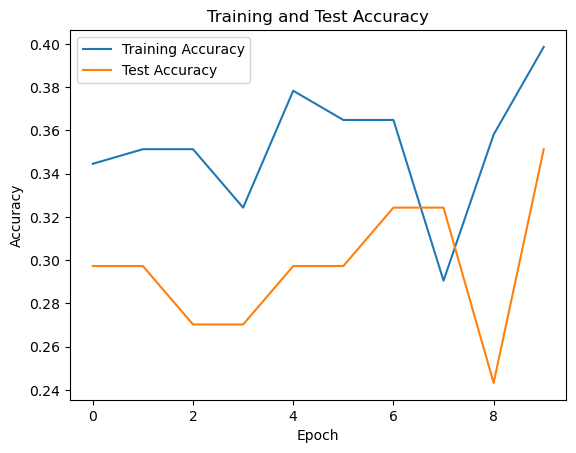

In [15]:
# Create a Tokenizer object
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  
import matplotlib.pyplot as plt

tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#epochs=10, batch_size=20

Epoch 1/10
8/8 [==============================] - 38s 5s/step - loss: 1.1017 - accuracy: 0.3311 - val_loss: 1.1033 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 40s 5s/step - loss: 1.1002 - accuracy: 0.3446 - val_loss: 1.1040 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 40s 5s/step - loss: 1.0979 - accuracy: 0.3446 - val_loss: 1.1014 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 40s 5s/step - loss: 1.0984 - accuracy: 0.3514 - val_loss: 1.1008 - val_accuracy: 0.2973
Epoch 5/10
8/8 [==============================] - 41s 5s/step - loss: 1.0979 - accuracy: 0.3514 - val_loss: 1.1011 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 41s 5s/step - loss: 1.0979 - accuracy: 0.3581 - val_loss: 1.1041 - val_accuracy: 0.2973
Epoch 7/10
8/8 [==============================] - 41s 5s/step - loss: 1.0975 - accuracy: 0.3514 - val_loss: 1.1072 - val_accuracy: 0.2973
Epoch 8/10
8/8 [==================

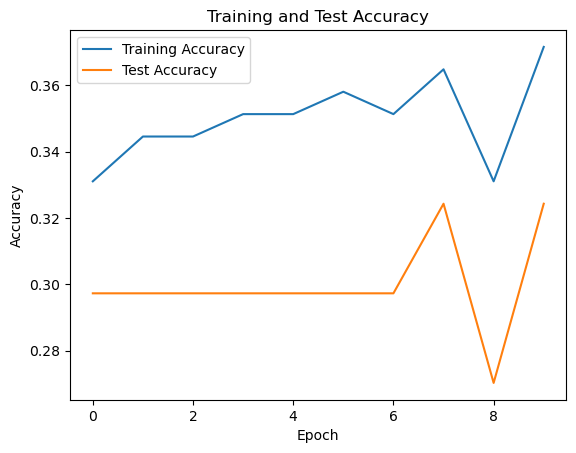

In [16]:
# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#LSTM(units=128), embedding_dim=100

In [ ]:
#epochs=10, batch_size=10

Epoch 1/10
15/15 [==============================] - 70s 5s/step - loss: 1.1029 - accuracy: 0.3311 - val_loss: 1.1085 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 74s 5s/step - loss: 1.1012 - accuracy: 0.3041 - val_loss: 1.0988 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 74s 5s/step - loss: 1.0986 - accuracy: 0.3378 - val_loss: 1.1030 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 73s 5s/step - loss: 1.0983 - accuracy: 0.3581 - val_loss: 1.1076 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 70s 5s/step - loss: 1.0989 - accuracy: 0.2635 - val_loss: 1.1043 - val_accuracy: 0.2162
Epoch 6/10
15/15 [==============================] - 74s 5s/step - loss: 1.0977 - accuracy: 0.4122 - val_loss: 1.0992 - val_accuracy: 0.3243
Epoch 7/10
15/15 [==============================] - 73s 5s/step - loss: 1.0964 - accuracy: 0.3649 - val_loss: 1.0980 - val_accuracy: 0.4054
Epoch 8/10
15/15 [==

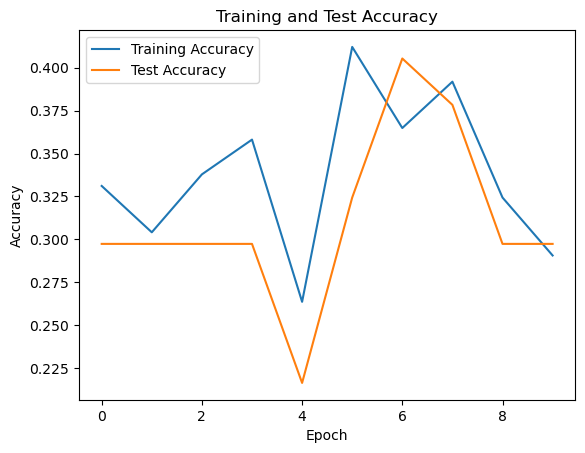

In [17]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#epochs=10, batch_size=20

Epoch 1/10
8/8 [==============================] - 45s 5s/step - loss: 1.1042 - accuracy: 0.3041 - val_loss: 1.1005 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 43s 5s/step - loss: 1.1028 - accuracy: 0.3311 - val_loss: 1.1081 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 44s 6s/step - loss: 1.0987 - accuracy: 0.3514 - val_loss: 1.1019 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 43s 5s/step - loss: 1.0983 - accuracy: 0.3514 - val_loss: 1.1006 - val_accuracy: 0.2973
Epoch 5/10
8/8 [==============================] - 43s 5s/step - loss: 1.0988 - accuracy: 0.3514 - val_loss: 1.0988 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 43s 5s/step - loss: 1.0973 - accuracy: 0.3514 - val_loss: 1.1022 - val_accuracy: 0.2973
Epoch 7/10
8/8 [==============================] - 43s 5s/step - loss: 1.0981 - accuracy: 0.3514 - val_loss: 1.1035 - val_accuracy: 0.2973
Epoch 8/10
8/8 [==================

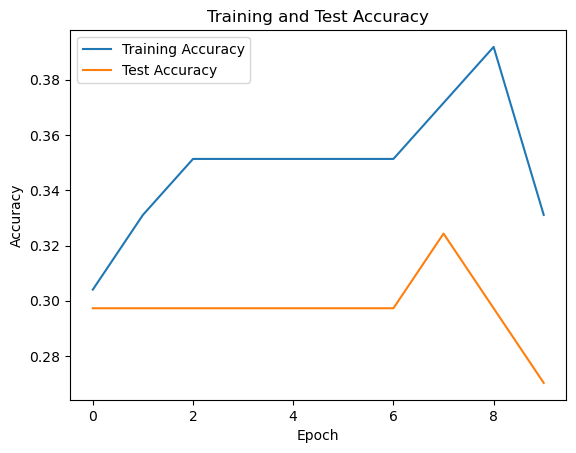

In [18]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [13]:
# Substitute word by contextual word embeddings (BERT, DistilBERT, RoBERTA or XLNet)
aug = naw.ContextualWordEmbsAug(
    # Other models include 'distilbert-base-uncased', 'roberta-base', etc.
    model_path='roberta-base', 
    # You can also choose "insert"
    action="substitute"
)

augmented_texts = []
for t in texts:
    augmented_text = aug.augment(t)
    augmented_texts.append(augmented_text)
    print("Original:")
    print(t)
    print("Augmented Text:")
    print(augmented_text)

Original:
feeling upset ’ know might underlying cause hormonal change past trauma depression stress find feeling low cry without obvious reason might wonder ’ going often nothing worry — might feeling extra sensitive today case may cause ’ thought yet feeling sad natural part life fact sadness benefit like helping u process difficult event connect others ’ always make easier moment however feel today know ’ alone many way find joy people feel sad lot reason — ’ also possible feel sad reason think sometimes seemingly small disappointment affect think leaving upset long afterward might connect current sadness happened feeling lonely experiencing rejection relationship issue major lasting effect feel even lack sleep feeling hungry put sour mood day case might deeper cause factor like depression trauma grief hormonal change affect mood without conscious awareness year yet may affect emotion every day consider setting time aside sit emotion work ’ causing may find answer ’ ok — sometimes fi

Original:
sadness natural emotion everyone experience various time life feeling sad reason may related hormonal change lack sleep stress factor sadness affect people different way people may want cry spend time alone comfort-related activity feel happier occasional sadness normal however feeling sad week sadness affecting everyday functioning may indicate serious underlying cause depression article explores person may feel sad apparent reason tip feeling happier speak doctor feeling sad fluctuation hormone significantly affect person ’ mood sometimes lead unexplained sadness hormonal change menstrual cycle including fluctuation estrogen progesterone affect someone ’ mood month premenstrual syndrome pm common make person feel sad start menstruation according office woman ’ health feeling sadness known baby blue typically last day birth occur due hormonal fluctuation coupled new challenge however sadness persists longer week person may postpartum depression depression pregnancy affect pe

Original:
feeling sad time specific reason ’ always mean depression suggest could experiencing something complex sadness alone sadness temporary state often clear cause like big disappointment loss someone close bad news someone love type sadness fluctuate throughout day certain moment emotional burden might feel particularly heavy might cry often feel numb drained struggle concentrate time — get lost something enjoy loved one distracts — sorrow may seem light enough barely feel weight might linger form day week generally begin ease naturally persistent sadness something else entirely wrap around like heavy blanket muffling sensation joy everyday life sadness leave feeling low empty defeated ’ know caused unhappiness idea start feeling better feeling sad ’ unusual sorrow normal human response disappointment loss sadness ’ clear reason behind ’ seem improve however may suggest something else going everyone depression feel sad unexplainable sadness ’ seem shake one primary sign depressio

Original:
day feel sometimes feeling sad happen apparent reason occasionally sadness natural time ’ perhaps symptom depression good news plenty useful tool available people living unexplained sadness one psychologist dr jessica valentine explains possible reason behind feeling sad make feel better normal feel low understand coming sometimes memory deep rooted childhood painful situation might blocked people feel low various reason know feel low wintertime ’ enough sun manage diet exercise meditation travelling feeling low loss breakup ‘ reason ’ normal work psychologist like piece information together find ‘ triggering ’ feel way often people feel low happy life feel like life mundane help restore balance life using simple technique sudden low mood sadness sign depression various type depression someone could feeling melancholy feeling low without knowing side spectrum someone could symptom severe depression could result trauma one 's life client feeling low vitamin deficiency often an

Original:
everyone feel sad sometimes like everyone feel joyful angry proud plenty emotion word everyone feeling feeling always changing sometimes feel happy ’ fun sometimes feel sad lose loved one whatever feeling real part living negative emotion may even help world focus happiness treat unhappiness unnecessary useless feeling sadness slow make really think life feeling people around help keep sight relationship dream word sad ’ mean coping situation rather help come term situation move important emotion help adapt accept focus persevere grow ’ good news learn manage sadness use different word talk sadness agony anguish broken heart hurt sorrow dejection dismay homesickness distress unhappiness emotion occur response negative unexpected situation life change sadness often occurs time feeling anger stress guilt grief anxiety hopelessness sometimes feeling may strong ’ realise sad sadness feel like may change feel physically perhaps stomach ache headache ’ sleep sadness may also change

Original:
boise state university boise state university boise state university boise state university alert successfully added sent notified whenever record chosen cited manage alert preference click button please log account depression common mental illness u.s. adult experienced major depressive episode unfortunately depression extends teen young user well researcher observed increasing rate recent year adolescent young adult especially among girl woman people barrier fight disease tend hide symptom receive treatment however protected anonymity share sentiment web looking help paper address problem detecting depressed user online forum analyze user behavior reachout.com online forum platform providing supportive environment young people discus everyday issue including depression examine linguistic style user post combination network-based feature modeling user connect forum result show network feature strong predictor depressed user combining user post linguistic feature achieve aver

Original:
everyone experienced sadness everyone experienced depression fact ’ never depressed chance ’ real grasp living complex mental illness like depression insidious affect mood also ability feel think function blunts sensation pleasure close connectedness stifle creativity worst shuts hope also often cause deep emotional pain person experiencing person ’ close family friend sadness alone ’ good gauge depression according american psychiatric association ’ apa current diagnostic statistical manual mental disorder dsm-5 diagnostic guide used mental health professional ’ experienced least five following symptom day nearly every day least two week may diagnosed major depressive disorder mdd also known clinical depression one know sure people become depressed others depression occur spontaneously without obvious cause ’ well documented ’ one depressive episode risk another later life increase psychiatrist today generally look depression “ bio-psycho-social ” term meaning see complex di

Original:
learn symptom different mental health condition tackle feel sad sadness difficult emotion deal result loss helplessness disappointment among many thing sadness one common natural human emotion however sometimes possible sadness deepen may sign suffering form depression feel though increasingly sad feel like sadness difficult explain information depression may help interested learning also check practical self-paced online program teach step-by-step strategy tackling symptom depression normal experience feeling sadness despair response life event loss major life change stress disappointment case sad feeling resolve come term change life situation loss feeling may persist month return significant time birthday anniversary related lost loved one however time enjoy thing sadness sign depression depression disorder characterised excessive sadness loss interest enjoyable thing low motivation depression common one three people experience episode major depression stage life case depr

Original:
many lifestyle change help ease burden living depression strategy work one person may right another trial error typical depression severe life-altering affecting quality life happiness live ’ also common condition affect people united state every year common technique may help managing symptom depression someone know crisis considering suicide self-harm please seek support ’ calling behalf someone else stay help arrives may remove weapon substance cause harm safely household stay phone help arrives exercising regularly one best thing mental health exercise help treatment prevention depression several key way type physical exercise help treat depression moving regularly help get benefit get exercise learn exercise depression brain research shown spending time social medium worsen feeling depression low self-esteem social medium addicting many people ’ necessity order stay connected family friend even coworkers even cutting completely ’ realistic lifestyle limiting social mediu

Original:
back depression adult key step take lift mood help recovery depression 's important take antidepressant prescribed even start feel better stop taking soon depression could return stopping suddenly also increase risk withdrawal side effect talk doctor pharmacist question concern medicine 're taking leaflet come medicine information possible interaction medicine supplement check doctor first plan take over-the-counter remedy painkiller nutritional supplement sometimes interfere antidepressant exercise healthy diet make significant difference quickly recover depression improve general health well healthy diet help lift mood fact eating healthily seems important maintaining mental health preventing physical health problem physically active lift mood reduce stress anxiety encourage release endorphin body 's feel-good chemical improve self-esteem exercising may also good distraction negative thought improve social interaction read exercise depression easy rush life without stopping

Original:
may particularly enjoy feeling sad may prefer experiencing emotion try avoid emotion together mental health professional want know people tend think sadness always bad say meaghan barlow phd assistant professor department psychology wilfrid laurier university waterloo ontario study self-regulation emotion aging “ 's absolutely view. ” distinct depression — world health organization note leading cause disability worldwide — sadness common emotion dr. barlow say right context sadness even helpful growing body research support point view barlow expert explain sadness impact well-being cope feel like much sadness “ emotional state unhappiness ranging intensity mild extreme usually aroused loss something highly valued ” according american psychological association apa sadness anger feel unpleasant distressing researcher sometimes lump two together umbrella “ negative affect. ” category also includes shame guilt anxiety fear irritability according research sadness anger distinct em

Original:
depression one common mood disorder united state cause persistent sadness limit person ’ ability go daily activity however depression treatable people recover lifestyle change medical treatment help individual feel better typically managing depression ongoing process article list strategy treatment help fight depression person know depression empowered find treatment work helpful learn depression general including cause symptom also important people get know symptom warning sign feeling worse identify knowing prompt depressive episode help people avoid manage trigger may reduce future depressive episode educating friend family member also help loved one watch warning sign supportive person difficult time reaching loved one help people get difficult time simply talking happening help also connecting others help reduce feeling loneliness isolation feel possible talk friend family member people may wish join support group see therapist keeping journal powerful strategy fighting 

Original:
eggshell therapy coaching eggshell therapy coaching table content feeling empty emotionally numb result emotional detachment syndrome known depersonalization feeling empty numb essence experience feeling disconnected surreal unable identify emotion emotionally numb also feeling empty detached outside observer life see life without living may also feel losing control thought action ever ask question feel empty like ’ even exist feel nothing feel emotionally numb happy upset feel detached loved one family friend look mirror feel like seeing someone else feel like robot running auto-pilot feel hollow little joy ups down life surreal feeling go day-to-day identify might struggling form dissociation known depersonalization feeling empty emotionally numb hollow prevalent emotion-phobic modern society- yet also one underestimated unaccounted condition “ louise often feel like part “ acting. ” time “ another part ‘ inside ’ connecting talking ” say depersonalization intense feel like

Original:
emotional numbness emotional blunting refers limited emotional response internal external event may symptom medical condition side effect medication emotional numbness create sense emptiness isolation disconnect rest world may notice people react event different way may difficult understand ’ feel way everyone experience emotional numbness way general may feel limited come emotional experience may muted response event used react may experience emotion yet outward expression may situation typically call sadness joy may feel either may make relating others challenging sign emotional numbness may include emotional numbness sometimes called emotional blunting difficult imagine experienced people describe feeling empty discouraged others report feeling isolated “ often feel invisible like ’ ghost watch family engaging feel like ’ invisible barrier keep joining ” describes amy h. experienced emotional numbness symptom depression “ ’ like submarine drifting undetected picking people

Original:
feeling emptiness ’ right chest yet ’ unsure came sadness melancholy boredom may little everything feeling way uncommon might call “ feeling empty ” someone else might call something different matter ’ real valid although overwhelming managed uncovering ’ lying underneath emptiness feeling might straightforward process ’ possible recommended first step toward resolution feeling emptiness might last day resolve time might linger two week longer case learning recognize cognitive distortion seeking support mental health professional help feeling empty sometimes manifest sense loneliness confusion life goal lack motivation pursue anything life everyone might feel void heart time time experience could many cause including shifting hormonal level losing job required physical distancing come pandemic life stage situation may require reflect life might also lead temporary feeling emptiness although every case feeling empty could also signify mental health condition depression bipolar

Original:
include product think useful reader buy link page may earn small commission ’ process psych central show brand product stand behind ’ hard describe feeling numb like ’ intuitively know ’ felt know ’ alone many people report feeling disconnected world around sometimes feeling “ flat ” feeling like life autopilot perhaps event people seem muted le colorful somehow also described chronically running empty feeling ungrounded hard time focusing losing track time throughout day feeling numb make hard connect others creates loneliness sense isolation experience emotional numbness also called “ affective blunting ” commonly associated depression also occur mental health condition medication linked state like dissociation depersonalization — feeling disconnected emotion surroundings good news emotional numbness usually temporary treatable article walk cause treatment self-help strategy additional resource ’ one answer question expert pretty good theory emotional numbness occur limbic 

Original:
young adult mental health substance abuse treatment center need help peruse frequently asked question today mark first day get started path healing work major insurance company optimize access care verify insurance discover make u different personalized treatment led expert field focus sustainable healing put young adult pathway success referring professional partner u providing sustainable healing male location offer wide range amenity experiential therapy self-discovery healing private serene home-like environment support young woman achieve long-term recovery based compassion founded clinical excellence integrated approach healing unparalleled featured many respected press outlet proud share expertise success story newport institute assembled best mental health leader rehab team country might seen phrase “ feeling emotionally numb ” list common symptom various mental health disorder really mean feeling numb inside different every individual general people describe feeling 

Original:
login login phrase `` dead inside '' popular across internet meme joke popular medium created around phrase `` dead inside '' collectively cry laugh concept feeling empty inside underneath humor 's actually going word `` empty '' may imply feeling nothingness however go beyond lack feeling study1 people bipolar disorder dealing feeling `` chronic emptiness '' found largely experienced `` feeling disconnection self others sense numbness nothingness frequent reduced functional capacity '' researcher also found feeling emptiness closely associated feeling purposelessness unfulfillment people study found feeling `` distressing '' impact daily life mental health professional concerned although 's common feel empty time time pleasant experience negatively affect live life may cause concern feeling emptiness paired lack motivation enthusiasm life persistent across many part life possible root cause feeling emptiness recent experience trauma lead feeling emptiness according steph tua

Original:
“ way react circumstance determines feelings. ” ~dale carnegie ’ felt like ’ drowning mud feel stuck worthless confused want move ’ evolves anxiety fear overwhelm if—just if—being stuck ’ problem perceive every year period feel “ stuck. ” yet look closer see “ stuck ” label give natural part life ’ time much happens anxiety come think otherwise start force work come idea make thing happen ’ get anywhere call stuck stuck except way perceive life write ’ stuck period last month difference struggle le ’ beginning let get stuck think something ’ think life different know ’ trying force something word like ” ” ” ” ” must ” enter mind relax surrender quiet period life thing seem okay see ’ control life notice life brings stuck like quicksand try get deeper sink mind want push control manipulate stem insecurity want secure loved remarkable think could control life would well ’ face reality thing begin lift three thing ’ stuck surrender stuck notice thought feeling within say ’ stuck

Original:
behavioral health primary care feel sad sometimes sadness normal emotion make life interesting sadness almost always accompanies loss say goodbye loved one usually feel sad sadness even deeper close relationship ended loved one died sadness also help u appreciate happiness mood eventually change sadness toward happiness sense contrast add enjoyment mood way experience normal sadness healthy way allow emotion enrich life great river 2-1-1 offer free confidential community information referral crisis hotline hours/day dial 362-8255 talk information referral specialist fri mar fri mar tue jan tue dec south ave. la crosse wi 782-7300
Augmented Text:
['behavioral issues primary care feel emotions sometimes sadness normal emotion make life interesting sadness almost always accompanies loss say goodbye loved ones usually feel sad sadness even deeper close relationship ended loved one died sadness also help u appreciate happiness mood eventually change sadness toward happiness sense 

Original:
close ’ normal get blue every ’ always easy separate sadness clinical depression learn warning sign get support need everyone sad day feeling time time part life giant storm cloud overhead ’ move could sign something serious ’ talking depression ’ mental health problem negatively affect way feel think act.1 depression make hard care put physical health risk good news depression treatable tough know people depression may wide range symptom symptom mimic everyday feeling think irritability lack energy worry ’ tell sadness could actually depression find help need work 1-on-1 virtual coach therapist ableto ’ tackle sadness first ’ emotional state unhappiness.2 feeling sadness slight intense last longer period death loved one depression sadness ’ mental health problem ’ always go away lingering sadness often symptom depression ’ certainly one depression make feel worthless.3 may even physical symptom body aches.1 cause depression also much complex stressful life event may spark de

Original:
science organization insight hard tell sad truth depression sometimes confuse two even though substantial difference ’ find underlies concept easily separate sadness depression sadness sad something hour time negative experience mood change week time get little better depression area life affected show combination depressive symptom day least two week causing general distress sadness basic emotion part make u human – everyone know feel like experiencing sadness might even helpful working difficult experience life rejection breakup disappointment depression hand mental illness mean show many different depressive symptom least two week thing brought joy cheered ’ help anymore feel constantly exhausted loss motivation persisting sadness one part depression likely thought behavior even physical experience changed alongside emotion causing general distress fundamental change perception attitude towards life emotion momentary conscious experience fade time emotion continues phase l

Original:
million people around world experience sadness depression point life feeling sad integral part depression anxiety depression association america adaa note depression one common mental health illness united state knowing understanding difference sadness depression help person recognize seek treatment article help reader make distinction suggest treatment option depression defining sadness depression important improving wellbeing sadness normal human emotion every single person experience stressful somber time number life event leave people feeling sad unhappy loss absence loved one divorce loss job income financial trouble issue home affect mood negative way failing exam getting job experiencing disappointing event also trigger sadness however person experiencing sadness usually find relief cry venting talking frustration often sadness link specific trigger sadness usually pass time pas person becomes unable resume normal function could sign depression low mood get worse last 

Original:
hilary jacob hendel lcsw thought going funeral used terrify walking room filled sadness grief evoked intense desire go anxiety could feel masked emotion wanted like sadness compassion secretly felt ashamed ’ “ right feeling '' death bothered presence sadness grief sadness make anxious turn vibrating heart-pounding emotional mess uncomfortable skin later came understand felt pressure fix sadness say right thing thought supposed cheer person suffering though problem solved eventually figured could fix someone ’ sadness yet visceral pressure fix ’ go away neither anxiety sadness core emotion evoked experience loss core emotion arises need validation flow push emotion energy hold get blocked blocked emotion hurt u blocked emotion put stress mind body eventually causing symptom like depression anxiety rumination high blood pressure stomach problem let emotion flow need feel safe enough experience learning expect experiencing emotion help make experience manageable le scary even le

Original:
global pandemic life stressor coronavirus pandemic caused array negativity perhaps one biggest collective underlying feeling grief cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy people sad state world losing loved one restriction mask rule ’ grieving old sense normal long lost routine change year brought considered ’ wonder global pandemic perfect storm situational depression unlike clinical depression type sadness often triggered traumatic stressful event change life behavioral health therapist jane pernotto ehrman med rches acht discus situational depression treat might already experienced episode situational depression past without even knowing trigger include “ many people experiencing situational depression right covid-19 without even realizing ’ actually happening ” say ehrman “ might asking ‘ feel sad angry ’ ‘ exhausted time ’ maybe ’ hard time focusing work school. ” depres

Original:
expert provide tip help ease past short-term melancholy editor handpick product feature may earn commission link page come nowhere rhyme reason follow crushing breakup loss someone special particularly tough time slowly roll turning pit hit suddenly without warning whatever form come sadness something experience—and yet still incredibly difficult get past 's thing learn stop sad tried-and-true method require dig deep way beat blue incredibly simple—spending time outside watching show 's practically guaranteed make laugh yes cry eye spending day couch pint chunky monkey one hand favorite glass red scientifically-proven technique letting go sadness unfortunately one thing note 're still feeling upset period two week notice symptoms—like loss energy trouble concentrating difficulty sleeping—you reach professional help ahead psychologist mental health expert share top tip stop feeling sad regardless 's triggering something negative happens life seem like world ending instead supp

Original:
everyone experience bad day depression day seem particularly challenging ’ permanent symptom depression take many form may manifest different way different time living depression experiencing sadness may also experience debilitating sense loneliness emptiness hopelessness future day may feel depression symptom intensify difficult go usual routine developing specific coping skill help go bad day depression even feel darkest world health organization report nearly adult globally million people worldwide live depression united state number hovers around according national institute mental health bad day ’ sign depression live depression bad day mean symptom intensify impact routine usual ’ natural feel discouraged disheartened happens may feel like ’ taking step backward nothing work depression untreated depression could one reason may feel symptom intensifying ’ treating depression factor contribute bad day example antidepressant may stopped working ’ living symptom condition c

Original:
`` simplify life '' 're asking question n't sure start next take quiz find bemorewithless simplify life declutter mind connect heart author courtney carver love sitting still le finding way le ’ practicing year sometimes forget slowing take work practice ’ recently recognized sometimes essential occasionally busyness well deserved distraction especially really sad get like everyone else ’ rare really sad ’ need much happy expressing gratitude make happy usually feeling joyful week little different daughter leaving today australia year ’ happy excited big adventure already missing visiting know touch often love close time spend together ’ preparing still feel sad mention might gone year guinness 8-year-old pup aggressive form bone cancer last thursday took vet thought pulled muscle tendon got really bad news family working shocking news trying keep pain managed thoughtfully considering treatment option none easy good outcome said nothing ’ dog came life within week diagnosed m

Original:
“ secret joy mastery pain. ” anais nin eighteen got depressed stayed depressed little year year every single day battle year every single day felt heavy pointless since made tremendous progress becoming self-aware practicing self-love noticing infinite blessing possibility life still day familiar old feeling sneak ’ always self-aware ’ always love sometimes agonize everything ’ ’ accomplished call day “ zombie days. ” ’ completely shut desperately look way distract feeling suspect zombie day time time think ’ important give permission always happy also simple way improve mood ’ feeling everybody different everybody different way dealing pain ’ looking suggestion may find helpful 1. step back self-reflect whenever start feeling depressed try stop reflect get root feeling 2. reach someone used bottle feeling fear would judged talked ’ since learned reaching loving understanding person one best thing 3. listen music music heal put better mood make feel le alone take mental journ

Original:
“ rock bottom became solid foundation rebuilt life. ” ~j.k rowling ’ stranger feeling hopeless defeated many failed relationship physical sexual emotional abuse entire life two bankruptcy recent loss online business october could say ’ enough last two lifetime ’ admit many time wanted end many day ’ know much could handle recent loss devastated beyond word everything ’ worked hard last three year completely obliterated ’ numb feel defeated almost every day fifty-eight year old starting ’ interest choice know expect ’ ’ ugly messy frustrating stressful exhausting every day wake ’ really feel like getting computer work ’ really feel like anything honest lay bed cry go serious wave anxiety throughout day hit fast hard without warning want throw want curl ball die want someone tell bad dream tomorrow thing back normal none happens force get work start new day pain pain chaos chaos matter look like never let anyone tell feeling ridiculous ’ ever think ’ overreacting feeling real n

Original:
person may experience “ feeling blue ” emotion sadness feel although possible feel blue apparent cause usually happens reason people blue might feel unhappy tearful lack energy motivation isolate although feeling blue may drain individual usual optimism enthusiasm happiness temporary typically interfere daily activity article discus mean feel blue sign look also examines difference feeling blue depression overcome blue get help feeling blue idiom describes experience sadness melancholy poetic succinct way communicate feeling occasional sadness typical person feel response daily experience face difficult circumstance mood reflect people usually identify cause sadness feeling blue determine trigger helpful think recent life change difficulty contributing low mood main symptom feeling blue include sadness lack motivation wanting spend time alone symptom generally mild pas relatively quickly people may blue many reason following person identifies cause sadness take step work impr

Original:
target circle week shop expert-approved deal section show follow today brand nineteen million american adult suffer clinical depression staggering figure everyone sad sometime life tell difference clinical depression feeling sad u worry feeling sadness anxiety mean something wrong need go medication others may clinically depressed feel ride let thing get resolved time seek professional help eighty percent people screened positively depression treatment time percent never treatment lot myth strong enough could fight depression sheer fact percent people believe depression personal weakness absolutely correct depression caused combination biological psychological social factor also highly treatable make especially distressing many people never seek treatment depression depression grief feeling upset mourning loss completely appropriate even important processing loss feeling sadness divorce losing someone close losing job move normal require treatment wise talk others find suppor

Original:
feeling bit blue lately might call gloominess dump could briefly feel little clear reason often trace sadness come blue mood specific circumstance so-called blue might feel sad tearful want spend time lack usual energy motivation feeling usually tend pretty mild though generally pas long temporary blue might sap usual cheer generally ’ keep typical daily routine totally ’ necessarily bad thing ’ common view unhappiness sadness negative thing emotion significance even unwanted one low mood may feel good ’ true occasional sadness much normal part life though feeling emotion change response day-to-day experience ’ tough time ’ probably notice mood reflects challenge ’ facing feeling blue alert fact something ’ quite right life help take step identify cause low mood make change could help feel better short ’ unusual feel little time time particularly facing loss difficult situation ’ immediately identify cause might help take closer look recent change problem life — even period b

Original:
feeling blue something go rather cycling downwards negativity spiral let ’ correct course action help fight blue good article ’ share thing ’ feeling blue suggestion list tested someone experienced blue lot life ’ likely find trying one even suggestion list end changing mood pretty quickly let ’ fight blue tactic time believe taking shower therapeutic healthy way combat feeling blue often ’ experiencing bit depression self care routine go window however cleansing body washing hair refresh many people history talked healing power water help wash away sadness day ’ feeling bit groggier usual try washing lavender soap shampoo known helping people depressive even anxiety driven state check article feeling anxious number one cause feeling blue thought thought powerful enough make cry even nothing bad happening best way overcome feeling blue learning overpower mind regular meditation practice thought control mean left brain overactive minimize practice meditation build right brain 

Original:
written published updated point u experience feeling blue many stressor life ’ completely normal feel also moment may experience dump without clear reason time feeling pas even ’ feel like moment sometimes ’ easy get trapped cycle negativity find spending substantial amount time enveloped sadness sadness normal emotion feeling sadness persistent may depressed ’ important differentiate feeling blue depressed explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist feeling blue little mean feel sadness ’ common experience range emotion go different thing life time though people feeling bounce back also blue usually mild compared depressed hand sadness excessive interferes daily life may experiencing depression clinical depression also referred major depression medical condition usual ups down life symptom depression include time 

Original:
chance day feel dump might feel sad tearful sensitive maybe feel discouraged groggy sluggish perhaps find wanting spend time alone might know ’ causing might clueless brought feeling either way ’ feel like luckily thing combat day saying “ feel blue. ” might feel good blue normal everyone feel time time even ’ know many people use feeling blue depression interchangeably ’ important know difference feeling blue meaning characterized sadness gloominess feeling typically last hour day easier shake might lack typical level energy motivation ’ likely able go daily activity feeling blue depression however last much longer –usually month even years– includes symptom sadness might experience significant change weight lack energy difficulty concentrating loss interest daily activity insomnia feeling helplessness hopelessness guilt believe experiencing depression consider contacting doctor mental health professional get appropriate treatment cause feeling may apparent identifying trigg

Original:
sign sign sign sign pradeep bhatt follow mind -- listen share feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control centre feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate 

Original:
explore wonder mind feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control center feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate chemical process brain serotonin dopamine 

Original:
home » general health post » feeling blue ’ know ever felt blue christmas ’ talking color blue idiom mean feeling sad gloomy normal ups down problem every year feel like seasonal allergy instead stuffy runny nose suddenly feel depressed ’ like everything happens make sensitive ’ period happens man woman ’ always hormone ’ always feel heavily depressed like gloominess feeling bit sadness natural emotion tell ’ something wrong ’ seasonal blue symptom starting bother article ’ covering everything need know feeling sad ’ giving list tip cope common problem list warning sign may need professional help mental health complex unnoticeable stimulus sometimes trigger emotion smell take back childhood year lost pet ’ notice neuron connection happen right sadness suddenly triggered unconscious mind even obscure difficult understand plain sight may reason sadness rooted personal history difficult trace heal u type unconscious trigger ’ alone thus feeling blue apparent reason feel immediat

Original:
jump content in-person care minor illness in-person care moderate illness injury virtual care walk-in care clinician ongoing care wellness everyone resource vaccination booster get personalized coordinated care across northern california sutter network make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research education lead better healthcare outcome join robust training program led nationally known healthcare leader explore way provide innovative compassionate care network shape future healthcare build career within diverse team get personalized coordinated care across northern california sutter network make appointment message doctor patient portal make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research educat

Original:
danielle bernock feeling blue happens u due seasonal affective disorder recent disappointment coming emotional high ’ negative emotion blue intoxicating make hard feel better want remind you—you feel better know way feeling better start with—wanting although deciding want feel better ’ enough ’ start choice superpower ’ decided want happier ’ show way know help stop feeling blue may need one whatever – something want ’ blue make worse read way find something sound good something ’ enjoy ’ feeling blue ’ busy fun whether suffer seasonal affective disorder winter le sunlight summer body notice brighten surroundings turn light get lightbox light therapy study show even minute day simulate antidepressant sun come open blind let sit window look smile change surroundings stop feeling blue read see first choice reveal true personality many people like take vacation winter everyone go ’ know might type google “ place visit _______ ” town area may come ton option pick one stop feeling

Original:
sign sign sign sign viemina follow -- listen share feeling blue idiom mean feeling sad melancholy downcast often used describe temporary mood sadness feeling emotionally low word “ blue ” context represents color associated sadness downhearted feeling people might say “ feeling blue ” ’ experiencing sense unhappiness loneliness emotional distress ’ common way express mood without going specific detail might causing sadness feeling blue inherent element human experience ’ moment heart speak u quiet subtle language temporary symphony sadness whisper thought feeling reminding u even amidst life ’ vibrant color time emotional canvas painted shade blue unpleasant emotion common part life every individual person experience point another feeling blue normal abnormal ’ important remember low mood serve purpose usually indicates something wrong understanding reason behind low mood take step towards making positive change ’ impossible always happy ’ important make effort cheer ’ feelin

Original:
learning warning sign help push back episode depression ’ experienced depression know feeling helplessness hopelessness creep thought episode begin sensation depressed come certain familiarity cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy knowledge power use advantage “ ’ necessarily stop cure depression reduce severity episode using effective readily identifiable coping tool ” say psychologist adam borland psyd seven way push back depression feel coming early signal feeling depressed sleep pattern change suddenly start eating le become irritable withdraw family friend learning sign depression offer chance act early head episode “ take proactive step stop depression advancing ” say dr. borland many people begin isolate start feeling depressed fight urge withdraw ’ almost guaranteed make feel worse reach trusted family member friend coworkers clergy talk ’ feeling ’ seeing therapist

Original:
“ sorrow come all… perfect reality possible except time realize ever feel better yet sure happy again. ” – abraham lincoln sorrow opposite happiness yet part human existence like life death changing season familiar enough recognize thing sequence sometimes sequence time birth rebirth creative force era failure negativity time however ’ clearly defined sense decay lack progress mistake ending key overcoming sorrow sadness remember get past time — even though ’ possibly see present adage say time heals wound includes wound pain sorrow might think feel like ’ experiencing broken heart perhaps break-up relationship death loved one distancing friend temporary emotional distress ’ last forever – unless become clinically depressed case need help medical professional psychiatrist prescribe medication ease depression begin psychotherapy assist better coping clinical depression telling someone – even – ’ get ’ really help situation ’ probably finding little comfort pouring heart friend

Original:
treatment service health equity u author staff writer make easy change counteract feeling depressed long stretch gray day get fair share back-to-back-to-back gloomy day midwest huh people lead seasonal affective disorder sad type depression affect people time year typically winter say ken yeager phd clinical director stress trauma resilience star program ohio state university wexner medical center note woman seasonal affective disorder common men young people higher risk condition starting often 20 `` people circadian rhythm biological clock driven serotonin melatonin level thrown course prolonged dreary weather ” yeager say quick lesson serotonin melatonin level serotonin chemical messenger body produce nervous system thought affect mood appetite body make hormone melatonin part help feel urge sleep wake low amount sunlight may trigger reduction serotonin affect mood yeager say gray day also wreak havoc body 's melatonin level making harder people get started dark morning la

Original:
thehealthfeed.com 's question medically reviewed madeline hubbard rn bsn ever feel weather get colder day get shorter ’ normal mood change slightly season mood change severe interfere daily life may health condition called seasonal affective disorder sad sad type depression ’ tied certain time year symptom usually start late fall last winter ’ also le common form happens late spring summer sometimes called “ summer sad. ” experience seasonal affective disorder ’ alone — affect around adult united state learn symptom cause treatment option sad many symptom seasonal affective disorder similar form depression difference sad symptom always begin certain time year go away season change symptom sad include summer sad different symptom example instead gaining weight oversleeping people summer sad may lose weight trouble sleeping sad also lead thought death suicide loved one show sign depression ’ important talk doctor mental health professional right away find symptom caused sad ano

Original:
purchase link site may earn affiliate commission ’ work ready feel truly happy content 's ... feel today would consider feeling content 're quite sure answer question 're alone whether 's finding long-lasting love career n't feel like work simply freeing time dedicate hobby feeling content area life something strive good news journey happiness made simpler tip trick 've done research got science-backed tip feel happy content help feel best want feel content happy contentment feel great 's actually good u content linked improved immune system physical function living longer mention feel good people around likely feel good often though feel like something missing life maybe dream job n't fulfilling hoped relationship believed would complete u n't n't feel like enough time day actually enjoy life thing control good news learn start feeling content happy contentness definitely possible usually take le work think read sign 're feeling content 're ticking go finding true happiness 

Original:
language one fondest memory six year old promise father mind ’ let slip away— “ make discover whole world. ” ’ know covering entire planet something to-do list handle age ’ somehow—maybe even simple manifestation—had privilege discover country year beautiful earth ’ road trip writing blog say feel liberated travel expands capacity wonder joy appreciation amazing diversity planet moment simply ‘ ’ allows u let go stress tension enjoy moment travel one guru many reasons—and ’ like share travelling help u feel like best self ’ willing receive world ’ many lesson matter shape size help u recognise shared humanity others dissipating fear misunderstanding ’ way fun love world afraid best alternative gaining knowledge book travelling according neuroscientist travel rewire brain new experience key building new neural pathway brain rewiring brain become creative accepting new idea travel make happy also take u comfort zone inspires u see taste try new thing constantly challenge u adap

Original:
share article ’ doubt mind travelling good morale going vacation keep smile face long departure ’ benefit – memory – gain travelling numerous reason travel make u happy least ’ assumption ’ like make discovering result study done cornell university 2017. according researcher spending money experience rather physical object make u happier reason “ adapt ” object mean happiness feel following purchase fade time get used experience hand continue bring u joy every time think according study booking.com reported marie claire traveller surveyed find first experience abroad boosted confidence amandine legrand psychologist blogger un sac sur le do belief travel good self-confidence offer many opportunity excel without external pressure pace travelling especially solo opportunity discover limit broaden horizon visiting new place allows u reconnect inner “ self ” really want without influence entourage let u explore world exploring ’ trying say inner journey important physical journey 

Original:
inspired tailor-made travel latin america africa asia australasia europe polar region travel good lot thing also increase mental well-being short-term whether 're traveling business one-week family holiday sold everything pursue life road traveling make happier person building self-confidence providing new experience memory breaking routine allowing meet people world keith jenkins founder luxury travel blog velvet escape prolific traveller said feel happy 'm gaining new experience insight challenging boundary travel perfect catalyst happiness allowed experience natural cultural man-made wonder world foreign land also continuously force step comfort zone great confidence-builder book travel best school 've learned much world importantly marilyn tam entrepreneur author happiness choice travelling emailed ask take happiness travel 'm travelling right yes indeed happy myanmar learning appreciating another culture tam worked minister home culture myanmar first prime minister bhuta

Original:
getting started written divethru team reviewed natalie asayag msw lcsw sun shining bird singing mood delightful feeling delightful simply best ’ talk feeling ’ want negative nellies hard find moment joy ’ lot stress ’ feeling happy overall ’ time recognize moment delight ‘ cause ’ underrated feeling delightful tie mental wellbeing wow great question ’ got answer let ’ dive thru feeling delightful show ’ linked mental health deeee-lightful word use often huh ’ kinda fancy everyday use sound like response ’ get 83-year-old british grandmother asking cup tea ’ delightful dear get idea mean feel delightful exactly dictionary.com defines delightful “ adj giving great pleasure delight highly pleasing. ” okay taking pleasure something make sense ’ hopefully felt emotion sooo many thing life make u feel delightful even little thing like getting massage stressful week feeling knot ache melt away ordering pizza ‘ cause ’ feel like cooking day ’ receiving super sweet card birthday crack

Original:
subscribe often get end busy week relish idea nothing weekend feeling satisfying saying 'oh nothing really colleague ask evening plan stressful day work new study david lloyd club finding per cent people asked would rather free weekend nothing one filled plan might ask 'why feel happy nothing answer could lie fact 're busy time survey revealed per cent people ’ remember last time switched per cent ’ know “ human ’ designed constantly busy brain functioning 24/7 ” caution julie leonard founder happiness club community busy life need antidote often feel happy nothing 's laziness 's necessity “ need time decompress process day thought emotion rest essential complete stress cycle reset back healthier level '' julie add psychotherapist founder luxe psychology practice jade thomas agrees adding `` resting nothing allows brain reset help u regulate emotion maintain ability focus might also notice enhances creativity help make better decision '' jade add busy often overwhelming stres

Original:
becoming minimalist le live written guest · comment note guest post jay harrington life whim long brutal winter feel great outside t-shirt even temperature ’ climbing much beyond fifty degree northern michigan community recently buried snow people force combing beach rock riding bike hiking trail cruising paddleboards celebrating spring ’ arrival addition short sleeve lot people wearing beaming smile face happiness air true despite fact weather ’ even great—it seems great relative ’ used come fall however long hot summer start longing cool crisp air even u first snowflake flying signal coming ski season cycle expectation adaptation repeat human always chasing rainbow want something—be different weather better job bigger house—but shortly getting want something different adapt circumstance become “ new normal ” want want happier life phenomenon called “ hedonic adaptation. ” ’ term coined psychologist brickman campbell 1970s explain tendency human being chase happier life retu

Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ version happiness little different path achieving habit create added stress ’ fit lifestyle ditch little time practice ’ figure ’ work following daily habit may help achieve happiness life tend smile ’ happy ’ actually two-way street smile ’ happy smiling cause brain release dopamine make u happier completely foolproof researcher found link smiling happiness could attributed “ facial feedback hypothesis ” facial expression may modest influence emotion mean go around fake smile plastered face time next time find feeling low crack smile see happens try starting morning smiling mirror exercise ’ body regular exercise help reduc

Original:
make intentional choice every day worry le live happier fulfilling life impact life trickle onto surrounding n't get caught much life forget enjoy thing truly matter would one thing without receiving paycheck rest life would question goal important exercise help determine quest purpose one step finding purpose look within identify talent passion find something world need passionate medical professional align strength need see problem solver making meaningful difference time currency life allowed enjoy limited period ’ easy get caught worrying future forget enjoy simple pleasure life ’ ’ travelling train deep thought mind constantly wandering contemplating thing need get done worrying unknown make anxious training mind present help appreciate time presently enjoy every moment human being highly social creature thrive human being company surrounding genuinely care numerous benefit person social connection help cope anxiety sadness enable emotionally intelligent increase self-es

Original:
copyright © entrepreneur medium llc right reserved entrepreneur® related mark registered trademark entrepreneur medium llc deep patel • jul share opinion expressed entrepreneur contributor 's unfortunate reason happiness often elusive -- brain simply n't wired way instead brain evolved survive protect keep u safe sure moment elation period contentment bliss many u plagued persistent negative emotion -- plain stuck `` blah '' find joy life like anything else take practice cultivate ongoing happiness sense reset baseline wo n't happen overnight top thing every day discover secret living happier life find long-term happiness need retrain brain negative mindset positive mindset try thing spend one two minute looking positive life three time day day brain start automatically choose positive mantra day -- something repeat `` today beautiful '' `` feel grateful '' thing go south take moment try see positive light never underestimate importance recognizing silver lining life related 

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
happiness ’ something aim along health wealth success endeavour however finding happiness everyday life difficult task much sought-after emotional state happiness appear briefly influenced many issue work life making difficult find guide calmer ’ founder tania diggory explores happiness find happiness within simple step try feel happier regular basis happiness mental state experiencing positive pleasant emotion experience many people define happiness feeling intense joy may make harder feel like ’ happy everyday life fact many level happiness starting sense contentment ranging exhilarating jubilation many u set quest reach exhilarating happiness high regular basis often end disappointment instead happiness try focusing contentment contentment mental state experiencing satisfaction present state often felt practicing mindfulness feeling comfortable mind body surroundings experience range emotion day helpful practice finding contentment regular basis next time take tea break si

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
happiness positive pleasant emotion ranging contentment intense joy moment happiness may triggered positive life experience thought sometimes may arise obvious cause level happiness longer period time strongly correlated level life satisfaction subjective well-being flourishing eudaimonia common usage word happy appraisal measure shorthand `` source '' happiness example `` find happiness life '' finding meaning life emotion precise definition happiness perennial debate philosophy `` happiness '' subject debate usage meaning possible difference understanding culture word mostly used relation two factor usage include factor subjective well-being swb b includes measure current experience emotion mood feeling life satisfaction c instance sonja lyubomirsky described happiness `` experience joy contentment positive well-being combined sense one 's life good meaningful worthwhile `` eudaimonia greek term variously translated happiness welfare flourishing blessedness xavier landes pr

Original:
stardust somehow came alive one know happened – one know created life yet – alive tiny speck dirt water floating endless space people including u mystery called life sacred fill u awe wonder site relax mystery present every moment site aware ’ obvious finding something ’ hidden lost ’ connecting ’ sacred experience belief faith experience life already sacred reverence enough – faith belief need even figure unless want short site replace word thought life direct experience life evaluate trust experience connecting directly sacredness increasing inner peace love fellowship goodness life “ altogether result neuroscience religion thus far suggest strongly religious instinct indeed exist … … surely exist way find spiritual fulfillment without surrender enslavement. ” edward o. wilson meaning human existence social conquest earth long ago ancestor created religion spirituality promised inner peace love fellowship goodness connection ’ sacred today people still want promise fulfille

Original:
implement simple tip find joy ’ perfectly normal feel though ’ joyful version moment life general might find wondering happy “ happiness absence negative emotion abundance positive one pursuing life meaning purpose living accordance value ” explains judy ho ph.d. clinical neuropsychologist manhattan beach ca “ inevitably come across high low emotionally lead deeper sense joy. ” happiness may look different everybody number change habit big small lead joyful path creating new habit routine difficult “ often simple lifestyle change profound influence mental health ” explains joshua hick ph.d. professor department psychological brain science texas university ’ ’ crafted list simple habit increase level joy fulfillment ahead find expert-backed tip help lead fuller content life know might find process might seem like happiness feed gratitude actually work way practicing gratitude “ lead people feeling positive emotion feeling increase motivation engage life make healthy choice ” e

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
becoming minimalist le live written joshua becker · comment last updated may happiness state mind specifically state “ well-being contentment. ” definition tricky assumption word cause confusion many ’ even realize learning happy something intentionally practiced people hear word ‘ happiness ’ assume speaking emotion pleasure joy people feel immediate reason people say “ ’ pursue happiness seek joy happiness fickle fading joy remains forever. ” short-term definition happiness everyone understands word define mean long-term satisfaction fact speak experiencing happiness life thinking short-term emotion think quality living—a much longer-term view word definition understood correct speak different reality really different ’ think long-term experience life satisfaction almost certainly made many short-term feeling joy pleasure mean every day great day trial temptation downturn certainly mean look back many season life look back satisfied navigated long-term feeling life satisfac

Original:
page last updated november 2023. want much good possible resource one real-life choice face 6,000 could option good challenging question – possibly compare saving life reducing poverty treating mental illness happier life institute believe ’ possible answer question comparing effect people ’ subjective wellbeing self-reports happiness life satisfaction ’ taking approach lead surprising result following section introduce key idea guiding principle define approach throughout ’ find many link growing list research report well academic literature draw begin general overview expanding idea greater depth think wellbeing people feel life i.e happy satisfied talk good u really mind improving people ’ wellbeing ‘ wellbeing ’ believe people ’ subjective wellbeing ultimately care health wealth ’ important matter improve subjective wellbeing even think happiness life satisfaction thing matter probably still care extent subjective wellbeing measured scientifically valid reliable way self-

Original:
greater good science center • magazine • action • education coming formal definition happiness tricky ’ know feel fact often use term describe range positive emotion including amusement joy pride contentment understand cause effect happiness researcher first need define term happiness interchangeable “ subjective well-being ” typically measured asking people satisfied feel life evaluative much positive negative emotion tend feel affective sense meaning purpose eudaimonic book happiness positive psychology researcher sonja lyubomirsky elaborates describing happiness “ experience joy contentment positive well-being combined sense one ’ life good meaningful worthwhile. ” however ’ important note social cultural factor also influence think happiness example study william tov others found people culture embrace collectivist ideal think happiness term harmony contentment individualistic-minded people connect feeling exuberance joy happiness level also shaped social group like famil

Original:
back tip support try tip help happier control able cope better life 's ups down lot stress life find way reduce learning time-management technique introduce regular exercise time positive change taking control time way effectively reduce stress feeling anxiety along stress breathing technique help try breathing exercise stress read managing stress building resilience mind website also try practical self-help cognitive behavioural therapy cbt technique every mind matter website help manage stress anxiety solve problem build resilience thing enjoy good emotional wellbeing simple activity like watching sport friend soak bath meeting friend coffee improve day something 're good cooking dancing good way enjoy sense achievement try avoid thing seem enjoyable time make feel worse afterwards drinking much alcohol eating junk food self-esteem way feel best way improve self-esteem treat 'd treat valued friend positive honest way notice 're putting thinking `` 're stupid getting job '' 

Original:
feeling like bouncing wall ’ ’ going inside body oh joy happy buoyant emotion great feeling whether ’ brought big life event like wedding birth something simple finding perfect fruit farmer ’ market emotional level may feel joy variety way — tearfully euphoric deep sense contentment scientific level feel joy neurotransmitter tiny chemical “ messenger ” cell transmit signal neuron nerve bodily cell neurotransmitter responsible process feeling almost every aspect body blood flow digestion feeling joyful way happiness run throughout body every emotion feel affected brain vice versa according diana samuel md assistant professor clinical psychiatry columbia university medical center “ brain single emotional center different emotion involve different structures. ” example explains frontal lobe commonly known “ control panel ” brain monitor emotional state thalamus information center regulates consciousness participates emotional response executed feel joy body release dopamine sero

Original:
could n't find page looking either return homepage clicking try searching content seeking clicking © levelhead course free sample coursesubscriptioncourse store levelhead everyday life contactblogaffiliateprivacy
Augmented Text:
['could u find page turn left return homepage if yes leaving text seeking clicking © levelhead course free sample download store levelhead live life instructions']
Original:
greater good science center • magazine • action • education cat love partner presented two lap cat choose almost every time morning kitten leif nurse shoulder little paw making biscuit jealous nope feel really happy seeing woman love adored cat love scientist name feeling borrowed buddhist ethic muditā sympathetic joy sometimes called appreciative joy empathic joy vicarious reward broadly positive empathy whatever name ’ unadulterated goodness feel something good happens someone else sound great time hard feel sympathetic joy yes especially ’ feeling personally threatened unhappy 

Original:
getting started written divethru team reviewed natalie asayag msw lcsw talk emotion seems like ’ usually negative one ’ bad thing ’ helpful work tough feeling let needed ya know talk feeling joyful good feeling really ‘ cause talking happy good feel severely underrated maybe talk le ’ wan na humble brag get habit fixer problem solver ’ always trying work way “ ” something usually stress anxiety whatever going life nobody ’ looking cure happiness… would ridiculous right ’ tell recognizing happiness super important talking joy feel let ’ dive thru feeling joyful embrace around happy emotion get technical mean feel joyful apa dictionary defines joy “ n feeling extreme gladness delight exaltation spirit arising sense well-being satisfaction. ” wow ’ quite definition ’ pretty spot ’ ya say feel happiness sense fulfillment satisfaction life look totally different everyone might experience happiness job pursuing education continuing learn personal relationship family friend romantic

Original:
surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started home » blog » happiness hugo reviewed fact-checked committed highest standard accuracy reliability content every statement made website meticulously fact-checked supported authoritative study read process published onjanuary key point everybody world experience unhappiness occasionally often others unhappy time ’ important realize always reason happy matter ’ happened thing happy goal post help realize always positive thing focus matter situation ’ magically make happiest person world could help keep maintain positive mental attitude time tough asked reader bigg

Original:
feeling happy generally important u ’ feel joy every time looking materialistic thing make u happy happiness ’ come getting job getting car buying house happiness last time happiness come within find happiness inside ’ balance kindness towards kindness towards others practicing happiness affirmation great way start training skill list affirmation discus ’ effective improving well-being subscribe keep reading get access full archive type email… subscribe continue reading
Augmented Text:
['feeling love generally important u ’ feel joy every time looking materialistic thing make u happy happiness ’ come getting job buying car buying holidays happiness last time happiness come within life happiness inside ’ balance kindness towards kindness towards others practicing happiness great great way start training doing list affirmation discus something effective improving well-being articles keep reading get access in archive get email… subscribe continue reading']
Original:
becoming mi

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
inspiration inbox use joy life motivational word wisdom help achieve motivational quote help lift mood find joy daily life also help prepare difficult moment encouraging handle situation find motivational quote resonate within write place ’ see often put near desk mirror anywhere else ’ sure see high low life inevitable ’ experience thing test others bring joy motivational word help feel happy either situation allowing embrace positivity find quiet place read quote taking deep breath otherwise read wherever help bring joy day motivational phrase help find peace enjoy day boost mood go daily routine encourage focus positivity – “ look others fulfillment never fulfilled happiness depends money never happy content rejoice way thing realize nothing lacking world belongs you. ” – lao tzu relying others joy ’ help find ’ depend money material item either focus grateful understanding plenty – “ happiness think say harmony. ” – mahatma gandhi ’ true value ’ likely feel good life ’ go

Original:
expert-approved tip yield happy return editor handpick product feature may earn commission link page spoiler alert past year challenging nearly everyone—to say least ’ difficulty finding positivity joy ’ alone fact recent survey university chicago found happiness among american fallen five-decade low good news yes good chunk happiness influenced genetics whether basic need met like safety shelter food ’ also lot get joy back even hard difficult time say sonja lyubomirsky phd professor psychology university california riverside `` absolutely improve happiness level—as long ’ willing put effort '' say `` constantly remind little thing like look bright side life eventually habit become engrained '' even better adding joy daily routine may also enhance overall well-being “ happiness two component ” lyubomirsky say “ first life satisfaction sense life going well second experience frequent positive emotion include pride curiosity enthusiasm tranquility joy. ” best expert-approved s

Original:
's still hope simple tactic help find close eye picture moment pure joy could sitting sun warm day basking knowledge grown kid way visit could opposite finally moment peace quiet house chaotic week joy seem fleeting—rare even—but way get closer joy daily basis lot people confuse joy happiness although closely related often occur simultaneously feel-good emotion n't synonymous happiness emotion brings burst intense pleasure excitement satisfaction joyfulness stronger longer-term state result feeling inner peace contentment `` whereas happiness easily manufactured joy come setting right condition suddenly appear '' say forrest talley ph.d. clinical psychologist california `` happiness brought good cup coffee morning funny movie joy hand difficult cultivate '' 's ongoing process take time yet 's worth health benefit get along way `` numerous study suggest happiness joy predict lower heart rate blood pressure well stronger immune system '' say susan damico m.a director devereux c

Original:
“ happiness something ready made come actions. ” ~dalai lama recently come face face mortality—not friend ’ thirty-seven daniel left behind army people whose life touched way including thirty-three qualified psychotherapist hypnotherapist time daniel passed away working human resource manager profession originally trained remained ten year number factor event led make leap set practice psychotherapist hypnotherapist overriding reason simply follow dream many friend told inspiring others told brave rest gave look awe suggested crazy word well-meaning advice spoken “ ’ work part time get business underway ” “ ’ going take time get regular client know ’ come overnight. ” “ always go back human resource ’ work. ” came nearest dearest friend family ’ listen knew depth soul right thing knew word echo fear life striking every day faced story remind u mortality human being lose someone love heart change something deep within everyday drama allow life fall away suddenly seems insignif

Original:
“ many people alive ’ touch miracle alive. ” ~thich nhat hanh “ really ” stood bathroom mirror towel twisted around head inspecting reflection woman hardly recognized looked back empty eye empty mouth empty inside “ ” silence “ want ” nada “ thinking ” zilch sighed reached toothbrush truth ’ empty-sad feeling feeling quite fitting quite feeling fulfilled ’ brush dig deep push move ’ say everything fine sure looked “ fine. ” fully functional adult everyone said education career husband kid house chipping away mortgage student loan debt ’ good kind debt know ’ checked box life ’ to-do list ’ aiming ’ know yet time would different moment would turning point many year convincing ’ know answer question would moment renewal reclaiming missing piece offering loving care deserved time later day kneeling washing machine ruminating ’ even know hit full-body life meant thought everyday experience living autopilot feeling empty even recognizing punch chest eye welled bottled tear distinc

Original:
target circle week shop expert-approved deal section show follow today brand recognizing quieting negative thought n't always easy mel robbins productive mantra help u feel bit joy life bestselling author stopped studio 1a wednesday chat new survey discovered negative self-talk significantly hold u back experiencing joy deal self-doubt podcast host say ’ easy way flip negative feeling around `` first identify ’ ... second ’ got interrupt '' say instance give inner critic name like `` gina '' tell `` shut '' try rain parade `` feel shrinking feel pulling back saying ’ excuse come may legitimate obstacle 've got brain solve problem ... aim thinking want instead spending time listening gina tell ’ '' say take two step robbins say 's time `` tell something inspiring '' yet `` believable '' instance robbins like use six-word phrase since 's realistic yet uplifting mantra `` deserve feel good today '' 's also important pas attitude onto child robbins note `` age five predict whethe

Original:
get advice scientist psychiatrist load generally joyful people cultivating moment bliss life season jolly expect find joy around every pine-scented corner pause moment ask really joy ’ always feel think get better sparking year long find oprah daily reached scientist psychologist see research say asked people seem skilled finding joy everyday situations—including comedian journalist activist celebs thought leaders—to share wisdom read advice proven tip cultivate joy life jessica torres cooper imagine ’ walking along path favorite park butterfly suddenly flutter past stop observe magnificent color curvature wing velvety surface skin surprise land hand delight mutually observing profound feeling well-being satisfaction move feeling joy happiness scientist currently investigating difference two understand distinction matter spoke expert joy cultivate beyond holiday season joy happiness positive expression one happiness state mind well-being modified external event think kid exci

Original:
written published updated “ ‘ contented ’ ought mean english french pleased content attic ought mean unable move resigned living ought mean appreciating position. ” – gilbert k. chesterton powerful quote defines mean content life people view content negative think never feel content always strive growth however chesterton point contentedness ’ stuck life explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist get started note collaborate top-tier mental health company receive advertising fee purchase betterhelp link explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist contentment contentedness state satisfied content mean ’ happy current state ’ need want anything maintain l

Original:
found exact moment searching sign get listed may often heard contentment key happiness might even told many time content ever wondered contentment exactly contentment mean happy respecting reality present appreciating life contentment mean absence desire mean satisfied present trust turn life take best many people today think life race must best everything might want fancier car bigger house better-earning job money moment achieve one thing race next thing start rarely many individual spare minute sit back relax grateful achieved instead looking back distance covered stretch cover distance remains case ambition becomes greed rarely many individual spare minute sit back relax grateful achieved often fine line ambition greed people may think achieved need dream lifestyle satisfied have—but rarely case even ticked achievement list still ’ feel ease may remain uneasy feeling something still missing know missing thing ’ contentment reach one therapist near charlotte nc find therap

Original:
disclosure page may contain affiliate link select partner receive commission choose make purchase clicking read affiliate disclosure content life refers state satisfaction peace fulfillment one ’ existence current circumstance contentment state mind typically includes positive outlook acceptance gratitude one rather constantly seeking comparing oneself others contentment mean life perfect free challenge instead content life mean ability find joy fulfillment despite hard challenge life ’ hard thing master philosopher scholar thinker trying unlock secret happy content life thousand year thankfully ’ made plenty progress toward answering question “ content life ” get started one important point understand learning happy content one answer different circumstance evoke different emotion one person next one person ’ contentment another person ’ discontent many guru insist best way teach content life know ’ entirely wrong way best way people way may work truth learning content life 

Original:
road happiness paved good mindset happiness feel like ’ hard come day many way life ’ challenge become complicated even though live time answer connection found fingertip separate individual feel happy satisfied ’ according several scientific study mindset play large role ’ know happy contented people think 5. practice self-acceptance university hertfordshire psychologist conducted survey 5,000 people asked rate habit identified scientific research key happiness giving relating one habit many people fell short self-acceptance — almost half survey participant rated le 10-point scale “ society put huge pressure u successful constantly compare others ” said dr. mark williamson director action happiness conducted survey “ cause great deal unhappiness anxiety finding remind u learn accepting really ’ likely much happier. ” three way researcher recommend practicing self-acceptance 4. focus long-term contentment looking model evolution cornell researcher found positive attitude coul

Original:
looking free reading log click everyday reading went gym morning – guilt hooray sleep either hooray ’ ordering lunch office ’ ordering mexican food yet feel strange desire order chicken strip fry .i ’ really five year old ’ afraid also good thing went gym ’ wearing favorite jean always cause celebration clearly need get cute tomorrow ’ going halloween dinner fantastic pressure dress ’ adult rock grown-up hair hideous today also cause celebration successfully met goal reading book year ’ working 54. several book post write see mint hot chocolate .right new spiffy water cooler work lukewarm water yummy vomit also cold cold water drinking hot hot water making hot chocolate life fabulous boston trip coming soon ’ dad ’ birthday today happy birthday dad themoncurs say october 4:55 pm dad took supposedly amazing mexican restaurant day thing ’ noticed enraptured seafood enchilada place also barbecue joint got bbq pulled pork sandwich kind horrified would get bbq could get mexican fo

Original:
share tag living happier factor affect happiness control yes genetics play role current life circumstance always action take amp good vibe consider trying -- -- 're guaranteed give day little boost subscribe weekly email get practical tip inspiration help feel joyful resilient check quicklinks follow u
Augmented Text:
["share tag living happier factor affect happiness -- yes genetics no role normal life circumstance always action take your good vibe consider trying program --'re free give free little boost subscribe weekly email receive practical tip inspiration now feel joyful resilient a quicklinks follow u"]
Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ ver

Original:
search psychology order cheerful understand positive negative everything also need able put aside negative look positive written ollie coach belinda well caroline chipper director good day bad day someone ask today got grateful would answer order cheerful understand positive negative everything also need able put aside negative look positive song say ‘ reason cheerful ’ undoubtedly load ’ sure able add many list different mine unique particular order ’ sitting garden write beautiful day uplifting good weather really lift mood brit often told ’ first thing talk meet someone well ’ pretty true ’ say beautiful day read take time immerse allow relax thankful ’ nice day reflect remember last glorious sunshine allow transported think positive brings – plant flower nature gardens… .. mine sit write beautiful day really make feel blessed amount time every day u spend rushing around fast go really quickly believe slower pace life time seem u spend time worrying thing thing control wor

Original:
increasing happiness might seem like big task — sometimes simple activity profoundly positive impact mood ’ always easy know make feel happier especially ’ feeling whether ’ looking quick mood boost hoping implement positive habit might benefit trying science-backed way increase happiness suggestion get fun activity let ’ talk basic need mood directly affected factor like sleep food give brain foundation need feel happy need fed well-rested mood low try asking often might feel moody without realizing ’ ’ tired hungry case increasing happiness might simple eating taking nap glass water read evidence-based way improve sleep last take time day something creative fun use art express process emotion fun hobby simply brings pleasure creative activity may even help soothe symptom depression something creative bring sense achievement boost self-esteem might find one following creative hobby brings joy end product ’ masterpiece ’ totally fine creative output ’ “ good ” good taking tim

Original:
mean truly happy many philosophical school thought regarding concept happiness cultivation instance pursuit enduring happiness core many mindfulness practice often emphasize gratitude seeking contentment present moment model happiness suggest importance living congruence value way satisfy basic human need research even show whether happy part boiled genetics follows ’ walk several conceptualization happiness show measure give wide range strategy cultivating whichever form happiness seek life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing defining happiness small task philosopher researcher drilled notion two key conceptualization conceptualization known hedonia eudaimonia together represent two long-running tradition study happiness stem far back time ancient philosopher ryan deci hedonic perspective happiness argues life ’ goal exp

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain mind mood positive find joy happiness choice make even 're rolling eye word might still seeking lighten load feel well happier day day offer three easily applied physical emotional strategy field positive psychology could help head right direction choose happiness option appeal seems easiest first try one week ass whether one step increased daily happiness quotient — keep fresh air exercise powerful mood-lifting combination walking biking running aerobic activity release mood-boosting hormone reduce stress confer sense well-being also muscle contract repetitive pattern walking swimming activity yoga bump level brain chemical called serotonin one four key feel-good hormone higher level

Original:
last updated july reference article co-authored adam dorsay psyd dr. adam dorsay licensed psychologist private practice san jose ca co-creator project reciprocity international program facebook 's headquarters consultant digital ocean ’ safety team specializes assisting high-achieving adult relationship issue stress reduction anxiety attaining happiness life gave well-watched tedx talk men emotion dr. dorsay m.a counseling santa clara university received doctorate clinical psychology 2008. reference cited article found bottom page article viewed 83,146 time happiness mental emotional state well-being want happy achieve even ’ much happiness life step take increase chance finding say success ’ cause happiness happiness cause success life better around happy adam dorsay psyd avoid searching pleasure adam dorsay licensed psychologist say “ often get hit pleasure activity like vacationing retail therapy going new five-star restaurant however type happiness turn treadmill looking 

Original:
greater good science center • magazine • action • education want happy science show happiness feel great also predicts better physical health even higher paycheck pursue happiness effectively recent scientific research actually caution u pursuit happiness instance study led iris mauss professor psychology university california berkeley found people instructed feel happier watching pleasant film clip ended feeling worse people instructed watch clip finding like echoed popular press writer ruth whippman argued recent new york time piece pursuit happiness “ recipe neurosis. ” whole story doomed fail pursuit happiness depends difference effectively ineffectively pursuing happiness may go research suggests people strive feel happy time may suffer disappointment people pursue happiness thing matter may ironically chase happiness away way go pursuing happiness another approach involves call “ prioritizing positivity ” deliberately organizing day-to-day life contains situation natura

Original:
one 's environment fuel one 's mindset—and one 's mindset affect interaction someone 's environment thought suggests human power put cycle sadness happiness emotion in-between—possibly inferring thought pattern one powerful tool address mental health experience read learn thought pattern wellness strategy foster happiness implement life—starting today many may inflexible job school commitment still possible live happy autonomous life—you generally take advantage unscheduled time many might find happiness found balance comfort newness instance daily hygiene work exercise eating routine help maintain sense comfort grounding body surroundings conversely meeting new people trying different activity cultivating open mindset add spice life encourage continue growing developing task many consider key aspect happiness ’ pursuit happiness helpful intentionally monitor way talk negative self-talk contributor feeling negativity mental health conditions—such depression many might begin t

Original:
home » achieve happiness practical happiness habit life tough right stress busy schedule rush everyday life ’ wonder ’ looking happiness want feel good content really make happen blog help figure ’ going share useful tip idea help find path happiness “ happiness state well-being characterized positive emotion contentment general sense satisfaction one ’ life. ” happiness feeling joy contentment ’ feel good satisfied life people find happiness different way like spending time loved one achieving goal thing enjoy happiness come go—it ’ something feel time ’ personal thing make one person happy might different someone else life situation people around also affect happy feel psychology happiness summary suggests happiness result one ’ overall emotional state balance positive negative affect simple term happiness feeling good satisfied life thing make happy ’ unique changing experience person achieve happiness understanding mean personally crucial ’ one-size-fits-all concept refle

Original:
“ happiest people ’ necessarily best everything make everything come along way. ” -karen s. magee randi g. fine contributor waking time pursuit happiness must first realize accept happy deliberate choice choice make every moment every day many strategy help make attaining goal possible share one feel important following list twenty 1. positive outlook first obvious way increase happiness life positive outlook part happy le circumstance attitude think become positive thinking come naturally ’ u take effort good news optimism becomes easier longer apply life rather complaining ruminating thing go wrong put energy whatever make thing better adopt “ shall pas ” “ everything happens reason attitude. ” may sound idealized trying find silver lining everything happens really work 2. believe another way increase happiness self-belief get know always stay true wise take others say consideration approval seeker people think matter right wrong way long one else get hurt focus le impressi

Original:
sign sign sign sign emma mehrabanpour follow ascent publication -- listen share dream life would better somewhere else wish could pack thing head new place life would surely exciting life home left england moved dubai search “ better life. ” many way found — gorgeous weather tax-free money luxurious lifestyle oh husband 😉 however newly-acquired husband decided ’ enough dubai set find “ even better ” place live month journey around world met lot people living away home country old friend england emigrated u colombia australia others friend dubai moved new zealand singapore malaysia looking new home keenly analysed friend ’ life place — life better dubai better weather better apartment better lifestyle end travelling ended right back started people ask came back list reason drew dubai first place — weather money lifestyle however ’ realised reason actually component one overriding reason thought ’ happier anywhere else ’ reason friend moved around globe none forced go work fami

Original:
happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help manage anxiety depression shawn achor ’ book happiness advantage cite fascinating study book great read way — 'll referring back lot article study three group patient treated depression either medication exercise combination two result study surprised although three group experienced similar improvement happiness level begin

Original:
one aesop ’ quoted line go “ possible much good thing. ” another version line state “ much good thing bad thing ” used line one point life also know true almost everything may food money leisure work line true many different area life mean also true happiness thing unhealthy happiness happiness generally perceived good thing spend great deal time pursuing thing believe make u happy also common belief benefit becoming happier numerous study available show happiness positive emotion important happiness become bad thing keep reading find happiness actually dark side happy negative impact life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing many everyday example show much good thing actually bad dr. robinson published article webmd talk good thing go bad share much exercise damage joint even lead osteoporosis woman hand sleeping beyond r

Original:
pour le article homonymes voir suisse homonymie confédération suisse de schweizerische eidgenossenschaft confederazione svizzera rm confederaziun svizra la confoederatio helvetica 46° 57′ n 7° 25′ e modifier la suisse en forme longue la confédération suisse est un état fédéral d'europe centrale et de l'ouest formé de canton avec berne pour capitale de facto la suisse est bordée par l'allemagne au nord l'autriche et le liechtenstein à l'est-nord-est l'italie au sud et au sud-est et la france à l'ouest c'est un pay sans littoral dont le rhin sécurisé par de traités internationaux constitue l ’ unique accès direct à la mer le pay est géographiquement divisé entre le alpes qui occupent du territoire le plateau suisse et le jura sa population dépasse le 8,8 million d'habitants concentrés principalement sur le plateau là où se trouvent le plus grandes agglomérations et centre économiques zurich et genève — qui sont de villes mondiales — puis bâle capitale dite culturelle du pay et 

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain ’ gotten used taking pill everything ail u medication side effect cost money april issue harvard health letter take look manage seven common condition without taking medication take discipline many case nonpharmacological approach much pill ’ brief look condition treatment arthritis ’ good chance losing weight make arthritis le painful combine weight loss exercise may le pain mobility even ’ need lose weight exercise ’ put “ load ” joint reduces pain cholesterol ldl level may drop keep food high saturated fat menu additional soluble fiber may reduce ldl level well margarine fortified sterol cognitive decline memory training “ brain exercise ” seem help healthy older people stay sharp 

Original:
plutus health 15/08/2017 health body 2017-08-15 january european drug agency recently released new statistic regarding drug death revealed nearly third european drug overdoses arise uk 3,744 falling victim death drug poisoning legal illegal drug majority death derived intake npo drug – meaning drug taken mouth – important look drug addiction derive use ‘ every day ’ drug like antidepressant sleeping pill pain killer filter easily people ’ everyday life underestimated may cause drug overdose unless taken vast quantity lead dependency instance lead patient look stronger drug option serious health implication addiction issue long term however mean painkiller anxiety medication antidepressant avoided many people across uk benefit enormously sensible monitored usage mind must look way control use avoid dependency forming first place essential oil stress often manifest physically body causing ache pain often far serious physiological issue remedy simple ache pain u would turn parac

Original:
medical problem call 222. need urgent medical help call triple zero immediately healthdirect australia free service talk nurse doctor help know 7-minute read total error form detail error required error required error valid value error required error valid value error required asking question treatment medicine important help understand option right ask pharmacist doctor medicine prescribed n't feel shy also help know expect take medicine stop taking n't take key question ask doctor pharmacist taking medicine ask doctor — preparing appointment use pain question planner prepare doctor ’ appointment medicine work different way medicine may reduce symptom illness others may prevent illness complication ask doctor benefit expect medicine think benefit mean side effect unwanted effect medicine medicine cause side effect everybody experience 's important aware side effect medicine know experience ask doctor also get information side effect consumer medicine information cmi leaflet 

Original:
compare account get guidance compare account get guidance money market account money market account similar saving account offer checking feature well get guidance banking skip searching find next bank minute bankmatch℠ get guidance compare rate get guidance compare rate get guidance buying selling find expert know market compare trusted real estate agent one place get guidance compare investment get guidance compare plan get guidance finding advisor get guidance compare card find fit see card match answer quick question ’ show top credit card option compare card see expert say read in-depth credit card review find card best perk get guidance compare lender get guidance compare lender get guidance compare lender get guidance compare lender get guidance heloc heloc variable-rate line credit let borrow fund set period repay later home equity basic home equity loan home equity loan let borrow lump sum fixed rate based much home outright get guidance compare rate get guidance com

Original:
published jun 2:25pm edited edited ’ magic formula building wealth getting rich ’ simple really spend le earn save much money possibly world filled student loan debt cost-of-living increase growing inflation sudden financial emergency executing straightforward plan might sound like fairytale goal get rich check following eight tip sidestep obstacle maintain focus help understand take build wealth find way financial security whether investing building business website featured partner hostinger india average uptime price start inr 69/month money back guarantee 30-day month free hostinger 's website bluehost average uptime price start inr 149/month money back guarantee day bluehost 's website namecheap average uptime price start inr 117/month money back guarantee day namecheap 's website get rich need start defining exactly rich mean dreaming jeff bezos rich something like inr 10,000 lakh retirement account two people define rich way set financial goal outline plan get rich ter

Original:
many college course require memorize mass amount information memorizing one class difficult even frustrating multiple class many student feel like simply strong memory skill fortunately though memorizing elite group people born right skills—anyone train develop memorizing ability competitive memorizer claim practicing visualization technique using memory trick enable remember large chunk information quickly research show student use memory trick perform better memory trick help expand working memory access long term memory technique also enable remember concept year even life finally memory trick like lead understanding higher order thinking keep reading introduction effective memorization technique help school addition visual spatial memory technique many others trick use help brain remember information simple tip try check video learning center quick explanation many tip try understand information first information organized make sense easier memorize find ’ understand mate

Original:
zapier ’ revops team automates lead management using ai zapier marketing sale revops create first zap ease home productivity productivity tip productivity tip despite taking piano lesson music composition class nearly decade remember little actually play piano transpose song remember—with little effort—are note line space treble clef staff help mnemonic device fancy term technique used boost ability retain recall information 's neat thing memorization tool help remember thing n't thought years—decades even technique go beyond boosting long-term memory also help improve working short-term memory matter 're trying memorize—a video script periodic table element grocery list—here memorization technique use strengthen memory period time want first geek memory work keep reading jump straight memorization technique click link acronym acrostic music mnemonic rhyming mnemonic chunking build memory palace write use spaced repetition make visual connection share 're learning get sleep m

Original:
memory integral part age memory decline many older adult decline becomes serious ’ longer able live independently one biggest fear adult age good news scientist learning brain ’ amazing capacity change grow new neural connection day even old age concept known neuroplasticity research neuroplasticity scientist discovered memory capacity ’ fixed rather malleable like plastic take full advantage neuroplasticity ’ need exercise brain take care body tip trick effective method improving memory memory strength like muscular strength use stronger get ’ lift size weight every day expect get stronger ’ need keep brain constantly challenged learning new skill excellent way strengthen brain ’ memory capacity many activity choose importantly ’ need find something force comfort zone command full attention example research showed speaking one language delay onset memory problem people dementia time learn new piece information ’ likely mentally record information ’ repeated repetition reinfo

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain grow older start notice change ability remember thing maybe 've gone kitchen ca n't remember ca n't recall familiar name conversation may even miss appointment slipped mind memory lapse occur age tend get upset get older fear 're sign dementia loss intellectual function fact significant memory loss older people n't normal part aging—but due organic disorder brain injury neurological illness alzheimer 's among feared fleeting memory problem experience age reflect normal change structure function brain change slow certain cognitive process making bit harder learn new thing quickly screen distraction interfere memory learning granted change frustrating may seem far benign need learn new 

Original:
home program office u career home program office u career ask language student goal almost everyone say “ improve speaking ” learning foreign language ’ find talking kind native speaker – teacher server restaurant taxi driver landlord ’ vital feel comfortable like improving writing listening skill technique use improve spoken english targeted way eight favorite let ’ start right saying ’ magic pill better speaking would easy right basically best way speak better well – speak commit practicing often many different people possible already live study overseas take advantage thousand native speaker immediate community friend family coworkers classmate employee coffee shop supermarket post-office place visit ’ learning country increase practice time meeting classmate class finding language exchange partner joining online community learner conversation take moment reflect go much think understood comfortable feel subject matter encounter unknown word mere act thinking way increase 

Original:
discussion writing craft ’ gotten writing ’ realised whenever want write something usually always come basic ’ actually trying say instance ’ want write something like “ night gloomy ” know ’ better word usually ’ find exact word need tried looking vocabulary notebook messy handwriting find hard remember guy improve vocabulary find exact word need convey ’ trying say getting vocabulary notebook improving handwriting need ’ wondering better effective way
Augmented Text:
['discussion writing craft never gotten writing ’ realised whenever want write something usually always pretty basic ’ actually trying say written ’ want write something like “ night gloomy ” know ’ better word spelling ’ find exact word need tried looking vocabulary book messy handwriting was hard remember guy improve vocabulary find better spelling need convey ’ trying say getting vocabulary notebook improving handwriting said try wondering better effective way']
Original:
word health refers state complete em

Original:
boost resume flourish human time life discover custom program high school high school study-abroad opportunity study abroad learn ssa family ’ partner secure enriching study abroad experience see support student ’ growth every step way study abroad make study abroad experience get career support become ambassador request transcript learn ssa ’ custom program book site visit become esteemed ssa partner earn exclusive benefit discount partner alandistravel.com discover perfect study abroad program – browse extensive offering find experience shape future start exploring dive spanish culture education sun-kissed alicante 🌅📖🇪🇸 explore barcelona ’ rich heritage spanish delight 🌟🏙️🇪🇸 immerse vibrant spanish life seville 🇪🇸✈️🎓 dive authentic spanish learning heart argentina 🇦🇷📚🌆 unlock historical mystery cuba spanish study 🏝️📜🇨🇺 experience fusion culture san juan ’ spanish study adventure 🌴📚🇵🇷 embark educational journey alicante english study 🌊🎓🇪🇸 explore world view seville ’ english

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
33°50′n 35°50′e﻿ ﻿33.833°n 35.833°e﻿ lebanon /ˈlɛbənɒn -nən/ ⓘ leb-ə-non -⁠nən arabic لُبْنَان romanized lubnān local pronunciation lɪbˈneːn officially republic lebanon c country levant region west asia bordered syria north east israel south mediterranean sea west cyprus lie short distance away country 's coastline lebanon 's location crossroad mediterranean basin arabian hinterland contributed country 's rich history shaped unique cultural identity shaped religious diversity lebanon population five million people cover area 10,452 square kilometre 4,036 sq mi lebanon 's capital largest city beirut followed tripoli jounieh arabic official language french also recognized formal capacity lebanese arabic country 's vernacular though french english play relatively significant role everyday life modern standard arabic limited news government matter earliest evidence human civilization lebanon date back bce bc lebanon home phoenicia maritime empire stretched mediterranean basin bc 

Original:
– europe light green dark grey – european union light green germany e officially federal republic germany f country western region central europe second-most populous country europe russia g populous member state european union germany lie baltic north sea north alp south constituent state total population million covering combined area 357,600 km2 138,100 sq mi sharing land border denmark north poland czech republic east austria switzerland south france luxembourg belgium netherlands west nation 's capital populous city berlin main financial centre frankfurt largest urban area ruhr settlement germany began lower paleolithic various tribe inhabiting neolithic onward chiefly celt various germanic tribe inhabited northern part modern germany since classical antiquity region named germania documented ad 100. kingdom germany formed bulk holy roman empire 16th century northern german region became centre protestant reformation following napoleonic war dissolution holy roman empire

Original:
emotion classification mean one may distinguish contrast one emotion another contested issue emotion research affective science researcher approached classification emotion one two fundamental viewpoint citation needed discrete emotion theory human thought innate set basic emotion cross-culturally recognizable basic emotion described `` discrete '' believed distinguishable individual 's facial expression biological process theorist conducted study determine emotion basic popular example paul ekman colleague cross-cultural study concluded six basic emotion anger disgust fear happiness sadness surprise ekman explains particular characteristic attached emotion allowing expressed varying degree non-verbal manner emotion act discrete category rather individual emotional state human subjective experience emotion clearly recognizable others apparent ease recognition led identification number emotion said basic universal among people however debate among expert questioned understandi

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
greater good science center • magazine • action • education sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behavior labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behavior though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component

Original:
sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behaviour labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behaviour though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component emotional repertoire way sadness beneficial emotion impro

Original:
chapter happiness different life stage different generation first time looked happiness age gender first time enough survey year start separating life course ever-changing pattern history important part life tied mainly age schooling employment health others depend going society world society-wide factor range violence earthquake pandemic new technology changing natural social environment interact also-changing way seeing history facing inequality connecting analysis deal life different age bring generational effect find salient early section relate happiness measured life evaluation emotion showing level change younger older 60+ divided two group aged 30-44 45-59. later analysis generation make three-way split born 1965-1980 1980. although best separation point generational difference differ country country depending key event separation match widely used definition also divide sample fairly evenly roughly first two group youngest cohort includes millennials successor start 

Original:
check latest tip looking mental health happiness unique emotional experience u make tricky define speak generally happiness summed two main component happiness absence sadness speaks overall sense purpose satisfaction life experience happiness still feeling indifferent disconnected numb whilst ’ important recognise aiming ‘ happy ’ time wellbeing reliant experiencing happiness time time experiencing positive enjoyable emotion feeling connected sense contentment life experiencing happiness important emotional physical health stronger sense happiness wellbeing shown lead better relationship increase social connection contribution life others well contributing healthier physical wellbeing wellbeing fundamental happiness life satisfaction wellbeing combination factor make u feel physically mentally socially emotionally healthy hand happiness come within u dependent think feel mean ’ product gene circumstance active driver happy feel experience hardship point life ’ response make 

Original:
target circle week shop expert-approved deal section show follow today brand “ happy sad time 'm still trying figure could ” — “ perk wallflower ” talk mixed emotion happy-sad state perplexing people psychologist “ smiling depression ” someone feel emotional pain mask feeling happy façade rather ’ truly experiencing two conflicting emotion khloe kardashian recently tweeted going baby reached milestone ’ believe baby month old tomorrow make happy sad time thank jesus sweet peanut jeff larsen psychology professor university tennessee knoxville trying answer question almost year “ certainly whole bunch evidence possible ” larsen told today “ typically emotional landscape laid way ’ feeling one neither place feel place far ’ interesting. ” simply asks people ’ possible feel mixed emotion people immediately say “ yes ” noted showing universal experience larsen take scientific approach experiment ’ asked people watch clip bittersweet movie — “ life beautiful ” starring roberto beni

Original:
everyone overthinks situation people plagued constant barrage thought time chronic overthinkers rehash conversation yesterday second-guess every decision make imagine disastrous outcome day every day 's best job use muse find job company culture love select career path aligns marketing sale data human resource customer service software engineering product management education design ux administration many year experience year year 10+ year company benefit important health insurance paid vacation remote work opportunity dental insurance 401k matching vision insurance promote within flexible work hour personal sick day performance bonus calculating job match ... thinking much something often involves words—overthinkers conjure disastrous image mind resemble movie imagine car going road replay distressing event search open job muse see ’ hiring even filter search benefit company size remote opportunity sign newsletter ’ deliver advice landing job right thinking much prevents get

Original:
awesome 're subscribed thanks subscribing look first newsletter inbox soon best thing life free sign email enjoy city without spending thing well option ’ feeling flush déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion awesome 're subscribed thanks subscribing look first newsletter inbox soon love mag newsletter hand-delivers best bit inbox sign unlock digital magazine also receive latest news event offer partner promotion déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion get u inbox déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion 🙌 awesome 're subscribed thanks subscribing look first newsletter inbox soon italy 's list stunning destination seemingly endless beautiful place italy lo

Original:
home beautiful place love germany mix age-old tradition forward-thinking ideal ’ also land blessed acre impossibly beautiful countryside dotted chocolate-box-pretty village moody forest romantic river valley vast expanse vineyard perfectly preserved half-timbered town majestic alp many trip favourite place want share you… book trip book trip stay germany ’ beautiful place top-rated travel planning service follow cobbled street fairytale-esque gate embedded within city wall return medieval europe honestly think one prettiest town located along famous ‘ romantic road ’ bavaria attraction also deserves place list road picturesque 350km route forest mountain bavaria baden-württemberg rothenburg although small packed exciting site would highly recommend visiting market square flanked 14th-century building tall town hall tower step leading one stunning view city interesting medieval crime punishment museum night fall would suggest going amusing night watchman ’ tour land cuckoo clo

Original:
ocean cover percent earth 's surface 12+ biology earth science oceanography geography physical geography article also available spanish ocean cover percent earth 's surface contains billion cubic kilometer million cubic mile water percent water earth ocean make life earth possible make planet appear blue viewed space earth planet solar system definitely known contain liquid water.although ocean one continuous body water oceanographer divided five principal area pacific atlantic indian arctic southern ocean atlantic indian pacific ocean merge icy water around antarctica.climatethe ocean play vital role climate weather sun ’ heat cause water evaporate adding moisture air ocean provide evaporated water water vapor condenses form cloud release moisture rain kind precipitation life earth depends process called water cycle.the atmosphere receives much heat ocean sun warms water ocean transfer heat atmosphere turn atmosphere distributes heat around globe.because water absorbs loses 

Original:
login login good conversation first date sometimes elusive many case 're talking total stranger know virtually nothing yet also kind want impress also sort trying evaluate compatibility 's lot happening help keep conversation flowing idea talk first encounter n't feel like jump right inquisition soon first date start deeper conversation come naturally 've established bit foundational rapport first arrive date try starting little bit casual conversation drawing context 're example date picked restaurant 're ask 's discovered place like 're bar specializes quirky cocktail ask question go-to drink share could also talk part town 're much time spent area interesting article clothing jewelry date came prior meeting let conversation flow naturally—maybe 'll bring hard find good thai place city 're good friend brought spot much love eating outdoors pay attention come ask follow-up question offer thought story relate back date shared people refer category conversation `` small talk '

Original:
never run question topic date ’ keep date intrigued entertained read never run question topic date ’ keep date intrigued entertained read ’ ’ hanging someone new attractive forget talk first-date conversation starter secret avoiding awkward silence nervous laughter expressing genuine interest date bringing intriguing topic make unforgettable memory least date ’ boring explore question ’ forget share detail life research show self-disclosure make likable help others feel comfortable opening exciting conversation starter set apart rest met someone want find ’ spark warming first date take time patience may want dig super deep personal topic ’ first getting know someone instead keep lighthearted intriguing unique question people ’ appear question excellent icebreaker help dive stereotype pre-conceptions date tell something unexpected find date spontaneous dream destination might inspire discussion culture food travel get idea someone ’ self-perception twist classic “ describe ” 

Original:
editor handpick product feature may earn commission link page else fails always get check come first date experience simultaneously exhilarating nerve-racking 's chance 'll meet someone instantly click cue butterfly —yet 's equal opportunity sitting across someone share nothing common cue cricket making first-date plan stressful question 'll wear hint try something already feel confident importantly 'll 're date 's agony actually talk instead letting flounder accidentally ramble minute cat food buy tapped expert advice first-date conversation starter whether 're getting back divorce breakup 're interested meeting new people tip help prevent date drying 've ordered appetizer going talking point one way decrease first-date jitter try avoid speaking like 've rehearsed script stack index card bag rapid-fire question make party feel like 're interview rather date remember conversation starter that—ways start meaningful conversation 've posed question take time listen date 's answe

Original:
relevant conversation starter first date ask first date sort thing talk first date better guide conversation whole got lot question come first date best practice feeling unsure confused ’ essential thing talk first date key starting point remember – first date ’ feel like interview ’ one person asking question simply answering… solely talking two way thing unless course ’ case “ like like you. ” gah topic try interact sharing story thought experience ’ wait date ask question back drop comment relate keep conversation going flowing naturally… ask question something – expand go depth… never ask question share answer ’ getting balance right see use first date conversation starter find date encourage want find see already asked different dating app question built strong base speaking person allows person expand detail first date – bring back build essential thing talk first date well let ’ get stuck shall ’ tick list top first date topic conversation starter first let ’ start bas

Original:
marriage.com editorial team group experienced relationship writer expert mental health professional provide practical research-backed advice relationship content thoroughly reviewed expert ensure offer high-quality reliable relationship advice article first date always unique first time ’ meeting someone like hoping take thing ahead knowing talk first date challenging ’ easy seems movie shown lot done first date thing different reality people try creativity impress date nothing beat best conversation ever thought date topic engaging unique conversation change lot ’ wondering talk first date worry listed successful tip first date topic make easy first date tricky getting date people would agree even getting first date someone daunting thank god dating apps 21st century seemed made process easier however even convenience knowing available asking someone first date intimidating dating apps given rise ‘ talking phase ’ many people find extremely draining two people talk find want

Original:
david morin daniel wendler psy.d last updated august complete guide start talking someone everyday life work school text online … year ago clue start conversation new people committed reading book make conversation learning socially savvy people spending thousand hour socializing today teach social skill living guide ’ share everything know talking people section several example good conversation starter different social setting join group conversation avoid rehearsed conversation starter instead listen people already talking contribute ongoing conversation said time topic dy idea start new interesting group conversation situation ’ better starting conversation friend based situation rather using memorized line remainder guide cover easiest way initiate conversation draw inspiration surroundings social event talked norm stranger present day-to-day life hand ’ direct ease conversation ask question situation ’ give u reason start talking ’ direct help ask something already mind

Original:
memorable conversation everyone meet amazing conversation starter start great conversation anyone read memorable conversation everyone meet amazing conversation starter start great conversation anyone read dazzling conversation everyone meet tip trick using easy conversation starter lead amazing memorable conversation good conversation starter topic make normal conversation great broken post different type conversational situation might find conversation starter help spark interesting deep memorable conversation anyone ’ take free goodie go level self-improvement skill struggle small talk often run thing say feel awkward self-conscious social situation 💪 speak people listen 🤐 awkward silence 🚫 small talk let ’ start killer conversation opener great simply opening conversation someone new someone ’ seen ’ far interesting standard “ ” “ ” boring try instead okay twelve killer opener getting personal next set conversation starter help continue conversation doubt feel little awkw

Original:
lifetime shyness belt ’ probably heard well-intentioned guidance advice course often come people little experience shyness chronic shyness go beyond brief feeling uneasiness nervousness people experience certain situation like first day new job truly shy people tend feel self-conscious uncomfortable social situation maybe thought meeting new people leaf shaky sweaty nauseous doubt people interest conversation worry person think short shyness ’ something cast simply pasting smile shyness usually ’ disappear strategy help take step toward feeling comfortable around others expert generally agree shyness develops response combination factor like parenting tactic example may drive shyness parent instability environment also contribute like factor impact handle social interaction shyness also develop adolescence adulthood faced rejection peer teacher supervisor singled criticism ’ natural might begin fear possibility similarly humiliating experience future working uncover shyness c

Original:
last updated january approved article co-authored moshe ratson mft pcc moshe ratson executive director spiral2grow marriage family therapy coaching therapy clinic new york city moshe international coach federation accredited professional certified coach pcc received m marriage family therapy iona college moshe clinical member american association marriage family therapy aamft member international coach federation icf wikihow mark article reader-approved receives enough positive feedback article testimonial reader earning reader-approved status article viewed 1,562,041 time shyness feeling discomfort may social setting preventing reaching personal social goal shy person thought conversation stranger make stomach turn feeling like common easy overcome practice like undesirable trait tackle shyness right tool often often sometimes never shy around others wo n't happen overnight step take feel confident social situation example try keeping head smiling confidently people rather l

Original:
’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read ’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read crave feeling confident comfortable talking people shyness holding back making friend excelling career ’ glad know shyness learned behavior need changing mean shy shyness feeling reserved nervous timid company people according oxford dictionary feeling shy social interaction normal may think research show shyness universal phenomenon1https //www.apa.org/international/pi/2017/06/shyness text=the 20universality 20of 20shyness text=a 20more 20moderate 20rate 20of 2c 20germany 2c 20india 20and 20mexico experienced people western world eastern culture fact famous people shy mark zuckerberg ’ coo says2https //www.cnbc.com/2017/05/15/mark-zuckerberg-and-other-introverts-have-an-advantage-over-extroverts.html “ shy ” “ introverted ” bill gate self-proclaimed introvert warren buffet advises fellow introvert push comfort zone overcome shyness f

Original:
last updated november approved article co-authored annie lin mba annie lin founder new york life coaching life career coaching service based manhattan holistic approach combining element eastern western wisdom tradition made highly sought-after personal coach annie ’ work featured elle magazine nbc news new york magazine bbc world news hold mba degree oxford brooke university annie also founder new york life coaching institute offer comprehensive life coach certification program learn http //newyorklifecoaching.com reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback article received testimonial reader voted found helpful earning reader-approved status article viewed 484,303 time timid wish could speak often feel overlooked group want make voice heard participation grade class suffering shyness 's definitely fault born bit shyer average person 's something overcome effort fresh mindset little bit acting confident ass

Original:
last updated october approved article co-authored paul chernyak lpc paul chernyak licensed professional counselor chicago graduated american school professional psychology 2011. reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback case reader voted found article helpful earning reader-approved status article viewed 138,302 time always need talk maybe 've noticed people get annoyed talking seem lose interest 're saying want adjust talkative way make sure think speak recognize silence okay avoid making conversation learning actively listen ask question seek support friend family guidance learn adapt talkative behavior social situation 're think 're little talkative easy way balanced conversation try notice people ’ paying much attention ’ saying example might phone staring distance giving brief response looking bored stop talking move conversation something ’ interested aim ask people question much talk conversation 's

Original:
garrulous chatterbox long-winded love sound voice ’ talkative person ’ probably heard one two pointed comment like might even prompt worry talk little much maybe challenge keep quiet day two ’ hard much share mention ’ join conversation people seem surprised wonder suddenly nothing say talkativeness ’ bad fact ’ valued trait many professional field gift gab become curse “ talking much ” ’ mean thing everyone everyone enjoys conversing others people consider sentence much others love good story might happily listen anything want share sometimes people might say talk much simply dislike say rather paying attention actual word count try exploring space conversation take affect others cut co-worker talk friend dominate conversation family dinner say thing others might consider harsh unkind offensive insight medical term excessive talking also help gauge speech type talking involves rapid often forceful speech ’ often difficult stop even people try get word talk usually much faste

Original:
episode dan lyon say ’ time zipped august take effective communicator according dan lyon start knowing shut mouth journalist author screenwriter lyon know thing two wielding word reveals book stfu power keeping mouth shut endlessly noisy world u talk much listen little “ great conversation listening probably involves talking le ” say episode think fast talk smart lyon host matt abraham explore stop over-talking emphasizing value active listening asking good question giving others space speak think fast talk smart podcast produced stanford graduate school business episode provides concrete easy-to-implement tool technique help hone enhance communication skill matt abraham ’ fine line must walk communicate say enough get point across want avoid over-talking today ’ explore talking much listen ’ matt abraham teach strategic communication stanford graduate school business welcome think fast talk smart podcast today look forward speaking — concisely mind — dan lyon dan journalist 

Original:
many people wonder connect people meaningful way connecting people great feeling give sense familiarity help individual bond another person make friend develop relationship people making connection others seems effortless certain colleague relative friend skill starting conversation know say start positive flow communication one another outgoing extroverted people seem easier time building connection friendship truth anyone develop skill needed connect people business everyday scenario people introverted considered le social may engage widely others work party social networking function le social individual may seem genuinely uninterested meeting others usually make point observing listening speak nevertheless even social people encounter challenge building connection networking others every social function business interaction offer challenge many people find difficult although practice connecting people improve important tip establishing relationship offering bit informatio

Original:
question answer today “ connect people better ” live world much talk interaction among people nowadays put “ humanity ” “ connectedness ” pedestal yet disconnected ever social medium connected u become counterproductive individual living rural area still find solace social medium connection given proximity however u actually ample resource make connection instead become frustrated depressed hopeless due inundated meaningless relationship said craving substance conversation depth interaction may lead u wonder connect people better help individual remain individual regardless rank celebrity mean matter standing life still get connect others emotional level human inherent need belong need directly tied survival thus reason u know connect people better actually implement life said seven practical way start connection actually establish keep man island – ’ heard quote way many time already however cliché hold truth u properly connect others understand nature need loneliness natura

Original:
last updated april fact checked article co-authored trudi griffin lpc m wikihow staff writer bailey cho trudi griffin licensed professional counselor wisconsin specializing addiction mental health provides therapy people struggle addiction mental health trauma community health setting private practice received m clinical mental health counseling marquette university 2011. reference cited article found bottom page article fact-checked ensuring accuracy cited fact confirming authority source article viewed 741,559 time ’ natural compare others even envy hop social medium minute scroll ’ bombarded vacation photo status update glossy ad ’ mean “ keep ” live content meaningful life article ’ teach avoid certain trigger stop comparing others comparative thought dragging keep scrolling discover effective coping strategy although hard stop comparing others try resist outlook appreciate instead foster better mindset jot positive memory gratitude journal twice week use way remind thing

Original:
post learn reason compare others way hurt ultimately stop comparing others read post learn reason compare others way hurt ultimately stop comparing others read “ comparison thief joy. ” poetic quote1https //quoteinvestigator.com/2021/02/06/thief-of-joy/ attributed theodore roosevelt contains intuitive truth know hurt compare others prone comparing stop read find tendency compare others baked human nature society technology six explanation dig little deeper every animal species2https //www.nature.com/articles/srep18634 text=although 20variable 20in 20form 2c 20every reflects 20underlying 20assymetries 20in 20power form dominance hierarchy animal top get resource likely survive animal come size strength even feather color human being determine pecking order social nuance automatic way ass someone ’ spot dominance hierarchy looking “ socio-cultural status cue like job title educational attainment ” say psychology researchers3https //www.ncbi.nlm.nih.gov/pmc/articles/pmc5494206/ 

Original:
“ personality begin comparison leaf unique memorable confident proud. ” ~shannon l. alder know already know ’ compare others yet ’ often easier said done job title income grade house facebook likes—the number category compare others infinite number people compare comparison generally fast track unhappiness ’ recipe misery keeping focused ’ like life ever since made decision change career ’ tried focus new path ’ pictured horse blinder knew looking much side would keep side-tracked worked traveling year kept eye prize speak came back home ’ easy anymore caught glancing people ’ life ’ made decision rebuild life scratch course “ behind ” comparing friend focused path lost control eventually reached point questioned decision ’ knew change perspective quickly thirteen simple way stop comparing others focus people lose time could otherwise invest ’ grow green grass focusing neighbor ’ garden nurturing instead wasting time comparing path someone else ’ spend investing creating cari

Original:
post ’ learn stop comparing others see time therapy people come feeling like crap dig might even realize ’ ’ comparing people feel like ’ never good enough ’ never going measure everyone else happier prettier fitter successful sometimes comparison make miserable different way constantly look people worse lift ’ lazy ’ vain ’ undisciplined…or entire groups- cop pig black dangerous fill political party- republican bigot stupid may feel slightly better short term compare someone perceive worse boost ’ last long ’ founded insecurity ’ know comparison- contributes mental health concern like eating disorder low self-esteem depression anxiety social anxiety body dissatisfaction jealousy narcissism perfectionism also lead problem like overspending keep jones one study found someone neighborhood lottery neighbor began making big purchase like expensive car ’ afford compare others always let u long run let ’ talk reason comparison let u ’ talk instead ad real quick ’ like thank betterh

In [14]:
# Label Encoding
label_encoder = preprocessing.LabelEncoder()
labeled_df['label_encoded'] = label_encoder.fit_transform(labeled_df['label'])

# Join augmented texts into a single string
augmented_texts_joined = [' '.join(text) for text in augmented_texts]

# Creating the Bag of Words model by applying CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range=(1, 3))
labeleddf_cv = cv.fit_transform(augmented_texts_joined).toarray()
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(labeleddf_cv, labeled_df['label_encoded'], test_size=0.2, random_state=42)

In [ ]:
# embedding_dim = 50 

In [ ]:
# LSTM(units=128)

In [ ]:
#epochs=10, batch_size=10



Epoch 1/10


15/15 [==============================] - 67s 4s/step - loss: 1.1025 - accuracy: 0.2635 - val_loss: 1.0970 - val_accuracy: 0.4054
Epoch 2/10
15/15 [==============================] - 65s 4s/step - loss: 1.1011 - accuracy: 0.2905 - val_loss: 1.1051 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 65s 4s/step - loss: 1.0985 - accuracy: 0.3514 - val_loss: 1.1036 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 64s 4s/step - loss: 1.0986 - accuracy: 0.3514 - val_loss: 1.1024 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 66s 4s/step - loss: 1.0983 - accuracy: 0.3514 - val_loss: 1.1011 - val_accuracy: 0.2973
Epoch 6/10
15/15 [==============================] - 66s 4s/step - loss: 1.0981 - accuracy: 0.3581 - val_loss: 1.1012 - val_accuracy: 0.2973
Epoch 7/10
15/15 [==============================] - 66s 4s/step - loss: 1.0981 - accuracy: 0.3378 - val_loss: 1.1029 - val_accuracy: 0.2973
Epoch 8/10
15/15

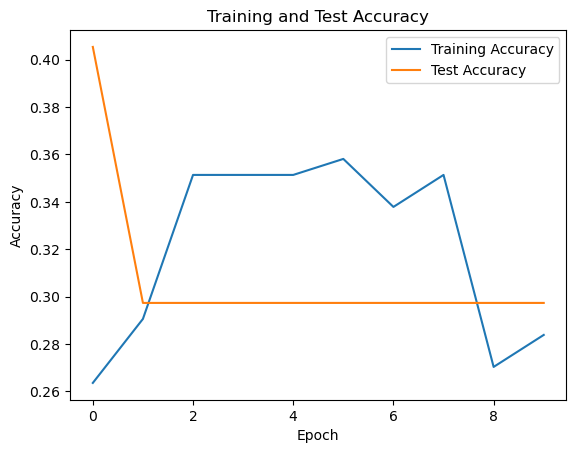

In [15]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#epochs=10, batch_size=20

Epoch 1/10
8/8 [==============================] - 42s 5s/step - loss: 1.1047 - accuracy: 0.2500 - val_loss: 1.1014 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 40s 5s/step - loss: 1.0984 - accuracy: 0.3581 - val_loss: 1.1042 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 41s 5s/step - loss: 1.0985 - accuracy: 0.3514 - val_loss: 1.1030 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 41s 5s/step - loss: 1.0990 - accuracy: 0.3514 - val_loss: 1.1014 - val_accuracy: 0.2973
Epoch 5/10
8/8 [==============================] - 44s 6s/step - loss: 1.0980 - accuracy: 0.3514 - val_loss: 1.1022 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 42s 5s/step - loss: 1.0980 - accuracy: 0.3514 - val_loss: 1.1050 - val_accuracy: 0.2973
Epoch 7/10
8/8 [==============================] - 42s 5s/step - loss: 1.0978 - accuracy: 0.3514 - val_loss: 1.1054 - val_accuracy: 0.2973
Epoch 8/10
8/8 [==================

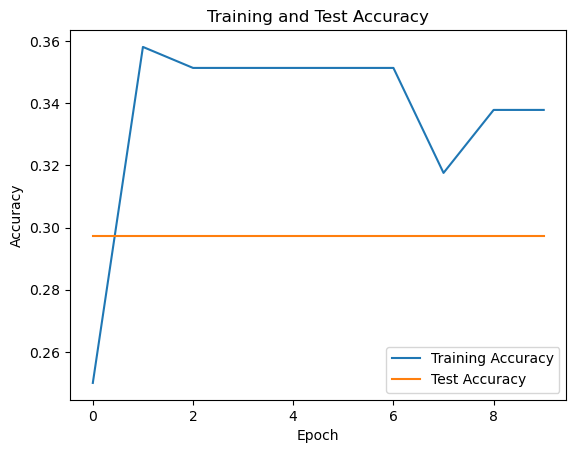

In [16]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# LSTM(units=128) embedding_dim=100

In [ ]:
#epochs=10, batch_size=10

Epoch 1/10
15/15 [==============================] - 69s 5s/step - loss: 1.1054 - accuracy: 0.3243 - val_loss: 1.1012 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 65s 4s/step - loss: 1.0991 - accuracy: 0.3514 - val_loss: 1.1013 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 69s 5s/step - loss: 1.0999 - accuracy: 0.3378 - val_loss: 1.1052 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 69s 5s/step - loss: 1.0987 - accuracy: 0.3243 - val_loss: 1.1052 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 70s 5s/step - loss: 1.1009 - accuracy: 0.3514 - val_loss: 1.0982 - val_accuracy: 0.2973
Epoch 6/10
15/15 [==============================] - 70s 5s/step - loss: 1.0976 - accuracy: 0.3514 - val_loss: 1.1023 - val_accuracy: 0.2973
Epoch 7/10
15/15 [==============================] - 70s 5s/step - loss: 1.0982 - accuracy: 0.3514 - val_loss: 1.1043 - val_accuracy: 0.2973
Epoch 8/10
15/15 [==

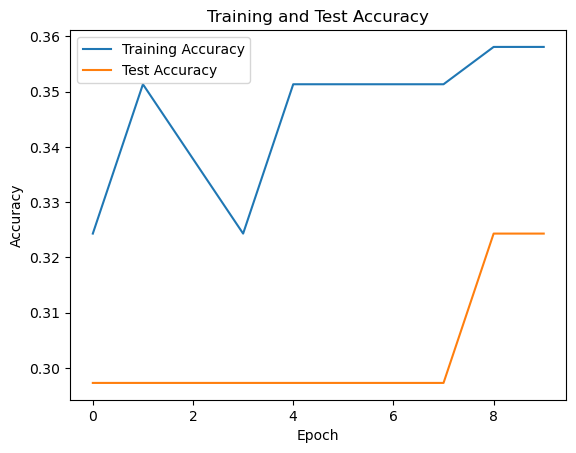

5/5 [==============================] - 4s 847ms/step - loss: 1.0933 - accuracy: 0.3851
Training Accuracy: 38.51%
2/2 [==============================] - 2s 383ms/step - loss: 1.1025 - accuracy: 0.3243
Test Accuracy: 32.43%


In [17]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))


 
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100)) 

In [ ]:
#epochs=10, batch_size=20

Epoch 1/10
8/8 [==============================] - 40s 5s/step - loss: 1.1123 - accuracy: 0.3311 - val_loss: 1.1061 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 43s 5s/step - loss: 1.1020 - accuracy: 0.3446 - val_loss: 1.1017 - val_accuracy: 0.3243
Epoch 3/10
8/8 [==============================] - 44s 5s/step - loss: 1.0993 - accuracy: 0.3716 - val_loss: 1.1037 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 39s 5s/step - loss: 1.0983 - accuracy: 0.3378 - val_loss: 1.1014 - val_accuracy: 0.2973
Epoch 5/10
8/8 [==============================] - 40s 5s/step - loss: 1.0986 - accuracy: 0.3378 - val_loss: 1.1012 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 40s 5s/step - loss: 1.0983 - accuracy: 0.3176 - val_loss: 1.1053 - val_accuracy: 0.2973
Epoch 7/10
8/8 [==============================] - 40s 5s/step - loss: 1.0998 - accuracy: 0.3514 - val_loss: 1.1083 - val_accuracy: 0.2973
Epoch 8/10
8/8 [==================

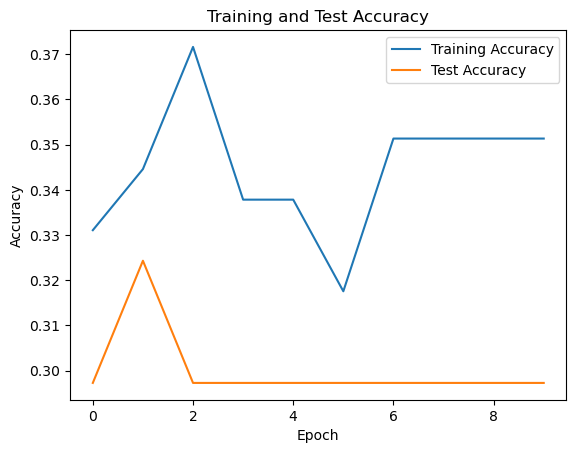

5/5 [==============================] - 5s 943ms/step - loss: 1.0971 - accuracy: 0.3514
Training Accuracy: 35.14%
2/2 [==============================] - 1s 347ms/step - loss: 1.1060 - accuracy: 0.2973
Test Accuracy: 29.73%


In [18]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))


 
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100)) 

In [ ]:
# option 2 :Substitute word by WordNet's synonym.

In [19]:
# You can optionally set the max number of words to replace with synonym.
aug = naw.SynonymAug(aug_src='wordnet', aug_max=3)
augmented_texts = []
for t in texts:
    augmented_text = aug.augment(t)
    augmented_texts.append(augmented_text)
    print("Original:")
    print(t)
    print("Augmented Text:")
    print(augmented_text)

Original:
feeling upset ’ know might underlying cause hormonal change past trauma depression stress find feeling low cry without obvious reason might wonder ’ going often nothing worry — might feeling extra sensitive today case may cause ’ thought yet feeling sad natural part life fact sadness benefit like helping u process difficult event connect others ’ always make easier moment however feel today know ’ alone many way find joy people feel sad lot reason — ’ also possible feel sad reason think sometimes seemingly small disappointment affect think leaving upset long afterward might connect current sadness happened feeling lonely experiencing rejection relationship issue major lasting effect feel even lack sleep feeling hungry put sour mood day case might deeper cause factor like depression trauma grief hormonal change affect mood without conscious awareness year yet may affect emotion every day consider setting time aside sit emotion work ’ causing may find answer ’ ok — sometimes fi

Original:
everyone experienced sadness everyone experienced depression fact ’ never depressed chance ’ real grasp living complex mental illness like depression insidious affect mood also ability feel think function blunts sensation pleasure close connectedness stifle creativity worst shuts hope also often cause deep emotional pain person experiencing person ’ close family friend sadness alone ’ good gauge depression according american psychiatric association ’ apa current diagnostic statistical manual mental disorder dsm-5 diagnostic guide used mental health professional ’ experienced least five following symptom day nearly every day least two week may diagnosed major depressive disorder mdd also known clinical depression one know sure people become depressed others depression occur spontaneously without obvious cause ’ well documented ’ one depressive episode risk another later life increase psychiatrist today generally look depression “ bio-psycho-social ” term meaning see complex di

Original:
depression one common mood disorder united state cause persistent sadness limit person ’ ability go daily activity however depression treatable people recover lifestyle change medical treatment help individual feel better typically managing depression ongoing process article list strategy treatment help fight depression person know depression empowered find treatment work helpful learn depression general including cause symptom also important people get know symptom warning sign feeling worse identify knowing prompt depressive episode help people avoid manage trigger may reduce future depressive episode educating friend family member also help loved one watch warning sign supportive person difficult time reaching loved one help people get difficult time simply talking happening help also connecting others help reduce feeling loneliness isolation feel possible talk friend family member people may wish join support group see therapist keeping journal powerful strategy fighting 

Original:
include product think useful reader buy link page may earn small commission ’ process psych central show brand product stand behind ’ hard describe feeling numb like ’ intuitively know ’ felt know ’ alone many people report feeling disconnected world around sometimes feeling “ flat ” feeling like life autopilot perhaps event people seem muted le colorful somehow also described chronically running empty feeling ungrounded hard time focusing losing track time throughout day feeling numb make hard connect others creates loneliness sense isolation experience emotional numbness also called “ affective blunting ” commonly associated depression also occur mental health condition medication linked state like dissociation depersonalization — feeling disconnected emotion surroundings good news emotional numbness usually temporary treatable article walk cause treatment self-help strategy additional resource ’ one answer question expert pretty good theory emotional numbness occur limbic 

Original:
sadness emotion typically characterised plethora accompanying feeling like loss disappointment disinterest low mood helplessness hopelessness cause perception sadness vary across culture idea loss expectation oneself others differ slightly culture culture though ’ cause vary symptom sadness generally one individual another include low mood lethargy social withdrawal period cry distractedness ’ common judge label given emotion positive negative happiness example generally considered positive emotion equally sadness typically perceived negative emotion anger often viewed unhealthy emotion fact emotion play role personal social functioning valid need judged positively negatively like basic emotion outlined paul eckman ’ sadness said adaptive function person experience sadness focus event circumstance caused feeling first place therefore act motivational tool avoiding event circumstance future another purpose sadness serve strengthening social bond visible sadness one person evok

Original:
everyone experience bad day depression day seem particularly challenging ’ permanent symptom depression take many form may manifest different way different time living depression experiencing sadness may also experience debilitating sense loneliness emptiness hopelessness future day may feel depression symptom intensify difficult go usual routine developing specific coping skill help go bad day depression even feel darkest world health organization report nearly adult globally million people worldwide live depression united state number hovers around according national institute mental health bad day ’ sign depression live depression bad day mean symptom intensify impact routine usual ’ natural feel discouraged disheartened happens may feel like ’ taking step backward nothing work depression untreated depression could one reason may feel symptom intensifying ’ treating depression factor contribute bad day example antidepressant may stopped working ’ living symptom condition c

Original:
feeling bit blue lately might call gloominess dump could briefly feel little clear reason often trace sadness come blue mood specific circumstance so-called blue might feel sad tearful want spend time lack usual energy motivation feeling usually tend pretty mild though generally pas long temporary blue might sap usual cheer generally ’ keep typical daily routine totally ’ necessarily bad thing ’ common view unhappiness sadness negative thing emotion significance even unwanted one low mood may feel good ’ true occasional sadness much normal part life though feeling emotion change response day-to-day experience ’ tough time ’ probably notice mood reflects challenge ’ facing feeling blue alert fact something ’ quite right life help take step identify cause low mood make change could help feel better short ’ unusual feel little time time particularly facing loss difficult situation ’ immediately identify cause might help take closer look recent change problem life — even period b

Original:
home » general health post » feeling blue ’ know ever felt blue christmas ’ talking color blue idiom mean feeling sad gloomy normal ups down problem every year feel like seasonal allergy instead stuffy runny nose suddenly feel depressed ’ like everything happens make sensitive ’ period happens man woman ’ always hormone ’ always feel heavily depressed like gloominess feeling bit sadness natural emotion tell ’ something wrong ’ seasonal blue symptom starting bother article ’ covering everything need know feeling sad ’ giving list tip cope common problem list warning sign may need professional help mental health complex unnoticeable stimulus sometimes trigger emotion smell take back childhood year lost pet ’ notice neuron connection happen right sadness suddenly triggered unconscious mind even obscure difficult understand plain sight may reason sadness rooted personal history difficult trace heal u type unconscious trigger ’ alone thus feeling blue apparent reason feel immediat

Original:
may particularly enjoy feeling sad may prefer experiencing emotion try avoid emotion together mental health professional want know people tend think sadness always bad say meaghan barlow phd assistant professor department psychology wilfrid laurier university waterloo ontario study self-regulation emotion aging “ 's absolutely view. ” distinct depression — world health organization note leading cause disability worldwide — sadness common emotion dr. barlow say right context sadness even helpful growing body research support point view barlow expert explain sadness impact well-being cope feel like much sadness “ emotional state unhappiness ranging intensity mild extreme usually aroused loss something highly valued ” according american psychological association apa sadness anger feel unpleasant distressing researcher sometimes lump two together umbrella “ negative affect. ” category also includes shame guilt anxiety fear irritability according research sadness anger distinct em

Original:
language one fondest memory six year old promise father mind ’ let slip away— “ make discover whole world. ” ’ know covering entire planet something to-do list handle age ’ somehow—maybe even simple manifestation—had privilege discover country year beautiful earth ’ road trip writing blog say feel liberated travel expands capacity wonder joy appreciation amazing diversity planet moment simply ‘ ’ allows u let go stress tension enjoy moment travel one guru many reasons—and ’ like share travelling help u feel like best self ’ willing receive world ’ many lesson matter shape size help u recognise shared humanity others dissipating fear misunderstanding ’ way fun love world afraid best alternative gaining knowledge book travelling according neuroscientist travel rewire brain new experience key building new neural pathway brain rewiring brain become creative accepting new idea travel make happy also take u comfort zone inspires u see taste try new thing constantly challenge u adap

Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ version happiness little different path achieving habit create added stress ’ fit lifestyle ditch little time practice ’ figure ’ work following daily habit may help achieve happiness life tend smile ’ happy ’ actually two-way street smile ’ happy smiling cause brain release dopamine make u happier completely foolproof researcher found link smiling happiness could attributed “ facial feedback hypothesis ” facial expression may modest influence emotion mean go around fake smile plastered face time next time find feeling low crack smile see happens try starting morning smiling mirror exercise ’ body regular exercise help reduc

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
greater good science center • magazine • action • education coming formal definition happiness tricky ’ know feel fact often use term describe range positive emotion including amusement joy pride contentment understand cause effect happiness researcher first need define term happiness interchangeable “ subjective well-being ” typically measured asking people satisfied feel life evaluative much positive negative emotion tend feel affective sense meaning purpose eudaimonic book happiness positive psychology researcher sonja lyubomirsky elaborates describing happiness “ experience joy contentment positive well-being combined sense one ’ life good meaningful worthwhile. ” however ’ important note social cultural factor also influence think happiness example study william tov others found people culture embrace collectivist ideal think happiness term harmony contentment individualistic-minded people connect feeling exuberance joy happiness level also shaped social group like famil

Original:
coaching video book article learn joyfulness happiness two emotion often mentioned breath carry subtle difference meaning use joyfulness `` joy '' often used describe temporary often immediate state delight contentment elicited specific event like receiving compliment hearing favorite song achieving small success joyfulness typically fleeting fade quickly happiness `` happy '' indicates deeper prolonged feeling contentment peace well-being linked external event also internal belief value life circumstance happiness often seen general assessment one 's life whole rather response specific event different culture language unique interpretation nuance regarding emotion western culture many western culture happiness often linked personal success self-realization freedom individual pursuit happiness often seen right eastern culture culture like china japan happiness might connected harmony balance community tie individual well-being might seen secondary well-being group family bhut

Original:
expert-approved tip yield happy return editor handpick product feature may earn commission link page spoiler alert past year challenging nearly everyone—to say least ’ difficulty finding positivity joy ’ alone fact recent survey university chicago found happiness among american fallen five-decade low good news yes good chunk happiness influenced genetics whether basic need met like safety shelter food ’ also lot get joy back even hard difficult time say sonja lyubomirsky phd professor psychology university california riverside `` absolutely improve happiness level—as long ’ willing put effort '' say `` constantly remind little thing like look bright side life eventually habit become engrained '' even better adding joy daily routine may also enhance overall well-being “ happiness two component ” lyubomirsky say “ first life satisfaction sense life going well second experience frequent positive emotion include pride curiosity enthusiasm tranquility joy. ” best expert-approved s

Original:
get advice scientist psychiatrist load generally joyful people cultivating moment bliss life season jolly expect find joy around every pine-scented corner pause moment ask really joy ’ always feel think get better sparking year long find oprah daily reached scientist psychologist see research say asked people seem skilled finding joy everyday situations—including comedian journalist activist celebs thought leaders—to share wisdom read advice proven tip cultivate joy life jessica torres cooper imagine ’ walking along path favorite park butterfly suddenly flutter past stop observe magnificent color curvature wing velvety surface skin surprise land hand delight mutually observing profound feeling well-being satisfaction move feeling joy happiness scientist currently investigating difference two understand distinction matter spoke expert joy cultivate beyond holiday season joy happiness positive expression one happiness state mind well-being modified external event think kid exci

Original:
looking free reading log click everyday reading went gym morning – guilt hooray sleep either hooray ’ ordering lunch office ’ ordering mexican food yet feel strange desire order chicken strip fry .i ’ really five year old ’ afraid also good thing went gym ’ wearing favorite jean always cause celebration clearly need get cute tomorrow ’ going halloween dinner fantastic pressure dress ’ adult rock grown-up hair hideous today also cause celebration successfully met goal reading book year ’ working 54. several book post write see mint hot chocolate .right new spiffy water cooler work lukewarm water yummy vomit also cold cold water drinking hot hot water making hot chocolate life fabulous boston trip coming soon ’ dad ’ birthday today happy birthday dad themoncurs say october 4:55 pm dad took supposedly amazing mexican restaurant day thing ’ noticed enraptured seafood enchilada place also barbecue joint got bbq pulled pork sandwich kind horrified would get bbq could get mexican fo

Original:
mean truly happy many philosophical school thought regarding concept happiness cultivation instance pursuit enduring happiness core many mindfulness practice often emphasize gratitude seeking contentment present moment model happiness suggest importance living congruence value way satisfy basic human need research even show whether happy part boiled genetics follows ’ walk several conceptualization happiness show measure give wide range strategy cultivating whichever form happiness seek life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing defining happiness small task philosopher researcher drilled notion two key conceptualization conceptualization known hedonia eudaimonia together represent two long-running tradition study happiness stem far back time ancient philosopher ryan deci hedonic perspective happiness argues life ’ goal exp

Original:
home » achieve happiness practical happiness habit life tough right stress busy schedule rush everyday life ’ wonder ’ looking happiness want feel good content really make happen blog help figure ’ going share useful tip idea help find path happiness “ happiness state well-being characterized positive emotion contentment general sense satisfaction one ’ life. ” happiness feeling joy contentment ’ feel good satisfied life people find happiness different way like spending time loved one achieving goal thing enjoy happiness come go—it ’ something feel time ’ personal thing make one person happy might different someone else life situation people around also affect happy feel psychology happiness summary suggests happiness result one ’ overall emotional state balance positive negative affect simple term happiness feeling good satisfied life thing make happy ’ unique changing experience person achieve happiness understanding mean personally crucial ’ one-size-fits-all concept refle

Original:
pour le article homonymes voir suisse homonymie confédération suisse de schweizerische eidgenossenschaft confederazione svizzera rm confederaziun svizra la confoederatio helvetica 46° 57′ n 7° 25′ e modifier la suisse en forme longue la confédération suisse est un état fédéral d'europe centrale et de l'ouest formé de canton avec berne pour capitale de facto la suisse est bordée par l'allemagne au nord l'autriche et le liechtenstein à l'est-nord-est l'italie au sud et au sud-est et la france à l'ouest c'est un pay sans littoral dont le rhin sécurisé par de traités internationaux constitue l ’ unique accès direct à la mer le pay est géographiquement divisé entre le alpes qui occupent du territoire le plateau suisse et le jura sa population dépasse le 8,8 million d'habitants concentrés principalement sur le plateau là où se trouvent le plus grandes agglomérations et centre économiques zurich et genève — qui sont de villes mondiales — puis bâle capitale dite culturelle du pay et 

Original:
many college course require memorize mass amount information memorizing one class difficult even frustrating multiple class many student feel like simply strong memory skill fortunately though memorizing elite group people born right skills—anyone train develop memorizing ability competitive memorizer claim practicing visualization technique using memory trick enable remember large chunk information quickly research show student use memory trick perform better memory trick help expand working memory access long term memory technique also enable remember concept year even life finally memory trick like lead understanding higher order thinking keep reading introduction effective memorization technique help school addition visual spatial memory technique many others trick use help brain remember information simple tip try check video learning center quick explanation many tip try understand information first information organized make sense easier memorize find ’ understand mate

Original:
word health refers state complete emotional mental physical well-being healthcare exists help people stay well key area life according center disease control prevention cdc healthcare cost united state trillion 2017. however despite expenditure people u.s. lower life expectancy people developed country due variety factor including access healthcare lifestyle choice good health central handling stress living longer active life article explain meaning good health type health person need consider preserve good health world health organization defined health phrase modern authority still apply “ health state complete physical mental social well-being merely absence disease infirmity. ” made clarification “ resource everyday life objective living health positive concept emphasizing social personal resource well physical capacities. ” mean health resource support individual ’ function wider society rather end healthful lifestyle provides mean lead full life meaning purpose research

Original:
33°50′n 35°50′e﻿ ﻿33.833°n 35.833°e﻿ lebanon /ˈlɛbənɒn -nən/ ⓘ leb-ə-non -⁠nən arabic لُبْنَان romanized lubnān local pronunciation lɪbˈneːn officially republic lebanon c country levant region west asia bordered syria north east israel south mediterranean sea west cyprus lie short distance away country 's coastline lebanon 's location crossroad mediterranean basin arabian hinterland contributed country 's rich history shaped unique cultural identity shaped religious diversity lebanon population five million people cover area 10,452 square kilometre 4,036 sq mi lebanon 's capital largest city beirut followed tripoli jounieh arabic official language french also recognized formal capacity lebanese arabic country 's vernacular though french english play relatively significant role everyday life modern standard arabic limited news government matter earliest evidence human civilization lebanon date back bce bc lebanon home phoenicia maritime empire stretched mediterranean basin bc 

Original:
– europe light green dark grey – european union light green germany e officially federal republic germany f country western region central europe second-most populous country europe russia g populous member state european union germany lie baltic north sea north alp south constituent state total population million covering combined area 357,600 km2 138,100 sq mi sharing land border denmark north poland czech republic east austria switzerland south france luxembourg belgium netherlands west nation 's capital populous city berlin main financial centre frankfurt largest urban area ruhr settlement germany began lower paleolithic various tribe inhabiting neolithic onward chiefly celt various germanic tribe inhabited northern part modern germany since classical antiquity region named germania documented ad 100. kingdom germany formed bulk holy roman empire 16th century northern german region became centre protestant reformation following napoleonic war dissolution holy roman empire

Original:
happiness seems like odd question know define happiness think happiness thing others ’ point even make difference life fact happiness pretty important role life huge impact way live life although researcher yet pin definition agreed-upon framework happiness ’ lot learned last decade article dive science happiness actually matter continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing first let ’ take look definition happiness ’ page oxford english dictionary ’ definition “ happiness ” simple one “ state happy. ” exactly looking perhaps need dive little deeper oxford english dictionary ’ definition “ happy ” little helpful “ feeling showing pleasure contentment. ” ’ better happiness state feeling showing pleasure contentment definition glean important point happiness better grasp happiness is—or least oxford english dictionary defines happine

Original:
chapter happiness different life stage different generation first time looked happiness age gender first time enough survey year start separating life course ever-changing pattern history important part life tied mainly age schooling employment health others depend going society world society-wide factor range violence earthquake pandemic new technology changing natural social environment interact also-changing way seeing history facing inequality connecting analysis deal life different age bring generational effect find salient early section relate happiness measured life evaluation emotion showing level change younger older 60+ divided two group aged 30-44 45-59. later analysis generation make three-way split born 1965-1980 1980. although best separation point generational difference differ country country depending key event separation match widely used definition also divide sample fairly evenly roughly first two group youngest cohort includes millennials successor start 

Original:
home beautiful place love germany mix age-old tradition forward-thinking ideal ’ also land blessed acre impossibly beautiful countryside dotted chocolate-box-pretty village moody forest romantic river valley vast expanse vineyard perfectly preserved half-timbered town majestic alp many trip favourite place want share you… book trip book trip stay germany ’ beautiful place top-rated travel planning service follow cobbled street fairytale-esque gate embedded within city wall return medieval europe honestly think one prettiest town located along famous ‘ romantic road ’ bavaria attraction also deserves place list road picturesque 350km route forest mountain bavaria baden-württemberg rothenburg although small packed exciting site would highly recommend visiting market square flanked 14th-century building tall town hall tower step leading one stunning view city interesting medieval crime punishment museum night fall would suggest going amusing night watchman ’ tour land cuckoo clo

Original:
never run question topic date ’ keep date intrigued entertained read never run question topic date ’ keep date intrigued entertained read ’ ’ hanging someone new attractive forget talk first-date conversation starter secret avoiding awkward silence nervous laughter expressing genuine interest date bringing intriguing topic make unforgettable memory least date ’ boring explore question ’ forget share detail life research show self-disclosure make likable help others feel comfortable opening exciting conversation starter set apart rest met someone want find ’ spark warming first date take time patience may want dig super deep personal topic ’ first getting know someone instead keep lighthearted intriguing unique question people ’ appear question excellent icebreaker help dive stereotype pre-conceptions date tell something unexpected find date spontaneous dream destination might inspire discussion culture food travel get idea someone ’ self-perception twist classic “ describe ” 

Original:
david morin daniel wendler psy.d last updated august complete guide start talking someone everyday life work school text online … year ago clue start conversation new people committed reading book make conversation learning socially savvy people spending thousand hour socializing today teach social skill living guide ’ share everything know talking people section several example good conversation starter different social setting join group conversation avoid rehearsed conversation starter instead listen people already talking contribute ongoing conversation said time topic dy idea start new interesting group conversation situation ’ better starting conversation friend based situation rather using memorized line remainder guide cover easiest way initiate conversation draw inspiration surroundings social event talked norm stranger present day-to-day life hand ’ direct ease conversation ask question situation ’ give u reason start talking ’ direct help ask something already mind

Original:
’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read ’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read crave feeling confident comfortable talking people shyness holding back making friend excelling career ’ glad know shyness learned behavior need changing mean shy shyness feeling reserved nervous timid company people according oxford dictionary feeling shy social interaction normal may think research show shyness universal phenomenon1https //www.apa.org/international/pi/2017/06/shyness text=the 20universality 20of 20shyness text=a 20more 20moderate 20rate 20of 2c 20germany 2c 20india 20and 20mexico experienced people western world eastern culture fact famous people shy mark zuckerberg ’ coo says2https //www.cnbc.com/2017/05/15/mark-zuckerberg-and-other-introverts-have-an-advantage-over-extroverts.html “ shy ” “ introverted ” bill gate self-proclaimed introvert warren buffet advises fellow introvert push comfort zone overcome shyness f

Original:
include product think useful reader make purchase link may earn commission “ hate shy want able talk people shyness holding back. ” complete guide shy method guide shyness social anxiety workbook martin m. anthony ph.d. richard p. swinson md take look stats know “ everyone ’ confident ” myth reminding help feel le shy ask question ’ around people meet conversation ’ example see someone “ wonder might living ” conversation ’ “ wonder ’ like work accounting ” noticing surroundings “ wonder era house ” keeping preoccupied like make le self-conscious notice start feeling self-conscious move attention back surroundings advertisement traditional therapy done online find therapist betterhelp 's network therapist everyday therapy need take quiz get matched start getting support via phone video session plan start per week use button get first month betterhelp coupon valid socialself course receive socialself coupon sign betterhelp using orange button email order confirmation socialsel

Original:
many people wonder connect people meaningful way connecting people great feeling give sense familiarity help individual bond another person make friend develop relationship people making connection others seems effortless certain colleague relative friend skill starting conversation know say start positive flow communication one another outgoing extroverted people seem easier time building connection friendship truth anyone develop skill needed connect people business everyday scenario people introverted considered le social may engage widely others work party social networking function le social individual may seem genuinely uninterested meeting others usually make point observing listening speak nevertheless even social people encounter challenge building connection networking others every social function business interaction offer challenge many people find difficult although practice connecting people improve important tip establishing relationship offering bit informatio

Original:
post ’ learn stop comparing others see time therapy people come feeling like crap dig might even realize ’ ’ comparing people feel like ’ never good enough ’ never going measure everyone else happier prettier fitter successful sometimes comparison make miserable different way constantly look people worse lift ’ lazy ’ vain ’ undisciplined…or entire groups- cop pig black dangerous fill political party- republican bigot stupid may feel slightly better short term compare someone perceive worse boost ’ last long ’ founded insecurity ’ know comparison- contributes mental health concern like eating disorder low self-esteem depression anxiety social anxiety body dissatisfaction jealousy narcissism perfectionism also lead problem like overspending keep jones one study found someone neighborhood lottery neighbor began making big purchase like expensive car ’ afford compare others always let u long run let ’ talk reason comparison let u ’ talk instead ad real quick ’ like thank betterh

In [20]:
# Label Encoding
label_encoder = preprocessing.LabelEncoder()
labeled_df['label_encoded'] = label_encoder.fit_transform(labeled_df['label'])

# Join augmented texts into a single string
augmented_texts_joined_1 = [' '.join(text) for text in augmented_texts]

# Creating the Bag of Words model by applying CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range=(1, 3))
labeleddf_cv = cv.fit_transform(augmented_texts_joined_1).toarray()
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(labeleddf_cv, labeled_df['label_encoded'], test_size=0.2, random_state=42)

In [ ]:
# embedding_dim = 50

In [ ]:
#LSTM(units=128)

In [ ]:
# epochs=10, batch_size=10

Epoch 1/10
15/15 [==============================] - 70s 5s/step - loss: 1.1051 - accuracy: 0.2703 - val_loss: 1.1054 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 70s 5s/step - loss: 1.1010 - accuracy: 0.3514 - val_loss: 1.0996 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 71s 5s/step - loss: 1.1000 - accuracy: 0.3514 - val_loss: 1.1050 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 67s 4s/step - loss: 1.0987 - accuracy: 0.3514 - val_loss: 1.1031 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 68s 5s/step - loss: 1.0989 - accuracy: 0.3514 - val_loss: 1.1025 - val_accuracy: 0.2973
Epoch 6/10
15/15 [==============================] - 74s 5s/step - loss: 1.0991 - accuracy: 0.2770 - val_loss: 1.1017 - val_accuracy: 0.2973
Epoch 7/10
15/15 [==============================] - 77s 5s/step - loss: 1.0982 - accuracy: 0.3514 - val_loss: 1.1014 - val_accuracy: 0.2973
Epoch 8/10
15/15 [==

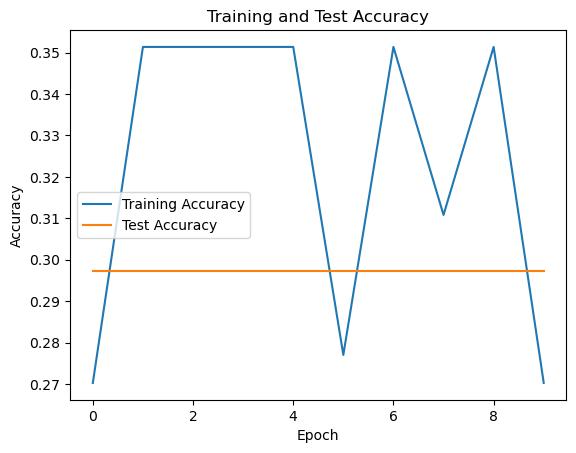

In [21]:
# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined_1)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#epochs=10, batch_size=20

Epoch 1/10
8/8 [==============================] - 38s 5s/step - loss: 1.1027 - accuracy: 0.2905 - val_loss: 1.1016 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 40s 5s/step - loss: 1.1001 - accuracy: 0.3311 - val_loss: 1.1010 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 44s 6s/step - loss: 1.0985 - accuracy: 0.3514 - val_loss: 1.1024 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 43s 5s/step - loss: 1.0984 - accuracy: 0.3514 - val_loss: 1.1026 - val_accuracy: 0.2973
Epoch 5/10
8/8 [==============================] - 42s 5s/step - loss: 1.0988 - accuracy: 0.3514 - val_loss: 1.1031 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 40s 5s/step - loss: 1.0981 - accuracy: 0.3514 - val_loss: 1.1062 - val_accuracy: 0.2973
Epoch 7/10
8/8 [==============================] - 43s 5s/step - loss: 1.0982 - accuracy: 0.3311 - val_loss: 1.1041 - val_accuracy: 0.2973
Epoch 8/10
8/8 [==================

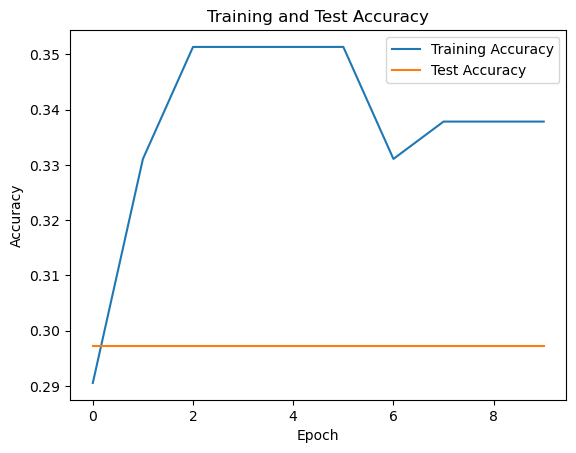

In [22]:
# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined_1)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#LSTM(units=128), embedding_dim=100

In [ ]:
#epochs=10, batch_size=10

Epoch 1/10
15/15 [==============================] - 79s 5s/step - loss: 1.1020 - accuracy: 0.3108 - val_loss: 1.1046 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 68s 5s/step - loss: 1.1000 - accuracy: 0.3514 - val_loss: 1.1007 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 69s 5s/step - loss: 1.0987 - accuracy: 0.3514 - val_loss: 1.1041 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 82s 5s/step - loss: 1.0992 - accuracy: 0.3514 - val_loss: 1.1024 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 73s 5s/step - loss: 1.1010 - accuracy: 0.3176 - val_loss: 1.1048 - val_accuracy: 0.2973
Epoch 6/10
15/15 [==============================] - 75s 5s/step - loss: 1.0981 - accuracy: 0.3378 - val_loss: 1.1043 - val_accuracy: 0.2973
Epoch 7/10
15/15 [==============================] - 73s 5s/step - loss: 1.0983 - accuracy: 0.3649 - val_loss: 1.1020 - val_accuracy: 0.2973
Epoch 8/10
15/15 [==

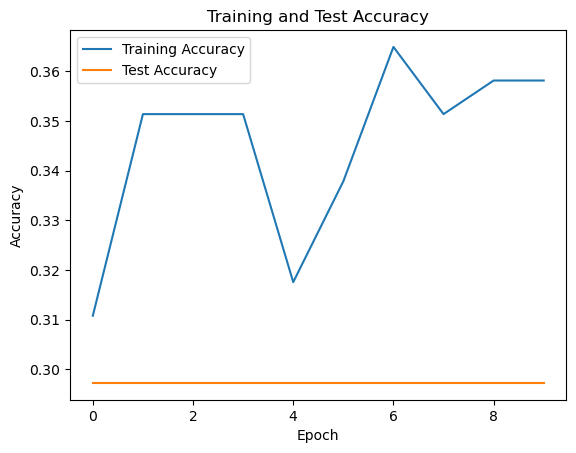

In [23]:
# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined_1)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#epochs=10, batch_size=20

Epoch 1/10
8/8 [==============================] - 174s 10s/step - loss: 1.1085 - accuracy: 0.3378 - val_loss: 1.1063 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 43s 6s/step - loss: 1.1011 - accuracy: 0.2973 - val_loss: 1.1072 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 46s 6s/step - loss: 1.0993 - accuracy: 0.3514 - val_loss: 1.1039 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 45s 6s/step - loss: 1.0985 - accuracy: 0.3514 - val_loss: 1.1040 - val_accuracy: 0.2973
Epoch 5/10
8/8 [==============================] - 46s 6s/step - loss: 1.1000 - accuracy: 0.3514 - val_loss: 1.0988 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 47s 6s/step - loss: 1.0988 - accuracy: 0.3108 - val_loss: 1.0970 - val_accuracy: 0.4054
Epoch 7/10
8/8 [==============================] - 48s 6s/step - loss: 1.0984 - accuracy: 0.2905 - val_loss: 1.0983 - val_accuracy: 0.2973
Epoch 8/10
8/8 [================

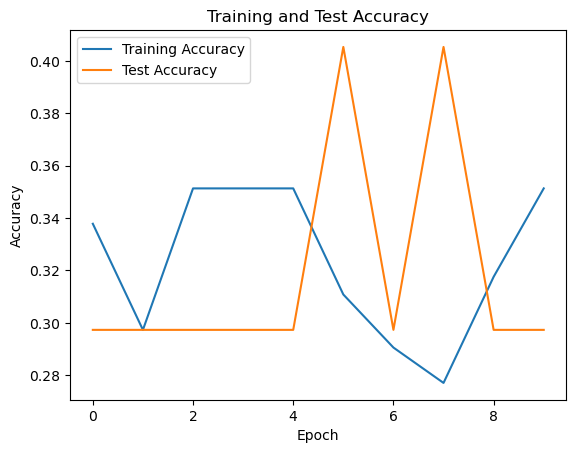

In [24]:
# Create a Tokenizer object
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined_1)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [19]:
# Substitute word by contextual word embeddings (BERT, DistilBERT, RoBERTA or XLNet)
aug = naw.ContextualWordEmbsAug(
    # Other models include 'distilbert-base-uncased', 'roberta-base', etc.
    model_path='bert-base-uncased', 
    # You can also choose "insert"
    action="insert"
)

augmented_texts = []
for t in texts:
    augmented_text = aug.augment(t)
    augmented_texts.append(augmented_text)
    print("Original:")
    print(t)
    print("Augmented Text:")
    print(augmented_text)

C:\ProgramData\Anaconda33\Lib\site-packages\transformers\utils\generic.py:260: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


Original:
feeling upset ’ know might underlying cause hormonal change past trauma depression stress find feeling low cry without obvious reason might wonder ’ going often nothing worry — might feeling extra sensitive today case may cause ’ thought yet feeling sad natural part life fact sadness benefit like helping u process difficult event connect others ’ always make easier moment however feel today know ’ alone many way find joy people feel sad lot reason — ’ also possible feel sad reason think sometimes seemingly small disappointment affect think leaving upset long afterward might connect current sadness happened feeling lonely experiencing rejection relationship issue major lasting effect feel even lack sleep feeling hungry put sour mood day case might deeper cause factor like depression trauma grief hormonal change affect mood without conscious awareness year yet may affect emotion every day consider setting time aside sit emotion work ’ causing may find answer ’ ok — sometimes fi

Original:
sadness natural emotion everyone experience various time life feeling sad reason may related hormonal change lack sleep stress factor sadness affect people different way people may want cry spend time alone comfort-related activity feel happier occasional sadness normal however feeling sad week sadness affecting everyday functioning may indicate serious underlying cause depression article explores person may feel sad apparent reason tip feeling happier speak doctor feeling sad fluctuation hormone significantly affect person ’ mood sometimes lead unexplained sadness hormonal change menstrual cycle including fluctuation estrogen progesterone affect someone ’ mood month premenstrual syndrome pm common make person feel sad start menstruation according office woman ’ health feeling sadness known baby blue typically last day birth occur due hormonal fluctuation coupled new challenge however sadness persists longer week person may postpartum depression depression pregnancy affect pe

Original:
feeling sad time specific reason ’ always mean depression suggest could experiencing something complex sadness alone sadness temporary state often clear cause like big disappointment loss someone close bad news someone love type sadness fluctuate throughout day certain moment emotional burden might feel particularly heavy might cry often feel numb drained struggle concentrate time — get lost something enjoy loved one distracts — sorrow may seem light enough barely feel weight might linger form day week generally begin ease naturally persistent sadness something else entirely wrap around like heavy blanket muffling sensation joy everyday life sadness leave feeling low empty defeated ’ know caused unhappiness idea start feeling better feeling sad ’ unusual sorrow normal human response disappointment loss sadness ’ clear reason behind ’ seem improve however may suggest something else going everyone depression feel sad unexplainable sadness ’ seem shake one primary sign depressio

Original:
day feel sometimes feeling sad happen apparent reason occasionally sadness natural time ’ perhaps symptom depression good news plenty useful tool available people living unexplained sadness one psychologist dr jessica valentine explains possible reason behind feeling sad make feel better normal feel low understand coming sometimes memory deep rooted childhood painful situation might blocked people feel low various reason know feel low wintertime ’ enough sun manage diet exercise meditation travelling feeling low loss breakup ‘ reason ’ normal work psychologist like piece information together find ‘ triggering ’ feel way often people feel low happy life feel like life mundane help restore balance life using simple technique sudden low mood sadness sign depression various type depression someone could feeling melancholy feeling low without knowing side spectrum someone could symptom severe depression could result trauma one 's life client feeling low vitamin deficiency often an

Original:
everyone feel sad sometimes like everyone feel joyful angry proud plenty emotion word everyone feeling feeling always changing sometimes feel happy ’ fun sometimes feel sad lose loved one whatever feeling real part living negative emotion may even help world focus happiness treat unhappiness unnecessary useless feeling sadness slow make really think life feeling people around help keep sight relationship dream word sad ’ mean coping situation rather help come term situation move important emotion help adapt accept focus persevere grow ’ good news learn manage sadness use different word talk sadness agony anguish broken heart hurt sorrow dejection dismay homesickness distress unhappiness emotion occur response negative unexpected situation life change sadness often occurs time feeling anger stress guilt grief anxiety hopelessness sometimes feeling may strong ’ realise sad sadness feel like may change feel physically perhaps stomach ache headache ’ sleep sadness may also change

Original:
boise state university boise state university boise state university boise state university alert successfully added sent notified whenever record chosen cited manage alert preference click button please log account depression common mental illness u.s. adult experienced major depressive episode unfortunately depression extends teen young user well researcher observed increasing rate recent year adolescent young adult especially among girl woman people barrier fight disease tend hide symptom receive treatment however protected anonymity share sentiment web looking help paper address problem detecting depressed user online forum analyze user behavior reachout.com online forum platform providing supportive environment young people discus everyday issue including depression examine linguistic style user post combination network-based feature modeling user connect forum result show network feature strong predictor depressed user combining user post linguistic feature achieve aver

Original:
everyone experienced sadness everyone experienced depression fact ’ never depressed chance ’ real grasp living complex mental illness like depression insidious affect mood also ability feel think function blunts sensation pleasure close connectedness stifle creativity worst shuts hope also often cause deep emotional pain person experiencing person ’ close family friend sadness alone ’ good gauge depression according american psychiatric association ’ apa current diagnostic statistical manual mental disorder dsm-5 diagnostic guide used mental health professional ’ experienced least five following symptom day nearly every day least two week may diagnosed major depressive disorder mdd also known clinical depression one know sure people become depressed others depression occur spontaneously without obvious cause ’ well documented ’ one depressive episode risk another later life increase psychiatrist today generally look depression “ bio-psycho-social ” term meaning see complex di

Original:
learn symptom different mental health condition tackle feel sad sadness difficult emotion deal result loss helplessness disappointment among many thing sadness one common natural human emotion however sometimes possible sadness deepen may sign suffering form depression feel though increasingly sad feel like sadness difficult explain information depression may help interested learning also check practical self-paced online program teach step-by-step strategy tackling symptom depression normal experience feeling sadness despair response life event loss major life change stress disappointment case sad feeling resolve come term change life situation loss feeling may persist month return significant time birthday anniversary related lost loved one however time enjoy thing sadness sign depression depression disorder characterised excessive sadness loss interest enjoyable thing low motivation depression common one three people experience episode major depression stage life case depr

Original:
many lifestyle change help ease burden living depression strategy work one person may right another trial error typical depression severe life-altering affecting quality life happiness live ’ also common condition affect people united state every year common technique may help managing symptom depression someone know crisis considering suicide self-harm please seek support ’ calling behalf someone else stay help arrives may remove weapon substance cause harm safely household stay phone help arrives exercising regularly one best thing mental health exercise help treatment prevention depression several key way type physical exercise help treat depression moving regularly help get benefit get exercise learn exercise depression brain research shown spending time social medium worsen feeling depression low self-esteem social medium addicting many people ’ necessity order stay connected family friend even coworkers even cutting completely ’ realistic lifestyle limiting social mediu

Original:
back depression adult key step take lift mood help recovery depression 's important take antidepressant prescribed even start feel better stop taking soon depression could return stopping suddenly also increase risk withdrawal side effect talk doctor pharmacist question concern medicine 're taking leaflet come medicine information possible interaction medicine supplement check doctor first plan take over-the-counter remedy painkiller nutritional supplement sometimes interfere antidepressant exercise healthy diet make significant difference quickly recover depression improve general health well healthy diet help lift mood fact eating healthily seems important maintaining mental health preventing physical health problem physically active lift mood reduce stress anxiety encourage release endorphin body 's feel-good chemical improve self-esteem exercising may also good distraction negative thought improve social interaction read exercise depression easy rush life without stopping

Original:
may particularly enjoy feeling sad may prefer experiencing emotion try avoid emotion together mental health professional want know people tend think sadness always bad say meaghan barlow phd assistant professor department psychology wilfrid laurier university waterloo ontario study self-regulation emotion aging “ 's absolutely view. ” distinct depression — world health organization note leading cause disability worldwide — sadness common emotion dr. barlow say right context sadness even helpful growing body research support point view barlow expert explain sadness impact well-being cope feel like much sadness “ emotional state unhappiness ranging intensity mild extreme usually aroused loss something highly valued ” according american psychological association apa sadness anger feel unpleasant distressing researcher sometimes lump two together umbrella “ negative affect. ” category also includes shame guilt anxiety fear irritability according research sadness anger distinct em

Original:
depression one common mood disorder united state cause persistent sadness limit person ’ ability go daily activity however depression treatable people recover lifestyle change medical treatment help individual feel better typically managing depression ongoing process article list strategy treatment help fight depression person know depression empowered find treatment work helpful learn depression general including cause symptom also important people get know symptom warning sign feeling worse identify knowing prompt depressive episode help people avoid manage trigger may reduce future depressive episode educating friend family member also help loved one watch warning sign supportive person difficult time reaching loved one help people get difficult time simply talking happening help also connecting others help reduce feeling loneliness isolation feel possible talk friend family member people may wish join support group see therapist keeping journal powerful strategy fighting 

Original:
eggshell therapy coaching eggshell therapy coaching table content feeling empty emotionally numb result emotional detachment syndrome known depersonalization feeling empty numb essence experience feeling disconnected surreal unable identify emotion emotionally numb also feeling empty detached outside observer life see life without living may also feel losing control thought action ever ask question feel empty like ’ even exist feel nothing feel emotionally numb happy upset feel detached loved one family friend look mirror feel like seeing someone else feel like robot running auto-pilot feel hollow little joy ups down life surreal feeling go day-to-day identify might struggling form dissociation known depersonalization feeling empty emotionally numb hollow prevalent emotion-phobic modern society- yet also one underestimated unaccounted condition “ louise often feel like part “ acting. ” time “ another part ‘ inside ’ connecting talking ” say depersonalization intense feel like

Original:
emotional numbness emotional blunting refers limited emotional response internal external event may symptom medical condition side effect medication emotional numbness create sense emptiness isolation disconnect rest world may notice people react event different way may difficult understand ’ feel way everyone experience emotional numbness way general may feel limited come emotional experience may muted response event used react may experience emotion yet outward expression may situation typically call sadness joy may feel either may make relating others challenging sign emotional numbness may include emotional numbness sometimes called emotional blunting difficult imagine experienced people describe feeling empty discouraged others report feeling isolated “ often feel invisible like ’ ghost watch family engaging feel like ’ invisible barrier keep joining ” describes amy h. experienced emotional numbness symptom depression “ ’ like submarine drifting undetected picking people

Original:
feeling emptiness ’ right chest yet ’ unsure came sadness melancholy boredom may little everything feeling way uncommon might call “ feeling empty ” someone else might call something different matter ’ real valid although overwhelming managed uncovering ’ lying underneath emptiness feeling might straightforward process ’ possible recommended first step toward resolution feeling emptiness might last day resolve time might linger two week longer case learning recognize cognitive distortion seeking support mental health professional help feeling empty sometimes manifest sense loneliness confusion life goal lack motivation pursue anything life everyone might feel void heart time time experience could many cause including shifting hormonal level losing job required physical distancing come pandemic life stage situation may require reflect life might also lead temporary feeling emptiness although every case feeling empty could also signify mental health condition depression bipolar

Original:
include product think useful reader buy link page may earn small commission ’ process psych central show brand product stand behind ’ hard describe feeling numb like ’ intuitively know ’ felt know ’ alone many people report feeling disconnected world around sometimes feeling “ flat ” feeling like life autopilot perhaps event people seem muted le colorful somehow also described chronically running empty feeling ungrounded hard time focusing losing track time throughout day feeling numb make hard connect others creates loneliness sense isolation experience emotional numbness also called “ affective blunting ” commonly associated depression also occur mental health condition medication linked state like dissociation depersonalization — feeling disconnected emotion surroundings good news emotional numbness usually temporary treatable article walk cause treatment self-help strategy additional resource ’ one answer question expert pretty good theory emotional numbness occur limbic 

Original:
young adult mental health substance abuse treatment center need help peruse frequently asked question today mark first day get started path healing work major insurance company optimize access care verify insurance discover make u different personalized treatment led expert field focus sustainable healing put young adult pathway success referring professional partner u providing sustainable healing male location offer wide range amenity experiential therapy self-discovery healing private serene home-like environment support young woman achieve long-term recovery based compassion founded clinical excellence integrated approach healing unparalleled featured many respected press outlet proud share expertise success story newport institute assembled best mental health leader rehab team country might seen phrase “ feeling emotionally numb ” list common symptom various mental health disorder really mean feeling numb inside different every individual general people describe feeling 

Original:
login login phrase `` dead inside '' popular across internet meme joke popular medium created around phrase `` dead inside '' collectively cry laugh concept feeling empty inside underneath humor 's actually going word `` empty '' may imply feeling nothingness however go beyond lack feeling study1 people bipolar disorder dealing feeling `` chronic emptiness '' found largely experienced `` feeling disconnection self others sense numbness nothingness frequent reduced functional capacity '' researcher also found feeling emptiness closely associated feeling purposelessness unfulfillment people study found feeling `` distressing '' impact daily life mental health professional concerned although 's common feel empty time time pleasant experience negatively affect live life may cause concern feeling emptiness paired lack motivation enthusiasm life persistent across many part life possible root cause feeling emptiness recent experience trauma lead feeling emptiness according steph tua

Original:
“ way react circumstance determines feelings. ” ~dale carnegie ’ felt like ’ drowning mud feel stuck worthless confused want move ’ evolves anxiety fear overwhelm if—just if—being stuck ’ problem perceive every year period feel “ stuck. ” yet look closer see “ stuck ” label give natural part life ’ time much happens anxiety come think otherwise start force work come idea make thing happen ’ get anywhere call stuck stuck except way perceive life write ’ stuck period last month difference struggle le ’ beginning let get stuck think something ’ think life different know ’ trying force something word like ” ” ” ” ” must ” enter mind relax surrender quiet period life thing seem okay see ’ control life notice life brings stuck like quicksand try get deeper sink mind want push control manipulate stem insecurity want secure loved remarkable think could control life would well ’ face reality thing begin lift three thing ’ stuck surrender stuck notice thought feeling within say ’ stuck

Original:
behavioral health primary care feel sad sometimes sadness normal emotion make life interesting sadness almost always accompanies loss say goodbye loved one usually feel sad sadness even deeper close relationship ended loved one died sadness also help u appreciate happiness mood eventually change sadness toward happiness sense contrast add enjoyment mood way experience normal sadness healthy way allow emotion enrich life great river 2-1-1 offer free confidential community information referral crisis hotline hours/day dial 362-8255 talk information referral specialist fri mar fri mar tue jan tue dec south ave. la crosse wi 782-7300
Augmented Text:
['behavioral health primary care feel sadness sad sometimes sadness normal emotion make life interesting sadness almost always accompanies loss but say soon goodbye loved one usually feel sad sadness even deeper close relationship ended loved one died sadness also help u appreciate happiness mood eventually change sadness toward happi

Original:
close ’ normal get blue every ’ always easy separate sadness clinical depression learn warning sign get support need everyone sad day feeling time time part life giant storm cloud overhead ’ move could sign something serious ’ talking depression ’ mental health problem negatively affect way feel think act.1 depression make hard care put physical health risk good news depression treatable tough know people depression may wide range symptom symptom mimic everyday feeling think irritability lack energy worry ’ tell sadness could actually depression find help need work 1-on-1 virtual coach therapist ableto ’ tackle sadness first ’ emotional state unhappiness.2 feeling sadness slight intense last longer period death loved one depression sadness ’ mental health problem ’ always go away lingering sadness often symptom depression ’ certainly one depression make feel worthless.3 may even physical symptom body aches.1 cause depression also much complex stressful life event may spark de

Original:
science organization insight hard tell sad truth depression sometimes confuse two even though substantial difference ’ find underlies concept easily separate sadness depression sadness sad something hour time negative experience mood change week time get little better depression area life affected show combination depressive symptom day least two week causing general distress sadness basic emotion part make u human – everyone know feel like experiencing sadness might even helpful working difficult experience life rejection breakup disappointment depression hand mental illness mean show many different depressive symptom least two week thing brought joy cheered ’ help anymore feel constantly exhausted loss motivation persisting sadness one part depression likely thought behavior even physical experience changed alongside emotion causing general distress fundamental change perception attitude towards life emotion momentary conscious experience fade time emotion continues phase l

Original:
million people around world experience sadness depression point life feeling sad integral part depression anxiety depression association america adaa note depression one common mental health illness united state knowing understanding difference sadness depression help person recognize seek treatment article help reader make distinction suggest treatment option depression defining sadness depression important improving wellbeing sadness normal human emotion every single person experience stressful somber time number life event leave people feeling sad unhappy loss absence loved one divorce loss job income financial trouble issue home affect mood negative way failing exam getting job experiencing disappointing event also trigger sadness however person experiencing sadness usually find relief cry venting talking frustration often sadness link specific trigger sadness usually pass time pas person becomes unable resume normal function could sign depression low mood get worse last 

Original:
hilary jacob hendel lcsw thought going funeral used terrify walking room filled sadness grief evoked intense desire go anxiety could feel masked emotion wanted like sadness compassion secretly felt ashamed ’ “ right feeling '' death bothered presence sadness grief sadness make anxious turn vibrating heart-pounding emotional mess uncomfortable skin later came understand felt pressure fix sadness say right thing thought supposed cheer person suffering though problem solved eventually figured could fix someone ’ sadness yet visceral pressure fix ’ go away neither anxiety sadness core emotion evoked experience loss core emotion arises need validation flow push emotion energy hold get blocked blocked emotion hurt u blocked emotion put stress mind body eventually causing symptom like depression anxiety rumination high blood pressure stomach problem let emotion flow need feel safe enough experience learning expect experiencing emotion help make experience manageable le scary even le

Original:
global pandemic life stressor coronavirus pandemic caused array negativity perhaps one biggest collective underlying feeling grief cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy people sad state world losing loved one restriction mask rule ’ grieving old sense normal long lost routine change year brought considered ’ wonder global pandemic perfect storm situational depression unlike clinical depression type sadness often triggered traumatic stressful event change life behavioral health therapist jane pernotto ehrman med rches acht discus situational depression treat might already experienced episode situational depression past without even knowing trigger include “ many people experiencing situational depression right covid-19 without even realizing ’ actually happening ” say ehrman “ might asking ‘ feel sad angry ’ ‘ exhausted time ’ maybe ’ hard time focusing work school. ” depres

Original:
expert provide tip help ease past short-term melancholy editor handpick product feature may earn commission link page come nowhere rhyme reason follow crushing breakup loss someone special particularly tough time slowly roll turning pit hit suddenly without warning whatever form come sadness something experience—and yet still incredibly difficult get past 's thing learn stop sad tried-and-true method require dig deep way beat blue incredibly simple—spending time outside watching show 's practically guaranteed make laugh yes cry eye spending day couch pint chunky monkey one hand favorite glass red scientifically-proven technique letting go sadness unfortunately one thing note 're still feeling upset period two week notice symptoms—like loss energy trouble concentrating difficulty sleeping—you reach professional help ahead psychologist mental health expert share top tip stop feeling sad regardless 's triggering something negative happens life seem like world ending instead supp

Original:
everyone experience bad day depression day seem particularly challenging ’ permanent symptom depression take many form may manifest different way different time living depression experiencing sadness may also experience debilitating sense loneliness emptiness hopelessness future day may feel depression symptom intensify difficult go usual routine developing specific coping skill help go bad day depression even feel darkest world health organization report nearly adult globally million people worldwide live depression united state number hovers around according national institute mental health bad day ’ sign depression live depression bad day mean symptom intensify impact routine usual ’ natural feel discouraged disheartened happens may feel like ’ taking step backward nothing work depression untreated depression could one reason may feel symptom intensifying ’ treating depression factor contribute bad day example antidepressant may stopped working ’ living symptom condition c

Original:
`` simplify life '' 're asking question n't sure start next take quiz find bemorewithless simplify life declutter mind connect heart author courtney carver love sitting still le finding way le ’ practicing year sometimes forget slowing take work practice ’ recently recognized sometimes essential occasionally busyness well deserved distraction especially really sad get like everyone else ’ rare really sad ’ need much happy expressing gratitude make happy usually feeling joyful week little different daughter leaving today australia year ’ happy excited big adventure already missing visiting know touch often love close time spend together ’ preparing still feel sad mention might gone year guinness 8-year-old pup aggressive form bone cancer last thursday took vet thought pulled muscle tendon got really bad news family working shocking news trying keep pain managed thoughtfully considering treatment option none easy good outcome said nothing ’ dog came life within week diagnosed m

Original:
“ secret joy mastery pain. ” anais nin eighteen got depressed stayed depressed little year year every single day battle year every single day felt heavy pointless since made tremendous progress becoming self-aware practicing self-love noticing infinite blessing possibility life still day familiar old feeling sneak ’ always self-aware ’ always love sometimes agonize everything ’ ’ accomplished call day “ zombie days. ” ’ completely shut desperately look way distract feeling suspect zombie day time time think ’ important give permission always happy also simple way improve mood ’ feeling everybody different everybody different way dealing pain ’ looking suggestion may find helpful 1. step back self-reflect whenever start feeling depressed try stop reflect get root feeling 2. reach someone used bottle feeling fear would judged talked ’ since learned reaching loving understanding person one best thing 3. listen music music heal put better mood make feel le alone take mental journ

Original:
“ rock bottom became solid foundation rebuilt life. ” ~j.k rowling ’ stranger feeling hopeless defeated many failed relationship physical sexual emotional abuse entire life two bankruptcy recent loss online business october could say ’ enough last two lifetime ’ admit many time wanted end many day ’ know much could handle recent loss devastated beyond word everything ’ worked hard last three year completely obliterated ’ numb feel defeated almost every day fifty-eight year old starting ’ interest choice know expect ’ ’ ugly messy frustrating stressful exhausting every day wake ’ really feel like getting computer work ’ really feel like anything honest lay bed cry go serious wave anxiety throughout day hit fast hard without warning want throw want curl ball die want someone tell bad dream tomorrow thing back normal none happens force get work start new day pain pain chaos chaos matter look like never let anyone tell feeling ridiculous ’ ever think ’ overreacting feeling real n

Original:
person may experience “ feeling blue ” emotion sadness feel although possible feel blue apparent cause usually happens reason people blue might feel unhappy tearful lack energy motivation isolate although feeling blue may drain individual usual optimism enthusiasm happiness temporary typically interfere daily activity article discus mean feel blue sign look also examines difference feeling blue depression overcome blue get help feeling blue idiom describes experience sadness melancholy poetic succinct way communicate feeling occasional sadness typical person feel response daily experience face difficult circumstance mood reflect people usually identify cause sadness feeling blue determine trigger helpful think recent life change difficulty contributing low mood main symptom feeling blue include sadness lack motivation wanting spend time alone symptom generally mild pas relatively quickly people may blue many reason following person identifies cause sadness take step work impr

Original:
target circle week shop expert-approved deal section show follow today brand nineteen million american adult suffer clinical depression staggering figure everyone sad sometime life tell difference clinical depression feeling sad u worry feeling sadness anxiety mean something wrong need go medication others may clinically depressed feel ride let thing get resolved time seek professional help eighty percent people screened positively depression treatment time percent never treatment lot myth strong enough could fight depression sheer fact percent people believe depression personal weakness absolutely correct depression caused combination biological psychological social factor also highly treatable make especially distressing many people never seek treatment depression depression grief feeling upset mourning loss completely appropriate even important processing loss feeling sadness divorce losing someone close losing job move normal require treatment wise talk others find suppor

Original:
feeling bit blue lately might call gloominess dump could briefly feel little clear reason often trace sadness come blue mood specific circumstance so-called blue might feel sad tearful want spend time lack usual energy motivation feeling usually tend pretty mild though generally pas long temporary blue might sap usual cheer generally ’ keep typical daily routine totally ’ necessarily bad thing ’ common view unhappiness sadness negative thing emotion significance even unwanted one low mood may feel good ’ true occasional sadness much normal part life though feeling emotion change response day-to-day experience ’ tough time ’ probably notice mood reflects challenge ’ facing feeling blue alert fact something ’ quite right life help take step identify cause low mood make change could help feel better short ’ unusual feel little time time particularly facing loss difficult situation ’ immediately identify cause might help take closer look recent change problem life — even period b

Original:
feeling blue something go rather cycling downwards negativity spiral let ’ correct course action help fight blue good article ’ share thing ’ feeling blue suggestion list tested someone experienced blue lot life ’ likely find trying one even suggestion list end changing mood pretty quickly let ’ fight blue tactic time believe taking shower therapeutic healthy way combat feeling blue often ’ experiencing bit depression self care routine go window however cleansing body washing hair refresh many people history talked healing power water help wash away sadness day ’ feeling bit groggier usual try washing lavender soap shampoo known helping people depressive even anxiety driven state check article feeling anxious number one cause feeling blue thought thought powerful enough make cry even nothing bad happening best way overcome feeling blue learning overpower mind regular meditation practice thought control mean left brain overactive minimize practice meditation build right brain 

Original:
written published updated point u experience feeling blue many stressor life ’ completely normal feel also moment may experience dump without clear reason time feeling pas even ’ feel like moment sometimes ’ easy get trapped cycle negativity find spending substantial amount time enveloped sadness sadness normal emotion feeling sadness persistent may depressed ’ important differentiate feeling blue depressed explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist feeling blue little mean feel sadness ’ common experience range emotion go different thing life time though people feeling bounce back also blue usually mild compared depressed hand sadness excessive interferes daily life may experiencing depression clinical depression also referred major depression medical condition usual ups down life symptom depression include time 

Original:
chance day feel dump might feel sad tearful sensitive maybe feel discouraged groggy sluggish perhaps find wanting spend time alone might know ’ causing might clueless brought feeling either way ’ feel like luckily thing combat day saying “ feel blue. ” might feel good blue normal everyone feel time time even ’ know many people use feeling blue depression interchangeably ’ important know difference feeling blue meaning characterized sadness gloominess feeling typically last hour day easier shake might lack typical level energy motivation ’ likely able go daily activity feeling blue depression however last much longer –usually month even years– includes symptom sadness might experience significant change weight lack energy difficulty concentrating loss interest daily activity insomnia feeling helplessness hopelessness guilt believe experiencing depression consider contacting doctor mental health professional get appropriate treatment cause feeling may apparent identifying trigg

Original:
sign sign sign sign pradeep bhatt follow mind -- listen share feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control centre feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate 

Original:
explore wonder mind feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control center feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate chemical process brain serotonin dopamine 

Original:
home » general health post » feeling blue ’ know ever felt blue christmas ’ talking color blue idiom mean feeling sad gloomy normal ups down problem every year feel like seasonal allergy instead stuffy runny nose suddenly feel depressed ’ like everything happens make sensitive ’ period happens man woman ’ always hormone ’ always feel heavily depressed like gloominess feeling bit sadness natural emotion tell ’ something wrong ’ seasonal blue symptom starting bother article ’ covering everything need know feeling sad ’ giving list tip cope common problem list warning sign may need professional help mental health complex unnoticeable stimulus sometimes trigger emotion smell take back childhood year lost pet ’ notice neuron connection happen right sadness suddenly triggered unconscious mind even obscure difficult understand plain sight may reason sadness rooted personal history difficult trace heal u type unconscious trigger ’ alone thus feeling blue apparent reason feel immediat

Original:
jump content in-person care minor illness in-person care moderate illness injury virtual care walk-in care clinician ongoing care wellness everyone resource vaccination booster get personalized coordinated care across northern california sutter network make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research education lead better healthcare outcome join robust training program led nationally known healthcare leader explore way provide innovative compassionate care network shape future healthcare build career within diverse team get personalized coordinated care across northern california sutter network make appointment message doctor patient portal make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research educat

Original:
danielle bernock feeling blue happens u due seasonal affective disorder recent disappointment coming emotional high ’ negative emotion blue intoxicating make hard feel better want remind you—you feel better know way feeling better start with—wanting although deciding want feel better ’ enough ’ start choice superpower ’ decided want happier ’ show way know help stop feeling blue may need one whatever – something want ’ blue make worse read way find something sound good something ’ enjoy ’ feeling blue ’ busy fun whether suffer seasonal affective disorder winter le sunlight summer body notice brighten surroundings turn light get lightbox light therapy study show even minute day simulate antidepressant sun come open blind let sit window look smile change surroundings stop feeling blue read see first choice reveal true personality many people like take vacation winter everyone go ’ know might type google “ place visit _______ ” town area may come ton option pick one stop feeling

Original:
sign sign sign sign viemina follow -- listen share feeling blue idiom mean feeling sad melancholy downcast often used describe temporary mood sadness feeling emotionally low word “ blue ” context represents color associated sadness downhearted feeling people might say “ feeling blue ” ’ experiencing sense unhappiness loneliness emotional distress ’ common way express mood without going specific detail might causing sadness feeling blue inherent element human experience ’ moment heart speak u quiet subtle language temporary symphony sadness whisper thought feeling reminding u even amidst life ’ vibrant color time emotional canvas painted shade blue unpleasant emotion common part life every individual person experience point another feeling blue normal abnormal ’ important remember low mood serve purpose usually indicates something wrong understanding reason behind low mood take step towards making positive change ’ impossible always happy ’ important make effort cheer ’ feelin

Original:
learning warning sign help push back episode depression ’ experienced depression know feeling helplessness hopelessness creep thought episode begin sensation depressed come certain familiarity cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy knowledge power use advantage “ ’ necessarily stop cure depression reduce severity episode using effective readily identifiable coping tool ” say psychologist adam borland psyd seven way push back depression feel coming early signal feeling depressed sleep pattern change suddenly start eating le become irritable withdraw family friend learning sign depression offer chance act early head episode “ take proactive step stop depression advancing ” say dr. borland many people begin isolate start feeling depressed fight urge withdraw ’ almost guaranteed make feel worse reach trusted family member friend coworkers clergy talk ’ feeling ’ seeing therapist

Original:
“ sorrow come all… perfect reality possible except time realize ever feel better yet sure happy again. ” – abraham lincoln sorrow opposite happiness yet part human existence like life death changing season familiar enough recognize thing sequence sometimes sequence time birth rebirth creative force era failure negativity time however ’ clearly defined sense decay lack progress mistake ending key overcoming sorrow sadness remember get past time — even though ’ possibly see present adage say time heals wound includes wound pain sorrow might think feel like ’ experiencing broken heart perhaps break-up relationship death loved one distancing friend temporary emotional distress ’ last forever – unless become clinically depressed case need help medical professional psychiatrist prescribe medication ease depression begin psychotherapy assist better coping clinical depression telling someone – even – ’ get ’ really help situation ’ probably finding little comfort pouring heart friend

Original:
treatment service health equity u author staff writer make easy change counteract feeling depressed long stretch gray day get fair share back-to-back-to-back gloomy day midwest huh people lead seasonal affective disorder sad type depression affect people time year typically winter say ken yeager phd clinical director stress trauma resilience star program ohio state university wexner medical center note woman seasonal affective disorder common men young people higher risk condition starting often 20 `` people circadian rhythm biological clock driven serotonin melatonin level thrown course prolonged dreary weather ” yeager say quick lesson serotonin melatonin level serotonin chemical messenger body produce nervous system thought affect mood appetite body make hormone melatonin part help feel urge sleep wake low amount sunlight may trigger reduction serotonin affect mood yeager say gray day also wreak havoc body 's melatonin level making harder people get started dark morning la

Original:
thehealthfeed.com 's question medically reviewed madeline hubbard rn bsn ever feel weather get colder day get shorter ’ normal mood change slightly season mood change severe interfere daily life may health condition called seasonal affective disorder sad sad type depression ’ tied certain time year symptom usually start late fall last winter ’ also le common form happens late spring summer sometimes called “ summer sad. ” experience seasonal affective disorder ’ alone — affect around adult united state learn symptom cause treatment option sad many symptom seasonal affective disorder similar form depression difference sad symptom always begin certain time year go away season change symptom sad include summer sad different symptom example instead gaining weight oversleeping people summer sad may lose weight trouble sleeping sad also lead thought death suicide loved one show sign depression ’ important talk doctor mental health professional right away find symptom caused sad ano

Original:
purchase link site may earn affiliate commission ’ work ready feel truly happy content 's ... feel today would consider feeling content 're quite sure answer question 're alone whether 's finding long-lasting love career n't feel like work simply freeing time dedicate hobby feeling content area life something strive good news journey happiness made simpler tip trick 've done research got science-backed tip feel happy content help feel best want feel content happy contentment feel great 's actually good u content linked improved immune system physical function living longer mention feel good people around likely feel good often though feel like something missing life maybe dream job n't fulfilling hoped relationship believed would complete u n't n't feel like enough time day actually enjoy life thing control good news learn start feeling content happy contentness definitely possible usually take le work think read sign 're feeling content 're ticking go finding true happiness 

Original:
language one fondest memory six year old promise father mind ’ let slip away— “ make discover whole world. ” ’ know covering entire planet something to-do list handle age ’ somehow—maybe even simple manifestation—had privilege discover country year beautiful earth ’ road trip writing blog say feel liberated travel expands capacity wonder joy appreciation amazing diversity planet moment simply ‘ ’ allows u let go stress tension enjoy moment travel one guru many reasons—and ’ like share travelling help u feel like best self ’ willing receive world ’ many lesson matter shape size help u recognise shared humanity others dissipating fear misunderstanding ’ way fun love world afraid best alternative gaining knowledge book travelling according neuroscientist travel rewire brain new experience key building new neural pathway brain rewiring brain become creative accepting new idea travel make happy also take u comfort zone inspires u see taste try new thing constantly challenge u adap

Original:
share article ’ doubt mind travelling good morale going vacation keep smile face long departure ’ benefit – memory – gain travelling numerous reason travel make u happy least ’ assumption ’ like make discovering result study done cornell university 2017. according researcher spending money experience rather physical object make u happier reason “ adapt ” object mean happiness feel following purchase fade time get used experience hand continue bring u joy every time think according study booking.com reported marie claire traveller surveyed find first experience abroad boosted confidence amandine legrand psychologist blogger un sac sur le do belief travel good self-confidence offer many opportunity excel without external pressure pace travelling especially solo opportunity discover limit broaden horizon visiting new place allows u reconnect inner “ self ” really want without influence entourage let u explore world exploring ’ trying say inner journey important physical journey 

Original:
inspired tailor-made travel latin america africa asia australasia europe polar region travel good lot thing also increase mental well-being short-term whether 're traveling business one-week family holiday sold everything pursue life road traveling make happier person building self-confidence providing new experience memory breaking routine allowing meet people world keith jenkins founder luxury travel blog velvet escape prolific traveller said feel happy 'm gaining new experience insight challenging boundary travel perfect catalyst happiness allowed experience natural cultural man-made wonder world foreign land also continuously force step comfort zone great confidence-builder book travel best school 've learned much world importantly marilyn tam entrepreneur author happiness choice travelling emailed ask take happiness travel 'm travelling right yes indeed happy myanmar learning appreciating another culture tam worked minister home culture myanmar first prime minister bhuta

Original:
getting started written divethru team reviewed natalie asayag msw lcsw sun shining bird singing mood delightful feeling delightful simply best ’ talk feeling ’ want negative nellies hard find moment joy ’ lot stress ’ feeling happy overall ’ time recognize moment delight ‘ cause ’ underrated feeling delightful tie mental wellbeing wow great question ’ got answer let ’ dive thru feeling delightful show ’ linked mental health deeee-lightful word use often huh ’ kinda fancy everyday use sound like response ’ get 83-year-old british grandmother asking cup tea ’ delightful dear get idea mean feel delightful exactly dictionary.com defines delightful “ adj giving great pleasure delight highly pleasing. ” okay taking pleasure something make sense ’ hopefully felt emotion sooo many thing life make u feel delightful even little thing like getting massage stressful week feeling knot ache melt away ordering pizza ‘ cause ’ feel like cooking day ’ receiving super sweet card birthday crack

Original:
subscribe often get end busy week relish idea nothing weekend feeling satisfying saying 'oh nothing really colleague ask evening plan stressful day work new study david lloyd club finding per cent people asked would rather free weekend nothing one filled plan might ask 'why feel happy nothing answer could lie fact 're busy time survey revealed per cent people ’ remember last time switched per cent ’ know “ human ’ designed constantly busy brain functioning 24/7 ” caution julie leonard founder happiness club community busy life need antidote often feel happy nothing 's laziness 's necessity “ need time decompress process day thought emotion rest essential complete stress cycle reset back healthier level '' julie add psychotherapist founder luxe psychology practice jade thomas agrees adding `` resting nothing allows brain reset help u regulate emotion maintain ability focus might also notice enhances creativity help make better decision '' jade add busy often overwhelming stres

Original:
becoming minimalist le live written guest · comment note guest post jay harrington life whim long brutal winter feel great outside t-shirt even temperature ’ climbing much beyond fifty degree northern michigan community recently buried snow people force combing beach rock riding bike hiking trail cruising paddleboards celebrating spring ’ arrival addition short sleeve lot people wearing beaming smile face happiness air true despite fact weather ’ even great—it seems great relative ’ used come fall however long hot summer start longing cool crisp air even u first snowflake flying signal coming ski season cycle expectation adaptation repeat human always chasing rainbow want something—be different weather better job bigger house—but shortly getting want something different adapt circumstance become “ new normal ” want want happier life phenomenon called “ hedonic adaptation. ” ’ term coined psychologist brickman campbell 1970s explain tendency human being chase happier life retu

Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ version happiness little different path achieving habit create added stress ’ fit lifestyle ditch little time practice ’ figure ’ work following daily habit may help achieve happiness life tend smile ’ happy ’ actually two-way street smile ’ happy smiling cause brain release dopamine make u happier completely foolproof researcher found link smiling happiness could attributed “ facial feedback hypothesis ” facial expression may modest influence emotion mean go around fake smile plastered face time next time find feeling low crack smile see happens try starting morning smiling mirror exercise ’ body regular exercise help reduc

Original:
make intentional choice every day worry le live happier fulfilling life impact life trickle onto surrounding n't get caught much life forget enjoy thing truly matter would one thing without receiving paycheck rest life would question goal important exercise help determine quest purpose one step finding purpose look within identify talent passion find something world need passionate medical professional align strength need see problem solver making meaningful difference time currency life allowed enjoy limited period ’ easy get caught worrying future forget enjoy simple pleasure life ’ ’ travelling train deep thought mind constantly wandering contemplating thing need get done worrying unknown make anxious training mind present help appreciate time presently enjoy every moment human being highly social creature thrive human being company surrounding genuinely care numerous benefit person social connection help cope anxiety sadness enable emotionally intelligent increase self-es

Original:
copyright © entrepreneur medium llc right reserved entrepreneur® related mark registered trademark entrepreneur medium llc deep patel • jul share opinion expressed entrepreneur contributor 's unfortunate reason happiness often elusive -- brain simply n't wired way instead brain evolved survive protect keep u safe sure moment elation period contentment bliss many u plagued persistent negative emotion -- plain stuck `` blah '' find joy life like anything else take practice cultivate ongoing happiness sense reset baseline wo n't happen overnight top thing every day discover secret living happier life find long-term happiness need retrain brain negative mindset positive mindset try thing spend one two minute looking positive life three time day day brain start automatically choose positive mantra day -- something repeat `` today beautiful '' `` feel grateful '' thing go south take moment try see positive light never underestimate importance recognizing silver lining life related 

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
happiness ’ something aim along health wealth success endeavour however finding happiness everyday life difficult task much sought-after emotional state happiness appear briefly influenced many issue work life making difficult find guide calmer ’ founder tania diggory explores happiness find happiness within simple step try feel happier regular basis happiness mental state experiencing positive pleasant emotion experience many people define happiness feeling intense joy may make harder feel like ’ happy everyday life fact many level happiness starting sense contentment ranging exhilarating jubilation many u set quest reach exhilarating happiness high regular basis often end disappointment instead happiness try focusing contentment contentment mental state experiencing satisfaction present state often felt practicing mindfulness feeling comfortable mind body surroundings experience range emotion day helpful practice finding contentment regular basis next time take tea break si

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
happiness positive pleasant emotion ranging contentment intense joy moment happiness may triggered positive life experience thought sometimes may arise obvious cause level happiness longer period time strongly correlated level life satisfaction subjective well-being flourishing eudaimonia common usage word happy appraisal measure shorthand `` source '' happiness example `` find happiness life '' finding meaning life emotion precise definition happiness perennial debate philosophy `` happiness '' subject debate usage meaning possible difference understanding culture word mostly used relation two factor usage include factor subjective well-being swb b includes measure current experience emotion mood feeling life satisfaction c instance sonja lyubomirsky described happiness `` experience joy contentment positive well-being combined sense one 's life good meaningful worthwhile `` eudaimonia greek term variously translated happiness welfare flourishing blessedness xavier landes pr

Original:
stardust somehow came alive one know happened – one know created life yet – alive tiny speck dirt water floating endless space people including u mystery called life sacred fill u awe wonder site relax mystery present every moment site aware ’ obvious finding something ’ hidden lost ’ connecting ’ sacred experience belief faith experience life already sacred reverence enough – faith belief need even figure unless want short site replace word thought life direct experience life evaluate trust experience connecting directly sacredness increasing inner peace love fellowship goodness life “ altogether result neuroscience religion thus far suggest strongly religious instinct indeed exist … … surely exist way find spiritual fulfillment without surrender enslavement. ” edward o. wilson meaning human existence social conquest earth long ago ancestor created religion spirituality promised inner peace love fellowship goodness connection ’ sacred today people still want promise fulfille

Original:
implement simple tip find joy ’ perfectly normal feel though ’ joyful version moment life general might find wondering happy “ happiness absence negative emotion abundance positive one pursuing life meaning purpose living accordance value ” explains judy ho ph.d. clinical neuropsychologist manhattan beach ca “ inevitably come across high low emotionally lead deeper sense joy. ” happiness may look different everybody number change habit big small lead joyful path creating new habit routine difficult “ often simple lifestyle change profound influence mental health ” explains joshua hick ph.d. professor department psychological brain science texas university ’ ’ crafted list simple habit increase level joy fulfillment ahead find expert-backed tip help lead fuller content life know might find process might seem like happiness feed gratitude actually work way practicing gratitude “ lead people feeling positive emotion feeling increase motivation engage life make healthy choice ” e

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
becoming minimalist le live written joshua becker · comment last updated may happiness state mind specifically state “ well-being contentment. ” definition tricky assumption word cause confusion many ’ even realize learning happy something intentionally practiced people hear word ‘ happiness ’ assume speaking emotion pleasure joy people feel immediate reason people say “ ’ pursue happiness seek joy happiness fickle fading joy remains forever. ” short-term definition happiness everyone understands word define mean long-term satisfaction fact speak experiencing happiness life thinking short-term emotion think quality living—a much longer-term view word definition understood correct speak different reality really different ’ think long-term experience life satisfaction almost certainly made many short-term feeling joy pleasure mean every day great day trial temptation downturn certainly mean look back many season life look back satisfied navigated long-term feeling life satisfac

Original:
page last updated november 2023. want much good possible resource one real-life choice face 6,000 could option good challenging question – possibly compare saving life reducing poverty treating mental illness happier life institute believe ’ possible answer question comparing effect people ’ subjective wellbeing self-reports happiness life satisfaction ’ taking approach lead surprising result following section introduce key idea guiding principle define approach throughout ’ find many link growing list research report well academic literature draw begin general overview expanding idea greater depth think wellbeing people feel life i.e happy satisfied talk good u really mind improving people ’ wellbeing ‘ wellbeing ’ believe people ’ subjective wellbeing ultimately care health wealth ’ important matter improve subjective wellbeing even think happiness life satisfaction thing matter probably still care extent subjective wellbeing measured scientifically valid reliable way self-

Original:
greater good science center • magazine • action • education coming formal definition happiness tricky ’ know feel fact often use term describe range positive emotion including amusement joy pride contentment understand cause effect happiness researcher first need define term happiness interchangeable “ subjective well-being ” typically measured asking people satisfied feel life evaluative much positive negative emotion tend feel affective sense meaning purpose eudaimonic book happiness positive psychology researcher sonja lyubomirsky elaborates describing happiness “ experience joy contentment positive well-being combined sense one ’ life good meaningful worthwhile. ” however ’ important note social cultural factor also influence think happiness example study william tov others found people culture embrace collectivist ideal think happiness term harmony contentment individualistic-minded people connect feeling exuberance joy happiness level also shaped social group like famil

Original:
back tip support try tip help happier control able cope better life 's ups down lot stress life find way reduce learning time-management technique introduce regular exercise time positive change taking control time way effectively reduce stress feeling anxiety along stress breathing technique help try breathing exercise stress read managing stress building resilience mind website also try practical self-help cognitive behavioural therapy cbt technique every mind matter website help manage stress anxiety solve problem build resilience thing enjoy good emotional wellbeing simple activity like watching sport friend soak bath meeting friend coffee improve day something 're good cooking dancing good way enjoy sense achievement try avoid thing seem enjoyable time make feel worse afterwards drinking much alcohol eating junk food self-esteem way feel best way improve self-esteem treat 'd treat valued friend positive honest way notice 're putting thinking `` 're stupid getting job '' 

Original:
feeling like bouncing wall ’ ’ going inside body oh joy happy buoyant emotion great feeling whether ’ brought big life event like wedding birth something simple finding perfect fruit farmer ’ market emotional level may feel joy variety way — tearfully euphoric deep sense contentment scientific level feel joy neurotransmitter tiny chemical “ messenger ” cell transmit signal neuron nerve bodily cell neurotransmitter responsible process feeling almost every aspect body blood flow digestion feeling joyful way happiness run throughout body every emotion feel affected brain vice versa according diana samuel md assistant professor clinical psychiatry columbia university medical center “ brain single emotional center different emotion involve different structures. ” example explains frontal lobe commonly known “ control panel ” brain monitor emotional state thalamus information center regulates consciousness participates emotional response executed feel joy body release dopamine sero

Original:
could n't find page looking either return homepage clicking try searching content seeking clicking © levelhead course free sample coursesubscriptioncourse store levelhead everyday life contactblogaffiliateprivacy
Augmented Text:
["could readn't otherwise find page content looking through either return homepage clicking try searching website content seeking clicking reviews © levelhead course website free sample from coursesubscriptioncourse books store levelhead everyday in life contactblogaffiliateprivacy"]
Original:
greater good science center • magazine • action • education cat love partner presented two lap cat choose almost every time morning kitten leif nurse shoulder little paw making biscuit jealous nope feel really happy seeing woman love adored cat love scientist name feeling borrowed buddhist ethic muditā sympathetic joy sometimes called appreciative joy empathic joy vicarious reward broadly positive empathy whatever name ’ unadulterated goodness feel something goo

Original:
getting started written divethru team reviewed natalie asayag msw lcsw talk emotion seems like ’ usually negative one ’ bad thing ’ helpful work tough feeling let needed ya know talk feeling joyful good feeling really ‘ cause talking happy good feel severely underrated maybe talk le ’ wan na humble brag get habit fixer problem solver ’ always trying work way “ ” something usually stress anxiety whatever going life nobody ’ looking cure happiness… would ridiculous right ’ tell recognizing happiness super important talking joy feel let ’ dive thru feeling joyful embrace around happy emotion get technical mean feel joyful apa dictionary defines joy “ n feeling extreme gladness delight exaltation spirit arising sense well-being satisfaction. ” wow ’ quite definition ’ pretty spot ’ ya say feel happiness sense fulfillment satisfaction life look totally different everyone might experience happiness job pursuing education continuing learn personal relationship family friend romantic

Original:
surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started home » blog » happiness hugo reviewed fact-checked committed highest standard accuracy reliability content every statement made website meticulously fact-checked supported authoritative study read process published onjanuary key point everybody world experience unhappiness occasionally often others unhappy time ’ important realize always reason happy matter ’ happened thing happy goal post help realize always positive thing focus matter situation ’ magically make happiest person world could help keep maintain positive mental attitude time tough asked reader bigg

Original:
feeling happy generally important u ’ feel joy every time looking materialistic thing make u happy happiness ’ come getting job getting car buying house happiness last time happiness come within find happiness inside ’ balance kindness towards kindness towards others practicing happiness affirmation great way start training skill list affirmation discus ’ effective improving well-being subscribe keep reading get access full archive type email… subscribe continue reading
Augmented Text:
['feeling happy generally important u ’ feel joy every second time looking at materialistic thing make u happy happiness ’ come getting job getting car and buying house happiness last time can happiness come within sadness find happiness inside ’ balance kindness towards kindness towards others practicing happiness affirmation great way start training skill list affirmation can discus good ’ formation effective improving well - being subscribe please keep reading get access full page archive ty

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
inspiration inbox use joy life motivational word wisdom help achieve motivational quote help lift mood find joy daily life also help prepare difficult moment encouraging handle situation find motivational quote resonate within write place ’ see often put near desk mirror anywhere else ’ sure see high low life inevitable ’ experience thing test others bring joy motivational word help feel happy either situation allowing embrace positivity find quiet place read quote taking deep breath otherwise read wherever help bring joy day motivational phrase help find peace enjoy day boost mood go daily routine encourage focus positivity – “ look others fulfillment never fulfilled happiness depends money never happy content rejoice way thing realize nothing lacking world belongs you. ” – lao tzu relying others joy ’ help find ’ depend money material item either focus grateful understanding plenty – “ happiness think say harmony. ” – mahatma gandhi ’ true value ’ likely feel good life ’ go

Original:
expert-approved tip yield happy return editor handpick product feature may earn commission link page spoiler alert past year challenging nearly everyone—to say least ’ difficulty finding positivity joy ’ alone fact recent survey university chicago found happiness among american fallen five-decade low good news yes good chunk happiness influenced genetics whether basic need met like safety shelter food ’ also lot get joy back even hard difficult time say sonja lyubomirsky phd professor psychology university california riverside `` absolutely improve happiness level—as long ’ willing put effort '' say `` constantly remind little thing like look bright side life eventually habit become engrained '' even better adding joy daily routine may also enhance overall well-being “ happiness two component ” lyubomirsky say “ first life satisfaction sense life going well second experience frequent positive emotion include pride curiosity enthusiasm tranquility joy. ” best expert-approved s

Original:
's still hope simple tactic help find close eye picture moment pure joy could sitting sun warm day basking knowledge grown kid way visit could opposite finally moment peace quiet house chaotic week joy seem fleeting—rare even—but way get closer joy daily basis lot people confuse joy happiness although closely related often occur simultaneously feel-good emotion n't synonymous happiness emotion brings burst intense pleasure excitement satisfaction joyfulness stronger longer-term state result feeling inner peace contentment `` whereas happiness easily manufactured joy come setting right condition suddenly appear '' say forrest talley ph.d. clinical psychologist california `` happiness brought good cup coffee morning funny movie joy hand difficult cultivate '' 's ongoing process take time yet 's worth health benefit get along way `` numerous study suggest happiness joy predict lower heart rate blood pressure well stronger immune system '' say susan damico m.a director devereux c

Original:
“ happiness something ready made come actions. ” ~dalai lama recently come face face mortality—not friend ’ thirty-seven daniel left behind army people whose life touched way including thirty-three qualified psychotherapist hypnotherapist time daniel passed away working human resource manager profession originally trained remained ten year number factor event led make leap set practice psychotherapist hypnotherapist overriding reason simply follow dream many friend told inspiring others told brave rest gave look awe suggested crazy word well-meaning advice spoken “ ’ work part time get business underway ” “ ’ going take time get regular client know ’ come overnight. ” “ always go back human resource ’ work. ” came nearest dearest friend family ’ listen knew depth soul right thing knew word echo fear life striking every day faced story remind u mortality human being lose someone love heart change something deep within everyday drama allow life fall away suddenly seems insignif

Original:
“ many people alive ’ touch miracle alive. ” ~thich nhat hanh “ really ” stood bathroom mirror towel twisted around head inspecting reflection woman hardly recognized looked back empty eye empty mouth empty inside “ ” silence “ want ” nada “ thinking ” zilch sighed reached toothbrush truth ’ empty-sad feeling feeling quite fitting quite feeling fulfilled ’ brush dig deep push move ’ say everything fine sure looked “ fine. ” fully functional adult everyone said education career husband kid house chipping away mortgage student loan debt ’ good kind debt know ’ checked box life ’ to-do list ’ aiming ’ know yet time would different moment would turning point many year convincing ’ know answer question would moment renewal reclaiming missing piece offering loving care deserved time later day kneeling washing machine ruminating ’ even know hit full-body life meant thought everyday experience living autopilot feeling empty even recognizing punch chest eye welled bottled tear distinc

Original:
target circle week shop expert-approved deal section show follow today brand recognizing quieting negative thought n't always easy mel robbins productive mantra help u feel bit joy life bestselling author stopped studio 1a wednesday chat new survey discovered negative self-talk significantly hold u back experiencing joy deal self-doubt podcast host say ’ easy way flip negative feeling around `` first identify ’ ... second ’ got interrupt '' say instance give inner critic name like `` gina '' tell `` shut '' try rain parade `` feel shrinking feel pulling back saying ’ excuse come may legitimate obstacle 've got brain solve problem ... aim thinking want instead spending time listening gina tell ’ '' say take two step robbins say 's time `` tell something inspiring '' yet `` believable '' instance robbins like use six-word phrase since 's realistic yet uplifting mantra `` deserve feel good today '' 's also important pas attitude onto child robbins note `` age five predict whethe

Original:
get advice scientist psychiatrist load generally joyful people cultivating moment bliss life season jolly expect find joy around every pine-scented corner pause moment ask really joy ’ always feel think get better sparking year long find oprah daily reached scientist psychologist see research say asked people seem skilled finding joy everyday situations—including comedian journalist activist celebs thought leaders—to share wisdom read advice proven tip cultivate joy life jessica torres cooper imagine ’ walking along path favorite park butterfly suddenly flutter past stop observe magnificent color curvature wing velvety surface skin surprise land hand delight mutually observing profound feeling well-being satisfaction move feeling joy happiness scientist currently investigating difference two understand distinction matter spoke expert joy cultivate beyond holiday season joy happiness positive expression one happiness state mind well-being modified external event think kid exci

Original:
written published updated “ ‘ contented ’ ought mean english french pleased content attic ought mean unable move resigned living ought mean appreciating position. ” – gilbert k. chesterton powerful quote defines mean content life people view content negative think never feel content always strive growth however chesterton point contentedness ’ stuck life explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist get started note collaborate top-tier mental health company receive advertising fee purchase betterhelp link explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist contentment contentedness state satisfied content mean ’ happy current state ’ need want anything maintain l

Original:
found exact moment searching sign get listed may often heard contentment key happiness might even told many time content ever wondered contentment exactly contentment mean happy respecting reality present appreciating life contentment mean absence desire mean satisfied present trust turn life take best many people today think life race must best everything might want fancier car bigger house better-earning job money moment achieve one thing race next thing start rarely many individual spare minute sit back relax grateful achieved instead looking back distance covered stretch cover distance remains case ambition becomes greed rarely many individual spare minute sit back relax grateful achieved often fine line ambition greed people may think achieved need dream lifestyle satisfied have—but rarely case even ticked achievement list still ’ feel ease may remain uneasy feeling something still missing know missing thing ’ contentment reach one therapist near charlotte nc find therap

Original:
disclosure page may contain affiliate link select partner receive commission choose make purchase clicking read affiliate disclosure content life refers state satisfaction peace fulfillment one ’ existence current circumstance contentment state mind typically includes positive outlook acceptance gratitude one rather constantly seeking comparing oneself others contentment mean life perfect free challenge instead content life mean ability find joy fulfillment despite hard challenge life ’ hard thing master philosopher scholar thinker trying unlock secret happy content life thousand year thankfully ’ made plenty progress toward answering question “ content life ” get started one important point understand learning happy content one answer different circumstance evoke different emotion one person next one person ’ contentment another person ’ discontent many guru insist best way teach content life know ’ entirely wrong way best way people way may work truth learning content life 

Original:
road happiness paved good mindset happiness feel like ’ hard come day many way life ’ challenge become complicated even though live time answer connection found fingertip separate individual feel happy satisfied ’ according several scientific study mindset play large role ’ know happy contented people think 5. practice self-acceptance university hertfordshire psychologist conducted survey 5,000 people asked rate habit identified scientific research key happiness giving relating one habit many people fell short self-acceptance — almost half survey participant rated le 10-point scale “ society put huge pressure u successful constantly compare others ” said dr. mark williamson director action happiness conducted survey “ cause great deal unhappiness anxiety finding remind u learn accepting really ’ likely much happier. ” three way researcher recommend practicing self-acceptance 4. focus long-term contentment looking model evolution cornell researcher found positive attitude coul

Original:
looking free reading log click everyday reading went gym morning – guilt hooray sleep either hooray ’ ordering lunch office ’ ordering mexican food yet feel strange desire order chicken strip fry .i ’ really five year old ’ afraid also good thing went gym ’ wearing favorite jean always cause celebration clearly need get cute tomorrow ’ going halloween dinner fantastic pressure dress ’ adult rock grown-up hair hideous today also cause celebration successfully met goal reading book year ’ working 54. several book post write see mint hot chocolate .right new spiffy water cooler work lukewarm water yummy vomit also cold cold water drinking hot hot water making hot chocolate life fabulous boston trip coming soon ’ dad ’ birthday today happy birthday dad themoncurs say october 4:55 pm dad took supposedly amazing mexican restaurant day thing ’ noticed enraptured seafood enchilada place also barbecue joint got bbq pulled pork sandwich kind horrified would get bbq could get mexican fo

Original:
share tag living happier factor affect happiness control yes genetics play role current life circumstance always action take amp good vibe consider trying -- -- 're guaranteed give day little boost subscribe weekly email get practical tip inspiration help feel joyful resilient check quicklinks follow u
Augmented Text:
["share tag around living and happier status factor affect happiness control yes genetics play role for current life circumstance always takes action take amp good vibe consider not trying - - - -'words re guaranteed give day real little boost subscribe weekly email get practical tips tip inspiration please help feel joyful resilient check quicklinks follow u"]
Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily 

Original:
search psychology order cheerful understand positive negative everything also need able put aside negative look positive written ollie coach belinda well caroline chipper director good day bad day someone ask today got grateful would answer order cheerful understand positive negative everything also need able put aside negative look positive song say ‘ reason cheerful ’ undoubtedly load ’ sure able add many list different mine unique particular order ’ sitting garden write beautiful day uplifting good weather really lift mood brit often told ’ first thing talk meet someone well ’ pretty true ’ say beautiful day read take time immerse allow relax thankful ’ nice day reflect remember last glorious sunshine allow transported think positive brings – plant flower nature gardens… .. mine sit write beautiful day really make feel blessed amount time every day u spend rushing around fast go really quickly believe slower pace life time seem u spend time worrying thing thing control wor

Original:
increasing happiness might seem like big task — sometimes simple activity profoundly positive impact mood ’ always easy know make feel happier especially ’ feeling whether ’ looking quick mood boost hoping implement positive habit might benefit trying science-backed way increase happiness suggestion get fun activity let ’ talk basic need mood directly affected factor like sleep food give brain foundation need feel happy need fed well-rested mood low try asking often might feel moody without realizing ’ ’ tired hungry case increasing happiness might simple eating taking nap glass water read evidence-based way improve sleep last take time day something creative fun use art express process emotion fun hobby simply brings pleasure creative activity may even help soothe symptom depression something creative bring sense achievement boost self-esteem might find one following creative hobby brings joy end product ’ masterpiece ’ totally fine creative output ’ “ good ” good taking tim

Original:
mean truly happy many philosophical school thought regarding concept happiness cultivation instance pursuit enduring happiness core many mindfulness practice often emphasize gratitude seeking contentment present moment model happiness suggest importance living congruence value way satisfy basic human need research even show whether happy part boiled genetics follows ’ walk several conceptualization happiness show measure give wide range strategy cultivating whichever form happiness seek life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing defining happiness small task philosopher researcher drilled notion two key conceptualization conceptualization known hedonia eudaimonia together represent two long-running tradition study happiness stem far back time ancient philosopher ryan deci hedonic perspective happiness argues life ’ goal exp

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain mind mood positive find joy happiness choice make even 're rolling eye word might still seeking lighten load feel well happier day day offer three easily applied physical emotional strategy field positive psychology could help head right direction choose happiness option appeal seems easiest first try one week ass whether one step increased daily happiness quotient — keep fresh air exercise powerful mood-lifting combination walking biking running aerobic activity release mood-boosting hormone reduce stress confer sense well-being also muscle contract repetitive pattern walking swimming activity yoga bump level brain chemical called serotonin one four key feel-good hormone higher level

Original:
last updated july reference article co-authored adam dorsay psyd dr. adam dorsay licensed psychologist private practice san jose ca co-creator project reciprocity international program facebook 's headquarters consultant digital ocean ’ safety team specializes assisting high-achieving adult relationship issue stress reduction anxiety attaining happiness life gave well-watched tedx talk men emotion dr. dorsay m.a counseling santa clara university received doctorate clinical psychology 2008. reference cited article found bottom page article viewed 83,146 time happiness mental emotional state well-being want happy achieve even ’ much happiness life step take increase chance finding say success ’ cause happiness happiness cause success life better around happy adam dorsay psyd avoid searching pleasure adam dorsay licensed psychologist say “ often get hit pleasure activity like vacationing retail therapy going new five-star restaurant however type happiness turn treadmill looking 

Original:
greater good science center • magazine • action • education want happy science show happiness feel great also predicts better physical health even higher paycheck pursue happiness effectively recent scientific research actually caution u pursuit happiness instance study led iris mauss professor psychology university california berkeley found people instructed feel happier watching pleasant film clip ended feeling worse people instructed watch clip finding like echoed popular press writer ruth whippman argued recent new york time piece pursuit happiness “ recipe neurosis. ” whole story doomed fail pursuit happiness depends difference effectively ineffectively pursuing happiness may go research suggests people strive feel happy time may suffer disappointment people pursue happiness thing matter may ironically chase happiness away way go pursuing happiness another approach involves call “ prioritizing positivity ” deliberately organizing day-to-day life contains situation natura

Original:
one 's environment fuel one 's mindset—and one 's mindset affect interaction someone 's environment thought suggests human power put cycle sadness happiness emotion in-between—possibly inferring thought pattern one powerful tool address mental health experience read learn thought pattern wellness strategy foster happiness implement life—starting today many may inflexible job school commitment still possible live happy autonomous life—you generally take advantage unscheduled time many might find happiness found balance comfort newness instance daily hygiene work exercise eating routine help maintain sense comfort grounding body surroundings conversely meeting new people trying different activity cultivating open mindset add spice life encourage continue growing developing task many consider key aspect happiness ’ pursuit happiness helpful intentionally monitor way talk negative self-talk contributor feeling negativity mental health conditions—such depression many might begin t

Original:
home » achieve happiness practical happiness habit life tough right stress busy schedule rush everyday life ’ wonder ’ looking happiness want feel good content really make happen blog help figure ’ going share useful tip idea help find path happiness “ happiness state well-being characterized positive emotion contentment general sense satisfaction one ’ life. ” happiness feeling joy contentment ’ feel good satisfied life people find happiness different way like spending time loved one achieving goal thing enjoy happiness come go—it ’ something feel time ’ personal thing make one person happy might different someone else life situation people around also affect happy feel psychology happiness summary suggests happiness result one ’ overall emotional state balance positive negative affect simple term happiness feeling good satisfied life thing make happy ’ unique changing experience person achieve happiness understanding mean personally crucial ’ one-size-fits-all concept refle

Original:
“ happiest people ’ necessarily best everything make everything come along way. ” -karen s. magee randi g. fine contributor waking time pursuit happiness must first realize accept happy deliberate choice choice make every moment every day many strategy help make attaining goal possible share one feel important following list twenty 1. positive outlook first obvious way increase happiness life positive outlook part happy le circumstance attitude think become positive thinking come naturally ’ u take effort good news optimism becomes easier longer apply life rather complaining ruminating thing go wrong put energy whatever make thing better adopt “ shall pas ” “ everything happens reason attitude. ” may sound idealized trying find silver lining everything happens really work 2. believe another way increase happiness self-belief get know always stay true wise take others say consideration approval seeker people think matter right wrong way long one else get hurt focus le impressi

Original:
sign sign sign sign emma mehrabanpour follow ascent publication -- listen share dream life would better somewhere else wish could pack thing head new place life would surely exciting life home left england moved dubai search “ better life. ” many way found — gorgeous weather tax-free money luxurious lifestyle oh husband 😉 however newly-acquired husband decided ’ enough dubai set find “ even better ” place live month journey around world met lot people living away home country old friend england emigrated u colombia australia others friend dubai moved new zealand singapore malaysia looking new home keenly analysed friend ’ life place — life better dubai better weather better apartment better lifestyle end travelling ended right back started people ask came back list reason drew dubai first place — weather money lifestyle however ’ realised reason actually component one overriding reason thought ’ happier anywhere else ’ reason friend moved around globe none forced go work fami

Original:
happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help manage anxiety depression shawn achor ’ book happiness advantage cite fascinating study book great read way — 'll referring back lot article study three group patient treated depression either medication exercise combination two result study surprised although three group experienced similar improvement happiness level begin

Original:
one aesop ’ quoted line go “ possible much good thing. ” another version line state “ much good thing bad thing ” used line one point life also know true almost everything may food money leisure work line true many different area life mean also true happiness thing unhealthy happiness happiness generally perceived good thing spend great deal time pursuing thing believe make u happy also common belief benefit becoming happier numerous study available show happiness positive emotion important happiness become bad thing keep reading find happiness actually dark side happy negative impact life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing many everyday example show much good thing actually bad dr. robinson published article webmd talk good thing go bad share much exercise damage joint even lead osteoporosis woman hand sleeping beyond r

Original:
pour le article homonymes voir suisse homonymie confédération suisse de schweizerische eidgenossenschaft confederazione svizzera rm confederaziun svizra la confoederatio helvetica 46° 57′ n 7° 25′ e modifier la suisse en forme longue la confédération suisse est un état fédéral d'europe centrale et de l'ouest formé de canton avec berne pour capitale de facto la suisse est bordée par l'allemagne au nord l'autriche et le liechtenstein à l'est-nord-est l'italie au sud et au sud-est et la france à l'ouest c'est un pay sans littoral dont le rhin sécurisé par de traités internationaux constitue l ’ unique accès direct à la mer le pay est géographiquement divisé entre le alpes qui occupent du territoire le plateau suisse et le jura sa population dépasse le 8,8 million d'habitants concentrés principalement sur le plateau là où se trouvent le plus grandes agglomérations et centre économiques zurich et genève — qui sont de villes mondiales — puis bâle capitale dite culturelle du pay et 

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain ’ gotten used taking pill everything ail u medication side effect cost money april issue harvard health letter take look manage seven common condition without taking medication take discipline many case nonpharmacological approach much pill ’ brief look condition treatment arthritis ’ good chance losing weight make arthritis le painful combine weight loss exercise may le pain mobility even ’ need lose weight exercise ’ put “ load ” joint reduces pain cholesterol ldl level may drop keep food high saturated fat menu additional soluble fiber may reduce ldl level well margarine fortified sterol cognitive decline memory training “ brain exercise ” seem help healthy older people stay sharp 

Original:
plutus health 15/08/2017 health body 2017-08-15 january european drug agency recently released new statistic regarding drug death revealed nearly third european drug overdoses arise uk 3,744 falling victim death drug poisoning legal illegal drug majority death derived intake npo drug – meaning drug taken mouth – important look drug addiction derive use ‘ every day ’ drug like antidepressant sleeping pill pain killer filter easily people ’ everyday life underestimated may cause drug overdose unless taken vast quantity lead dependency instance lead patient look stronger drug option serious health implication addiction issue long term however mean painkiller anxiety medication antidepressant avoided many people across uk benefit enormously sensible monitored usage mind must look way control use avoid dependency forming first place essential oil stress often manifest physically body causing ache pain often far serious physiological issue remedy simple ache pain u would turn parac

Original:
medical problem call 222. need urgent medical help call triple zero immediately healthdirect australia free service talk nurse doctor help know 7-minute read total error form detail error required error required error valid value error required error valid value error required asking question treatment medicine important help understand option right ask pharmacist doctor medicine prescribed n't feel shy also help know expect take medicine stop taking n't take key question ask doctor pharmacist taking medicine ask doctor — preparing appointment use pain question planner prepare doctor ’ appointment medicine work different way medicine may reduce symptom illness others may prevent illness complication ask doctor benefit expect medicine think benefit mean side effect unwanted effect medicine medicine cause side effect everybody experience 's important aware side effect medicine know experience ask doctor also get information side effect consumer medicine information cmi leaflet 

Original:
compare account get guidance compare account get guidance money market account money market account similar saving account offer checking feature well get guidance banking skip searching find next bank minute bankmatch℠ get guidance compare rate get guidance compare rate get guidance buying selling find expert know market compare trusted real estate agent one place get guidance compare investment get guidance compare plan get guidance finding advisor get guidance compare card find fit see card match answer quick question ’ show top credit card option compare card see expert say read in-depth credit card review find card best perk get guidance compare lender get guidance compare lender get guidance compare lender get guidance compare lender get guidance heloc heloc variable-rate line credit let borrow fund set period repay later home equity basic home equity loan home equity loan let borrow lump sum fixed rate based much home outright get guidance compare rate get guidance com

Original:
published jun 2:25pm edited edited ’ magic formula building wealth getting rich ’ simple really spend le earn save much money possibly world filled student loan debt cost-of-living increase growing inflation sudden financial emergency executing straightforward plan might sound like fairytale goal get rich check following eight tip sidestep obstacle maintain focus help understand take build wealth find way financial security whether investing building business website featured partner hostinger india average uptime price start inr 69/month money back guarantee 30-day month free hostinger 's website bluehost average uptime price start inr 149/month money back guarantee day bluehost 's website namecheap average uptime price start inr 117/month money back guarantee day namecheap 's website get rich need start defining exactly rich mean dreaming jeff bezos rich something like inr 10,000 lakh retirement account two people define rich way set financial goal outline plan get rich ter

Original:
many college course require memorize mass amount information memorizing one class difficult even frustrating multiple class many student feel like simply strong memory skill fortunately though memorizing elite group people born right skills—anyone train develop memorizing ability competitive memorizer claim practicing visualization technique using memory trick enable remember large chunk information quickly research show student use memory trick perform better memory trick help expand working memory access long term memory technique also enable remember concept year even life finally memory trick like lead understanding higher order thinking keep reading introduction effective memorization technique help school addition visual spatial memory technique many others trick use help brain remember information simple tip try check video learning center quick explanation many tip try understand information first information organized make sense easier memorize find ’ understand mate

Original:
zapier ’ revops team automates lead management using ai zapier marketing sale revops create first zap ease home productivity productivity tip productivity tip despite taking piano lesson music composition class nearly decade remember little actually play piano transpose song remember—with little effort—are note line space treble clef staff help mnemonic device fancy term technique used boost ability retain recall information 's neat thing memorization tool help remember thing n't thought years—decades even technique go beyond boosting long-term memory also help improve working short-term memory matter 're trying memorize—a video script periodic table element grocery list—here memorization technique use strengthen memory period time want first geek memory work keep reading jump straight memorization technique click link acronym acrostic music mnemonic rhyming mnemonic chunking build memory palace write use spaced repetition make visual connection share 're learning get sleep m

Original:
memory integral part age memory decline many older adult decline becomes serious ’ longer able live independently one biggest fear adult age good news scientist learning brain ’ amazing capacity change grow new neural connection day even old age concept known neuroplasticity research neuroplasticity scientist discovered memory capacity ’ fixed rather malleable like plastic take full advantage neuroplasticity ’ need exercise brain take care body tip trick effective method improving memory memory strength like muscular strength use stronger get ’ lift size weight every day expect get stronger ’ need keep brain constantly challenged learning new skill excellent way strengthen brain ’ memory capacity many activity choose importantly ’ need find something force comfort zone command full attention example research showed speaking one language delay onset memory problem people dementia time learn new piece information ’ likely mentally record information ’ repeated repetition reinfo

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain grow older start notice change ability remember thing maybe 've gone kitchen ca n't remember ca n't recall familiar name conversation may even miss appointment slipped mind memory lapse occur age tend get upset get older fear 're sign dementia loss intellectual function fact significant memory loss older people n't normal part aging—but due organic disorder brain injury neurological illness alzheimer 's among feared fleeting memory problem experience age reflect normal change structure function brain change slow certain cognitive process making bit harder learn new thing quickly screen distraction interfere memory learning granted change frustrating may seem far benign need learn new 

Original:
home program office u career home program office u career ask language student goal almost everyone say “ improve speaking ” learning foreign language ’ find talking kind native speaker – teacher server restaurant taxi driver landlord ’ vital feel comfortable like improving writing listening skill technique use improve spoken english targeted way eight favorite let ’ start right saying ’ magic pill better speaking would easy right basically best way speak better well – speak commit practicing often many different people possible already live study overseas take advantage thousand native speaker immediate community friend family coworkers classmate employee coffee shop supermarket post-office place visit ’ learning country increase practice time meeting classmate class finding language exchange partner joining online community learner conversation take moment reflect go much think understood comfortable feel subject matter encounter unknown word mere act thinking way increase 

Original:
discussion writing craft ’ gotten writing ’ realised whenever want write something usually always come basic ’ actually trying say instance ’ want write something like “ night gloomy ” know ’ better word usually ’ find exact word need tried looking vocabulary notebook messy handwriting find hard remember guy improve vocabulary find exact word need convey ’ trying say getting vocabulary notebook improving handwriting need ’ wondering better effective way
Augmented Text:
['discussion writing craft ’ gotten sloppy writing ’ realised whenever want to write something simple usually always come basic ’ actually trying say instance ’ want to write something like “ night gloomy ” you know ’ better word usually ’ find exact word need tried looking vocabulary notebook messy handwriting find hard remember guy improve vocabulary find like exact word to need convey ’ by trying say getting vocabulary use notebook improving handwriting you need ’ wondering better effective way']
Original:
w

Original:
boost resume flourish human time life discover custom program high school high school study-abroad opportunity study abroad learn ssa family ’ partner secure enriching study abroad experience see support student ’ growth every step way study abroad make study abroad experience get career support become ambassador request transcript learn ssa ’ custom program book site visit become esteemed ssa partner earn exclusive benefit discount partner alandistravel.com discover perfect study abroad program – browse extensive offering find experience shape future start exploring dive spanish culture education sun-kissed alicante 🌅📖🇪🇸 explore barcelona ’ rich heritage spanish delight 🌟🏙️🇪🇸 immerse vibrant spanish life seville 🇪🇸✈️🎓 dive authentic spanish learning heart argentina 🇦🇷📚🌆 unlock historical mystery cuba spanish study 🏝️📜🇨🇺 experience fusion culture san juan ’ spanish study adventure 🌴📚🇵🇷 embark educational journey alicante english study 🌊🎓🇪🇸 explore world view seville ’ english

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
33°50′n 35°50′e﻿ ﻿33.833°n 35.833°e﻿ lebanon /ˈlɛbənɒn -nən/ ⓘ leb-ə-non -⁠nən arabic لُبْنَان romanized lubnān local pronunciation lɪbˈneːn officially republic lebanon c country levant region west asia bordered syria north east israel south mediterranean sea west cyprus lie short distance away country 's coastline lebanon 's location crossroad mediterranean basin arabian hinterland contributed country 's rich history shaped unique cultural identity shaped religious diversity lebanon population five million people cover area 10,452 square kilometre 4,036 sq mi lebanon 's capital largest city beirut followed tripoli jounieh arabic official language french also recognized formal capacity lebanese arabic country 's vernacular though french english play relatively significant role everyday life modern standard arabic limited news government matter earliest evidence human civilization lebanon date back bce bc lebanon home phoenicia maritime empire stretched mediterranean basin bc 

Original:
– europe light green dark grey – european union light green germany e officially federal republic germany f country western region central europe second-most populous country europe russia g populous member state european union germany lie baltic north sea north alp south constituent state total population million covering combined area 357,600 km2 138,100 sq mi sharing land border denmark north poland czech republic east austria switzerland south france luxembourg belgium netherlands west nation 's capital populous city berlin main financial centre frankfurt largest urban area ruhr settlement germany began lower paleolithic various tribe inhabiting neolithic onward chiefly celt various germanic tribe inhabited northern part modern germany since classical antiquity region named germania documented ad 100. kingdom germany formed bulk holy roman empire 16th century northern german region became centre protestant reformation following napoleonic war dissolution holy roman empire

Original:
emotion classification mean one may distinguish contrast one emotion another contested issue emotion research affective science researcher approached classification emotion one two fundamental viewpoint citation needed discrete emotion theory human thought innate set basic emotion cross-culturally recognizable basic emotion described `` discrete '' believed distinguishable individual 's facial expression biological process theorist conducted study determine emotion basic popular example paul ekman colleague cross-cultural study concluded six basic emotion anger disgust fear happiness sadness surprise ekman explains particular characteristic attached emotion allowing expressed varying degree non-verbal manner emotion act discrete category rather individual emotional state human subjective experience emotion clearly recognizable others apparent ease recognition led identification number emotion said basic universal among people however debate among expert questioned understandi

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
greater good science center • magazine • action • education sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behavior labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behavior though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component

Original:
sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behaviour labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behaviour though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component emotional repertoire way sadness beneficial emotion impro

Original:
chapter happiness different life stage different generation first time looked happiness age gender first time enough survey year start separating life course ever-changing pattern history important part life tied mainly age schooling employment health others depend going society world society-wide factor range violence earthquake pandemic new technology changing natural social environment interact also-changing way seeing history facing inequality connecting analysis deal life different age bring generational effect find salient early section relate happiness measured life evaluation emotion showing level change younger older 60+ divided two group aged 30-44 45-59. later analysis generation make three-way split born 1965-1980 1980. although best separation point generational difference differ country country depending key event separation match widely used definition also divide sample fairly evenly roughly first two group youngest cohort includes millennials successor start 

Original:
check latest tip looking mental health happiness unique emotional experience u make tricky define speak generally happiness summed two main component happiness absence sadness speaks overall sense purpose satisfaction life experience happiness still feeling indifferent disconnected numb whilst ’ important recognise aiming ‘ happy ’ time wellbeing reliant experiencing happiness time time experiencing positive enjoyable emotion feeling connected sense contentment life experiencing happiness important emotional physical health stronger sense happiness wellbeing shown lead better relationship increase social connection contribution life others well contributing healthier physical wellbeing wellbeing fundamental happiness life satisfaction wellbeing combination factor make u feel physically mentally socially emotionally healthy hand happiness come within u dependent think feel mean ’ product gene circumstance active driver happy feel experience hardship point life ’ response make 

Original:
target circle week shop expert-approved deal section show follow today brand “ happy sad time 'm still trying figure could ” — “ perk wallflower ” talk mixed emotion happy-sad state perplexing people psychologist “ smiling depression ” someone feel emotional pain mask feeling happy façade rather ’ truly experiencing two conflicting emotion khloe kardashian recently tweeted going baby reached milestone ’ believe baby month old tomorrow make happy sad time thank jesus sweet peanut jeff larsen psychology professor university tennessee knoxville trying answer question almost year “ certainly whole bunch evidence possible ” larsen told today “ typically emotional landscape laid way ’ feeling one neither place feel place far ’ interesting. ” simply asks people ’ possible feel mixed emotion people immediately say “ yes ” noted showing universal experience larsen take scientific approach experiment ’ asked people watch clip bittersweet movie — “ life beautiful ” starring roberto beni

Original:
everyone overthinks situation people plagued constant barrage thought time chronic overthinkers rehash conversation yesterday second-guess every decision make imagine disastrous outcome day every day 's best job use muse find job company culture love select career path aligns marketing sale data human resource customer service software engineering product management education design ux administration many year experience year year 10+ year company benefit important health insurance paid vacation remote work opportunity dental insurance 401k matching vision insurance promote within flexible work hour personal sick day performance bonus calculating job match ... thinking much something often involves words—overthinkers conjure disastrous image mind resemble movie imagine car going road replay distressing event search open job muse see ’ hiring even filter search benefit company size remote opportunity sign newsletter ’ deliver advice landing job right thinking much prevents get

Original:
awesome 're subscribed thanks subscribing look first newsletter inbox soon best thing life free sign email enjoy city without spending thing well option ’ feeling flush déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion awesome 're subscribed thanks subscribing look first newsletter inbox soon love mag newsletter hand-delivers best bit inbox sign unlock digital magazine also receive latest news event offer partner promotion déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion get u inbox déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion 🙌 awesome 're subscribed thanks subscribing look first newsletter inbox soon italy 's list stunning destination seemingly endless beautiful place italy lo

Original:
home beautiful place love germany mix age-old tradition forward-thinking ideal ’ also land blessed acre impossibly beautiful countryside dotted chocolate-box-pretty village moody forest romantic river valley vast expanse vineyard perfectly preserved half-timbered town majestic alp many trip favourite place want share you… book trip book trip stay germany ’ beautiful place top-rated travel planning service follow cobbled street fairytale-esque gate embedded within city wall return medieval europe honestly think one prettiest town located along famous ‘ romantic road ’ bavaria attraction also deserves place list road picturesque 350km route forest mountain bavaria baden-württemberg rothenburg although small packed exciting site would highly recommend visiting market square flanked 14th-century building tall town hall tower step leading one stunning view city interesting medieval crime punishment museum night fall would suggest going amusing night watchman ’ tour land cuckoo clo

Original:
ocean cover percent earth 's surface 12+ biology earth science oceanography geography physical geography article also available spanish ocean cover percent earth 's surface contains billion cubic kilometer million cubic mile water percent water earth ocean make life earth possible make planet appear blue viewed space earth planet solar system definitely known contain liquid water.although ocean one continuous body water oceanographer divided five principal area pacific atlantic indian arctic southern ocean atlantic indian pacific ocean merge icy water around antarctica.climatethe ocean play vital role climate weather sun ’ heat cause water evaporate adding moisture air ocean provide evaporated water water vapor condenses form cloud release moisture rain kind precipitation life earth depends process called water cycle.the atmosphere receives much heat ocean sun warms water ocean transfer heat atmosphere turn atmosphere distributes heat around globe.because water absorbs loses 

Original:
login login good conversation first date sometimes elusive many case 're talking total stranger know virtually nothing yet also kind want impress also sort trying evaluate compatibility 's lot happening help keep conversation flowing idea talk first encounter n't feel like jump right inquisition soon first date start deeper conversation come naturally 've established bit foundational rapport first arrive date try starting little bit casual conversation drawing context 're example date picked restaurant 're ask 's discovered place like 're bar specializes quirky cocktail ask question go-to drink share could also talk part town 're much time spent area interesting article clothing jewelry date came prior meeting let conversation flow naturally—maybe 'll bring hard find good thai place city 're good friend brought spot much love eating outdoors pay attention come ask follow-up question offer thought story relate back date shared people refer category conversation `` small talk '

Original:
never run question topic date ’ keep date intrigued entertained read never run question topic date ’ keep date intrigued entertained read ’ ’ hanging someone new attractive forget talk first-date conversation starter secret avoiding awkward silence nervous laughter expressing genuine interest date bringing intriguing topic make unforgettable memory least date ’ boring explore question ’ forget share detail life research show self-disclosure make likable help others feel comfortable opening exciting conversation starter set apart rest met someone want find ’ spark warming first date take time patience may want dig super deep personal topic ’ first getting know someone instead keep lighthearted intriguing unique question people ’ appear question excellent icebreaker help dive stereotype pre-conceptions date tell something unexpected find date spontaneous dream destination might inspire discussion culture food travel get idea someone ’ self-perception twist classic “ describe ” 

Original:
editor handpick product feature may earn commission link page else fails always get check come first date experience simultaneously exhilarating nerve-racking 's chance 'll meet someone instantly click cue butterfly —yet 's equal opportunity sitting across someone share nothing common cue cricket making first-date plan stressful question 'll wear hint try something already feel confident importantly 'll 're date 's agony actually talk instead letting flounder accidentally ramble minute cat food buy tapped expert advice first-date conversation starter whether 're getting back divorce breakup 're interested meeting new people tip help prevent date drying 've ordered appetizer going talking point one way decrease first-date jitter try avoid speaking like 've rehearsed script stack index card bag rapid-fire question make party feel like 're interview rather date remember conversation starter that—ways start meaningful conversation 've posed question take time listen date 's answe

Original:
relevant conversation starter first date ask first date sort thing talk first date better guide conversation whole got lot question come first date best practice feeling unsure confused ’ essential thing talk first date key starting point remember – first date ’ feel like interview ’ one person asking question simply answering… solely talking two way thing unless course ’ case “ like like you. ” gah topic try interact sharing story thought experience ’ wait date ask question back drop comment relate keep conversation going flowing naturally… ask question something – expand go depth… never ask question share answer ’ getting balance right see use first date conversation starter find date encourage want find see already asked different dating app question built strong base speaking person allows person expand detail first date – bring back build essential thing talk first date well let ’ get stuck shall ’ tick list top first date topic conversation starter first let ’ start bas

Original:
marriage.com editorial team group experienced relationship writer expert mental health professional provide practical research-backed advice relationship content thoroughly reviewed expert ensure offer high-quality reliable relationship advice article first date always unique first time ’ meeting someone like hoping take thing ahead knowing talk first date challenging ’ easy seems movie shown lot done first date thing different reality people try creativity impress date nothing beat best conversation ever thought date topic engaging unique conversation change lot ’ wondering talk first date worry listed successful tip first date topic make easy first date tricky getting date people would agree even getting first date someone daunting thank god dating apps 21st century seemed made process easier however even convenience knowing available asking someone first date intimidating dating apps given rise ‘ talking phase ’ many people find extremely draining two people talk find want

Original:
david morin daniel wendler psy.d last updated august complete guide start talking someone everyday life work school text online … year ago clue start conversation new people committed reading book make conversation learning socially savvy people spending thousand hour socializing today teach social skill living guide ’ share everything know talking people section several example good conversation starter different social setting join group conversation avoid rehearsed conversation starter instead listen people already talking contribute ongoing conversation said time topic dy idea start new interesting group conversation situation ’ better starting conversation friend based situation rather using memorized line remainder guide cover easiest way initiate conversation draw inspiration surroundings social event talked norm stranger present day-to-day life hand ’ direct ease conversation ask question situation ’ give u reason start talking ’ direct help ask something already mind

Original:
memorable conversation everyone meet amazing conversation starter start great conversation anyone read memorable conversation everyone meet amazing conversation starter start great conversation anyone read dazzling conversation everyone meet tip trick using easy conversation starter lead amazing memorable conversation good conversation starter topic make normal conversation great broken post different type conversational situation might find conversation starter help spark interesting deep memorable conversation anyone ’ take free goodie go level self-improvement skill struggle small talk often run thing say feel awkward self-conscious social situation 💪 speak people listen 🤐 awkward silence 🚫 small talk let ’ start killer conversation opener great simply opening conversation someone new someone ’ seen ’ far interesting standard “ ” “ ” boring try instead okay twelve killer opener getting personal next set conversation starter help continue conversation doubt feel little awkw

Original:
lifetime shyness belt ’ probably heard well-intentioned guidance advice course often come people little experience shyness chronic shyness go beyond brief feeling uneasiness nervousness people experience certain situation like first day new job truly shy people tend feel self-conscious uncomfortable social situation maybe thought meeting new people leaf shaky sweaty nauseous doubt people interest conversation worry person think short shyness ’ something cast simply pasting smile shyness usually ’ disappear strategy help take step toward feeling comfortable around others expert generally agree shyness develops response combination factor like parenting tactic example may drive shyness parent instability environment also contribute like factor impact handle social interaction shyness also develop adolescence adulthood faced rejection peer teacher supervisor singled criticism ’ natural might begin fear possibility similarly humiliating experience future working uncover shyness c

Original:
last updated january approved article co-authored moshe ratson mft pcc moshe ratson executive director spiral2grow marriage family therapy coaching therapy clinic new york city moshe international coach federation accredited professional certified coach pcc received m marriage family therapy iona college moshe clinical member american association marriage family therapy aamft member international coach federation icf wikihow mark article reader-approved receives enough positive feedback article testimonial reader earning reader-approved status article viewed 1,562,041 time shyness feeling discomfort may social setting preventing reaching personal social goal shy person thought conversation stranger make stomach turn feeling like common easy overcome practice like undesirable trait tackle shyness right tool often often sometimes never shy around others wo n't happen overnight step take feel confident social situation example try keeping head smiling confidently people rather l

Original:
’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read ’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read crave feeling confident comfortable talking people shyness holding back making friend excelling career ’ glad know shyness learned behavior need changing mean shy shyness feeling reserved nervous timid company people according oxford dictionary feeling shy social interaction normal may think research show shyness universal phenomenon1https //www.apa.org/international/pi/2017/06/shyness text=the 20universality 20of 20shyness text=a 20more 20moderate 20rate 20of 2c 20germany 2c 20india 20and 20mexico experienced people western world eastern culture fact famous people shy mark zuckerberg ’ coo says2https //www.cnbc.com/2017/05/15/mark-zuckerberg-and-other-introverts-have-an-advantage-over-extroverts.html “ shy ” “ introverted ” bill gate self-proclaimed introvert warren buffet advises fellow introvert push comfort zone overcome shyness f

Original:
last updated november approved article co-authored annie lin mba annie lin founder new york life coaching life career coaching service based manhattan holistic approach combining element eastern western wisdom tradition made highly sought-after personal coach annie ’ work featured elle magazine nbc news new york magazine bbc world news hold mba degree oxford brooke university annie also founder new york life coaching institute offer comprehensive life coach certification program learn http //newyorklifecoaching.com reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback article received testimonial reader voted found helpful earning reader-approved status article viewed 484,303 time timid wish could speak often feel overlooked group want make voice heard participation grade class suffering shyness 's definitely fault born bit shyer average person 's something overcome effort fresh mindset little bit acting confident ass

Original:
last updated october approved article co-authored paul chernyak lpc paul chernyak licensed professional counselor chicago graduated american school professional psychology 2011. reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback case reader voted found article helpful earning reader-approved status article viewed 138,302 time always need talk maybe 've noticed people get annoyed talking seem lose interest 're saying want adjust talkative way make sure think speak recognize silence okay avoid making conversation learning actively listen ask question seek support friend family guidance learn adapt talkative behavior social situation 're think 're little talkative easy way balanced conversation try notice people ’ paying much attention ’ saying example might phone staring distance giving brief response looking bored stop talking move conversation something ’ interested aim ask people question much talk conversation 's

Original:
garrulous chatterbox long-winded love sound voice ’ talkative person ’ probably heard one two pointed comment like might even prompt worry talk little much maybe challenge keep quiet day two ’ hard much share mention ’ join conversation people seem surprised wonder suddenly nothing say talkativeness ’ bad fact ’ valued trait many professional field gift gab become curse “ talking much ” ’ mean thing everyone everyone enjoys conversing others people consider sentence much others love good story might happily listen anything want share sometimes people might say talk much simply dislike say rather paying attention actual word count try exploring space conversation take affect others cut co-worker talk friend dominate conversation family dinner say thing others might consider harsh unkind offensive insight medical term excessive talking also help gauge speech type talking involves rapid often forceful speech ’ often difficult stop even people try get word talk usually much faste

Original:
episode dan lyon say ’ time zipped august take effective communicator according dan lyon start knowing shut mouth journalist author screenwriter lyon know thing two wielding word reveals book stfu power keeping mouth shut endlessly noisy world u talk much listen little “ great conversation listening probably involves talking le ” say episode think fast talk smart lyon host matt abraham explore stop over-talking emphasizing value active listening asking good question giving others space speak think fast talk smart podcast produced stanford graduate school business episode provides concrete easy-to-implement tool technique help hone enhance communication skill matt abraham ’ fine line must walk communicate say enough get point across want avoid over-talking today ’ explore talking much listen ’ matt abraham teach strategic communication stanford graduate school business welcome think fast talk smart podcast today look forward speaking — concisely mind — dan lyon dan journalist 

Original:
many people wonder connect people meaningful way connecting people great feeling give sense familiarity help individual bond another person make friend develop relationship people making connection others seems effortless certain colleague relative friend skill starting conversation know say start positive flow communication one another outgoing extroverted people seem easier time building connection friendship truth anyone develop skill needed connect people business everyday scenario people introverted considered le social may engage widely others work party social networking function le social individual may seem genuinely uninterested meeting others usually make point observing listening speak nevertheless even social people encounter challenge building connection networking others every social function business interaction offer challenge many people find difficult although practice connecting people improve important tip establishing relationship offering bit informatio

Original:
question answer today “ connect people better ” live world much talk interaction among people nowadays put “ humanity ” “ connectedness ” pedestal yet disconnected ever social medium connected u become counterproductive individual living rural area still find solace social medium connection given proximity however u actually ample resource make connection instead become frustrated depressed hopeless due inundated meaningless relationship said craving substance conversation depth interaction may lead u wonder connect people better help individual remain individual regardless rank celebrity mean matter standing life still get connect others emotional level human inherent need belong need directly tied survival thus reason u know connect people better actually implement life said seven practical way start connection actually establish keep man island – ’ heard quote way many time already however cliché hold truth u properly connect others understand nature need loneliness natura

Original:
last updated april fact checked article co-authored trudi griffin lpc m wikihow staff writer bailey cho trudi griffin licensed professional counselor wisconsin specializing addiction mental health provides therapy people struggle addiction mental health trauma community health setting private practice received m clinical mental health counseling marquette university 2011. reference cited article found bottom page article fact-checked ensuring accuracy cited fact confirming authority source article viewed 741,559 time ’ natural compare others even envy hop social medium minute scroll ’ bombarded vacation photo status update glossy ad ’ mean “ keep ” live content meaningful life article ’ teach avoid certain trigger stop comparing others comparative thought dragging keep scrolling discover effective coping strategy although hard stop comparing others try resist outlook appreciate instead foster better mindset jot positive memory gratitude journal twice week use way remind thing

Original:
post learn reason compare others way hurt ultimately stop comparing others read post learn reason compare others way hurt ultimately stop comparing others read “ comparison thief joy. ” poetic quote1https //quoteinvestigator.com/2021/02/06/thief-of-joy/ attributed theodore roosevelt contains intuitive truth know hurt compare others prone comparing stop read find tendency compare others baked human nature society technology six explanation dig little deeper every animal species2https //www.nature.com/articles/srep18634 text=although 20variable 20in 20form 2c 20every reflects 20underlying 20assymetries 20in 20power form dominance hierarchy animal top get resource likely survive animal come size strength even feather color human being determine pecking order social nuance automatic way ass someone ’ spot dominance hierarchy looking “ socio-cultural status cue like job title educational attainment ” say psychology researchers3https //www.ncbi.nlm.nih.gov/pmc/articles/pmc5494206/ 

Original:
“ personality begin comparison leaf unique memorable confident proud. ” ~shannon l. alder know already know ’ compare others yet ’ often easier said done job title income grade house facebook likes—the number category compare others infinite number people compare comparison generally fast track unhappiness ’ recipe misery keeping focused ’ like life ever since made decision change career ’ tried focus new path ’ pictured horse blinder knew looking much side would keep side-tracked worked traveling year kept eye prize speak came back home ’ easy anymore caught glancing people ’ life ’ made decision rebuild life scratch course “ behind ” comparing friend focused path lost control eventually reached point questioned decision ’ knew change perspective quickly thirteen simple way stop comparing others focus people lose time could otherwise invest ’ grow green grass focusing neighbor ’ garden nurturing instead wasting time comparing path someone else ’ spend investing creating cari

Original:
post ’ learn stop comparing others see time therapy people come feeling like crap dig might even realize ’ ’ comparing people feel like ’ never good enough ’ never going measure everyone else happier prettier fitter successful sometimes comparison make miserable different way constantly look people worse lift ’ lazy ’ vain ’ undisciplined…or entire groups- cop pig black dangerous fill political party- republican bigot stupid may feel slightly better short term compare someone perceive worse boost ’ last long ’ founded insecurity ’ know comparison- contributes mental health concern like eating disorder low self-esteem depression anxiety social anxiety body dissatisfaction jealousy narcissism perfectionism also lead problem like overspending keep jones one study found someone neighborhood lottery neighbor began making big purchase like expensive car ’ afford compare others always let u long run let ’ talk reason comparison let u ’ talk instead ad real quick ’ like thank betterh

In [20]:
# Label Encoding
label_encoder = preprocessing.LabelEncoder()
labeled_df['label_encoded'] = label_encoder.fit_transform(labeled_df['label'])

# Join augmented texts into a single string
augmented_texts_joined = [' '.join(text) for text in augmented_texts]

# Creating the Bag of Words model by applying CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range=(1, 3))
labeleddf_cv = cv.fit_transform(augmented_texts_joined).toarray()
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(labeleddf_cv, labeled_df['label_encoded'], test_size=0.2, random_state=42)

Epoch 1/10
15/15 [==============================] - 62s 4s/step - loss: 1.1050 - accuracy: 0.2770 - val_loss: 1.1026 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 61s 4s/step - loss: 1.0996 - accuracy: 0.3446 - val_loss: 1.1061 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 61s 4s/step - loss: 1.1000 - accuracy: 0.3378 - val_loss: 1.0990 - val_accuracy: 0.2703
Epoch 4/10
15/15 [==============================] - 62s 4s/step - loss: 1.0981 - accuracy: 0.3716 - val_loss: 1.1019 - val_accuracy: 0.3243
Epoch 5/10
15/15 [==============================] - 62s 4s/step - loss: 1.0989 - accuracy: 0.3108 - val_loss: 1.0998 - val_accuracy: 0.3243
Epoch 6/10
15/15 [==============================] - 62s 4s/step - loss: 1.0971 - accuracy: 0.3581 - val_loss: 1.0995 - val_accuracy: 0.3243
Epoch 7/10
15/15 [==============================] - 61s 4s/step - loss: 1.0989 - accuracy: 0.3649 - val_loss: 1.1020 - val_accuracy: 0.3243
Epoch 8/10
15/15 [==

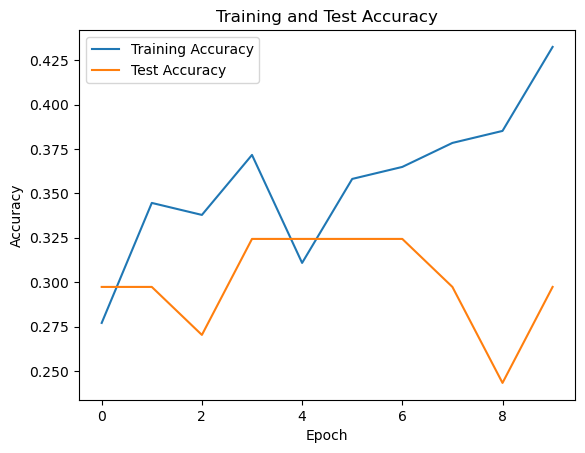

In [21]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Epoch 1/10
8/8 [==============================] - 36s 4s/step - loss: 1.1036 - accuracy: 0.3243 - val_loss: 1.1099 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 38s 5s/step - loss: 1.0979 - accuracy: 0.3446 - val_loss: 1.1013 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 37s 5s/step - loss: 1.0985 - accuracy: 0.3446 - val_loss: 1.1011 - val_accuracy: 0.2973
Epoch 4/10
8/8 [==============================] - 37s 5s/step - loss: 1.0987 - accuracy: 0.3716 - val_loss: 1.0991 - val_accuracy: 0.2432
Epoch 5/10
8/8 [==============================] - 37s 5s/step - loss: 1.1003 - accuracy: 0.3649 - val_loss: 1.0979 - val_accuracy: 0.2973
Epoch 6/10
8/8 [==============================] - 37s 5s/step - loss: 1.0980 - accuracy: 0.3581 - val_loss: 1.0982 - val_accuracy: 0.2973
Epoch 7/10
8/8 [==============================] - 37s 5s/step - loss: 1.0971 - accuracy: 0.3784 - val_loss: 1.0987 - val_accuracy: 0.3243
Epoch 8/10
8/8 [==================

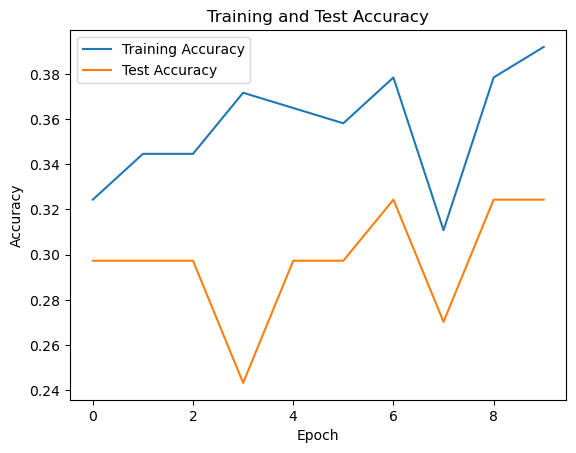

In [22]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Epoch 1/10
15/15 [==============================] - 63s 4s/step - loss: 1.1027 - accuracy: 0.3176 - val_loss: 1.1032 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 63s 4s/step - loss: 1.1011 - accuracy: 0.2703 - val_loss: 1.0978 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 63s 4s/step - loss: 1.0990 - accuracy: 0.3514 - val_loss: 1.1053 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 63s 4s/step - loss: 1.0982 - accuracy: 0.3514 - val_loss: 1.1018 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 63s 4s/step - loss: 1.0980 - accuracy: 0.3649 - val_loss: 1.1001 - val_accuracy: 0.2162
Epoch 6/10
15/15 [==============================] - 62s 4s/step - loss: 1.0950 - accuracy: 0.3784 - val_loss: 1.0998 - val_accuracy: 0.2432
Epoch 7/10
15/15 [==============================] - 63s 4s/step - loss: 1.0944 - accuracy: 0.3851 - val_loss: 1.1013 - val_accuracy: 0.3243
Epoch 8/10
15/15 [==

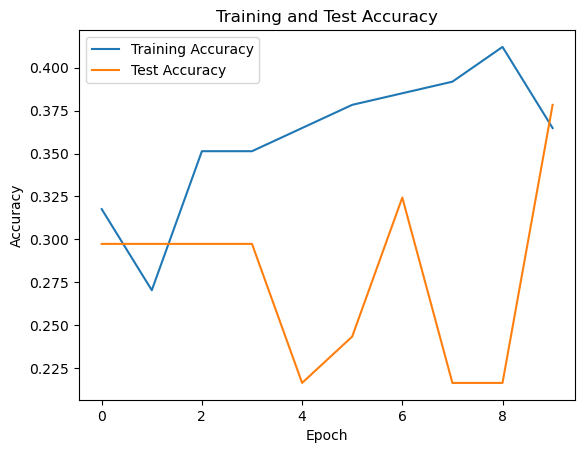

In [23]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Epoch 1/10
8/8 [==============================] - 35s 4s/step - loss: 1.1029 - accuracy: 0.3446 - val_loss: 1.1061 - val_accuracy: 0.2973
Epoch 2/10
8/8 [==============================] - 38s 5s/step - loss: 1.0983 - accuracy: 0.3581 - val_loss: 1.1001 - val_accuracy: 0.2973
Epoch 3/10
8/8 [==============================] - 39s 5s/step - loss: 1.0977 - accuracy: 0.3986 - val_loss: 1.0968 - val_accuracy: 0.4324
Epoch 4/10
8/8 [==============================] - 38s 5s/step - loss: 1.0984 - accuracy: 0.3784 - val_loss: 1.0959 - val_accuracy: 0.4595
Epoch 5/10
8/8 [==============================] - 39s 5s/step - loss: 1.0972 - accuracy: 0.3581 - val_loss: 1.0993 - val_accuracy: 0.3243
Epoch 6/10
8/8 [==============================] - 39s 5s/step - loss: 1.0966 - accuracy: 0.3851 - val_loss: 1.0987 - val_accuracy: 0.3243
Epoch 7/10
8/8 [==============================] - 39s 5s/step - loss: 1.0963 - accuracy: 0.3649 - val_loss: 1.0998 - val_accuracy: 0.2973
Epoch 8/10
8/8 [==================

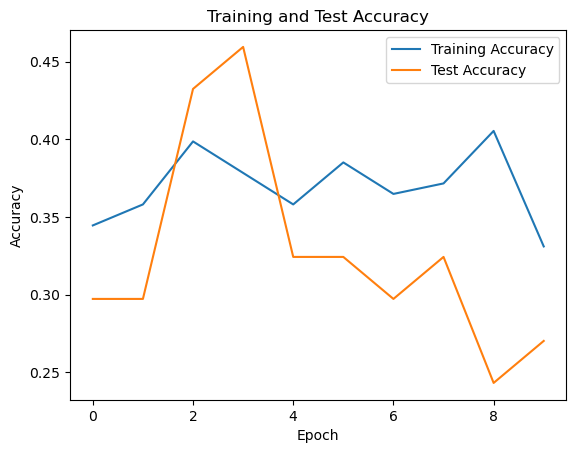

In [24]:


from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [25]:
# Substitute word by contextual word embeddings (BERT, DistilBERT, RoBERTA or XLNet)
aug = naw.ContextualWordEmbsAug(
    # Other models include 'distilbert-base-uncased', 'roberta-base', etc.
    model_path='roberta-base', 
    # You can also choose "insert"
    action="insert"
)

augmented_texts = []
for t in texts:
    augmented_text = aug.augment(t)
    augmented_texts.append(augmented_text)
    print("Original:")
    print(t)
    print("Augmented Text:")
    print(augmented_text)

Original:
feeling upset ’ know might underlying cause hormonal change past trauma depression stress find feeling low cry without obvious reason might wonder ’ going often nothing worry — might feeling extra sensitive today case may cause ’ thought yet feeling sad natural part life fact sadness benefit like helping u process difficult event connect others ’ always make easier moment however feel today know ’ alone many way find joy people feel sad lot reason — ’ also possible feel sad reason think sometimes seemingly small disappointment affect think leaving upset long afterward might connect current sadness happened feeling lonely experiencing rejection relationship issue major lasting effect feel even lack sleep feeling hungry put sour mood day case might deeper cause factor like depression trauma grief hormonal change affect mood without conscious awareness year yet may affect emotion every day consider setting time aside sit emotion work ’ causing may find answer ’ ok — sometimes fi

Original:
sadness natural emotion everyone experience various time life feeling sad reason may related hormonal change lack sleep stress factor sadness affect people different way people may want cry spend time alone comfort-related activity feel happier occasional sadness normal however feeling sad week sadness affecting everyday functioning may indicate serious underlying cause depression article explores person may feel sad apparent reason tip feeling happier speak doctor feeling sad fluctuation hormone significantly affect person ’ mood sometimes lead unexplained sadness hormonal change menstrual cycle including fluctuation estrogen progesterone affect someone ’ mood month premenstrual syndrome pm common make person feel sad start menstruation according office woman ’ health feeling sadness known baby blue typically last day birth occur due hormonal fluctuation coupled new challenge however sadness persists longer week person may postpartum depression depression pregnancy affect pe

Original:
feeling sad time specific reason ’ always mean depression suggest could experiencing something complex sadness alone sadness temporary state often clear cause like big disappointment loss someone close bad news someone love type sadness fluctuate throughout day certain moment emotional burden might feel particularly heavy might cry often feel numb drained struggle concentrate time — get lost something enjoy loved one distracts — sorrow may seem light enough barely feel weight might linger form day week generally begin ease naturally persistent sadness something else entirely wrap around like heavy blanket muffling sensation joy everyday life sadness leave feeling low empty defeated ’ know caused unhappiness idea start feeling better feeling sad ’ unusual sorrow normal human response disappointment loss sadness ’ clear reason behind ’ seem improve however may suggest something else going everyone depression feel sad unexplainable sadness ’ seem shake one primary sign depressio

Original:
day feel sometimes feeling sad happen apparent reason occasionally sadness natural time ’ perhaps symptom depression good news plenty useful tool available people living unexplained sadness one psychologist dr jessica valentine explains possible reason behind feeling sad make feel better normal feel low understand coming sometimes memory deep rooted childhood painful situation might blocked people feel low various reason know feel low wintertime ’ enough sun manage diet exercise meditation travelling feeling low loss breakup ‘ reason ’ normal work psychologist like piece information together find ‘ triggering ’ feel way often people feel low happy life feel like life mundane help restore balance life using simple technique sudden low mood sadness sign depression various type depression someone could feeling melancholy feeling low without knowing side spectrum someone could symptom severe depression could result trauma one 's life client feeling low vitamin deficiency often an

Original:
everyone feel sad sometimes like everyone feel joyful angry proud plenty emotion word everyone feeling feeling always changing sometimes feel happy ’ fun sometimes feel sad lose loved one whatever feeling real part living negative emotion may even help world focus happiness treat unhappiness unnecessary useless feeling sadness slow make really think life feeling people around help keep sight relationship dream word sad ’ mean coping situation rather help come term situation move important emotion help adapt accept focus persevere grow ’ good news learn manage sadness use different word talk sadness agony anguish broken heart hurt sorrow dejection dismay homesickness distress unhappiness emotion occur response negative unexpected situation life change sadness often occurs time feeling anger stress guilt grief anxiety hopelessness sometimes feeling may strong ’ realise sad sadness feel like may change feel physically perhaps stomach ache headache ’ sleep sadness may also change

Original:
boise state university boise state university boise state university boise state university alert successfully added sent notified whenever record chosen cited manage alert preference click button please log account depression common mental illness u.s. adult experienced major depressive episode unfortunately depression extends teen young user well researcher observed increasing rate recent year adolescent young adult especially among girl woman people barrier fight disease tend hide symptom receive treatment however protected anonymity share sentiment web looking help paper address problem detecting depressed user online forum analyze user behavior reachout.com online forum platform providing supportive environment young people discus everyday issue including depression examine linguistic style user post combination network-based feature modeling user connect forum result show network feature strong predictor depressed user combining user post linguistic feature achieve aver

Original:
everyone experienced sadness everyone experienced depression fact ’ never depressed chance ’ real grasp living complex mental illness like depression insidious affect mood also ability feel think function blunts sensation pleasure close connectedness stifle creativity worst shuts hope also often cause deep emotional pain person experiencing person ’ close family friend sadness alone ’ good gauge depression according american psychiatric association ’ apa current diagnostic statistical manual mental disorder dsm-5 diagnostic guide used mental health professional ’ experienced least five following symptom day nearly every day least two week may diagnosed major depressive disorder mdd also known clinical depression one know sure people become depressed others depression occur spontaneously without obvious cause ’ well documented ’ one depressive episode risk another later life increase psychiatrist today generally look depression “ bio-psycho-social ” term meaning see complex di

Original:
learn symptom different mental health condition tackle feel sad sadness difficult emotion deal result loss helplessness disappointment among many thing sadness one common natural human emotion however sometimes possible sadness deepen may sign suffering form depression feel though increasingly sad feel like sadness difficult explain information depression may help interested learning also check practical self-paced online program teach step-by-step strategy tackling symptom depression normal experience feeling sadness despair response life event loss major life change stress disappointment case sad feeling resolve come term change life situation loss feeling may persist month return significant time birthday anniversary related lost loved one however time enjoy thing sadness sign depression depression disorder characterised excessive sadness loss interest enjoyable thing low motivation depression common one three people experience episode major depression stage life case depr

Original:
many lifestyle change help ease burden living depression strategy work one person may right another trial error typical depression severe life-altering affecting quality life happiness live ’ also common condition affect people united state every year common technique may help managing symptom depression someone know crisis considering suicide self-harm please seek support ’ calling behalf someone else stay help arrives may remove weapon substance cause harm safely household stay phone help arrives exercising regularly one best thing mental health exercise help treatment prevention depression several key way type physical exercise help treat depression moving regularly help get benefit get exercise learn exercise depression brain research shown spending time social medium worsen feeling depression low self-esteem social medium addicting many people ’ necessity order stay connected family friend even coworkers even cutting completely ’ realistic lifestyle limiting social mediu

Original:
back depression adult key step take lift mood help recovery depression 's important take antidepressant prescribed even start feel better stop taking soon depression could return stopping suddenly also increase risk withdrawal side effect talk doctor pharmacist question concern medicine 're taking leaflet come medicine information possible interaction medicine supplement check doctor first plan take over-the-counter remedy painkiller nutritional supplement sometimes interfere antidepressant exercise healthy diet make significant difference quickly recover depression improve general health well healthy diet help lift mood fact eating healthily seems important maintaining mental health preventing physical health problem physically active lift mood reduce stress anxiety encourage release endorphin body 's feel-good chemical improve self-esteem exercising may also good distraction negative thought improve social interaction read exercise depression easy rush life without stopping

Original:
may particularly enjoy feeling sad may prefer experiencing emotion try avoid emotion together mental health professional want know people tend think sadness always bad say meaghan barlow phd assistant professor department psychology wilfrid laurier university waterloo ontario study self-regulation emotion aging “ 's absolutely view. ” distinct depression — world health organization note leading cause disability worldwide — sadness common emotion dr. barlow say right context sadness even helpful growing body research support point view barlow expert explain sadness impact well-being cope feel like much sadness “ emotional state unhappiness ranging intensity mild extreme usually aroused loss something highly valued ” according american psychological association apa sadness anger feel unpleasant distressing researcher sometimes lump two together umbrella “ negative affect. ” category also includes shame guilt anxiety fear irritability according research sadness anger distinct em

Original:
depression one common mood disorder united state cause persistent sadness limit person ’ ability go daily activity however depression treatable people recover lifestyle change medical treatment help individual feel better typically managing depression ongoing process article list strategy treatment help fight depression person know depression empowered find treatment work helpful learn depression general including cause symptom also important people get know symptom warning sign feeling worse identify knowing prompt depressive episode help people avoid manage trigger may reduce future depressive episode educating friend family member also help loved one watch warning sign supportive person difficult time reaching loved one help people get difficult time simply talking happening help also connecting others help reduce feeling loneliness isolation feel possible talk friend family member people may wish join support group see therapist keeping journal powerful strategy fighting 

Original:
eggshell therapy coaching eggshell therapy coaching table content feeling empty emotionally numb result emotional detachment syndrome known depersonalization feeling empty numb essence experience feeling disconnected surreal unable identify emotion emotionally numb also feeling empty detached outside observer life see life without living may also feel losing control thought action ever ask question feel empty like ’ even exist feel nothing feel emotionally numb happy upset feel detached loved one family friend look mirror feel like seeing someone else feel like robot running auto-pilot feel hollow little joy ups down life surreal feeling go day-to-day identify might struggling form dissociation known depersonalization feeling empty emotionally numb hollow prevalent emotion-phobic modern society- yet also one underestimated unaccounted condition “ louise often feel like part “ acting. ” time “ another part ‘ inside ’ connecting talking ” say depersonalization intense feel like

Original:
emotional numbness emotional blunting refers limited emotional response internal external event may symptom medical condition side effect medication emotional numbness create sense emptiness isolation disconnect rest world may notice people react event different way may difficult understand ’ feel way everyone experience emotional numbness way general may feel limited come emotional experience may muted response event used react may experience emotion yet outward expression may situation typically call sadness joy may feel either may make relating others challenging sign emotional numbness may include emotional numbness sometimes called emotional blunting difficult imagine experienced people describe feeling empty discouraged others report feeling isolated “ often feel invisible like ’ ghost watch family engaging feel like ’ invisible barrier keep joining ” describes amy h. experienced emotional numbness symptom depression “ ’ like submarine drifting undetected picking people

Original:
feeling emptiness ’ right chest yet ’ unsure came sadness melancholy boredom may little everything feeling way uncommon might call “ feeling empty ” someone else might call something different matter ’ real valid although overwhelming managed uncovering ’ lying underneath emptiness feeling might straightforward process ’ possible recommended first step toward resolution feeling emptiness might last day resolve time might linger two week longer case learning recognize cognitive distortion seeking support mental health professional help feeling empty sometimes manifest sense loneliness confusion life goal lack motivation pursue anything life everyone might feel void heart time time experience could many cause including shifting hormonal level losing job required physical distancing come pandemic life stage situation may require reflect life might also lead temporary feeling emptiness although every case feeling empty could also signify mental health condition depression bipolar

Original:
include product think useful reader buy link page may earn small commission ’ process psych central show brand product stand behind ’ hard describe feeling numb like ’ intuitively know ’ felt know ’ alone many people report feeling disconnected world around sometimes feeling “ flat ” feeling like life autopilot perhaps event people seem muted le colorful somehow also described chronically running empty feeling ungrounded hard time focusing losing track time throughout day feeling numb make hard connect others creates loneliness sense isolation experience emotional numbness also called “ affective blunting ” commonly associated depression also occur mental health condition medication linked state like dissociation depersonalization — feeling disconnected emotion surroundings good news emotional numbness usually temporary treatable article walk cause treatment self-help strategy additional resource ’ one answer question expert pretty good theory emotional numbness occur limbic 

Original:
young adult mental health substance abuse treatment center need help peruse frequently asked question today mark first day get started path healing work major insurance company optimize access care verify insurance discover make u different personalized treatment led expert field focus sustainable healing put young adult pathway success referring professional partner u providing sustainable healing male location offer wide range amenity experiential therapy self-discovery healing private serene home-like environment support young woman achieve long-term recovery based compassion founded clinical excellence integrated approach healing unparalleled featured many respected press outlet proud share expertise success story newport institute assembled best mental health leader rehab team country might seen phrase “ feeling emotionally numb ” list common symptom various mental health disorder really mean feeling numb inside different every individual general people describe feeling 

Original:
login login phrase `` dead inside '' popular across internet meme joke popular medium created around phrase `` dead inside '' collectively cry laugh concept feeling empty inside underneath humor 's actually going word `` empty '' may imply feeling nothingness however go beyond lack feeling study1 people bipolar disorder dealing feeling `` chronic emptiness '' found largely experienced `` feeling disconnection self others sense numbness nothingness frequent reduced functional capacity '' researcher also found feeling emptiness closely associated feeling purposelessness unfulfillment people study found feeling `` distressing '' impact daily life mental health professional concerned although 's common feel empty time time pleasant experience negatively affect live life may cause concern feeling emptiness paired lack motivation enthusiasm life persistent across many part life possible root cause feeling emptiness recent experience trauma lead feeling emptiness according steph tua

Original:
“ way react circumstance determines feelings. ” ~dale carnegie ’ felt like ’ drowning mud feel stuck worthless confused want move ’ evolves anxiety fear overwhelm if—just if—being stuck ’ problem perceive every year period feel “ stuck. ” yet look closer see “ stuck ” label give natural part life ’ time much happens anxiety come think otherwise start force work come idea make thing happen ’ get anywhere call stuck stuck except way perceive life write ’ stuck period last month difference struggle le ’ beginning let get stuck think something ’ think life different know ’ trying force something word like ” ” ” ” ” must ” enter mind relax surrender quiet period life thing seem okay see ’ control life notice life brings stuck like quicksand try get deeper sink mind want push control manipulate stem insecurity want secure loved remarkable think could control life would well ’ face reality thing begin lift three thing ’ stuck surrender stuck notice thought feeling within say ’ stuck

Original:
behavioral health primary care feel sad sometimes sadness normal emotion make life interesting sadness almost always accompanies loss say goodbye loved one usually feel sad sadness even deeper close relationship ended loved one died sadness also help u appreciate happiness mood eventually change sadness toward happiness sense contrast add enjoyment mood way experience normal sadness healthy way allow emotion enrich life great river 2-1-1 offer free confidential community information referral crisis hotline hours/day dial 362-8255 talk information referral specialist fri mar fri mar tue jan tue dec south ave. la crosse wi 782-7300
Augmented Text:
['behavioral health primary care feel more sad sometimes sense sadness normal emotion make life interesting sadness almost always accompanies loss say goodbye loved one usually feel sad sadness felt even deeper close relationship ended loved good one died sadness also help u appreciate happiness mood eventually change sadness toward h

Original:
close ’ normal get blue every ’ always easy separate sadness clinical depression learn warning sign get support need everyone sad day feeling time time part life giant storm cloud overhead ’ move could sign something serious ’ talking depression ’ mental health problem negatively affect way feel think act.1 depression make hard care put physical health risk good news depression treatable tough know people depression may wide range symptom symptom mimic everyday feeling think irritability lack energy worry ’ tell sadness could actually depression find help need work 1-on-1 virtual coach therapist ableto ’ tackle sadness first ’ emotional state unhappiness.2 feeling sadness slight intense last longer period death loved one depression sadness ’ mental health problem ’ always go away lingering sadness often symptom depression ’ certainly one depression make feel worthless.3 may even physical symptom body aches.1 cause depression also much complex stressful life event may spark de

Original:
science organization insight hard tell sad truth depression sometimes confuse two even though substantial difference ’ find underlies concept easily separate sadness depression sadness sad something hour time negative experience mood change week time get little better depression area life affected show combination depressive symptom day least two week causing general distress sadness basic emotion part make u human – everyone know feel like experiencing sadness might even helpful working difficult experience life rejection breakup disappointment depression hand mental illness mean show many different depressive symptom least two week thing brought joy cheered ’ help anymore feel constantly exhausted loss motivation persisting sadness one part depression likely thought behavior even physical experience changed alongside emotion causing general distress fundamental change perception attitude towards life emotion momentary conscious experience fade time emotion continues phase l

Original:
million people around world experience sadness depression point life feeling sad integral part depression anxiety depression association america adaa note depression one common mental health illness united state knowing understanding difference sadness depression help person recognize seek treatment article help reader make distinction suggest treatment option depression defining sadness depression important improving wellbeing sadness normal human emotion every single person experience stressful somber time number life event leave people feeling sad unhappy loss absence loved one divorce loss job income financial trouble issue home affect mood negative way failing exam getting job experiencing disappointing event also trigger sadness however person experiencing sadness usually find relief cry venting talking frustration often sadness link specific trigger sadness usually pass time pas person becomes unable resume normal function could sign depression low mood get worse last 

Original:
hilary jacob hendel lcsw thought going funeral used terrify walking room filled sadness grief evoked intense desire go anxiety could feel masked emotion wanted like sadness compassion secretly felt ashamed ’ “ right feeling '' death bothered presence sadness grief sadness make anxious turn vibrating heart-pounding emotional mess uncomfortable skin later came understand felt pressure fix sadness say right thing thought supposed cheer person suffering though problem solved eventually figured could fix someone ’ sadness yet visceral pressure fix ’ go away neither anxiety sadness core emotion evoked experience loss core emotion arises need validation flow push emotion energy hold get blocked blocked emotion hurt u blocked emotion put stress mind body eventually causing symptom like depression anxiety rumination high blood pressure stomach problem let emotion flow need feel safe enough experience learning expect experiencing emotion help make experience manageable le scary even le

Original:
global pandemic life stressor coronavirus pandemic caused array negativity perhaps one biggest collective underlying feeling grief cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy people sad state world losing loved one restriction mask rule ’ grieving old sense normal long lost routine change year brought considered ’ wonder global pandemic perfect storm situational depression unlike clinical depression type sadness often triggered traumatic stressful event change life behavioral health therapist jane pernotto ehrman med rches acht discus situational depression treat might already experienced episode situational depression past without even knowing trigger include “ many people experiencing situational depression right covid-19 without even realizing ’ actually happening ” say ehrman “ might asking ‘ feel sad angry ’ ‘ exhausted time ’ maybe ’ hard time focusing work school. ” depres

Original:
expert provide tip help ease past short-term melancholy editor handpick product feature may earn commission link page come nowhere rhyme reason follow crushing breakup loss someone special particularly tough time slowly roll turning pit hit suddenly without warning whatever form come sadness something experience—and yet still incredibly difficult get past 's thing learn stop sad tried-and-true method require dig deep way beat blue incredibly simple—spending time outside watching show 's practically guaranteed make laugh yes cry eye spending day couch pint chunky monkey one hand favorite glass red scientifically-proven technique letting go sadness unfortunately one thing note 're still feeling upset period two week notice symptoms—like loss energy trouble concentrating difficulty sleeping—you reach professional help ahead psychologist mental health expert share top tip stop feeling sad regardless 's triggering something negative happens life seem like world ending instead supp

Original:
everyone experience bad day depression day seem particularly challenging ’ permanent symptom depression take many form may manifest different way different time living depression experiencing sadness may also experience debilitating sense loneliness emptiness hopelessness future day may feel depression symptom intensify difficult go usual routine developing specific coping skill help go bad day depression even feel darkest world health organization report nearly adult globally million people worldwide live depression united state number hovers around according national institute mental health bad day ’ sign depression live depression bad day mean symptom intensify impact routine usual ’ natural feel discouraged disheartened happens may feel like ’ taking step backward nothing work depression untreated depression could one reason may feel symptom intensifying ’ treating depression factor contribute bad day example antidepressant may stopped working ’ living symptom condition c

Original:
`` simplify life '' 're asking question n't sure start next take quiz find bemorewithless simplify life declutter mind connect heart author courtney carver love sitting still le finding way le ’ practicing year sometimes forget slowing take work practice ’ recently recognized sometimes essential occasionally busyness well deserved distraction especially really sad get like everyone else ’ rare really sad ’ need much happy expressing gratitude make happy usually feeling joyful week little different daughter leaving today australia year ’ happy excited big adventure already missing visiting know touch often love close time spend together ’ preparing still feel sad mention might gone year guinness 8-year-old pup aggressive form bone cancer last thursday took vet thought pulled muscle tendon got really bad news family working shocking news trying keep pain managed thoughtfully considering treatment option none easy good outcome said nothing ’ dog came life within week diagnosed m

Original:
“ secret joy mastery pain. ” anais nin eighteen got depressed stayed depressed little year year every single day battle year every single day felt heavy pointless since made tremendous progress becoming self-aware practicing self-love noticing infinite blessing possibility life still day familiar old feeling sneak ’ always self-aware ’ always love sometimes agonize everything ’ ’ accomplished call day “ zombie days. ” ’ completely shut desperately look way distract feeling suspect zombie day time time think ’ important give permission always happy also simple way improve mood ’ feeling everybody different everybody different way dealing pain ’ looking suggestion may find helpful 1. step back self-reflect whenever start feeling depressed try stop reflect get root feeling 2. reach someone used bottle feeling fear would judged talked ’ since learned reaching loving understanding person one best thing 3. listen music music heal put better mood make feel le alone take mental journ

Original:
“ rock bottom became solid foundation rebuilt life. ” ~j.k rowling ’ stranger feeling hopeless defeated many failed relationship physical sexual emotional abuse entire life two bankruptcy recent loss online business october could say ’ enough last two lifetime ’ admit many time wanted end many day ’ know much could handle recent loss devastated beyond word everything ’ worked hard last three year completely obliterated ’ numb feel defeated almost every day fifty-eight year old starting ’ interest choice know expect ’ ’ ugly messy frustrating stressful exhausting every day wake ’ really feel like getting computer work ’ really feel like anything honest lay bed cry go serious wave anxiety throughout day hit fast hard without warning want throw want curl ball die want someone tell bad dream tomorrow thing back normal none happens force get work start new day pain pain chaos chaos matter look like never let anyone tell feeling ridiculous ’ ever think ’ overreacting feeling real n

Original:
person may experience “ feeling blue ” emotion sadness feel although possible feel blue apparent cause usually happens reason people blue might feel unhappy tearful lack energy motivation isolate although feeling blue may drain individual usual optimism enthusiasm happiness temporary typically interfere daily activity article discus mean feel blue sign look also examines difference feeling blue depression overcome blue get help feeling blue idiom describes experience sadness melancholy poetic succinct way communicate feeling occasional sadness typical person feel response daily experience face difficult circumstance mood reflect people usually identify cause sadness feeling blue determine trigger helpful think recent life change difficulty contributing low mood main symptom feeling blue include sadness lack motivation wanting spend time alone symptom generally mild pas relatively quickly people may blue many reason following person identifies cause sadness take step work impr

Original:
target circle week shop expert-approved deal section show follow today brand nineteen million american adult suffer clinical depression staggering figure everyone sad sometime life tell difference clinical depression feeling sad u worry feeling sadness anxiety mean something wrong need go medication others may clinically depressed feel ride let thing get resolved time seek professional help eighty percent people screened positively depression treatment time percent never treatment lot myth strong enough could fight depression sheer fact percent people believe depression personal weakness absolutely correct depression caused combination biological psychological social factor also highly treatable make especially distressing many people never seek treatment depression depression grief feeling upset mourning loss completely appropriate even important processing loss feeling sadness divorce losing someone close losing job move normal require treatment wise talk others find suppor

Original:
feeling bit blue lately might call gloominess dump could briefly feel little clear reason often trace sadness come blue mood specific circumstance so-called blue might feel sad tearful want spend time lack usual energy motivation feeling usually tend pretty mild though generally pas long temporary blue might sap usual cheer generally ’ keep typical daily routine totally ’ necessarily bad thing ’ common view unhappiness sadness negative thing emotion significance even unwanted one low mood may feel good ’ true occasional sadness much normal part life though feeling emotion change response day-to-day experience ’ tough time ’ probably notice mood reflects challenge ’ facing feeling blue alert fact something ’ quite right life help take step identify cause low mood make change could help feel better short ’ unusual feel little time time particularly facing loss difficult situation ’ immediately identify cause might help take closer look recent change problem life — even period b

Original:
feeling blue something go rather cycling downwards negativity spiral let ’ correct course action help fight blue good article ’ share thing ’ feeling blue suggestion list tested someone experienced blue lot life ’ likely find trying one even suggestion list end changing mood pretty quickly let ’ fight blue tactic time believe taking shower therapeutic healthy way combat feeling blue often ’ experiencing bit depression self care routine go window however cleansing body washing hair refresh many people history talked healing power water help wash away sadness day ’ feeling bit groggier usual try washing lavender soap shampoo known helping people depressive even anxiety driven state check article feeling anxious number one cause feeling blue thought thought powerful enough make cry even nothing bad happening best way overcome feeling blue learning overpower mind regular meditation practice thought control mean left brain overactive minimize practice meditation build right brain 

Original:
written published updated point u experience feeling blue many stressor life ’ completely normal feel also moment may experience dump without clear reason time feeling pas even ’ feel like moment sometimes ’ easy get trapped cycle negativity find spending substantial amount time enveloped sadness sadness normal emotion feeling sadness persistent may depressed ’ important differentiate feeling blue depressed explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist feeling blue little mean feel sadness ’ common experience range emotion go different thing life time though people feeling bounce back also blue usually mild compared depressed hand sadness excessive interferes daily life may experiencing depression clinical depression also referred major depression medical condition usual ups down life symptom depression include time 

Original:
chance day feel dump might feel sad tearful sensitive maybe feel discouraged groggy sluggish perhaps find wanting spend time alone might know ’ causing might clueless brought feeling either way ’ feel like luckily thing combat day saying “ feel blue. ” might feel good blue normal everyone feel time time even ’ know many people use feeling blue depression interchangeably ’ important know difference feeling blue meaning characterized sadness gloominess feeling typically last hour day easier shake might lack typical level energy motivation ’ likely able go daily activity feeling blue depression however last much longer –usually month even years– includes symptom sadness might experience significant change weight lack energy difficulty concentrating loss interest daily activity insomnia feeling helplessness hopelessness guilt believe experiencing depression consider contacting doctor mental health professional get appropriate treatment cause feeling may apparent identifying trigg

Original:
sign sign sign sign pradeep bhatt follow mind -- listen share feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control centre feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate 

Original:
explore wonder mind feeling sad something go ’ part human triggered various life event daily pressure ever wondered ’ really going inside brain ’ feeling blue come fascinating journey u explore science behind sadness brain reacts universal emotion 🧠 mentalhealth emotionalwellness understandingsadness brain intricate organ body orchestrates emotion including sadness experience sadness multiple brain region collaborate conducting symphony chemical reaction electrical signal deep within brain lie amygdala often called “ emotional hub. ” ’ like control center feeling especially sadness recognizes emotional trigger communicates brain part responsible advanced thinking decision-making prefrontal cortex help u deal emotion especially ’ sad assist u finding solution coping strategy hippocampus vital creating preserving memory affected sadness lead u dwell negative thought influencing emotional state emotion including sadness result intricate chemical process brain serotonin dopamine 

Original:
home » general health post » feeling blue ’ know ever felt blue christmas ’ talking color blue idiom mean feeling sad gloomy normal ups down problem every year feel like seasonal allergy instead stuffy runny nose suddenly feel depressed ’ like everything happens make sensitive ’ period happens man woman ’ always hormone ’ always feel heavily depressed like gloominess feeling bit sadness natural emotion tell ’ something wrong ’ seasonal blue symptom starting bother article ’ covering everything need know feeling sad ’ giving list tip cope common problem list warning sign may need professional help mental health complex unnoticeable stimulus sometimes trigger emotion smell take back childhood year lost pet ’ notice neuron connection happen right sadness suddenly triggered unconscious mind even obscure difficult understand plain sight may reason sadness rooted personal history difficult trace heal u type unconscious trigger ’ alone thus feeling blue apparent reason feel immediat

Original:
jump content in-person care minor illness in-person care moderate illness injury virtual care walk-in care clinician ongoing care wellness everyone resource vaccination booster get personalized coordinated care across northern california sutter network make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research education lead better healthcare outcome join robust training program led nationally known healthcare leader explore way provide innovative compassionate care network shape future healthcare build career within diverse team get personalized coordinated care across northern california sutter network make appointment message doctor patient portal make appointment message doctor patient portal access award-winning comprehensive primary specialty care whole family convenient care option everyday health need contribution medical research educat

Original:
danielle bernock feeling blue happens u due seasonal affective disorder recent disappointment coming emotional high ’ negative emotion blue intoxicating make hard feel better want remind you—you feel better know way feeling better start with—wanting although deciding want feel better ’ enough ’ start choice superpower ’ decided want happier ’ show way know help stop feeling blue may need one whatever – something want ’ blue make worse read way find something sound good something ’ enjoy ’ feeling blue ’ busy fun whether suffer seasonal affective disorder winter le sunlight summer body notice brighten surroundings turn light get lightbox light therapy study show even minute day simulate antidepressant sun come open blind let sit window look smile change surroundings stop feeling blue read see first choice reveal true personality many people like take vacation winter everyone go ’ know might type google “ place visit _______ ” town area may come ton option pick one stop feeling

Original:
sign sign sign sign viemina follow -- listen share feeling blue idiom mean feeling sad melancholy downcast often used describe temporary mood sadness feeling emotionally low word “ blue ” context represents color associated sadness downhearted feeling people might say “ feeling blue ” ’ experiencing sense unhappiness loneliness emotional distress ’ common way express mood without going specific detail might causing sadness feeling blue inherent element human experience ’ moment heart speak u quiet subtle language temporary symphony sadness whisper thought feeling reminding u even amidst life ’ vibrant color time emotional canvas painted shade blue unpleasant emotion common part life every individual person experience point another feeling blue normal abnormal ’ important remember low mood serve purpose usually indicates something wrong understanding reason behind low mood take step towards making positive change ’ impossible always happy ’ important make effort cheer ’ feelin

Original:
learning warning sign help push back episode depression ’ experienced depression know feeling helplessness hopelessness creep thought episode begin sensation depressed come certain familiarity cleveland clinic non-profit academic medical center advertising site help support mission endorse non-cleveland clinic product service policy knowledge power use advantage “ ’ necessarily stop cure depression reduce severity episode using effective readily identifiable coping tool ” say psychologist adam borland psyd seven way push back depression feel coming early signal feeling depressed sleep pattern change suddenly start eating le become irritable withdraw family friend learning sign depression offer chance act early head episode “ take proactive step stop depression advancing ” say dr. borland many people begin isolate start feeling depressed fight urge withdraw ’ almost guaranteed make feel worse reach trusted family member friend coworkers clergy talk ’ feeling ’ seeing therapist

Original:
“ sorrow come all… perfect reality possible except time realize ever feel better yet sure happy again. ” – abraham lincoln sorrow opposite happiness yet part human existence like life death changing season familiar enough recognize thing sequence sometimes sequence time birth rebirth creative force era failure negativity time however ’ clearly defined sense decay lack progress mistake ending key overcoming sorrow sadness remember get past time — even though ’ possibly see present adage say time heals wound includes wound pain sorrow might think feel like ’ experiencing broken heart perhaps break-up relationship death loved one distancing friend temporary emotional distress ’ last forever – unless become clinically depressed case need help medical professional psychiatrist prescribe medication ease depression begin psychotherapy assist better coping clinical depression telling someone – even – ’ get ’ really help situation ’ probably finding little comfort pouring heart friend

Original:
treatment service health equity u author staff writer make easy change counteract feeling depressed long stretch gray day get fair share back-to-back-to-back gloomy day midwest huh people lead seasonal affective disorder sad type depression affect people time year typically winter say ken yeager phd clinical director stress trauma resilience star program ohio state university wexner medical center note woman seasonal affective disorder common men young people higher risk condition starting often 20 `` people circadian rhythm biological clock driven serotonin melatonin level thrown course prolonged dreary weather ” yeager say quick lesson serotonin melatonin level serotonin chemical messenger body produce nervous system thought affect mood appetite body make hormone melatonin part help feel urge sleep wake low amount sunlight may trigger reduction serotonin affect mood yeager say gray day also wreak havoc body 's melatonin level making harder people get started dark morning la

Original:
thehealthfeed.com 's question medically reviewed madeline hubbard rn bsn ever feel weather get colder day get shorter ’ normal mood change slightly season mood change severe interfere daily life may health condition called seasonal affective disorder sad sad type depression ’ tied certain time year symptom usually start late fall last winter ’ also le common form happens late spring summer sometimes called “ summer sad. ” experience seasonal affective disorder ’ alone — affect around adult united state learn symptom cause treatment option sad many symptom seasonal affective disorder similar form depression difference sad symptom always begin certain time year go away season change symptom sad include summer sad different symptom example instead gaining weight oversleeping people summer sad may lose weight trouble sleeping sad also lead thought death suicide loved one show sign depression ’ important talk doctor mental health professional right away find symptom caused sad ano

Original:
purchase link site may earn affiliate commission ’ work ready feel truly happy content 's ... feel today would consider feeling content 're quite sure answer question 're alone whether 's finding long-lasting love career n't feel like work simply freeing time dedicate hobby feeling content area life something strive good news journey happiness made simpler tip trick 've done research got science-backed tip feel happy content help feel best want feel content happy contentment feel great 's actually good u content linked improved immune system physical function living longer mention feel good people around likely feel good often though feel like something missing life maybe dream job n't fulfilling hoped relationship believed would complete u n't n't feel like enough time day actually enjoy life thing control good news learn start feeling content happy contentness definitely possible usually take le work think read sign 're feeling content 're ticking go finding true happiness 

Original:
language one fondest memory six year old promise father mind ’ let slip away— “ make discover whole world. ” ’ know covering entire planet something to-do list handle age ’ somehow—maybe even simple manifestation—had privilege discover country year beautiful earth ’ road trip writing blog say feel liberated travel expands capacity wonder joy appreciation amazing diversity planet moment simply ‘ ’ allows u let go stress tension enjoy moment travel one guru many reasons—and ’ like share travelling help u feel like best self ’ willing receive world ’ many lesson matter shape size help u recognise shared humanity others dissipating fear misunderstanding ’ way fun love world afraid best alternative gaining knowledge book travelling according neuroscientist travel rewire brain new experience key building new neural pathway brain rewiring brain become creative accepting new idea travel make happy also take u comfort zone inspires u see taste try new thing constantly challenge u adap

Original:
share article ’ doubt mind travelling good morale going vacation keep smile face long departure ’ benefit – memory – gain travelling numerous reason travel make u happy least ’ assumption ’ like make discovering result study done cornell university 2017. according researcher spending money experience rather physical object make u happier reason “ adapt ” object mean happiness feel following purchase fade time get used experience hand continue bring u joy every time think according study booking.com reported marie claire traveller surveyed find first experience abroad boosted confidence amandine legrand psychologist blogger un sac sur le do belief travel good self-confidence offer many opportunity excel without external pressure pace travelling especially solo opportunity discover limit broaden horizon visiting new place allows u reconnect inner “ self ” really want without influence entourage let u explore world exploring ’ trying say inner journey important physical journey 

Original:
inspired tailor-made travel latin america africa asia australasia europe polar region travel good lot thing also increase mental well-being short-term whether 're traveling business one-week family holiday sold everything pursue life road traveling make happier person building self-confidence providing new experience memory breaking routine allowing meet people world keith jenkins founder luxury travel blog velvet escape prolific traveller said feel happy 'm gaining new experience insight challenging boundary travel perfect catalyst happiness allowed experience natural cultural man-made wonder world foreign land also continuously force step comfort zone great confidence-builder book travel best school 've learned much world importantly marilyn tam entrepreneur author happiness choice travelling emailed ask take happiness travel 'm travelling right yes indeed happy myanmar learning appreciating another culture tam worked minister home culture myanmar first prime minister bhuta

Original:
getting started written divethru team reviewed natalie asayag msw lcsw sun shining bird singing mood delightful feeling delightful simply best ’ talk feeling ’ want negative nellies hard find moment joy ’ lot stress ’ feeling happy overall ’ time recognize moment delight ‘ cause ’ underrated feeling delightful tie mental wellbeing wow great question ’ got answer let ’ dive thru feeling delightful show ’ linked mental health deeee-lightful word use often huh ’ kinda fancy everyday use sound like response ’ get 83-year-old british grandmother asking cup tea ’ delightful dear get idea mean feel delightful exactly dictionary.com defines delightful “ adj giving great pleasure delight highly pleasing. ” okay taking pleasure something make sense ’ hopefully felt emotion sooo many thing life make u feel delightful even little thing like getting massage stressful week feeling knot ache melt away ordering pizza ‘ cause ’ feel like cooking day ’ receiving super sweet card birthday crack

Original:
subscribe often get end busy week relish idea nothing weekend feeling satisfying saying 'oh nothing really colleague ask evening plan stressful day work new study david lloyd club finding per cent people asked would rather free weekend nothing one filled plan might ask 'why feel happy nothing answer could lie fact 're busy time survey revealed per cent people ’ remember last time switched per cent ’ know “ human ’ designed constantly busy brain functioning 24/7 ” caution julie leonard founder happiness club community busy life need antidote often feel happy nothing 's laziness 's necessity “ need time decompress process day thought emotion rest essential complete stress cycle reset back healthier level '' julie add psychotherapist founder luxe psychology practice jade thomas agrees adding `` resting nothing allows brain reset help u regulate emotion maintain ability focus might also notice enhances creativity help make better decision '' jade add busy often overwhelming stres

Original:
becoming minimalist le live written guest · comment note guest post jay harrington life whim long brutal winter feel great outside t-shirt even temperature ’ climbing much beyond fifty degree northern michigan community recently buried snow people force combing beach rock riding bike hiking trail cruising paddleboards celebrating spring ’ arrival addition short sleeve lot people wearing beaming smile face happiness air true despite fact weather ’ even great—it seems great relative ’ used come fall however long hot summer start longing cool crisp air even u first snowflake flying signal coming ski season cycle expectation adaptation repeat human always chasing rainbow want something—be different weather better job bigger house—but shortly getting want something different adapt circumstance become “ new normal ” want want happier life phenomenon called “ hedonic adaptation. ” ’ term coined psychologist brickman campbell 1970s explain tendency human being chase happier life retu

Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly yearly habit help kickstart quest remember everyone ’ version happiness little different path achieving habit create added stress ’ fit lifestyle ditch little time practice ’ figure ’ work following daily habit may help achieve happiness life tend smile ’ happy ’ actually two-way street smile ’ happy smiling cause brain release dopamine make u happier completely foolproof researcher found link smiling happiness could attributed “ facial feedback hypothesis ” facial expression may modest influence emotion mean go around fake smile plastered face time next time find feeling low crack smile see happens try starting morning smiling mirror exercise ’ body regular exercise help reduc

Original:
make intentional choice every day worry le live happier fulfilling life impact life trickle onto surrounding n't get caught much life forget enjoy thing truly matter would one thing without receiving paycheck rest life would question goal important exercise help determine quest purpose one step finding purpose look within identify talent passion find something world need passionate medical professional align strength need see problem solver making meaningful difference time currency life allowed enjoy limited period ’ easy get caught worrying future forget enjoy simple pleasure life ’ ’ travelling train deep thought mind constantly wandering contemplating thing need get done worrying unknown make anxious training mind present help appreciate time presently enjoy every moment human being highly social creature thrive human being company surrounding genuinely care numerous benefit person social connection help cope anxiety sadness enable emotionally intelligent increase self-es

Original:
copyright © entrepreneur medium llc right reserved entrepreneur® related mark registered trademark entrepreneur medium llc deep patel • jul share opinion expressed entrepreneur contributor 's unfortunate reason happiness often elusive -- brain simply n't wired way instead brain evolved survive protect keep u safe sure moment elation period contentment bliss many u plagued persistent negative emotion -- plain stuck `` blah '' find joy life like anything else take practice cultivate ongoing happiness sense reset baseline wo n't happen overnight top thing every day discover secret living happier life find long-term happiness need retrain brain negative mindset positive mindset try thing spend one two minute looking positive life three time day day brain start automatically choose positive mantra day -- something repeat `` today beautiful '' `` feel grateful '' thing go south take moment try see positive light never underestimate importance recognizing silver lining life related 

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
happiness ’ something aim along health wealth success endeavour however finding happiness everyday life difficult task much sought-after emotional state happiness appear briefly influenced many issue work life making difficult find guide calmer ’ founder tania diggory explores happiness find happiness within simple step try feel happier regular basis happiness mental state experiencing positive pleasant emotion experience many people define happiness feeling intense joy may make harder feel like ’ happy everyday life fact many level happiness starting sense contentment ranging exhilarating jubilation many u set quest reach exhilarating happiness high regular basis often end disappointment instead happiness try focusing contentment contentment mental state experiencing satisfaction present state often felt practicing mindfulness feeling comfortable mind body surroundings experience range emotion day helpful practice finding contentment regular basis next time take tea break si

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
happiness positive pleasant emotion ranging contentment intense joy moment happiness may triggered positive life experience thought sometimes may arise obvious cause level happiness longer period time strongly correlated level life satisfaction subjective well-being flourishing eudaimonia common usage word happy appraisal measure shorthand `` source '' happiness example `` find happiness life '' finding meaning life emotion precise definition happiness perennial debate philosophy `` happiness '' subject debate usage meaning possible difference understanding culture word mostly used relation two factor usage include factor subjective well-being swb b includes measure current experience emotion mood feeling life satisfaction c instance sonja lyubomirsky described happiness `` experience joy contentment positive well-being combined sense one 's life good meaningful worthwhile `` eudaimonia greek term variously translated happiness welfare flourishing blessedness xavier landes pr

Original:
stardust somehow came alive one know happened – one know created life yet – alive tiny speck dirt water floating endless space people including u mystery called life sacred fill u awe wonder site relax mystery present every moment site aware ’ obvious finding something ’ hidden lost ’ connecting ’ sacred experience belief faith experience life already sacred reverence enough – faith belief need even figure unless want short site replace word thought life direct experience life evaluate trust experience connecting directly sacredness increasing inner peace love fellowship goodness life “ altogether result neuroscience religion thus far suggest strongly religious instinct indeed exist … … surely exist way find spiritual fulfillment without surrender enslavement. ” edward o. wilson meaning human existence social conquest earth long ago ancestor created religion spirituality promised inner peace love fellowship goodness connection ’ sacred today people still want promise fulfille

Original:
implement simple tip find joy ’ perfectly normal feel though ’ joyful version moment life general might find wondering happy “ happiness absence negative emotion abundance positive one pursuing life meaning purpose living accordance value ” explains judy ho ph.d. clinical neuropsychologist manhattan beach ca “ inevitably come across high low emotionally lead deeper sense joy. ” happiness may look different everybody number change habit big small lead joyful path creating new habit routine difficult “ often simple lifestyle change profound influence mental health ” explains joshua hick ph.d. professor department psychological brain science texas university ’ ’ crafted list simple habit increase level joy fulfillment ahead find expert-backed tip help lead fuller content life know might find process might seem like happiness feed gratitude actually work way practicing gratitude “ lead people feeling positive emotion feeling increase motivation engage life make healthy choice ” e

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
becoming minimalist le live written joshua becker · comment last updated may happiness state mind specifically state “ well-being contentment. ” definition tricky assumption word cause confusion many ’ even realize learning happy something intentionally practiced people hear word ‘ happiness ’ assume speaking emotion pleasure joy people feel immediate reason people say “ ’ pursue happiness seek joy happiness fickle fading joy remains forever. ” short-term definition happiness everyone understands word define mean long-term satisfaction fact speak experiencing happiness life thinking short-term emotion think quality living—a much longer-term view word definition understood correct speak different reality really different ’ think long-term experience life satisfaction almost certainly made many short-term feeling joy pleasure mean every day great day trial temptation downturn certainly mean look back many season life look back satisfied navigated long-term feeling life satisfac

Original:
page last updated november 2023. want much good possible resource one real-life choice face 6,000 could option good challenging question – possibly compare saving life reducing poverty treating mental illness happier life institute believe ’ possible answer question comparing effect people ’ subjective wellbeing self-reports happiness life satisfaction ’ taking approach lead surprising result following section introduce key idea guiding principle define approach throughout ’ find many link growing list research report well academic literature draw begin general overview expanding idea greater depth think wellbeing people feel life i.e happy satisfied talk good u really mind improving people ’ wellbeing ‘ wellbeing ’ believe people ’ subjective wellbeing ultimately care health wealth ’ important matter improve subjective wellbeing even think happiness life satisfaction thing matter probably still care extent subjective wellbeing measured scientifically valid reliable way self-

Original:
greater good science center • magazine • action • education coming formal definition happiness tricky ’ know feel fact often use term describe range positive emotion including amusement joy pride contentment understand cause effect happiness researcher first need define term happiness interchangeable “ subjective well-being ” typically measured asking people satisfied feel life evaluative much positive negative emotion tend feel affective sense meaning purpose eudaimonic book happiness positive psychology researcher sonja lyubomirsky elaborates describing happiness “ experience joy contentment positive well-being combined sense one ’ life good meaningful worthwhile. ” however ’ important note social cultural factor also influence think happiness example study william tov others found people culture embrace collectivist ideal think happiness term harmony contentment individualistic-minded people connect feeling exuberance joy happiness level also shaped social group like famil

Original:
back tip support try tip help happier control able cope better life 's ups down lot stress life find way reduce learning time-management technique introduce regular exercise time positive change taking control time way effectively reduce stress feeling anxiety along stress breathing technique help try breathing exercise stress read managing stress building resilience mind website also try practical self-help cognitive behavioural therapy cbt technique every mind matter website help manage stress anxiety solve problem build resilience thing enjoy good emotional wellbeing simple activity like watching sport friend soak bath meeting friend coffee improve day something 're good cooking dancing good way enjoy sense achievement try avoid thing seem enjoyable time make feel worse afterwards drinking much alcohol eating junk food self-esteem way feel best way improve self-esteem treat 'd treat valued friend positive honest way notice 're putting thinking `` 're stupid getting job '' 

Original:
feeling like bouncing wall ’ ’ going inside body oh joy happy buoyant emotion great feeling whether ’ brought big life event like wedding birth something simple finding perfect fruit farmer ’ market emotional level may feel joy variety way — tearfully euphoric deep sense contentment scientific level feel joy neurotransmitter tiny chemical “ messenger ” cell transmit signal neuron nerve bodily cell neurotransmitter responsible process feeling almost every aspect body blood flow digestion feeling joyful way happiness run throughout body every emotion feel affected brain vice versa according diana samuel md assistant professor clinical psychiatry columbia university medical center “ brain single emotional center different emotion involve different structures. ” example explains frontal lobe commonly known “ control panel ” brain monitor emotional state thalamus information center regulates consciousness participates emotional response executed feel joy body release dopamine sero

Original:
could n't find page looking either return homepage clicking try searching content seeking clicking © levelhead course free sample coursesubscriptioncourse store levelhead everyday life contactblogaffiliateprivacy
Augmented Text:
["could mayben't find every page looking either or return homepage and clicking try searching online content stores seeking sponsors clicking © link levelhead course members free sample coursesubscriptioncourse store info levelhead everyday life contactblogaffiliateprivacy"]
Original:
greater good science center • magazine • action • education cat love partner presented two lap cat choose almost every time morning kitten leif nurse shoulder little paw making biscuit jealous nope feel really happy seeing woman love adored cat love scientist name feeling borrowed buddhist ethic muditā sympathetic joy sometimes called appreciative joy empathic joy vicarious reward broadly positive empathy whatever name ’ unadulterated goodness feel something good happens

Original:
getting started written divethru team reviewed natalie asayag msw lcsw talk emotion seems like ’ usually negative one ’ bad thing ’ helpful work tough feeling let needed ya know talk feeling joyful good feeling really ‘ cause talking happy good feel severely underrated maybe talk le ’ wan na humble brag get habit fixer problem solver ’ always trying work way “ ” something usually stress anxiety whatever going life nobody ’ looking cure happiness… would ridiculous right ’ tell recognizing happiness super important talking joy feel let ’ dive thru feeling joyful embrace around happy emotion get technical mean feel joyful apa dictionary defines joy “ n feeling extreme gladness delight exaltation spirit arising sense well-being satisfaction. ” wow ’ quite definition ’ pretty spot ’ ya say feel happiness sense fulfillment satisfaction life look totally different everyone might experience happiness job pursuing education continuing learn personal relationship family friend romantic

Original:
surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started surveyed 5,521 people found almost people struggle mental health issue 're mission destigmatize mental health issue sharing story goal help better manage happiness article interview interesting study 's started home » blog » happiness hugo reviewed fact-checked committed highest standard accuracy reliability content every statement made website meticulously fact-checked supported authoritative study read process published onjanuary key point everybody world experience unhappiness occasionally often others unhappy time ’ important realize always reason happy matter ’ happened thing happy goal post help realize always positive thing focus matter situation ’ magically make happiest person world could help keep maintain positive mental attitude time tough asked reader bigg

Original:
feeling happy generally important u ’ feel joy every time looking materialistic thing make u happy happiness ’ come getting job getting car buying house happiness last time happiness come within find happiness inside ’ balance kindness towards kindness towards others practicing happiness affirmation great way start training skill list affirmation discus ’ effective improving well-being subscribe keep reading get access full archive type email… subscribe continue reading
Augmented Text:
['feeling happy generally important u ’ feel for joy every time looking materialistic thing make u is happy happiness ’ nice come getting perfect job getting a car buying house happiness last time happiness come within find happiness hidden inside ’ balance kindness towards self kindness towards others practicing happiness affirmation great way start training skill list affirmation discus ’ effective improving well-being subscribe keep reading get access full news archive subscribe type your em

Original:
plan collaborate publish thumb-stopping content analyze social medium performance create report quickly navigate comment engage audience build customized landing page minute generate idea repurpose post rewrite copy click looking low-lift way make happier 's best research 've found personal happiness content writer buffer happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help ma

Original:
inspiration inbox use joy life motivational word wisdom help achieve motivational quote help lift mood find joy daily life also help prepare difficult moment encouraging handle situation find motivational quote resonate within write place ’ see often put near desk mirror anywhere else ’ sure see high low life inevitable ’ experience thing test others bring joy motivational word help feel happy either situation allowing embrace positivity find quiet place read quote taking deep breath otherwise read wherever help bring joy day motivational phrase help find peace enjoy day boost mood go daily routine encourage focus positivity – “ look others fulfillment never fulfilled happiness depends money never happy content rejoice way thing realize nothing lacking world belongs you. ” – lao tzu relying others joy ’ help find ’ depend money material item either focus grateful understanding plenty – “ happiness think say harmony. ” – mahatma gandhi ’ true value ’ likely feel good life ’ go

Original:
expert-approved tip yield happy return editor handpick product feature may earn commission link page spoiler alert past year challenging nearly everyone—to say least ’ difficulty finding positivity joy ’ alone fact recent survey university chicago found happiness among american fallen five-decade low good news yes good chunk happiness influenced genetics whether basic need met like safety shelter food ’ also lot get joy back even hard difficult time say sonja lyubomirsky phd professor psychology university california riverside `` absolutely improve happiness level—as long ’ willing put effort '' say `` constantly remind little thing like look bright side life eventually habit become engrained '' even better adding joy daily routine may also enhance overall well-being “ happiness two component ” lyubomirsky say “ first life satisfaction sense life going well second experience frequent positive emotion include pride curiosity enthusiasm tranquility joy. ” best expert-approved s

Original:
's still hope simple tactic help find close eye picture moment pure joy could sitting sun warm day basking knowledge grown kid way visit could opposite finally moment peace quiet house chaotic week joy seem fleeting—rare even—but way get closer joy daily basis lot people confuse joy happiness although closely related often occur simultaneously feel-good emotion n't synonymous happiness emotion brings burst intense pleasure excitement satisfaction joyfulness stronger longer-term state result feeling inner peace contentment `` whereas happiness easily manufactured joy come setting right condition suddenly appear '' say forrest talley ph.d. clinical psychologist california `` happiness brought good cup coffee morning funny movie joy hand difficult cultivate '' 's ongoing process take time yet 's worth health benefit get along way `` numerous study suggest happiness joy predict lower heart rate blood pressure well stronger immune system '' say susan damico m.a director devereux c

Original:
“ happiness something ready made come actions. ” ~dalai lama recently come face face mortality—not friend ’ thirty-seven daniel left behind army people whose life touched way including thirty-three qualified psychotherapist hypnotherapist time daniel passed away working human resource manager profession originally trained remained ten year number factor event led make leap set practice psychotherapist hypnotherapist overriding reason simply follow dream many friend told inspiring others told brave rest gave look awe suggested crazy word well-meaning advice spoken “ ’ work part time get business underway ” “ ’ going take time get regular client know ’ come overnight. ” “ always go back human resource ’ work. ” came nearest dearest friend family ’ listen knew depth soul right thing knew word echo fear life striking every day faced story remind u mortality human being lose someone love heart change something deep within everyday drama allow life fall away suddenly seems insignif

Original:
“ many people alive ’ touch miracle alive. ” ~thich nhat hanh “ really ” stood bathroom mirror towel twisted around head inspecting reflection woman hardly recognized looked back empty eye empty mouth empty inside “ ” silence “ want ” nada “ thinking ” zilch sighed reached toothbrush truth ’ empty-sad feeling feeling quite fitting quite feeling fulfilled ’ brush dig deep push move ’ say everything fine sure looked “ fine. ” fully functional adult everyone said education career husband kid house chipping away mortgage student loan debt ’ good kind debt know ’ checked box life ’ to-do list ’ aiming ’ know yet time would different moment would turning point many year convincing ’ know answer question would moment renewal reclaiming missing piece offering loving care deserved time later day kneeling washing machine ruminating ’ even know hit full-body life meant thought everyday experience living autopilot feeling empty even recognizing punch chest eye welled bottled tear distinc

Original:
target circle week shop expert-approved deal section show follow today brand recognizing quieting negative thought n't always easy mel robbins productive mantra help u feel bit joy life bestselling author stopped studio 1a wednesday chat new survey discovered negative self-talk significantly hold u back experiencing joy deal self-doubt podcast host say ’ easy way flip negative feeling around `` first identify ’ ... second ’ got interrupt '' say instance give inner critic name like `` gina '' tell `` shut '' try rain parade `` feel shrinking feel pulling back saying ’ excuse come may legitimate obstacle 've got brain solve problem ... aim thinking want instead spending time listening gina tell ’ '' say take two step robbins say 's time `` tell something inspiring '' yet `` believable '' instance robbins like use six-word phrase since 's realistic yet uplifting mantra `` deserve feel good today '' 's also important pas attitude onto child robbins note `` age five predict whethe

Original:
get advice scientist psychiatrist load generally joyful people cultivating moment bliss life season jolly expect find joy around every pine-scented corner pause moment ask really joy ’ always feel think get better sparking year long find oprah daily reached scientist psychologist see research say asked people seem skilled finding joy everyday situations—including comedian journalist activist celebs thought leaders—to share wisdom read advice proven tip cultivate joy life jessica torres cooper imagine ’ walking along path favorite park butterfly suddenly flutter past stop observe magnificent color curvature wing velvety surface skin surprise land hand delight mutually observing profound feeling well-being satisfaction move feeling joy happiness scientist currently investigating difference two understand distinction matter spoke expert joy cultivate beyond holiday season joy happiness positive expression one happiness state mind well-being modified external event think kid exci

Original:
written published updated “ ‘ contented ’ ought mean english french pleased content attic ought mean unable move resigned living ought mean appreciating position. ” – gilbert k. chesterton powerful quote defines mean content life people view content negative think never feel content always strive growth however chesterton point contentedness ’ stuck life explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist get started note collaborate top-tier mental health company receive advertising fee purchase betterhelp link explore emotional well-being betterhelp – partner affordable online therapy 30,000+ licensed therapist plan starting per week betterhelp make self-care accessible complete questionnaire match right therapist contentment contentedness state satisfied content mean ’ happy current state ’ need want anything maintain l

Original:
found exact moment searching sign get listed may often heard contentment key happiness might even told many time content ever wondered contentment exactly contentment mean happy respecting reality present appreciating life contentment mean absence desire mean satisfied present trust turn life take best many people today think life race must best everything might want fancier car bigger house better-earning job money moment achieve one thing race next thing start rarely many individual spare minute sit back relax grateful achieved instead looking back distance covered stretch cover distance remains case ambition becomes greed rarely many individual spare minute sit back relax grateful achieved often fine line ambition greed people may think achieved need dream lifestyle satisfied have—but rarely case even ticked achievement list still ’ feel ease may remain uneasy feeling something still missing know missing thing ’ contentment reach one therapist near charlotte nc find therap

Original:
disclosure page may contain affiliate link select partner receive commission choose make purchase clicking read affiliate disclosure content life refers state satisfaction peace fulfillment one ’ existence current circumstance contentment state mind typically includes positive outlook acceptance gratitude one rather constantly seeking comparing oneself others contentment mean life perfect free challenge instead content life mean ability find joy fulfillment despite hard challenge life ’ hard thing master philosopher scholar thinker trying unlock secret happy content life thousand year thankfully ’ made plenty progress toward answering question “ content life ” get started one important point understand learning happy content one answer different circumstance evoke different emotion one person next one person ’ contentment another person ’ discontent many guru insist best way teach content life know ’ entirely wrong way best way people way may work truth learning content life 

Original:
road happiness paved good mindset happiness feel like ’ hard come day many way life ’ challenge become complicated even though live time answer connection found fingertip separate individual feel happy satisfied ’ according several scientific study mindset play large role ’ know happy contented people think 5. practice self-acceptance university hertfordshire psychologist conducted survey 5,000 people asked rate habit identified scientific research key happiness giving relating one habit many people fell short self-acceptance — almost half survey participant rated le 10-point scale “ society put huge pressure u successful constantly compare others ” said dr. mark williamson director action happiness conducted survey “ cause great deal unhappiness anxiety finding remind u learn accepting really ’ likely much happier. ” three way researcher recommend practicing self-acceptance 4. focus long-term contentment looking model evolution cornell researcher found positive attitude coul

Original:
looking free reading log click everyday reading went gym morning – guilt hooray sleep either hooray ’ ordering lunch office ’ ordering mexican food yet feel strange desire order chicken strip fry .i ’ really five year old ’ afraid also good thing went gym ’ wearing favorite jean always cause celebration clearly need get cute tomorrow ’ going halloween dinner fantastic pressure dress ’ adult rock grown-up hair hideous today also cause celebration successfully met goal reading book year ’ working 54. several book post write see mint hot chocolate .right new spiffy water cooler work lukewarm water yummy vomit also cold cold water drinking hot hot water making hot chocolate life fabulous boston trip coming soon ’ dad ’ birthday today happy birthday dad themoncurs say october 4:55 pm dad took supposedly amazing mexican restaurant day thing ’ noticed enraptured seafood enchilada place also barbecue joint got bbq pulled pork sandwich kind horrified would get bbq could get mexican fo

Original:
share tag living happier factor affect happiness control yes genetics play role current life circumstance always action take amp good vibe consider trying -- -- 're guaranteed give day little boost subscribe weekly email get practical tip inspiration help feel joyful resilient check quicklinks follow u
Augmented Text:
["share + tag living health happier factor affect happiness control good yes even genetics play role current life circumstance always action take amp good heart vibe consider trying -- --'re guaranteed give day little spirit boost subscribe weekly | email get that practical tip for inspiration help feel joyful resilient check quicklinks & follow u"]
Original:
regardless version true happiness living happier satisfied life within reach tweak regular habit like getting sleep exercise help get habit matter ’ ever tried breaking bad habit know well engrained well good habit deeply engrained work making positive habit part routine ’ find suggestion daily monthly year

Original:
search psychology order cheerful understand positive negative everything also need able put aside negative look positive written ollie coach belinda well caroline chipper director good day bad day someone ask today got grateful would answer order cheerful understand positive negative everything also need able put aside negative look positive song say ‘ reason cheerful ’ undoubtedly load ’ sure able add many list different mine unique particular order ’ sitting garden write beautiful day uplifting good weather really lift mood brit often told ’ first thing talk meet someone well ’ pretty true ’ say beautiful day read take time immerse allow relax thankful ’ nice day reflect remember last glorious sunshine allow transported think positive brings – plant flower nature gardens… .. mine sit write beautiful day really make feel blessed amount time every day u spend rushing around fast go really quickly believe slower pace life time seem u spend time worrying thing thing control wor

Original:
increasing happiness might seem like big task — sometimes simple activity profoundly positive impact mood ’ always easy know make feel happier especially ’ feeling whether ’ looking quick mood boost hoping implement positive habit might benefit trying science-backed way increase happiness suggestion get fun activity let ’ talk basic need mood directly affected factor like sleep food give brain foundation need feel happy need fed well-rested mood low try asking often might feel moody without realizing ’ ’ tired hungry case increasing happiness might simple eating taking nap glass water read evidence-based way improve sleep last take time day something creative fun use art express process emotion fun hobby simply brings pleasure creative activity may even help soothe symptom depression something creative bring sense achievement boost self-esteem might find one following creative hobby brings joy end product ’ masterpiece ’ totally fine creative output ’ “ good ” good taking tim

Original:
mean truly happy many philosophical school thought regarding concept happiness cultivation instance pursuit enduring happiness core many mindfulness practice often emphasize gratitude seeking contentment present moment model happiness suggest importance living congruence value way satisfy basic human need research even show whether happy part boiled genetics follows ’ walk several conceptualization happiness show measure give wide range strategy cultivating whichever form happiness seek life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing defining happiness small task philosopher researcher drilled notion two key conceptualization conceptualization known hedonia eudaimonia together represent two long-running tradition study happiness stem far back time ancient philosopher ryan deci hedonic perspective happiness argues life ’ goal exp

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain mind mood positive find joy happiness choice make even 're rolling eye word might still seeking lighten load feel well happier day day offer three easily applied physical emotional strategy field positive psychology could help head right direction choose happiness option appeal seems easiest first try one week ass whether one step increased daily happiness quotient — keep fresh air exercise powerful mood-lifting combination walking biking running aerobic activity release mood-boosting hormone reduce stress confer sense well-being also muscle contract repetitive pattern walking swimming activity yoga bump level brain chemical called serotonin one four key feel-good hormone higher level

Original:
last updated july reference article co-authored adam dorsay psyd dr. adam dorsay licensed psychologist private practice san jose ca co-creator project reciprocity international program facebook 's headquarters consultant digital ocean ’ safety team specializes assisting high-achieving adult relationship issue stress reduction anxiety attaining happiness life gave well-watched tedx talk men emotion dr. dorsay m.a counseling santa clara university received doctorate clinical psychology 2008. reference cited article found bottom page article viewed 83,146 time happiness mental emotional state well-being want happy achieve even ’ much happiness life step take increase chance finding say success ’ cause happiness happiness cause success life better around happy adam dorsay psyd avoid searching pleasure adam dorsay licensed psychologist say “ often get hit pleasure activity like vacationing retail therapy going new five-star restaurant however type happiness turn treadmill looking 

Original:
greater good science center • magazine • action • education want happy science show happiness feel great also predicts better physical health even higher paycheck pursue happiness effectively recent scientific research actually caution u pursuit happiness instance study led iris mauss professor psychology university california berkeley found people instructed feel happier watching pleasant film clip ended feeling worse people instructed watch clip finding like echoed popular press writer ruth whippman argued recent new york time piece pursuit happiness “ recipe neurosis. ” whole story doomed fail pursuit happiness depends difference effectively ineffectively pursuing happiness may go research suggests people strive feel happy time may suffer disappointment people pursue happiness thing matter may ironically chase happiness away way go pursuing happiness another approach involves call “ prioritizing positivity ” deliberately organizing day-to-day life contains situation natura

Original:
one 's environment fuel one 's mindset—and one 's mindset affect interaction someone 's environment thought suggests human power put cycle sadness happiness emotion in-between—possibly inferring thought pattern one powerful tool address mental health experience read learn thought pattern wellness strategy foster happiness implement life—starting today many may inflexible job school commitment still possible live happy autonomous life—you generally take advantage unscheduled time many might find happiness found balance comfort newness instance daily hygiene work exercise eating routine help maintain sense comfort grounding body surroundings conversely meeting new people trying different activity cultivating open mindset add spice life encourage continue growing developing task many consider key aspect happiness ’ pursuit happiness helpful intentionally monitor way talk negative self-talk contributor feeling negativity mental health conditions—such depression many might begin t

Original:
home » achieve happiness practical happiness habit life tough right stress busy schedule rush everyday life ’ wonder ’ looking happiness want feel good content really make happen blog help figure ’ going share useful tip idea help find path happiness “ happiness state well-being characterized positive emotion contentment general sense satisfaction one ’ life. ” happiness feeling joy contentment ’ feel good satisfied life people find happiness different way like spending time loved one achieving goal thing enjoy happiness come go—it ’ something feel time ’ personal thing make one person happy might different someone else life situation people around also affect happy feel psychology happiness summary suggests happiness result one ’ overall emotional state balance positive negative affect simple term happiness feeling good satisfied life thing make happy ’ unique changing experience person achieve happiness understanding mean personally crucial ’ one-size-fits-all concept refle

Original:
“ happiest people ’ necessarily best everything make everything come along way. ” -karen s. magee randi g. fine contributor waking time pursuit happiness must first realize accept happy deliberate choice choice make every moment every day many strategy help make attaining goal possible share one feel important following list twenty 1. positive outlook first obvious way increase happiness life positive outlook part happy le circumstance attitude think become positive thinking come naturally ’ u take effort good news optimism becomes easier longer apply life rather complaining ruminating thing go wrong put energy whatever make thing better adopt “ shall pas ” “ everything happens reason attitude. ” may sound idealized trying find silver lining everything happens really work 2. believe another way increase happiness self-belief get know always stay true wise take others say consideration approval seeker people think matter right wrong way long one else get hurt focus le impressi

Original:
sign sign sign sign emma mehrabanpour follow ascent publication -- listen share dream life would better somewhere else wish could pack thing head new place life would surely exciting life home left england moved dubai search “ better life. ” many way found — gorgeous weather tax-free money luxurious lifestyle oh husband 😉 however newly-acquired husband decided ’ enough dubai set find “ even better ” place live month journey around world met lot people living away home country old friend england emigrated u colombia australia others friend dubai moved new zealand singapore malaysia looking new home keenly analysed friend ’ life place — life better dubai better weather better apartment better lifestyle end travelling ended right back started people ask came back list reason drew dubai first place — weather money lifestyle however ’ realised reason actually component one overriding reason thought ’ happier anywhere else ’ reason friend moved around globe none forced go work fami

Original:
happiness something think lot buffer 's cornerstone culture beginning take look slide deck way back though value evolved since 'll still see echo important happiness u cultivate up-to-date version surprise thought would interesting dig research become happier person spoiler 's lot combing much could simplest thing make happy according science 've likely heard endorphin pain stress-relieving hormone released exercise release feel-good chemical dramatic effect exercise body getting moving also trigger release happiness hormone serotonin dopamine top exercise increase heart rate turn pump oxygen brain well-oxygenated brain great sound — many study found help manage anxiety depression shawn achor ’ book happiness advantage cite fascinating study book great read way — 'll referring back lot article study three group patient treated depression either medication exercise combination two result study surprised although three group experienced similar improvement happiness level begin

Original:
one aesop ’ quoted line go “ possible much good thing. ” another version line state “ much good thing bad thing ” used line one point life also know true almost everything may food money leisure work line true many different area life mean also true happiness thing unhealthy happiness happiness generally perceived good thing spend great deal time pursuing thing believe make u happy also common belief benefit becoming happier numerous study available show happiness positive emotion important happiness become bad thing keep reading find happiness actually dark side happy negative impact life continue thought might like download three happiness subjective wellbeing exercise free detailed science-based exercise help client identify source authentic happiness strategy boost wellbeing many everyday example show much good thing actually bad dr. robinson published article webmd talk good thing go bad share much exercise damage joint even lead osteoporosis woman hand sleeping beyond r

Original:
pour le article homonymes voir suisse homonymie confédération suisse de schweizerische eidgenossenschaft confederazione svizzera rm confederaziun svizra la confoederatio helvetica 46° 57′ n 7° 25′ e modifier la suisse en forme longue la confédération suisse est un état fédéral d'europe centrale et de l'ouest formé de canton avec berne pour capitale de facto la suisse est bordée par l'allemagne au nord l'autriche et le liechtenstein à l'est-nord-est l'italie au sud et au sud-est et la france à l'ouest c'est un pay sans littoral dont le rhin sécurisé par de traités internationaux constitue l ’ unique accès direct à la mer le pay est géographiquement divisé entre le alpes qui occupent du territoire le plateau suisse et le jura sa population dépasse le 8,8 million d'habitants concentrés principalement sur le plateau là où se trouvent le plus grandes agglomérations et centre économiques zurich et genève — qui sont de villes mondiales — puis bâle capitale dite culturelle du pay et 

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain ’ gotten used taking pill everything ail u medication side effect cost money april issue harvard health letter take look manage seven common condition without taking medication take discipline many case nonpharmacological approach much pill ’ brief look condition treatment arthritis ’ good chance losing weight make arthritis le painful combine weight loss exercise may le pain mobility even ’ need lose weight exercise ’ put “ load ” joint reduces pain cholesterol ldl level may drop keep food high saturated fat menu additional soluble fiber may reduce ldl level well margarine fortified sterol cognitive decline memory training “ brain exercise ” seem help healthy older people stay sharp 

Original:
plutus health 15/08/2017 health body 2017-08-15 january european drug agency recently released new statistic regarding drug death revealed nearly third european drug overdoses arise uk 3,744 falling victim death drug poisoning legal illegal drug majority death derived intake npo drug – meaning drug taken mouth – important look drug addiction derive use ‘ every day ’ drug like antidepressant sleeping pill pain killer filter easily people ’ everyday life underestimated may cause drug overdose unless taken vast quantity lead dependency instance lead patient look stronger drug option serious health implication addiction issue long term however mean painkiller anxiety medication antidepressant avoided many people across uk benefit enormously sensible monitored usage mind must look way control use avoid dependency forming first place essential oil stress often manifest physically body causing ache pain often far serious physiological issue remedy simple ache pain u would turn parac

Original:
medical problem call 222. need urgent medical help call triple zero immediately healthdirect australia free service talk nurse doctor help know 7-minute read total error form detail error required error required error valid value error required error valid value error required asking question treatment medicine important help understand option right ask pharmacist doctor medicine prescribed n't feel shy also help know expect take medicine stop taking n't take key question ask doctor pharmacist taking medicine ask doctor — preparing appointment use pain question planner prepare doctor ’ appointment medicine work different way medicine may reduce symptom illness others may prevent illness complication ask doctor benefit expect medicine think benefit mean side effect unwanted effect medicine medicine cause side effect everybody experience 's important aware side effect medicine know experience ask doctor also get information side effect consumer medicine information cmi leaflet 

Original:
compare account get guidance compare account get guidance money market account money market account similar saving account offer checking feature well get guidance banking skip searching find next bank minute bankmatch℠ get guidance compare rate get guidance compare rate get guidance buying selling find expert know market compare trusted real estate agent one place get guidance compare investment get guidance compare plan get guidance finding advisor get guidance compare card find fit see card match answer quick question ’ show top credit card option compare card see expert say read in-depth credit card review find card best perk get guidance compare lender get guidance compare lender get guidance compare lender get guidance compare lender get guidance heloc heloc variable-rate line credit let borrow fund set period repay later home equity basic home equity loan home equity loan let borrow lump sum fixed rate based much home outright get guidance compare rate get guidance com

Original:
published jun 2:25pm edited edited ’ magic formula building wealth getting rich ’ simple really spend le earn save much money possibly world filled student loan debt cost-of-living increase growing inflation sudden financial emergency executing straightforward plan might sound like fairytale goal get rich check following eight tip sidestep obstacle maintain focus help understand take build wealth find way financial security whether investing building business website featured partner hostinger india average uptime price start inr 69/month money back guarantee 30-day month free hostinger 's website bluehost average uptime price start inr 149/month money back guarantee day bluehost 's website namecheap average uptime price start inr 117/month money back guarantee day namecheap 's website get rich need start defining exactly rich mean dreaming jeff bezos rich something like inr 10,000 lakh retirement account two people define rich way set financial goal outline plan get rich ter

Original:
many college course require memorize mass amount information memorizing one class difficult even frustrating multiple class many student feel like simply strong memory skill fortunately though memorizing elite group people born right skills—anyone train develop memorizing ability competitive memorizer claim practicing visualization technique using memory trick enable remember large chunk information quickly research show student use memory trick perform better memory trick help expand working memory access long term memory technique also enable remember concept year even life finally memory trick like lead understanding higher order thinking keep reading introduction effective memorization technique help school addition visual spatial memory technique many others trick use help brain remember information simple tip try check video learning center quick explanation many tip try understand information first information organized make sense easier memorize find ’ understand mate

Original:
zapier ’ revops team automates lead management using ai zapier marketing sale revops create first zap ease home productivity productivity tip productivity tip despite taking piano lesson music composition class nearly decade remember little actually play piano transpose song remember—with little effort—are note line space treble clef staff help mnemonic device fancy term technique used boost ability retain recall information 's neat thing memorization tool help remember thing n't thought years—decades even technique go beyond boosting long-term memory also help improve working short-term memory matter 're trying memorize—a video script periodic table element grocery list—here memorization technique use strengthen memory period time want first geek memory work keep reading jump straight memorization technique click link acronym acrostic music mnemonic rhyming mnemonic chunking build memory palace write use spaced repetition make visual connection share 're learning get sleep m

Original:
memory integral part age memory decline many older adult decline becomes serious ’ longer able live independently one biggest fear adult age good news scientist learning brain ’ amazing capacity change grow new neural connection day even old age concept known neuroplasticity research neuroplasticity scientist discovered memory capacity ’ fixed rather malleable like plastic take full advantage neuroplasticity ’ need exercise brain take care body tip trick effective method improving memory memory strength like muscular strength use stronger get ’ lift size weight every day expect get stronger ’ need keep brain constantly challenged learning new skill excellent way strengthen brain ’ memory capacity many activity choose importantly ’ need find something force comfort zone command full attention example research showed speaking one language delay onset memory problem people dementia time learn new piece information ’ likely mentally record information ’ repeated repetition reinfo

Original:
— — screened colon cancer co-regulation helping child teen navigate big emotion dog bite prevent treat miscarriage care remain available ai answer medical question better doctor stay healthy drought opill new birth control pill right well worry health ready give lead vest eat lower seafood chain grow older start notice change ability remember thing maybe 've gone kitchen ca n't remember ca n't recall familiar name conversation may even miss appointment slipped mind memory lapse occur age tend get upset get older fear 're sign dementia loss intellectual function fact significant memory loss older people n't normal part aging—but due organic disorder brain injury neurological illness alzheimer 's among feared fleeting memory problem experience age reflect normal change structure function brain change slow certain cognitive process making bit harder learn new thing quickly screen distraction interfere memory learning granted change frustrating may seem far benign need learn new 

Original:
home program office u career home program office u career ask language student goal almost everyone say “ improve speaking ” learning foreign language ’ find talking kind native speaker – teacher server restaurant taxi driver landlord ’ vital feel comfortable like improving writing listening skill technique use improve spoken english targeted way eight favorite let ’ start right saying ’ magic pill better speaking would easy right basically best way speak better well – speak commit practicing often many different people possible already live study overseas take advantage thousand native speaker immediate community friend family coworkers classmate employee coffee shop supermarket post-office place visit ’ learning country increase practice time meeting classmate class finding language exchange partner joining online community learner conversation take moment reflect go much think understood comfortable feel subject matter encounter unknown word mere act thinking way increase 

Original:
discussion writing craft ’ gotten writing ’ realised whenever want write something usually always come basic ’ actually trying say instance ’ want write something like “ night gloomy ” know ’ better word usually ’ find exact word need tried looking vocabulary notebook messy handwriting find hard remember guy improve vocabulary find exact word need convey ’ trying say getting vocabulary notebook improving handwriting need ’ wondering better effective way
Augmented Text:
['discussion writing craft ’ gotten writing ’ realised whenever want write something usually or always would come basic problem ’ actually trying say instance ’ want write something like dream “ night gloomy ” know ’ find better word usually ’ find really exact dictionary word of need tried looking vocabulary notebook messy handwriting find hard remember vocabulary guy improve vocabulary find or exact word need convey ’ trying say getting vocabulary notebook improving handwriting need ’ wondering better effecti

Original:
boost resume flourish human time life discover custom program high school high school study-abroad opportunity study abroad learn ssa family ’ partner secure enriching study abroad experience see support student ’ growth every step way study abroad make study abroad experience get career support become ambassador request transcript learn ssa ’ custom program book site visit become esteemed ssa partner earn exclusive benefit discount partner alandistravel.com discover perfect study abroad program – browse extensive offering find experience shape future start exploring dive spanish culture education sun-kissed alicante 🌅📖🇪🇸 explore barcelona ’ rich heritage spanish delight 🌟🏙️🇪🇸 immerse vibrant spanish life seville 🇪🇸✈️🎓 dive authentic spanish learning heart argentina 🇦🇷📚🌆 unlock historical mystery cuba spanish study 🏝️📜🇨🇺 experience fusion culture san juan ’ spanish study adventure 🌴📚🇵🇷 embark educational journey alicante english study 🌊🎓🇪🇸 explore world view seville ’ english

Original:
work transform enterprise scalable mindset skill behavior change drive performance explore betterup connects core business system pair ai latest human-centered coaching drive powerful lasting learning behavior change product build leader accelerate team performance engagement unlock performance potential scale ai-powered curated growth journey build resilience well-being agility drive performance across entire enterprise solution transform business starting sale leader unlock business impact top executive coaching foster culture inclusion belonging accelerate performance potential agency employee customer see innovative organization use betterup build thriving workforce discover betterup measurably impact key business outcome organization like demo first step transforming business meet u develop plan attaining goal coaching learn 1:1 coaching work 's right accelerate personal professional growth expert guidance betterup coach type coaching navigate career transition accelerat

Original:
33°50′n 35°50′e﻿ ﻿33.833°n 35.833°e﻿ lebanon /ˈlɛbənɒn -nən/ ⓘ leb-ə-non -⁠nən arabic لُبْنَان romanized lubnān local pronunciation lɪbˈneːn officially republic lebanon c country levant region west asia bordered syria north east israel south mediterranean sea west cyprus lie short distance away country 's coastline lebanon 's location crossroad mediterranean basin arabian hinterland contributed country 's rich history shaped unique cultural identity shaped religious diversity lebanon population five million people cover area 10,452 square kilometre 4,036 sq mi lebanon 's capital largest city beirut followed tripoli jounieh arabic official language french also recognized formal capacity lebanese arabic country 's vernacular though french english play relatively significant role everyday life modern standard arabic limited news government matter earliest evidence human civilization lebanon date back bce bc lebanon home phoenicia maritime empire stretched mediterranean basin bc 

Original:
– europe light green dark grey – european union light green germany e officially federal republic germany f country western region central europe second-most populous country europe russia g populous member state european union germany lie baltic north sea north alp south constituent state total population million covering combined area 357,600 km2 138,100 sq mi sharing land border denmark north poland czech republic east austria switzerland south france luxembourg belgium netherlands west nation 's capital populous city berlin main financial centre frankfurt largest urban area ruhr settlement germany began lower paleolithic various tribe inhabiting neolithic onward chiefly celt various germanic tribe inhabited northern part modern germany since classical antiquity region named germania documented ad 100. kingdom germany formed bulk holy roman empire 16th century northern german region became centre protestant reformation following napoleonic war dissolution holy roman empire

Original:
emotion classification mean one may distinguish contrast one emotion another contested issue emotion research affective science researcher approached classification emotion one two fundamental viewpoint citation needed discrete emotion theory human thought innate set basic emotion cross-culturally recognizable basic emotion described `` discrete '' believed distinguishable individual 's facial expression biological process theorist conducted study determine emotion basic popular example paul ekman colleague cross-cultural study concluded six basic emotion anger disgust fear happiness sadness surprise ekman explains particular characteristic attached emotion allowing expressed varying degree non-verbal manner emotion act discrete category rather individual emotional state human subjective experience emotion clearly recognizable others apparent ease recognition led identification number emotion said basic universal among people however debate among expert questioned understandi

Original:
editor review ’ submitted determine whether revise article editor review ’ submitted determine whether revise article happiness psychology state emotional well-being person experience either narrow sense good thing happen specific moment broadly positive evaluation one ’ life accomplishment overall—that subjective well-being happiness distinguished negative emotion sadness fear anger also positive emotion affection excitement interest emotion often co-occurs specific facial expression smile people around world tend similar concept happiness recognize happiness others result specific emotion happiness often included one small number basic emotion broken fundamental emotion may combine form complex emotion fact sometimes positive emotion considered basic thus happiness important concept researcher study emotion entire field research developed around inclusive concept subjective well-being characterized broad collection happiness-related phenomenon rather specific momentary emot

Original:
greater good science center • magazine • action • education sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behavior labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behavior though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component

Original:
sadness usually valued current culture self-help book promote benefit positive thinking positive attitude positive behaviour labeling sadness “ problem emotion ” need kept bay eliminated evolution must something else mind though sadness ’ still u sad time time serf kind purpose helping specie survive yet so-called “ negative emotion ” like fear anger disgust seem clearly adaptive—preparing specie flight fight avoidance respectively—the evolutionary benefit sadness harder understand…until recently advent fmri imaging proliferation brain research scientist begun find sadness work brain influence thought behaviour though happiness still desirable many situation others mild sad mood confers important advantage finding research suggest sadness help people improve attention external detail reduce judgmental bias increase perseverance promote generosity finding build case sadness adaptive function accepted important component emotional repertoire way sadness beneficial emotion impro

Original:
chapter happiness different life stage different generation first time looked happiness age gender first time enough survey year start separating life course ever-changing pattern history important part life tied mainly age schooling employment health others depend going society world society-wide factor range violence earthquake pandemic new technology changing natural social environment interact also-changing way seeing history facing inequality connecting analysis deal life different age bring generational effect find salient early section relate happiness measured life evaluation emotion showing level change younger older 60+ divided two group aged 30-44 45-59. later analysis generation make three-way split born 1965-1980 1980. although best separation point generational difference differ country country depending key event separation match widely used definition also divide sample fairly evenly roughly first two group youngest cohort includes millennials successor start 

Original:
check latest tip looking mental health happiness unique emotional experience u make tricky define speak generally happiness summed two main component happiness absence sadness speaks overall sense purpose satisfaction life experience happiness still feeling indifferent disconnected numb whilst ’ important recognise aiming ‘ happy ’ time wellbeing reliant experiencing happiness time time experiencing positive enjoyable emotion feeling connected sense contentment life experiencing happiness important emotional physical health stronger sense happiness wellbeing shown lead better relationship increase social connection contribution life others well contributing healthier physical wellbeing wellbeing fundamental happiness life satisfaction wellbeing combination factor make u feel physically mentally socially emotionally healthy hand happiness come within u dependent think feel mean ’ product gene circumstance active driver happy feel experience hardship point life ’ response make 

Original:
target circle week shop expert-approved deal section show follow today brand “ happy sad time 'm still trying figure could ” — “ perk wallflower ” talk mixed emotion happy-sad state perplexing people psychologist “ smiling depression ” someone feel emotional pain mask feeling happy façade rather ’ truly experiencing two conflicting emotion khloe kardashian recently tweeted going baby reached milestone ’ believe baby month old tomorrow make happy sad time thank jesus sweet peanut jeff larsen psychology professor university tennessee knoxville trying answer question almost year “ certainly whole bunch evidence possible ” larsen told today “ typically emotional landscape laid way ’ feeling one neither place feel place far ’ interesting. ” simply asks people ’ possible feel mixed emotion people immediately say “ yes ” noted showing universal experience larsen take scientific approach experiment ’ asked people watch clip bittersweet movie — “ life beautiful ” starring roberto beni

Original:
everyone overthinks situation people plagued constant barrage thought time chronic overthinkers rehash conversation yesterday second-guess every decision make imagine disastrous outcome day every day 's best job use muse find job company culture love select career path aligns marketing sale data human resource customer service software engineering product management education design ux administration many year experience year year 10+ year company benefit important health insurance paid vacation remote work opportunity dental insurance 401k matching vision insurance promote within flexible work hour personal sick day performance bonus calculating job match ... thinking much something often involves words—overthinkers conjure disastrous image mind resemble movie imagine car going road replay distressing event search open job muse see ’ hiring even filter search benefit company size remote opportunity sign newsletter ’ deliver advice landing job right thinking much prevents get

Original:
awesome 're subscribed thanks subscribing look first newsletter inbox soon best thing life free sign email enjoy city without spending thing well option ’ feeling flush déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion awesome 're subscribed thanks subscribing look first newsletter inbox soon love mag newsletter hand-delivers best bit inbox sign unlock digital magazine also receive latest news event offer partner promotion déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion get u inbox déjà vu already email try another entering email address agree term use privacy policy consent receive email time news event offer partner promotion 🙌 awesome 're subscribed thanks subscribing look first newsletter inbox soon italy 's list stunning destination seemingly endless beautiful place italy lo

Original:
home beautiful place love germany mix age-old tradition forward-thinking ideal ’ also land blessed acre impossibly beautiful countryside dotted chocolate-box-pretty village moody forest romantic river valley vast expanse vineyard perfectly preserved half-timbered town majestic alp many trip favourite place want share you… book trip book trip stay germany ’ beautiful place top-rated travel planning service follow cobbled street fairytale-esque gate embedded within city wall return medieval europe honestly think one prettiest town located along famous ‘ romantic road ’ bavaria attraction also deserves place list road picturesque 350km route forest mountain bavaria baden-württemberg rothenburg although small packed exciting site would highly recommend visiting market square flanked 14th-century building tall town hall tower step leading one stunning view city interesting medieval crime punishment museum night fall would suggest going amusing night watchman ’ tour land cuckoo clo

Original:
ocean cover percent earth 's surface 12+ biology earth science oceanography geography physical geography article also available spanish ocean cover percent earth 's surface contains billion cubic kilometer million cubic mile water percent water earth ocean make life earth possible make planet appear blue viewed space earth planet solar system definitely known contain liquid water.although ocean one continuous body water oceanographer divided five principal area pacific atlantic indian arctic southern ocean atlantic indian pacific ocean merge icy water around antarctica.climatethe ocean play vital role climate weather sun ’ heat cause water evaporate adding moisture air ocean provide evaporated water water vapor condenses form cloud release moisture rain kind precipitation life earth depends process called water cycle.the atmosphere receives much heat ocean sun warms water ocean transfer heat atmosphere turn atmosphere distributes heat around globe.because water absorbs loses 

Original:
login login good conversation first date sometimes elusive many case 're talking total stranger know virtually nothing yet also kind want impress also sort trying evaluate compatibility 's lot happening help keep conversation flowing idea talk first encounter n't feel like jump right inquisition soon first date start deeper conversation come naturally 've established bit foundational rapport first arrive date try starting little bit casual conversation drawing context 're example date picked restaurant 're ask 's discovered place like 're bar specializes quirky cocktail ask question go-to drink share could also talk part town 're much time spent area interesting article clothing jewelry date came prior meeting let conversation flow naturally—maybe 'll bring hard find good thai place city 're good friend brought spot much love eating outdoors pay attention come ask follow-up question offer thought story relate back date shared people refer category conversation `` small talk '

Original:
never run question topic date ’ keep date intrigued entertained read never run question topic date ’ keep date intrigued entertained read ’ ’ hanging someone new attractive forget talk first-date conversation starter secret avoiding awkward silence nervous laughter expressing genuine interest date bringing intriguing topic make unforgettable memory least date ’ boring explore question ’ forget share detail life research show self-disclosure make likable help others feel comfortable opening exciting conversation starter set apart rest met someone want find ’ spark warming first date take time patience may want dig super deep personal topic ’ first getting know someone instead keep lighthearted intriguing unique question people ’ appear question excellent icebreaker help dive stereotype pre-conceptions date tell something unexpected find date spontaneous dream destination might inspire discussion culture food travel get idea someone ’ self-perception twist classic “ describe ” 

Original:
editor handpick product feature may earn commission link page else fails always get check come first date experience simultaneously exhilarating nerve-racking 's chance 'll meet someone instantly click cue butterfly —yet 's equal opportunity sitting across someone share nothing common cue cricket making first-date plan stressful question 'll wear hint try something already feel confident importantly 'll 're date 's agony actually talk instead letting flounder accidentally ramble minute cat food buy tapped expert advice first-date conversation starter whether 're getting back divorce breakup 're interested meeting new people tip help prevent date drying 've ordered appetizer going talking point one way decrease first-date jitter try avoid speaking like 've rehearsed script stack index card bag rapid-fire question make party feel like 're interview rather date remember conversation starter that—ways start meaningful conversation 've posed question take time listen date 's answe

Original:
relevant conversation starter first date ask first date sort thing talk first date better guide conversation whole got lot question come first date best practice feeling unsure confused ’ essential thing talk first date key starting point remember – first date ’ feel like interview ’ one person asking question simply answering… solely talking two way thing unless course ’ case “ like like you. ” gah topic try interact sharing story thought experience ’ wait date ask question back drop comment relate keep conversation going flowing naturally… ask question something – expand go depth… never ask question share answer ’ getting balance right see use first date conversation starter find date encourage want find see already asked different dating app question built strong base speaking person allows person expand detail first date – bring back build essential thing talk first date well let ’ get stuck shall ’ tick list top first date topic conversation starter first let ’ start bas

Original:
marriage.com editorial team group experienced relationship writer expert mental health professional provide practical research-backed advice relationship content thoroughly reviewed expert ensure offer high-quality reliable relationship advice article first date always unique first time ’ meeting someone like hoping take thing ahead knowing talk first date challenging ’ easy seems movie shown lot done first date thing different reality people try creativity impress date nothing beat best conversation ever thought date topic engaging unique conversation change lot ’ wondering talk first date worry listed successful tip first date topic make easy first date tricky getting date people would agree even getting first date someone daunting thank god dating apps 21st century seemed made process easier however even convenience knowing available asking someone first date intimidating dating apps given rise ‘ talking phase ’ many people find extremely draining two people talk find want

Original:
david morin daniel wendler psy.d last updated august complete guide start talking someone everyday life work school text online … year ago clue start conversation new people committed reading book make conversation learning socially savvy people spending thousand hour socializing today teach social skill living guide ’ share everything know talking people section several example good conversation starter different social setting join group conversation avoid rehearsed conversation starter instead listen people already talking contribute ongoing conversation said time topic dy idea start new interesting group conversation situation ’ better starting conversation friend based situation rather using memorized line remainder guide cover easiest way initiate conversation draw inspiration surroundings social event talked norm stranger present day-to-day life hand ’ direct ease conversation ask question situation ’ give u reason start talking ’ direct help ask something already mind

Original:
memorable conversation everyone meet amazing conversation starter start great conversation anyone read memorable conversation everyone meet amazing conversation starter start great conversation anyone read dazzling conversation everyone meet tip trick using easy conversation starter lead amazing memorable conversation good conversation starter topic make normal conversation great broken post different type conversational situation might find conversation starter help spark interesting deep memorable conversation anyone ’ take free goodie go level self-improvement skill struggle small talk often run thing say feel awkward self-conscious social situation 💪 speak people listen 🤐 awkward silence 🚫 small talk let ’ start killer conversation opener great simply opening conversation someone new someone ’ seen ’ far interesting standard “ ” “ ” boring try instead okay twelve killer opener getting personal next set conversation starter help continue conversation doubt feel little awkw

Original:
lifetime shyness belt ’ probably heard well-intentioned guidance advice course often come people little experience shyness chronic shyness go beyond brief feeling uneasiness nervousness people experience certain situation like first day new job truly shy people tend feel self-conscious uncomfortable social situation maybe thought meeting new people leaf shaky sweaty nauseous doubt people interest conversation worry person think short shyness ’ something cast simply pasting smile shyness usually ’ disappear strategy help take step toward feeling comfortable around others expert generally agree shyness develops response combination factor like parenting tactic example may drive shyness parent instability environment also contribute like factor impact handle social interaction shyness also develop adolescence adulthood faced rejection peer teacher supervisor singled criticism ’ natural might begin fear possibility similarly humiliating experience future working uncover shyness c

Original:
last updated january approved article co-authored moshe ratson mft pcc moshe ratson executive director spiral2grow marriage family therapy coaching therapy clinic new york city moshe international coach federation accredited professional certified coach pcc received m marriage family therapy iona college moshe clinical member american association marriage family therapy aamft member international coach federation icf wikihow mark article reader-approved receives enough positive feedback article testimonial reader earning reader-approved status article viewed 1,562,041 time shyness feeling discomfort may social setting preventing reaching personal social goal shy person thought conversation stranger make stomach turn feeling like common easy overcome practice like undesirable trait tackle shyness right tool often often sometimes never shy around others wo n't happen overnight step take feel confident social situation example try keeping head smiling confidently people rather l

Original:
’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read ’ feeling shyness ’ alone ’ ’ learned become brave conquer shyness read crave feeling confident comfortable talking people shyness holding back making friend excelling career ’ glad know shyness learned behavior need changing mean shy shyness feeling reserved nervous timid company people according oxford dictionary feeling shy social interaction normal may think research show shyness universal phenomenon1https //www.apa.org/international/pi/2017/06/shyness text=the 20universality 20of 20shyness text=a 20more 20moderate 20rate 20of 2c 20germany 2c 20india 20and 20mexico experienced people western world eastern culture fact famous people shy mark zuckerberg ’ coo says2https //www.cnbc.com/2017/05/15/mark-zuckerberg-and-other-introverts-have-an-advantage-over-extroverts.html “ shy ” “ introverted ” bill gate self-proclaimed introvert warren buffet advises fellow introvert push comfort zone overcome shyness f

Original:
last updated november approved article co-authored annie lin mba annie lin founder new york life coaching life career coaching service based manhattan holistic approach combining element eastern western wisdom tradition made highly sought-after personal coach annie ’ work featured elle magazine nbc news new york magazine bbc world news hold mba degree oxford brooke university annie also founder new york life coaching institute offer comprehensive life coach certification program learn http //newyorklifecoaching.com reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback article received testimonial reader voted found helpful earning reader-approved status article viewed 484,303 time timid wish could speak often feel overlooked group want make voice heard participation grade class suffering shyness 's definitely fault born bit shyer average person 's something overcome effort fresh mindset little bit acting confident ass

Original:
last updated october approved article co-authored paul chernyak lpc paul chernyak licensed professional counselor chicago graduated american school professional psychology 2011. reference cited article found bottom page wikihow mark article reader-approved receives enough positive feedback case reader voted found article helpful earning reader-approved status article viewed 138,302 time always need talk maybe 've noticed people get annoyed talking seem lose interest 're saying want adjust talkative way make sure think speak recognize silence okay avoid making conversation learning actively listen ask question seek support friend family guidance learn adapt talkative behavior social situation 're think 're little talkative easy way balanced conversation try notice people ’ paying much attention ’ saying example might phone staring distance giving brief response looking bored stop talking move conversation something ’ interested aim ask people question much talk conversation 's

Original:
garrulous chatterbox long-winded love sound voice ’ talkative person ’ probably heard one two pointed comment like might even prompt worry talk little much maybe challenge keep quiet day two ’ hard much share mention ’ join conversation people seem surprised wonder suddenly nothing say talkativeness ’ bad fact ’ valued trait many professional field gift gab become curse “ talking much ” ’ mean thing everyone everyone enjoys conversing others people consider sentence much others love good story might happily listen anything want share sometimes people might say talk much simply dislike say rather paying attention actual word count try exploring space conversation take affect others cut co-worker talk friend dominate conversation family dinner say thing others might consider harsh unkind offensive insight medical term excessive talking also help gauge speech type talking involves rapid often forceful speech ’ often difficult stop even people try get word talk usually much faste

Original:
episode dan lyon say ’ time zipped august take effective communicator according dan lyon start knowing shut mouth journalist author screenwriter lyon know thing two wielding word reveals book stfu power keeping mouth shut endlessly noisy world u talk much listen little “ great conversation listening probably involves talking le ” say episode think fast talk smart lyon host matt abraham explore stop over-talking emphasizing value active listening asking good question giving others space speak think fast talk smart podcast produced stanford graduate school business episode provides concrete easy-to-implement tool technique help hone enhance communication skill matt abraham ’ fine line must walk communicate say enough get point across want avoid over-talking today ’ explore talking much listen ’ matt abraham teach strategic communication stanford graduate school business welcome think fast talk smart podcast today look forward speaking — concisely mind — dan lyon dan journalist 

Original:
many people wonder connect people meaningful way connecting people great feeling give sense familiarity help individual bond another person make friend develop relationship people making connection others seems effortless certain colleague relative friend skill starting conversation know say start positive flow communication one another outgoing extroverted people seem easier time building connection friendship truth anyone develop skill needed connect people business everyday scenario people introverted considered le social may engage widely others work party social networking function le social individual may seem genuinely uninterested meeting others usually make point observing listening speak nevertheless even social people encounter challenge building connection networking others every social function business interaction offer challenge many people find difficult although practice connecting people improve important tip establishing relationship offering bit informatio

Original:
question answer today “ connect people better ” live world much talk interaction among people nowadays put “ humanity ” “ connectedness ” pedestal yet disconnected ever social medium connected u become counterproductive individual living rural area still find solace social medium connection given proximity however u actually ample resource make connection instead become frustrated depressed hopeless due inundated meaningless relationship said craving substance conversation depth interaction may lead u wonder connect people better help individual remain individual regardless rank celebrity mean matter standing life still get connect others emotional level human inherent need belong need directly tied survival thus reason u know connect people better actually implement life said seven practical way start connection actually establish keep man island – ’ heard quote way many time already however cliché hold truth u properly connect others understand nature need loneliness natura

Original:
last updated april fact checked article co-authored trudi griffin lpc m wikihow staff writer bailey cho trudi griffin licensed professional counselor wisconsin specializing addiction mental health provides therapy people struggle addiction mental health trauma community health setting private practice received m clinical mental health counseling marquette university 2011. reference cited article found bottom page article fact-checked ensuring accuracy cited fact confirming authority source article viewed 741,559 time ’ natural compare others even envy hop social medium minute scroll ’ bombarded vacation photo status update glossy ad ’ mean “ keep ” live content meaningful life article ’ teach avoid certain trigger stop comparing others comparative thought dragging keep scrolling discover effective coping strategy although hard stop comparing others try resist outlook appreciate instead foster better mindset jot positive memory gratitude journal twice week use way remind thing

Original:
post learn reason compare others way hurt ultimately stop comparing others read post learn reason compare others way hurt ultimately stop comparing others read “ comparison thief joy. ” poetic quote1https //quoteinvestigator.com/2021/02/06/thief-of-joy/ attributed theodore roosevelt contains intuitive truth know hurt compare others prone comparing stop read find tendency compare others baked human nature society technology six explanation dig little deeper every animal species2https //www.nature.com/articles/srep18634 text=although 20variable 20in 20form 2c 20every reflects 20underlying 20assymetries 20in 20power form dominance hierarchy animal top get resource likely survive animal come size strength even feather color human being determine pecking order social nuance automatic way ass someone ’ spot dominance hierarchy looking “ socio-cultural status cue like job title educational attainment ” say psychology researchers3https //www.ncbi.nlm.nih.gov/pmc/articles/pmc5494206/ 

Original:
“ personality begin comparison leaf unique memorable confident proud. ” ~shannon l. alder know already know ’ compare others yet ’ often easier said done job title income grade house facebook likes—the number category compare others infinite number people compare comparison generally fast track unhappiness ’ recipe misery keeping focused ’ like life ever since made decision change career ’ tried focus new path ’ pictured horse blinder knew looking much side would keep side-tracked worked traveling year kept eye prize speak came back home ’ easy anymore caught glancing people ’ life ’ made decision rebuild life scratch course “ behind ” comparing friend focused path lost control eventually reached point questioned decision ’ knew change perspective quickly thirteen simple way stop comparing others focus people lose time could otherwise invest ’ grow green grass focusing neighbor ’ garden nurturing instead wasting time comparing path someone else ’ spend investing creating cari

Original:
post ’ learn stop comparing others see time therapy people come feeling like crap dig might even realize ’ ’ comparing people feel like ’ never good enough ’ never going measure everyone else happier prettier fitter successful sometimes comparison make miserable different way constantly look people worse lift ’ lazy ’ vain ’ undisciplined…or entire groups- cop pig black dangerous fill political party- republican bigot stupid may feel slightly better short term compare someone perceive worse boost ’ last long ’ founded insecurity ’ know comparison- contributes mental health concern like eating disorder low self-esteem depression anxiety social anxiety body dissatisfaction jealousy narcissism perfectionism also lead problem like overspending keep jones one study found someone neighborhood lottery neighbor began making big purchase like expensive car ’ afford compare others always let u long run let ’ talk reason comparison let u ’ talk instead ad real quick ’ like thank betterh

In [26]:
# Label Encoding
label_encoder = preprocessing.LabelEncoder()
labeled_df['label_encoded'] = label_encoder.fit_transform(labeled_df['label'])

# Join augmented texts into a single string
augmented_texts_joined = [' '.join(text) for text in augmented_texts]

# Creating the Bag of Words model by applying CountVectorizer
cv = CountVectorizer(max_features=7000, ngram_range=(1, 3))
labeleddf_cv = cv.fit_transform(augmented_texts_joined).toarray()
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(labeleddf_cv, labeled_df['label_encoded'], test_size=0.2, random_state=42)

Epoch 1/10
15/15 [==============================] - 68s 4s/step - loss: 1.1018 - accuracy: 0.3176 - val_loss: 1.0990 - val_accuracy: 0.2973
Epoch 2/10
15/15 [==============================] - 68s 5s/step - loss: 1.1000 - accuracy: 0.3041 - val_loss: 1.1030 - val_accuracy: 0.2973
Epoch 3/10
15/15 [==============================] - 68s 5s/step - loss: 1.0993 - accuracy: 0.3041 - val_loss: 1.1048 - val_accuracy: 0.2973
Epoch 4/10
15/15 [==============================] - 68s 5s/step - loss: 1.0988 - accuracy: 0.3514 - val_loss: 1.1020 - val_accuracy: 0.2973
Epoch 5/10
15/15 [==============================] - 68s 5s/step - loss: 1.0983 - accuracy: 0.3514 - val_loss: 1.1040 - val_accuracy: 0.2973
Epoch 6/10
15/15 [==============================] - 68s 5s/step - loss: 1.0987 - accuracy: 0.3514 - val_loss: 1.1013 - val_accuracy: 0.2973
Epoch 7/10
15/15 [==============================] - 68s 5s/step - loss: 1.0987 - accuracy: 0.3514 - val_loss: 1.1008 - val_accuracy: 0.2973
Epoch 8/10
15/15 [==

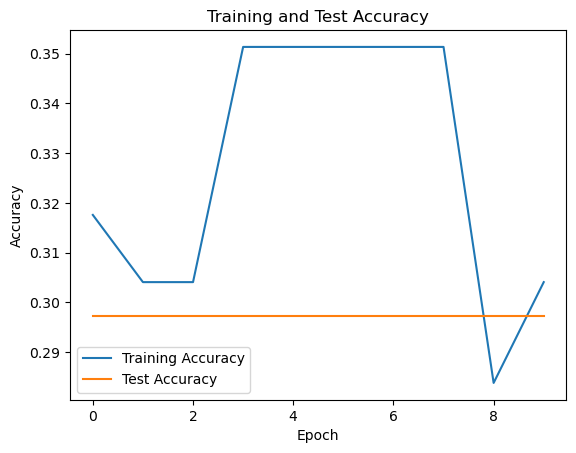

In [27]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 50

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
from keras.callbacks import EarlyStopping
from keras.layers import SpatialDropout1D
# Create a Tokenizer object
from keras.preprocessing.text import Tokenizer 
from keras.models import Sequential  # Import Sequential class
from keras.layers import Embedding, LSTM, Dense  


# Create a Tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(augmented_texts_joined)

# Calculate vocab_size (total number of unique words in your dataset)
vocab_size = len(tokenizer.word_index) + 1  # Add 1 for the padding token (if used)

# Assuming all sequences have the same length after preprocessing
max_sequence_length = labeleddf_cv.shape[1]  # Use the shape of labeleddf_cv to determine the max sequence length

# Define the dimensionality of word embeddings
embedding_dim = 100

# Define the architecture of your deep learning model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=128),
    Dense(units=len(label_encoder.classes_), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model on the training data
history = model.fit(X_train, y_train, epochs=10, batch_size=20, validation_data=(X_test, y_test))

# Evaluate the model on the training data
_, accuracy = model.evaluate(X_train, y_train)
print('Training Accuracy: %.2f%%' % (accuracy * 100))  

# Evaluate the model on the test data
_, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy: %.2f%%' % (test_accuracy * 100))  
import matplotlib.pyplot as plt
# Plot training and test accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()